<a href="https://colab.research.google.com/github/KarnikaSingh/BME/blob/master/PD_Analysis_ogtt.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')


Mounted at /content/gdrive


In [2]:
#Make a model for PPGR prediction using wearable, CGM and clinical features as in mendes-soares et. al

In [3]:
#comment
# We employed several metrics to assess the performance of our models: root-mean-square error (RMSE),
# proportion of predicted values within 5% or 10% of actual glucose values, and Spearman’s rank correlation coefficient (rho) (S2 File).
# Bootstrapping was performed to obtain 95% confidence intervals for each of these metrics [26].
# In addition, we used error grids that are classically used for assessment of blood glucose monitor safety
#  (i.e., surveillance error grid, Parkes error grid) to evaluate the safety of our glucose prediction models [27, 28].
#  Last, we performed several sensitivity analysis in our main study population by stratifying model performance for:
# (1) GMS (i.e., separate results for NGM and prediabetes); (2) day (06.00 to 24.00h) and night (24.00 to 06.00h);
# and (3) low or high glucose variability, defined as the 97.5th percentile of CGM-assessed SD in individuals with NGM (SD > 1.37 mmol/L) [14].

In [4]:
import pandas as pd
import numpy as np
import datetime as dt
import warnings
import matplotlib
from scipy.integrate import trapz
warnings.filterwarnings("ignore")

In [5]:
# ref:
# https://cdn.jamanetwork.com/ama/content_public/journal/jamanetworkopen/937802/zoi180337supp1_prod.pdf?Expires=1707339734&Signature=sgqwTWm9EZzOiYtWMwl0~o9SjRTwPeIF56dBa1X6CsSNPKL0u85bJtbd5XpTyrGCFUlvwfDcRv1gevyiMak5ljPmUMaElssQiqrQoS1n~POeT8yCBrbuQFDS86WlKhu6j8ovljLVCpsqhR8rqNhHgbDVPy8hsDwHTv~sjO66YdOKoEG3bWeZiHdPvfQ416y8QM2g9oy6rsj0UTHtdfqqPZwrmIsW16vIceZ6oy1odruMt0U5AAUn2a3d-cxb9baZgWGo~vXqG7Oq0-MW7mHfMdPpl7jHx~mbjG3H92KuicltMcEE3gGJOCsT9NV75Lb9kYKXdx3woYeXduscGOpUAQ__&Key-Pair-Id=APKAIE5G5CRDK6RD3PGA

In [6]:
 !unzip "/content/gdrive/My Drive/PD Project/Wearables + CGM data.zip"

Archive:  /content/gdrive/My Drive/PD Project/Wearables + CGM data.zip
  inflating: Wearables + CGM data/Meta_data.xlsx  
  inflating: Wearables + CGM data/001/ACC.csv  
  inflating: Wearables + CGM data/001/BVP.csv  
  inflating: Wearables + CGM data/001/Dexcom.csv  
  inflating: Wearables + CGM data/001/EDA.csv  
  inflating: Wearables + CGM data/001/HR.csv  
  inflating: Wearables + CGM data/001/IBI.csv  
  inflating: Wearables + CGM data/001/TEMP.csv  
  inflating: Wearables + CGM data/002/ACC.csv  
  inflating: Wearables + CGM data/002/BVP.csv  
  inflating: Wearables + CGM data/002/Dexcom.csv  
  inflating: Wearables + CGM data/002/EDA.csv  
  inflating: Wearables + CGM data/002/HR.csv  
  inflating: Wearables + CGM data/002/IBI.csv  
  inflating: Wearables + CGM data/002/TEMP.csv  
  inflating: Wearables + CGM data/003/ACC.csv  
  inflating: Wearables + CGM data/003/BVP.csv  
  inflating: Wearables + CGM data/003/Dexcom.csv  
  inflating: Wearables + CGM data/003/EDA.csv  
  inf

In [7]:
 !unzip "/content/gdrive/My Drive/PD Project/Food Logs.zip"

Archive:  /content/gdrive/My Drive/PD Project/Food Logs.zip
  inflating: Food Logs/19-003.xlsx   
  inflating: Food Logs/19-005.xlsx   
  inflating: Food Logs/19-001.xlsx   
  inflating: Food Logs/19-006.xlsx   
  inflating: Food Logs/19-008.xlsx   
  inflating: Food Logs/19-007.xlsx   
  inflating: Food Logs/19-004.xlsx   
  inflating: Food Logs/19-002.xlsx   
  inflating: Food Logs/19-009.xlsx   
  inflating: Food Logs/19-010.xlsx   
  inflating: Food Logs/19-011.xlsx   
  inflating: Food Logs/19-012.xlsx   
  inflating: Food Logs/19-013.xlsx   
  inflating: Food Logs/19-014.xlsx   
  inflating: Food Logs/19-015.xlsx   
  inflating: Food Logs/19-016.xlsx   
  inflating: Food Logs/Food Log/006_foodlog.docx  
  inflating: Food Logs/Food Log/Food log  for 0020 and 0022.pdf  
  inflating: Food Logs/Food Log/FoodDiary_023.docx  
  inflating: Food Logs/Food Log/Food_Log_001.xlsx  
  inflating: Food Logs/Food Log/Food_Log_002.xlsx  
  inflating: Food Logs/Food Log/Food_Log_003.xlsx  
  infl

In [8]:
!unzip "/content/gdrive/My Drive/PD Project/big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0 (2).zip"

Archive:  /content/gdrive/My Drive/PD Project/big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0 (2).zip
  inflating: big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/001/ACC_001.csv  
  inflating: big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/001/BVP_001.csv  
  inflating: big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/001/Dexcom_001.csv  
  inflating: big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/001/EDA_001.csv  
  inflating: big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/001/Food_Log_001.csv  
  inflating: big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/001/HR_001.csv  
  inflating: big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/001/IBI_001.csv  
  inflating: big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/001/TEMP_001.csv  
  inflating: big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/002/ACC_002.csv  

In [9]:
import pandas as pd
import datetime as datetime
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.nonparametric.smoothers_lowess import lowess

def importdexcom(filename):
    """
        Imports data from Dexcom continuous glucose monitor devices
        Args:
            filename (String): path to file
        Returns:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
    """
    data = pd.read_csv(filename)
    df = pd.DataFrame()
    df['Time'] = data['Timestamp (YYYY-MM-DDThh:mm:ss)']
    df['Glucose'] = pd.to_numeric(data['Glucose Value (mg/dL)'])
    df.drop(df.index[:12], inplace=True)
    df['Time'] =  pd.to_datetime(df['Time'], format='%Y-%m-%dT%H:%M:%S')
    df['Day'] = df['Time'].dt.date
    df = df.reset_index()
    return df


def interdaycv(df):
    """
        Computes and returns the interday coefficient of variation of glucose
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
        Returns:
            cvx (float): interday coefficient of variation averaged over all days

    """
    cvx = (np.std(df['Glucose']) / (np.mean(df['Glucose'])))*100
    return cvx

def interdaysd(df):
    """
        Computes and returns the interday standard deviation of glucose
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
        Returns:
            interdaysd (float): interday standard deviation averaged over all days

    """
    interdaysd = np.std(df['Glucose'])
    return interdaysd

def intradaycv(df):
    """
        Computes and returns the intraday coefficient of variation of glucose
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
        Returns:
            intradaycv_mean (float): intraday coefficient of variation averaged over all days
            intradaycv_medan (float): intraday coefficient of variation median over all days
            intradaycv_sd (float): intraday coefficient of variation standard deviation over all days

    """
    intradaycv = []
    for i in pd.unique(df['Day']):
        intradaycv.append(interdaycv(df[df['Day']==i]))

    intradaycv_mean = np.mean(intradaycv)
    intradaycv_median = np.median(intradaycv)
    intradaycv_sd = np.std(intradaycv)

    return intradaycv_mean, intradaycv_median, intradaycv_sd


def intradaysd(df):
    """
        Computes and returns the intraday standard deviation of glucose
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
        Returns:
            intradaysd_mean (float): intraday standard deviation averaged over all days
            intradaysd_medan (float): intraday standard deviation median over all days
            intradaysd_sd (float): intraday standard deviation standard deviation over all days

    """
    intradaysd =[]

    for i in pd.unique(df['Day']):
        intradaysd.append(np.std(df[df['Day']==i]))

    intradaysd_mean = np.mean(intradaysd)
    intradaysd_median = np.median(intradaysd)
    intradaysd_sd = np.std(intradaysd)
    return intradaysd_mean, intradaysd_median, intradaysd_sd

def TIR(df, sd=1, sr=5):
    """
        Computes and returns the time in range
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
            sd (integer): standard deviation for computing range (default=1)
            sr (integer): sampling rate (default=5[minutes, once every 5 minutes glucose is recorded])
        Returns:
            TIR (float): time in range, units=minutes

    """
    up = np.mean(df['Glucose']) + sd*np.std(df['Glucose'])
    dw = np.mean(df['Glucose']) - sd*np.std(df['Glucose'])
    TIR = len(df[(df['Glucose']<= up) & (df['Glucose']>= dw)])*sr
    return TIR

def TOR(df, sd=1, sr=5):
    """
        Computes and returns the time outside range
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
            sd (integer): standard deviation for computing  range (default=1)
            sr (integer): sampling rate (default=5[minutes, once every 5 minutes glucose is recorded])
        Returns:
            TOR (float): time outside range, units=minutes

    """
    up = np.mean(df['Glucose']) + sd*np.std(df['Glucose'])
    dw = np.mean(df['Glucose']) - sd*np.std(df['Glucose'])
    TOR = len(df[(df['Glucose']>= up) | (df['Glucose']<= dw)])*sr
    return TOR

def POR(df, sd=1, sr=5):
    """
        Computes and returns the percent time outside range
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
            sd (integer): standard deviation for computing range (default=1)
            sr (integer): sampling rate (default=5[minutes, once every 5 minutes glucose is recorded])
        Returns:
            POR (float): percent time outside range, units=%

    """
    up = np.mean(df['Glucose']) + sd*np.std(df['Glucose'])
    dw = np.mean(df['Glucose']) - sd*np.std(df['Glucose'])
    TOR = len(df[(df['Glucose']>= up) | (df['Glucose']<= dw)])*sr
    POR = (TOR/(len(df)*sr))*100
    return POR

def PIR(df, sd=1, sr=5):
    """
        Computes and returns the percent time inside range
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
            sd (integer): standard deviation for computing range (default=1)
            sr (integer): sampling rate (default=5[minutes, once every 5 minutes glucose is recorded])
        Returns:
            PIR (float): percent time inside range, units=%

    """
    up = np.mean(df['Glucose']) + sd*np.std(df['Glucose'])
    dw = np.mean(df['Glucose']) - sd*np.std(df['Glucose'])
    TIR = len(df[(df['Glucose']<= up) | (df['Glucose']>= dw)])*sr
    PIR = (TIR/(len(df)*sr))*100
    return PIR

def MGE(df, sd=1):
    """
        Computes and returns the mean of glucose outside specified range
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
            sd (integer): standard deviation for computing range (default=1)
        Returns:
            MGE (float): the mean of glucose excursions (outside specified range)

    """
    up = np.mean(df['Glucose']) + sd*np.std(df['Glucose'])
    dw = np.mean(df['Glucose']) - sd*np.std(df['Glucose'])
    MGE = np.mean(df[(df['Glucose']>= up) | (df['Glucose']<= dw)])
    return MGE

def MGN(df, sd=1):
    """
        Computes and returns the mean of glucose inside specified range
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
            sd (integer): standard deviation for computing range (default=1)
        Returns:
            MGN (float): the mean of glucose excursions (inside specified range)

    """
    up = np.mean(df['Glucose']) + sd*np.std(df['Glucose'])
    dw = np.mean(df['Glucose']) - sd*np.std(df['Glucose'])
    MGN = np.mean(df[(df['Glucose']<= up) & (df['Glucose']>= dw)])
    return MGN

def MAGE(df, std=1):
    """
        Computes and returns the mean amplitude of glucose excursions
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
            sd (integer): standard deviation for computing range (default=1)
        Returns:
            MAGE (float): the mean amplitude of glucose excursions
        Refs:
            Sneh Gajiwala: https://github.com/snehG0205/NCSA_genomics/tree/2bfbb87c9c872b1458ef3597d9fb2e56ac13ad64

    """

        #extracting glucose values and incdices
    glucose = df['Glucose'].tolist()
    ix = [1*i for i in range(len(glucose))]
    stdev = std

    # local minima & maxima
    a = np.diff(np.sign(np.diff(glucose))).nonzero()[0] + 1
    # local min
    valleys = (np.diff(np.sign(np.diff(glucose))) > 0).nonzero()[0] + 1
    # local max
    peaks = (np.diff(np.sign(np.diff(glucose))) < 0).nonzero()[0] + 1
    # +1 -- diff reduces original index number

    #store local minima and maxima -> identify + remove turning points
    excursion_points = pd.DataFrame(columns=['Index', 'Time', 'Glucose', 'Type'])
    k=0
    for i in range(len(peaks)):
        excursion_points.loc[k] = [peaks[i]] + [df['Time'][k]] + [df['Glucose'][k]] + ["P"]
        k+=1

    for i in range(len(valleys)):
        excursion_points.loc[k] = [valleys[i]] + [df['Time'][k]] + [df['Glucose'][k]] + ["V"]
        k+=1

    excursion_points = excursion_points.sort_values(by=['Index'])
    excursion_points = excursion_points.reset_index(drop=True)


    # selecting turning points
    turning_points = pd.DataFrame(columns=['Index', 'Time', 'Glucose', 'Type'])
    k=0
    for i in range(stdev,len(excursion_points.Index)-stdev):
        positions = [i-stdev,i,i+stdev]
        for j in range(0,len(positions)-1):
            if(excursion_points.Type[positions[j]] == excursion_points.Type[positions[j+1]]):
                if(excursion_points.Type[positions[j]]=='P'):
                    if excursion_points.Glucose[positions[j]]>=excursion_points.Glucose[positions[j+1]]:
                        turning_points.loc[k] = excursion_points.loc[positions[j+1]]
                        k+=1
                    else:
                        turning_points.loc[k] = excursion_points.loc[positions[j+1]]
                        k+=1
                else:
                    if excursion_points.Glucose[positions[j]]<=excursion_points.Glucose[positions[j+1]]:
                        turning_points.loc[k] = excursion_points.loc[positions[j]]
                        k+=1
                    else:
                        turning_points.loc[k] = excursion_points.loc[positions[j+1]]
                        k+=1

    if len(turning_points.index)<10:
        turning_points = excursion_points.copy()
        excursion_count = len(excursion_points.index)
    else:
        excursion_count = len(excursion_points.index)/2


    turning_points = turning_points.drop_duplicates(subset= "Index", keep= "first")
    turning_points=turning_points.reset_index(drop=True)
    excursion_points = excursion_points[excursion_points.Index.isin(turning_points.Index) == False]
    excursion_points = excursion_points.reset_index(drop=True)

    # calculating MAGE
    mage = turning_points.Glucose.sum()/excursion_count

    return round(mage,3)


def J_index(df):
    """
        Computes and returns the J-index
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
        Returns:
            J (float): J-index of glucose

    """
    J = 0.001*((np.mean(df['Glucose'])+np.std(df['Glucose']))**2)
    return J

def LBGI_HBGI(df):
    """
        Connecter function to calculate rh and rl, used for ADRR function
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
        Returns:
            LBGI (float): Low blood glucose index
            HBGI (float): High blood glucose index
            rl (float): See calculation of LBGI
            rh (float): See calculation of HBGI

    """
    f = ((np.log(df['Glucose'])**1.084) - 5.381)
    rl = []
    for i in f:
        if (i <= 0):
            rl.append(22.77*(i**2))
        else:
            rl.append(0)

    LBGI = np.mean(rl)

    rh = []
    for i in f:
        if (i > 0):
            rh.append(22.77*(i**2))
        else:
            rh.append(0)

    HBGI = np.mean(rh)

    return LBGI, HBGI, rh, rl



def LBGI(df):
    """
        Computes and returns the low blood glucose index
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
        Returns:
            LBGI (float): Low blood glucose index

    """
    f = ((np.log(df['Glucose'])**1.084) - 5.381)
    rl = []
    for i in f:
        if (i <= 0):
            rl.append(22.77*(i**2))
        else:
            rl.append(0)

    LBGI = np.mean(rl)
    return LBGI

def HBGI(df):
    """
        Computes and returns the high blood glucose index
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
        Returns:
            HBGI (float): High blood glucose index

    """
    f = ((np.log(df['Glucose'])**1.084) - 5.381)
    rh = []
    for i in f:
        if (i > 0):
            rh.append(22.77*(i**2))
        else:
            rh.append(0)

    HBGI = np.mean(rh)
    return HBGI

def ADRR(df):
    """
        Computes and returns the average daily risk range, an assessment of total daily glucose variations within risk space
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
        Returns:
            ADRRx (float): average daily risk range

    """
    ADRRl = []
    for i in pd.unique(df['Day']):
        LBGI, HBGI, rh, rl = LBGI_HBGI(df[df['Day']==i])
        LR = np.max(rl)
        HR = np.max(rh)
        ADRRl.append(LR+HR)

    ADRRx = np.mean(ADRRl)
    return ADRRx

def uniquevalfilter(df, value):
    """
        Supporting function for MODD and CONGA24 functions
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
            value (datetime): time to match up with previous 24 hours
        Returns:
            MODD_n (float): Best matched with unique value, value

    """
    xdf = df[df['Minfrommid'] == value]
    n = len(xdf)
    diff = abs(xdf['Glucose'].diff())
    MODD_n = np.nanmean(diff)
    return MODD_n

def MODD(df):
    """
        Computes and returns the mean of daily differences. Examines mean of value + value 24 hours before
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
        Requires:
            uniquevalfilter (function)
        Returns:
            MODD (float): Mean of daily differences

    """
    df['Timefrommidnight'] =  df['Time'].dt.time
    lists=[]
    for i in range(0, len(df['Timefrommidnight'])):
        lists.append(int(df['Timefrommidnight'][i].strftime('%H:%M:%S')[0:2])*60 + int(df['Timefrommidnight'][i].strftime('%H:%M:%S')[3:5]) + round(int(df['Timefrommidnight'][i].strftime('%H:%M:%S')[6:9])/60))
    df['Minfrommid'] = lists
    df = df.drop(columns=['Timefrommidnight'])

    #Calculation of MODD and CONGA:
    MODD_n = []
    uniquetimes = df['Minfrommid'].unique()

    for i in uniquetimes:
        MODD_n.append(uniquevalfilter(df, i))

    #Remove zeros from dataframe for calculation (in case there are random unique values that result in a mean of 0)
    MODD_n[MODD_n == 0] = np.nan

    MODD = np.nanmean(MODD_n)
    return MODD

def CONGA24(df):
    """
        Computes and returns the continuous overall net glycemic action over 24 hours
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
        Requires:
            uniquevalfilter (function)
        Returns:
            CONGA24 (float): continuous overall net glycemic action over 24 hours

    """
    df['Timefrommidnight'] =  df['Time'].dt.time
    lists=[]
    for i in range(0, len(df['Timefrommidnight'])):
        lists.append(int(df['Timefrommidnight'][i].strftime('%H:%M:%S')[0:2])*60 + int(df['Timefrommidnight'][i].strftime('%H:%M:%S')[3:5]) + round(int(df['Timefrommidnight'][i].strftime('%H:%M:%S')[6:9])/60))
    df['Minfrommid'] = lists
    df = df.drop(columns=['Timefrommidnight'])

    #Calculation of MODD and CONGA:
    MODD_n = []
    uniquetimes = df['Minfrommid'].unique()

    for i in uniquetimes:
        MODD_n.append(uniquevalfilter(df, i))

    #Remove zeros from dataframe for calculation (in case there are random unique values that result in a mean of 0)
    MODD_n[MODD_n == 0] = np.nan

    CONGA24 = np.nanstd(MODD_n)
    return CONGA24

def GMI(df):
    """
        Computes and returns the glucose management index
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
        Returns:
            GMI (float): glucose management index (an estimate of HbA1c)

    """
    GMI = 3.31 + (0.02392*np.mean(df['Glucose']))
    return GMI

def eA1c(df):
    """
        Computes and returns the American Diabetes Association estimated HbA1c
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
        Returns:
            eA1c (float): an estimate of HbA1c from the American Diabetes Association

    """
    eA1c = (46.7 + np.mean(df['Glucose']))/ 28.7
    return eA1c

def summary(df):
    """
        Computes and returns glucose summary metrics
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
        Returns:
            meanG (float): interday mean of glucose
            medianG (float): interday median of glucose
            minG (float): interday minimum of glucose
            maxG (float): interday maximum of glucose
            Q1G (float): interday first quartile of glucose
            Q3G (float): interday third quartile of glucose

    """
    meanG = np.nanmean(df['Glucose'])
    medianG = np.nanmedian(df['Glucose'])
    minG = np.nanmin(df['Glucose'])
    maxG = np.nanmax(df['Glucose'])
    Q1G = np.nanpercentile(df['Glucose'], 25)
    Q3G = np.nanpercentile(df['Glucose'], 75)

    return meanG, medianG, minG, maxG, Q1G, Q3G

def plotglucosesd(df, sd=1, size=15):
    """
        Plots glucose with specified standard deviation lines
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
            sd (integer): standard deviation lines to plot (default=1)
            size (integer): font size for plot (default=15)
        Returns:
            plot of glucose with standard deviation lines

    """
    glucose_mean = np.mean(df['Glucose'])
    up = np.mean(df['Glucose']) + sd*np.std(df['Glucose'])
    dw = np.mean(df['Glucose']) - sd*np.std(df['Glucose'])

    plt.figure(figsize=(20,5))
    plt.rcParams.update({'font.size': size})
    plt.plot(df['Time'], df['Glucose'], '.', color = '#1f77b4')
    plt.axhline(y=glucose_mean, color='red', linestyle='-')
    plt.axhline(y=up, color='pink', linestyle='-')
    plt.axhline(y=dw, color='pink', linestyle='-')
    plt.ylabel('Glucose')
    plt.show()

def plotglucosebounds(df, upperbound = 180, lowerbound = 70, size=15):
    """
        Plots glucose with user-defined boundaries
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
            upperbound (integer): user defined upper bound for glucose line to plot (default=180)
            lowerbound (integer): user defined lower bound for glucose line to plot (default=70)
            size (integer): font size for plot (default=15)
        Returns:
            plot of glucose with user defined boundary lines

    """
    plt.figure(figsize=(20,5))
    plt.rcParams.update({'font.size': size})
    plt.plot(df['Time'], df['Glucose'], '.', color = '#1f77b4')
    plt.axhline(y=upperbound, color='red', linestyle='-')
    plt.axhline(y=lowerbound, color='orange', linestyle='-')
    plt.ylabel('Glucose')
    plt.show()

def plotglucosesmooth(df, size=15):
    """
        Plots smoothed glucose plot (with LOWESS smoothing)
        Args:
            (pd.DataFrame): dataframe of data with DateTime, Time and Glucose columns
            size (integer): font size for plot (default=15)
        Returns:
            LOWESS-smoothed plot of glucose

    """
    filteres = lowess(df['Glucose'], df['Time'], is_sorted=True, frac=0.025, it=0)
    filtered = pd.to_datetime(filteres[:,0], format='%Y-%m-%dT%H:%M:%S')

    plt.figure(figsize=(20,5))
    plt.rcParams.update({'font.size': size})
    plt.plot(df['Time'], df['Glucose'], '.')
    plt.plot(filtered, filteres[:,1], 'r')
    plt.ylabel('Glucose')
    plt.show()

In [10]:
#distribution of Glu before and after OGTT

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.integrate import trapz

def calculate_area_under_curve(dataframe):
    """
    Calculate the area under the curve of a time series.

    Parameters:
    - dataframe: pandas DataFrame with 'time' and 'value' columns

    Returns:
    - area_under_curve_minutes: int, the calculated area under the curve in minutes
    """

    # Convert 'time' column to numerical format
    dataframe['Time'] = pd.to_numeric(dataframe['Time'], errors='coerce')

    # Sort the DataFrame based on the 'time' column
    dataframe = dataframe.sort_values(by='Time')


    # Calculate the area under the curve using trapz
    area_under_curve = trapz(dataframe['Glucose'], x=dataframe['Time'])

    # Convert the result to minutes (as an integer)
    area_under_curve_minutes = int(area_under_curve / (60 * 1e9))


    return area_under_curve_minutes


In [12]:
import pandas as pd
import numpy as np

# # Example DataFrames
# df_a = pd.DataFrame({'a': [1, 3, 5, 7, 9]})
# df_b = pd.DataFrame({'b': [2, 4, 6, 8, 10]})

# Function to find nearest value in df_b's column 'b' for each value in df_a's column 'a'
def find_nearest_value(df_a, df_b, col_a, col_b):
    def nearest_value(a):
        return df_b.iloc[(df_b[col_b] - a).abs().argsort()[:1]][col_b].values[0]

    df_a['nearest_' + col_b] = df_a.apply(lambda row: nearest_value(row[col_a]), axis=1)
    return df_a


In [13]:
#calculate glu metrics including mean for previous day instead

In [14]:
s = '19-001'
GTT = [77,100,105,121]
GTT_times = ['2019-09-25 15:40:00', '2019-09-25 16:16:00', '2019-09-25 16:46:00', '2019-09-25 17:46:00']
GTT_times = pd.to_datetime(GTT_times, format='%Y-%m-%dT%H:%M:%S')
df_gtt_one = pd.DataFrame({'Glucose': GTT, 'Time': GTT_times})
auc_ogtt_one=calculate_area_under_curve(df_gtt_one)
auc_ogtt_one

13041

In [15]:
cgm_one=pd.read_csv('Wearables + CGM data/001/Dexcom.csv')
cgm_one['timestamp_dt']=pd.to_datetime(cgm_one['Timestamp (YYYY-MM-DDThh:mm:ss)'])
cgm_one['Glucose']=cgm_one['Glucose Value (mg/dL)']
cgm_one['Time']=pd.to_datetime(cgm_one['Timestamp (YYYY-MM-DDThh:mm:ss)'])

cgm_one=cgm_one.dropna(subset = ['timestamp_dt'])
cgm_one['date']=cgm_one['timestamp_dt'].dt.date
cgm_one

food_one=pd.read_excel('Food Logs/Food Log/Food_Log_001.xlsx')

food_one.rename(columns={"date": "date_old"},inplace=True)

food_one['date']=pd.to_datetime(food_one['Date']).dt.date

food_one['time_begin']=pd.to_datetime(food_one['time_begin'])
window_dt = pd.Timedelta(minutes=120)

food_one["time_begin_win"] = food_one["time_begin"]  + window_dt

merge_food_cgm_one=pd.merge(cgm_one,food_one,left_on=['date'],right_on=['date'])

cf_one=food_one[food_one['logged_food']=='Standard Breakfast']

merge_food_cgm_one=pd.merge(cgm_one,cf_one,left_on=['date'],right_on=['date'])

window_dt_brkfst = pd.Timedelta(minutes=-30)
food_cgm_one_cf=merge_food_cgm_one[(merge_food_cgm_one['timestamp_dt']<=merge_food_cgm_one['time_begin_win'])&(merge_food_cgm_one['timestamp_dt']>=(merge_food_cgm_one['time_begin']+window_dt_brkfst))]

food_cgm_one_cf['pre_glu_time']=food_cgm_one_cf.groupby('date')['timestamp_dt'].transform('min')

column_names=food_cgm_one_cf.columns.values
food_cgm_one_cf_all_dates = pd.DataFrame(columns=column_names)

for i in food_cgm_one_cf['date'].unique():
  date_sub=food_cgm_one_cf[food_cgm_one_cf['date']==i]

  date_sub = date_sub.sort_values(by='timestamp_dt')
  min_glu=date_sub['Glucose Value (mg/dL)'].iloc[0]
  date_sub['min_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('min_glu')] = min_glu

  final_glu=date_sub['Glucose Value (mg/dL)'].iloc[-1]
  date_sub['final_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('final_glu')] = final_glu

  max_glu=date_sub['Glucose Value (mg/dL)'].max()
  date_sub['max_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('max_glu')] = max_glu

  date_sub['meal_auc'] = calculate_area_under_curve(date_sub)
  date_sub['auc_ogtt_one']=auc_ogtt_one
  j= i - dt.timedelta(days=1)
  cgm_one_ld=cgm_one[cgm_one['date']==j]

  date_sub['mean_glu_ld']=cgm_one_ld.groupby('date')['Glucose'].transform('mean').iloc[0]
  date_sub['interdaycv']=interdaycv(cgm_one_ld)
  date_sub['interdaysd']=interdaysd(cgm_one_ld)
  date_sub['TIR']=TIR(cgm_one_ld, sd=1, sr=5)
  date_sub['TOR']=TOR(cgm_one_ld, sd=1, sr=5)
  date_sub['POR']=POR(cgm_one_ld, sd=1, sr=5)
  date_sub['PIR']=PIR(cgm_one_ld, sd=1, sr=5)
  date_sub['MGE']=MGE(cgm_one_ld, sd=1)
  date_sub['MGN']=MGN(cgm_one_ld, sd=1)
  #MAGE(cgm_one, std=1)
  date_sub['J_index']=J_index(cgm_one_ld)
  date_sub['LBGI']=LBGI(cgm_one_ld)
  date_sub['HBGI']=HBGI(cgm_one_ld)
  #MODD(cgm_one)
  #CONGA24(cgm_one)
  date_sub['']=GMI(date_sub)

  food_cgm_one_cf_all_dates=food_cgm_one_cf_all_dates.append(date_sub)

one_ogtt=food_cgm_one_cf_all_dates

one_ogtt_dup=one_ogtt.drop_duplicates(subset=['date'], keep='first')
one_ogtt_dup['id']=1
one_ogtt_dup['a1c']="norm"



# #load acc
# acc_one=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/001/ACC_001.csv')
# acc_one['datetime']=pd.to_datetime(acc_one['datetime'])
# acc_one['date_only']=acc_one['datetime'].dt.date
# acc_one['acc']=(((acc_one[' acc_x'])**2 + (acc_one[' acc_y'])**2 + (acc_one[' acc_z'])**2)**0.5)
# acc_one['sum_acc_per_day']=acc_one.groupby('date_only')['acc'].transform('sum')

# column_names_acc=acc_one.columns.values
# acc_one_dates = pd.DataFrame(columns=column_names_acc)

# #load eda
# eda_one=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/001/EDA_001.csv')
# eda_one['datetime']=pd.to_datetime(eda_one['datetime'])
# eda_one['date_only']=eda_one['datetime'].dt.date
# eda_one['max_eda_per_day']=eda_one.groupby('date_only')[' eda'].transform('max')

# column_names_eda=eda_one.columns.values
# eda_one_dates = pd.DataFrame(columns=column_names_eda)

# #load hr
# hr_one=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/001/HR_001.csv')
# hr_one['datetime']=pd.to_datetime(hr_one['datetime'])
# hr_one['date_only']=hr_one['datetime'].dt.date
# hr_one['mean_hr_per_day']=hr_one.groupby('datetime')[' hr'].transform('mean')

# column_names_hr=hr_one.columns.values
# hr_one_dates = pd.DataFrame(columns=column_names_hr)

# #load temp
# temp_one=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/001/TEMP_001.csv')
# temp_one['datetime']=pd.to_datetime(temp_one['datetime'])
# temp_one['date_only']=temp_one['datetime'].dt.date
# temp_one['mean_temp_per_day']=temp_one.groupby('datetime')[' temp'].transform('mean')

# column_names_temp=temp_one.columns.values
# temp_one_dates = pd.DataFrame(columns=column_names_temp)

# def replace_month_with_number(timestamp):
#     # Replace the month with 99
#     new_timestamp = timestamp.replace(month=2)
#     return new_timestamp

# # Apply the function to the 'timestamp' column
# hr_one['date_only'] = hr_one['date_only'].apply(replace_month_with_number)
# hr_one['datetime'] = hr_one['datetime'].apply(replace_month_with_number)

# for i in one_ogtt_dup['date'].unique():
#   date_sub=acc_one[acc_one['date_only']==i]
#   #sum_acc_prev_day=date_sub['sum_acc_per_day']
#   j= i - dt.timedelta(days=1)
#   date_sub_ld=acc_one[acc_one['date_only']==j]
#   date_sub_ld['date_ogtt']=i
#   date_sub_ld['sum_acc_before_food']=0
#   date_sub_ld['sum_acc_ogtt_day']=0
#   date_sub_ld_dup=date_sub_ld.drop_duplicates(subset=['date_only'], keep='first')

#   ogtt_acc=acc_one[acc_one['date_only']==i]
#   ogtt_day=one_ogtt_dup[one_ogtt_dup['date']==i]
#   time_values = ogtt_day['time_begin_win'].values
#   acc_time=ogtt_acc[ogtt_acc['datetime'].lt(time_values.max())]

#   if len(acc_time)>0:
#     sum_acc_ogtt_day=ogtt_acc.groupby('date_only')['acc'].transform('sum').iloc[0]
#     time_start = ogtt_day['pre_glu_time'].values
#     acc_time_start=ogtt_acc[ogtt_acc['datetime'].lt(time_start.max())]
#     sum_acc_before_food=acc_time_start.groupby('date_only')['acc'].transform('sum').iloc[0]
#     date_sub_ld_dup['sum_acc_before_food']=sum_acc_before_food
#     date_sub_ld_dup['sum_acc_ogtt_day']=sum_acc_ogtt_day
#     #date_sub_ld_dup['sum_acc_prev_day']=sum_acc_prev_day

#   acc_one_dates=acc_one_dates.append(date_sub_ld_dup)
#   #acc end

# #eda start
#   date_eda=eda_one[eda_one['date_only']==i]
#   date_eda_ld=eda_one[eda_one['date_only']==j]
#   date_eda_ld['date_ogtt']=i

#   date_eda_ld['mean_eda_before_food']=0
#   date_eda_ld['mean_eda_ogtt_day']=0
#   date_eda_ld_dup=date_eda_ld.drop_duplicates(subset=['date_only'], keep='first')

#   ogtt_eda=eda_one[eda_one['date_only']==i]
#   ogtt_day=one_ogtt_dup[one_ogtt_dup['date']==i]
#   time_values = ogtt_day['time_begin_win'].values
#   eda_time=ogtt_eda[ogtt_eda['datetime'].lt(time_values.max())]

#   if len(eda_time)>0:
#     mean_eda_ogtt_day=eda_time.groupby('date_only')[' eda'].transform('mean').iloc[0]
#     time_start = ogtt_day['pre_glu_time'].values
#     eda_time_start=ogtt_eda[ogtt_eda['datetime'].lt(time_start.max())]
#     mean_eda_before_food=eda_time_start.groupby('date_only')[' eda'].transform('mean').iloc[0]
#     date_eda_ld_dup['mean_eda_before_food']=mean_eda_before_food
#     date_eda_ld_dup['mean_eda_ogtt_day']=mean_eda_ogtt_day

#   eda_one_dates=eda_one_dates.append(date_eda_ld_dup)
# #eda end

# #hr start
#   date_hr=hr_one[hr_one['date_only']==i]
#   date_hr_ld=hr_one[hr_one['date_only']==j]
#   date_hr_ld['date_ogtt']=i
#   date_hr_ld['mean_hr_before_food']=0
#   date_hr_ld['mean_hr_ogtt_day']=0
#   date_hr_ld_dup=date_hr_ld.drop_duplicates(subset=['date_only'], keep='first')

#   ogtt_hr=hr_one[hr_one['date_only']==i]
#   ogtt_day=one_ogtt_dup[one_ogtt_dup['date']==i]
#   time_values = ogtt_day['time_begin_win'].values
#   hr_time=ogtt_hr[ogtt_hr['datetime'].lt(time_values.max())]

#   if len(hr_time)>0:
#     mean_hr_ogtt_day=hr_time.groupby('date_only')[' hr'].transform('mean').iloc[0]
#     time_start = ogtt_day['pre_glu_time'].values
#     hr_time_start=ogtt_hr[ogtt_hr['datetime'].lt(time_start.max())]
#     mean_hr_before_food=hr_time_start.groupby('date_only')[' hr'].transform('mean').iloc[0]
#     date_hr_ld_dup['mean_hr_before_food']=mean_hr_before_food
#     date_hr_ld_dup['mean_hr_ogtt_day']=mean_hr_ogtt_day

#   hr_one_dates=hr_one_dates.append(date_hr_ld_dup)
#   #hr end

#   #temp start
#   date_temp=temp_one[temp_one['date_only']==i]
#   date_temp_ld=temp_one[temp_one['date_only']==j]
#   date_temp_ld['date_ogtt']=i

#   date_temp_ld['mean_temp_before_food']=0
#   date_temp_ld['mean_temp_ogtt_day']=0
#   date_temp_ld_dup=date_temp_ld.drop_duplicates(subset=['date_only'], keep='first')

#   ogtt_temp=temp_one[temp_one['date_only']==i]
#   ogtt_day=one_ogtt_dup[one_ogtt_dup['date']==i]
#   time_values = ogtt_day['time_begin_win'].values
#   temp_time=ogtt_temp[ogtt_temp['datetime'].lt(time_values.max())]

#   if len(temp_time)>0:
#     mean_temp_ogtt_day=temp_time.groupby('date_only')[' temp'].transform('mean').iloc[0]
#     time_start = ogtt_day['pre_glu_time'].values
#     temp_time_start=ogtt_temp[ogtt_temp['datetime'].lt(time_start.max())]
#     mean_temp_before_food=temp_time_start.groupby('date_only')[' temp'].transform('mean').iloc[0]
#     date_temp_ld_dup['mean_temp_before_food']=mean_temp_before_food
#     date_temp_ld_dup['mean_temp_ogtt_day']=mean_temp_ogtt_day

#   temp_one_dates=temp_one_dates.append(date_temp_ld_dup)

# acc_one_dates_dup=acc_one_dates.drop_duplicates(subset=['date_only'], keep='first')
# eda_one_dates_dup=eda_one_dates.drop_duplicates(subset=['date_only'], keep='first')

# temp_one_dates=temp_one_dates.drop_duplicates(subset=['date_only'], keep='first')
# hr_one_dates=hr_one_dates.drop_duplicates(subset=['date_only'], keep='first')

# merge_cgm_acc_one=pd.merge(one_ogtt_dup,acc_one_dates_dup,left_on=['date'],right_on=['date_ogtt'])

# merge_hr_one=pd.merge(merge_cgm_acc_one,hr_one_dates,left_on=['date_ogtt'],right_on=['date_ogtt'])
# merge_temp_one=pd.merge(merge_hr_one,temp_one_dates,left_on=['date_ogtt'],right_on=['date_ogtt'])
# merge_one=pd.merge(merge_temp_one,eda_one_dates_dup,left_on=['date_ogtt'],right_on=['date_ogtt'])


# merge_sub_one=merge_one[['date_ogtt','sum_acc_per_day','sum_acc_before_food','sum_acc_ogtt_day','max_eda_per_day','mean_hr_per_day','mean_hr_before_food','mean_hr_ogtt_day','mean_temp_per_day','mean_temp_before_food','mean_temp_ogtt_day','TIR','TOR','a1c','max_glu','min_glu','meal_auc','auc_ogtt_one','mean_glu_ld']]
# merge_sub_one


In [16]:
#merge_sub_one.rename(columns={'auc_ogtt_one': 'auc_ogtt'}, inplace=True)

In [17]:
# print(food_one[food_one['logged_food']=='Standard Breakfast'])
# food_one[food_one['logged_food']=='Boost']

In [18]:
# food_one.logged_food.unique()

In [19]:
window_dt = pd.Timedelta(minutes=150)
boost_time=dt.datetime(2019,9,25,15,10,0)
#'2019-09-25 15:40:00'
#2019-09-25 15:40:00

boost_cgm_one=cgm_one[(cgm_one['timestamp_dt']>=boost_time)&(cgm_one['timestamp_dt']<=boost_time + window_dt)]
boost_cgm_one.head(4)
#food_thirteen["time_begin_win"] = food_thirteen["time_begin"] + window_dt

#cgm_thirteen[cgm_thirteen['timestamp_dt']>=dt.datetime(2020,6,4,9,30,0)]

,Index,Timestamp (YYYY-MM-DDThh:mm:ss),Event Type,Event Subtype,Patient Info,Device Info,Source Device ID,Glucose Value (mg/dL),Insulin Value (u),Carb Value (grams),Duration (hh:mm:ss),Glucose Rate of Change (mg/dL/min),Transmitter Time (Long Integer),Transmitter ID,timestamp_dt,Glucose,Time,date
2540,2541,2019-09-25T15:13:23,EGV,NaN,NaN,NaN,iPhone G6,93.0,NaN,NaN,NaN,NaN,780894.0,81B9XE,2019-09-25 15:13:23,93.0,2019-09-25 15:13:23,2019-09-25
2541,2542,2019-09-25T15:18:23,EGV,NaN,NaN,NaN,iPhone G6,95.0,NaN,NaN,NaN,NaN,781194.0,81B9XE,2019-09-25 15:18:23,95.0,2019-09-25 15:18:23,2019-09-25
2542,2543,2019-09-25T15:23:23,EGV,NaN,NaN,NaN,iPhone G6,95.0,NaN,NaN,NaN,NaN,781494.0,81B9XE,2019-09-25 15:23:23,95.0,2019-09-25 15:23:23,2019-09-25
2543,2544,2019-09-25T15:28:22,EGV,NaN,NaN,NaN,iPhone G6,94.0,NaN,NaN,NaN,NaN,781794.0,81B9XE,2019-09-25 15:28:22,94.0,2019-09-25 15:28:22,2019-09-25


In [20]:
def replace_month_with_number(timestamp):
    new_timestamp = timestamp.replace(month=2)
    return new_timestamp

In [21]:
window_dt_brkfst = pd.Timedelta(minutes=-30)
one_ogtt['TimeDiff'] = (one_ogtt['timestamp_dt'] - (one_ogtt['time_begin']+window_dt_brkfst)).dt.total_seconds()/ 60


# Group by and use cumcount
one_ogtt['SequentialTimeValues'] = one_ogtt.groupby('date').cumcount() + 1

df_gtt_one['Time']=pd.to_datetime(df_gtt_one['Time'])

#df_gtt_one['TimeDiff'] = (df_gtt_one['Time'] - df_gtt_one['Time'].min()).dt.total_seconds()/ 60
df_gtt_one['TimeDiff'] = (df_gtt_one['Time'] - boost_time).dt.total_seconds()/ 60

boost_cgm_one['TimeDiff'] = (boost_cgm_one['timestamp_dt'] - boost_time).dt.total_seconds()/ 60


In [22]:
one_ogtt['TimeDiff_Round']=one_ogtt['TimeDiff'].round()
df_gtt_one['TimeDiff_Round']=df_gtt_one['TimeDiff'].round()
boost_cgm_one['TimeDiff_Round']=boost_cgm_one['TimeDiff'].round()

In [23]:
one_ogtt['timestamp_dt'] - (one_ogtt['time_begin']+window_dt_brkfst)

80    0 days 00:03:31
81    0 days 00:08:32
82    0 days 00:13:32
83    0 days 00:18:32
84    0 days 00:23:32
            ...      
973   0 days 02:08:24
974   0 days 02:13:24
975   0 days 02:18:24
976   0 days 02:23:24
977   0 days 02:28:24
Length: 120, dtype: timedelta64[ns]

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

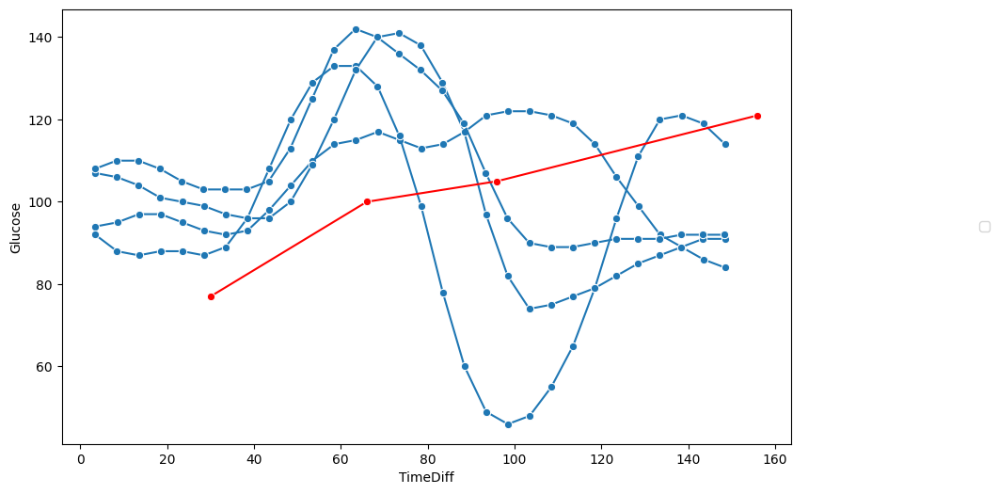

In [24]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=one_ogtt, y="Glucose", x="TimeDiff",palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_one, y="Glucose", x="TimeDiff", marker='o',color='red')

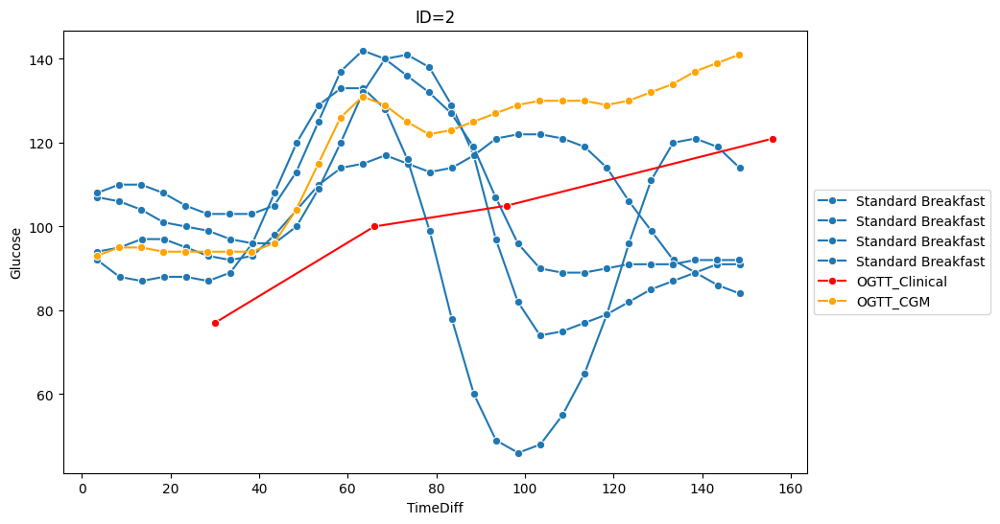

In [25]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=one_ogtt, y="Glucose", x="TimeDiff",palette='bright',units='date',estimator=None, marker='o').set(title='ID=2')
sns.lineplot(data=df_gtt_one, y="Glucose", x="TimeDiff", marker='o',color='red',estimator=None)
sns.lineplot(data=boost_cgm_one, y="Glucose", x="TimeDiff", marker='o',color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

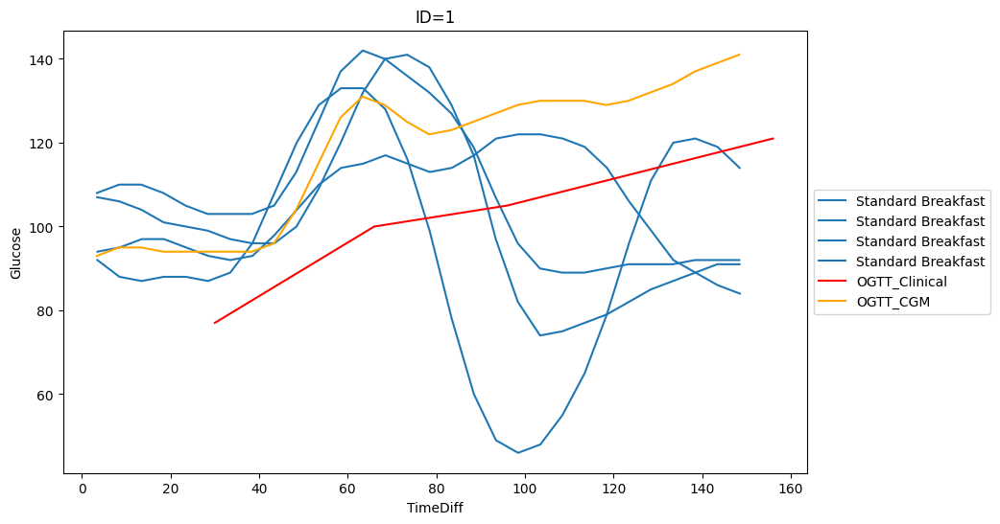

In [26]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=one_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=1')
sns.lineplot(data=df_gtt_one, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_one, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

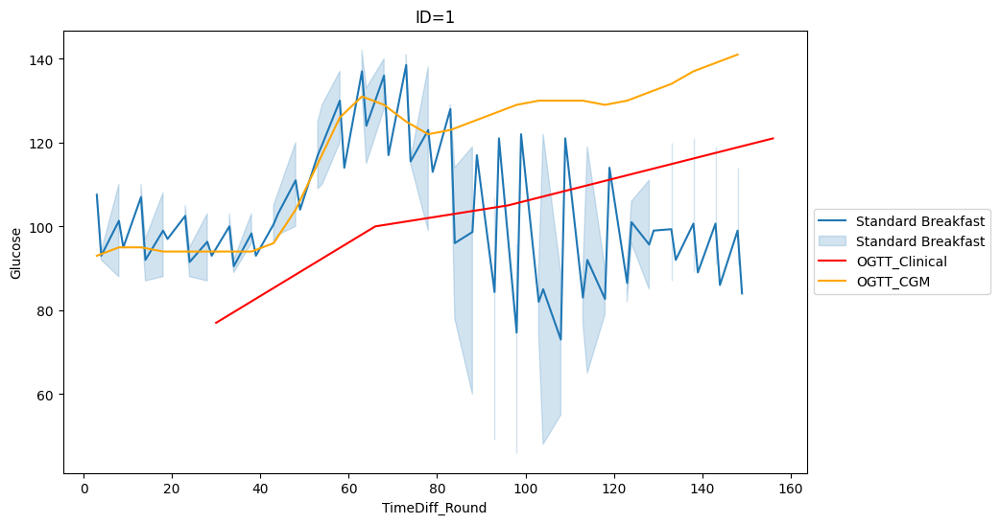

In [27]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=one_ogtt, y="Glucose", x="TimeDiff_Round")
sns.lineplot(data=df_gtt_one, y="Glucose", x="TimeDiff_Round", color='red',estimator=None).set(title='ID=1')
sns.lineplot(data=boost_cgm_one, y="Glucose", x="TimeDiff_Round", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

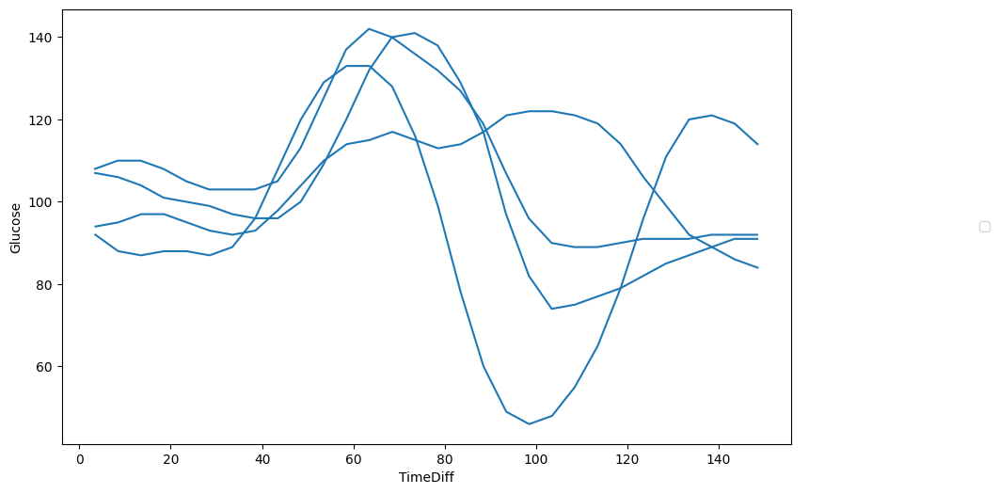

In [28]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=one_ogtt, y="Glucose", x="TimeDiff",units='date')

In [29]:
# Append dataframes
boost_cgm_one.head()
boost_cgm_one[['TimeDiff','Glucose','timestamp_dt']]
df_gtt_one.head()
df_gtt_one[['TimeDiff','Glucose','Time']]
one_ogtt.head(3)
one_ogtt[['TimeDiff','Glucose','timestamp_dt']]

,TimeDiff,Glucose,timestamp_dt
80,3.516667,94.0,2019-09-17 06:43:31
81,8.533333,95.0,2019-09-17 06:48:32
82,13.533333,97.0,2019-09-17 06:53:32
83,18.533333,97.0,2019-09-17 06:58:32
84,23.533333,95.0,2019-09-17 07:03:32
...,...,...,...
973,128.400000,91.0,2019-09-24 09:08:24
974,133.400000,91.0,2019-09-24 09:13:24
975,138.400000,92.0,2019-09-24 09:18:24
976,143.400000,92.0,2019-09-24 09:23:24


In [30]:
boost_sub=boost_cgm_one[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_one[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
ogtt_sub=one_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
boost_sub['id']=1
gtt_sub['id']=1
ogtt_sub['id']=1

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

food_responses=ogtt_sub.append(gtt_sub)
food_responses=food_responses.append(boost_sub)
food_responses

,TimeDiff,Glucose,Time,date,id,type
80,3.516667,94.0,2019-09-17 06:43:31,2019-09-17,1,standard_meal
81,8.533333,95.0,2019-09-17 06:48:32,2019-09-17,1,standard_meal
82,13.533333,97.0,2019-09-17 06:53:32,2019-09-17,1,standard_meal
83,18.533333,97.0,2019-09-17 06:58:32,2019-09-17,1,standard_meal
84,23.533333,95.0,2019-09-17 07:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2565,128.366667,132.0,2019-09-25 17:18:22,2019-09-25,1,boost_cgm
2566,133.383333,134.0,2019-09-25 17:23:23,2019-09-25,1,boost_cgm
2567,138.383333,137.0,2019-09-25 17:28:23,2019-09-25,1,boost_cgm
2568,143.383333,139.0,2019-09-25 17:33:23,2019-09-25,1,boost_cgm


[Text(0.5, 1.0, 'ID=1')]

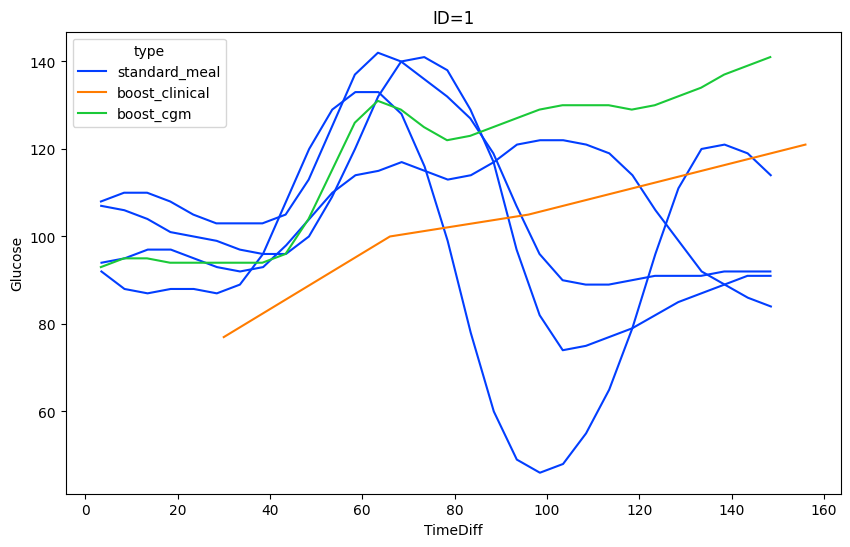

In [31]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=food_responses, y="Glucose", x="TimeDiff", hue='type',palette='bright',units='date',estimator=None).set(title='ID=1')
# sns.lineplot(data=df_gtt_one, y="Glucose", x="TimeDiff", color='red',estimator=None)
# sns.lineplot(data=boost_cgm_one, y="Glucose", x="TimeDiff", color='orange')
# plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [32]:
#For grouped

In [33]:
max_times=one_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
one_ogtt.groupby('date')['TimeDiff_Round'].nunique()

date
2019-09-17    30
2019-09-19    30
2019-09-21    30
2019-09-24    30
Name: TimeDiff_Round, dtype: int64

In [34]:
max_times=one_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
one_ogtt.groupby('date')['TimeDiff_Round'].nunique()

dates=one_ogtt['date'].unique()
df_first_date=one_ogtt[one_ogtt['date']==dates[0]]

# one_ogtt_test=one_ogtt

column_names = one_ogtt.columns.tolist()

# Create an empty DataFrame with the same columns
df_ppgr_grouped_one = pd.DataFrame(columns=column_names)

for i in dates:
  df_date=one_ogtt[one_ogtt['date']==i]
  print(i)
  # df_date['nearest_time'] = df_first_date['TimeDiff'].apply(find_nearest_value)
  result_df = find_nearest_value(df_date, df_first_date, 'TimeDiff_Round', 'TimeDiff_Round')
  df_ppgr_grouped_one=df_ppgr_grouped_one.append(result_df)


2019-09-17
2019-09-19
2019-09-21
2019-09-24


In [35]:
# For grouped
boost_sub=boost_cgm_one[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_one[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
# ogtt_sub=one_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
ogtt_sub=df_ppgr_grouped_one[['nearest_TimeDiff_Round','Glucose','timestamp_dt','date']]
boost_sub['id']=1
gtt_sub['id']=1
ogtt_sub['id']=1

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

ogtt_sub.rename(columns={"nearest_TimeDiff_Round": "nearest_time_diff"},inplace=True)
boost_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)
gtt_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)

column_names_grouped = ogtt_sub.columns.tolist()

# Create an empty DataFrame with the same columns
food_responses_grouped = pd.DataFrame(columns=column_names_grouped)

food_responses_grouped=food_responses_grouped.append([ogtt_sub,gtt_sub,boost_sub])
food_responses_grouped


,nearest_time_diff,Glucose,Time,date,id,type
80,4.000000,94.0,2019-09-17 06:43:31,2019-09-17,1,standard_meal
81,9.000000,95.0,2019-09-17 06:48:32,2019-09-17,1,standard_meal
82,14.000000,97.0,2019-09-17 06:53:32,2019-09-17,1,standard_meal
83,19.000000,97.0,2019-09-17 06:58:32,2019-09-17,1,standard_meal
84,24.000000,95.0,2019-09-17 07:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2565,128.366667,132.0,2019-09-25 17:18:22,2019-09-25,1,boost_cgm
2566,133.383333,134.0,2019-09-25 17:23:23,2019-09-25,1,boost_cgm
2567,138.383333,137.0,2019-09-25 17:28:23,2019-09-25,1,boost_cgm
2568,143.383333,139.0,2019-09-25 17:33:23,2019-09-25,1,boost_cgm


[Text(0.5, 1.0, 'ID=1')]

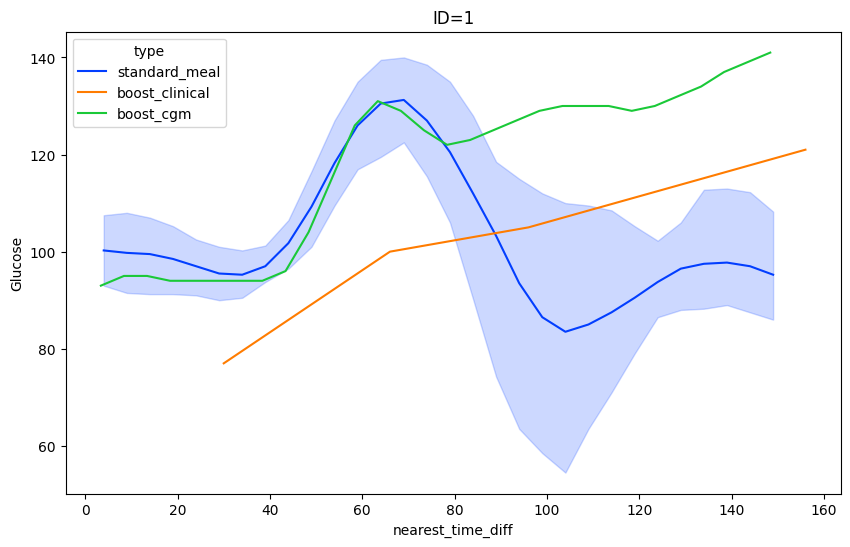

In [36]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=food_responses_grouped, y="Glucose", x="nearest_time_diff", hue='type',palette='bright').set(title='ID=1')
# sns.lineplot(data=df_gtt_one, y="Glucose", x="TimeDiff", color='red',estimator=None)
# sns.lineplot(data=boost_cgm_one, y="Glucose", x="TimeDiff", color='orange')
# plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=ogtt_sub, y="Glucose", x="nearest_time_diff")
sns.lineplot(data=boost_sub, y="Glucose", x="nearest_time_diff", color='red',estimator=None).set(title='ID=1')
sns.lineplot(data=gtt_sub, y="Glucose", x="nearest_time_diff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [37]:
s = '19-002'

GTT = [95,136,131,120]
GTT_times = ['2019-10-02 8:10:00', '2019-10-02 8:41:00', '2019-10-02 9:11:00', '2019-10-02 10:11:00']
GTT_times = pd.to_datetime(GTT_times, format='%Y-%m-%dT%H:%M:%S')
df_gtt_two = pd.DataFrame({'Glucose': GTT, 'Time': GTT_times})
auc_ogtt_two=calculate_area_under_curve(df_gtt_two)
auc_ogtt_two

15115

In [38]:
cgm_two=pd.read_csv('Wearables + CGM data/002/Dexcom.csv')
cgm_two['timestamp_dt']=pd.to_datetime(cgm_two['Timestamp (YYYY-MM-DDThh:mm:ss)'])
cgm_two['Glucose']=cgm_two['Glucose Value (mg/dL)']
cgm_two['Time']=pd.to_datetime(cgm_two['Timestamp (YYYY-MM-DDThh:mm:ss)'])

cgm_two=cgm_two.dropna(subset = ['timestamp_dt'])
cgm_two['date']=cgm_two['timestamp_dt'].dt.date
cgm_two

# food_two=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/002/Food_Log_002.csv')

# food_two['date']=pd.to_datetime(food_two['date']).dt.date

food_two=pd.read_excel('Food Logs/Food Log/Food_Log_002.xlsx')

# food_two.rename(columns={"date": "date_old"},inplace=True)

food_two['date']=pd.to_datetime(food_two['date']).dt.date

food_two.rename(columns={"time_begin": "time_begin_actual"},inplace=True)
food_two['time_begin']=pd.to_datetime(food_two['date'].astype(str) + ' ' + food_two['time_begin_actual'].astype(str))

# food_two['time_begin']=pd.to_datetime(food_two['time_begin'])
window_dt = pd.Timedelta(minutes=120)

food_two["time_begin_win"] = food_two["time_begin"]  + window_dt

merge_food_cgm_two=pd.merge(cgm_two,food_two,left_on=['date'],right_on=['date'])

cf_two=food_two[food_two['logged_food']=='Corn Flakes']

merge_food_cgm_two=pd.merge(cgm_two,cf_two,left_on=['date'],right_on=['date'])
window_dt_brkfst = pd.Timedelta(minutes=-30)

food_cgm_two_cf=merge_food_cgm_two[(merge_food_cgm_two['timestamp_dt']<=merge_food_cgm_two['time_begin_win'])&(merge_food_cgm_two['timestamp_dt']>=(merge_food_cgm_two['time_begin']+window_dt_brkfst))]

food_cgm_two_cf['pre_glu_time']=food_cgm_two_cf.groupby('date')['timestamp_dt'].transform('min')

column_names=food_cgm_two_cf.columns.values
food_cgm_two_cf_all_dates = pd.DataFrame(columns=column_names)

for i in food_cgm_two_cf['date'].unique():
  date_sub=food_cgm_two_cf[food_cgm_two_cf['date']==i]

  date_sub = date_sub.sort_values(by='timestamp_dt')
  min_glu=date_sub['Glucose Value (mg/dL)'].iloc[0]
  date_sub['min_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('min_glu')] = min_glu

  final_glu=date_sub['Glucose Value (mg/dL)'].iloc[-1]
  date_sub['final_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('final_glu')] = final_glu

  max_glu=date_sub['Glucose Value (mg/dL)'].max()
  date_sub['max_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('max_glu')] = max_glu

  date_sub['meal_auc'] = calculate_area_under_curve(date_sub)
  date_sub['auc_ogtt_two']=auc_ogtt_two
  j= i - dt.timedelta(days=1)
  cgm_two_ld=cgm_two[cgm_two['date']==j]

  date_sub['mean_glu_ld']=cgm_two_ld.groupby('date')['Glucose'].transform('mean').iloc[0]
  date_sub['interdaycv']=interdaycv(cgm_two_ld)
  date_sub['interdaysd']=interdaysd(cgm_two_ld)
  date_sub['TIR']=TIR(cgm_two_ld, sd=1, sr=5)
  date_sub['TOR']=TOR(cgm_two_ld, sd=1, sr=5)
  date_sub['POR']=POR(cgm_two_ld, sd=1, sr=5)
  date_sub['PIR']=PIR(cgm_two_ld, sd=1, sr=5)
  date_sub['MGE']=MGE(cgm_two_ld, sd=1)
  date_sub['MGN']=MGN(cgm_two_ld, sd=1)
  #MAGE(cgm_two, std=1)
  date_sub['J_index']=J_index(cgm_two_ld)
  date_sub['LBGI']=LBGI(cgm_two_ld)
  date_sub['HBGI']=HBGI(cgm_two_ld)
  #MODD(cgm_two)
  #CONGA24(cgm_two)
  date_sub['GMI']=GMI(date_sub)

  food_cgm_two_cf_all_dates=food_cgm_two_cf_all_dates.append(date_sub)

two_ogtt=food_cgm_two_cf_all_dates

two_ogtt_dup=two_ogtt.drop_duplicates(subset=['date'], keep='first')
two_ogtt_dup['id']=2
two_ogtt_dup['a1c']="norm"



In [39]:
# merge_sub_two.rename(columns={'auc_ogtt_two': 'auc_ogtt'}, inplace=True)

In [40]:
# merge_sub_two

In [41]:
# print(food_two[food_two['logged_food']=='Cornflakes'])
# food_two[food_two['logged_food']=='Boost']

In [42]:
window_dt = pd.Timedelta(minutes=150)
boost_time=dt.datetime(2019,10,2,7,40,0)
#'2019-10-02 8:10:00'
#2019-10-02 8:10:00

boost_cgm_two=cgm_two[(cgm_two['timestamp_dt']>=boost_time)&(cgm_two['timestamp_dt']<=boost_time + window_dt)]
boost_cgm_two.head(4)
#food_thirteen["time_begin_win"] = food_thirteen["time_begin"] + window_dt

#cgm_thirteen[cgm_thirteen['timestamp_dt']>=dt.datetime(2020,6,4,9,30,0)]

,Index,Timestamp (YYYY-MM-DDThh:mm:ss),Event Type,Event Subtype,Patient Info,Device Info,Source Device ID,Glucose Value (mg/dL),Insulin Value (u),Carb Value (grams),Duration (hh:mm:ss),Glucose Rate of Change (mg/dL/min),Transmitter Time (Long Integer),Transmitter ID,timestamp_dt,Glucose,Time,date
2107,2108,2019-10-02T07:43:26,EGV,NaN,NaN,NaN,Android G6,128.0,NaN,NaN,NaN,NaN,688786.0,81C4KD,2019-10-02 07:43:26,128.0,2019-10-02 07:43:26,2019-10-02
2108,2109,2019-10-02T07:48:26,EGV,NaN,NaN,NaN,Android G6,125.0,NaN,NaN,NaN,NaN,689086.0,81C4KD,2019-10-02 07:48:26,125.0,2019-10-02 07:48:26,2019-10-02
2109,2110,2019-10-02T07:53:25,EGV,NaN,NaN,NaN,Android G6,120.0,NaN,NaN,NaN,NaN,689386.0,81C4KD,2019-10-02 07:53:25,120.0,2019-10-02 07:53:25,2019-10-02
2110,2111,2019-10-02T07:58:26,EGV,NaN,NaN,NaN,Android G6,117.0,NaN,NaN,NaN,NaN,689686.0,81C4KD,2019-10-02 07:58:26,117.0,2019-10-02 07:58:26,2019-10-02


In [43]:
# two_ogtt['TimeDiff'] = (two_ogtt['timestamp_dt'] - two_ogtt['time_begin']).dt.total_seconds()/ 60

two_ogtt['TimeDiff'] = (two_ogtt['timestamp_dt'] - (merge_food_cgm_two['time_begin']+window_dt_brkfst)).dt.total_seconds()/ 60

# Group by and use cumcount
two_ogtt['SequentialTimeValues'] = two_ogtt.groupby('date').cumcount() + 1

df_gtt_two['Time']=pd.to_datetime(df_gtt_two['Time'])

# df_gtt_two['TimeDiff'] = (df_gtt_two['Time'] - df_gtt_two['Time'].min()).dt.total_seconds()/ 60
df_gtt_two['TimeDiff'] = (df_gtt_two['Time'] - boost_time).dt.total_seconds()/ 60

boost_cgm_two['TimeDiff'] = (boost_cgm_two['timestamp_dt'] - boost_time).dt.total_seconds()/ 60


In [44]:
two_ogtt['TimeDiff_Round']=two_ogtt['TimeDiff'].round()
df_gtt_two['TimeDiff_Round']=df_gtt_two['TimeDiff'].round()
boost_cgm_two['TimeDiff_Round']=boost_cgm_two['TimeDiff'].round()

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

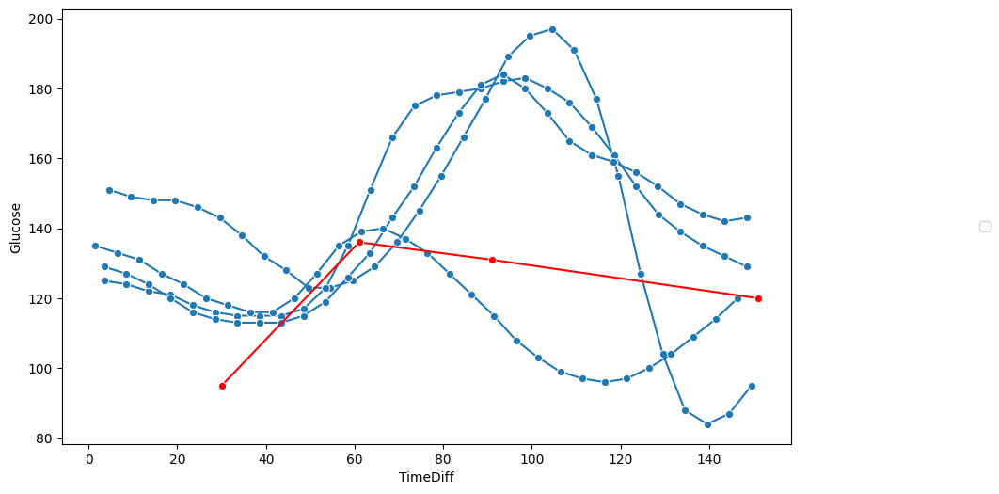

In [45]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=two_ogtt, y="Glucose", x="TimeDiff",palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_two, y="Glucose", x="TimeDiff", marker='o',color='red')

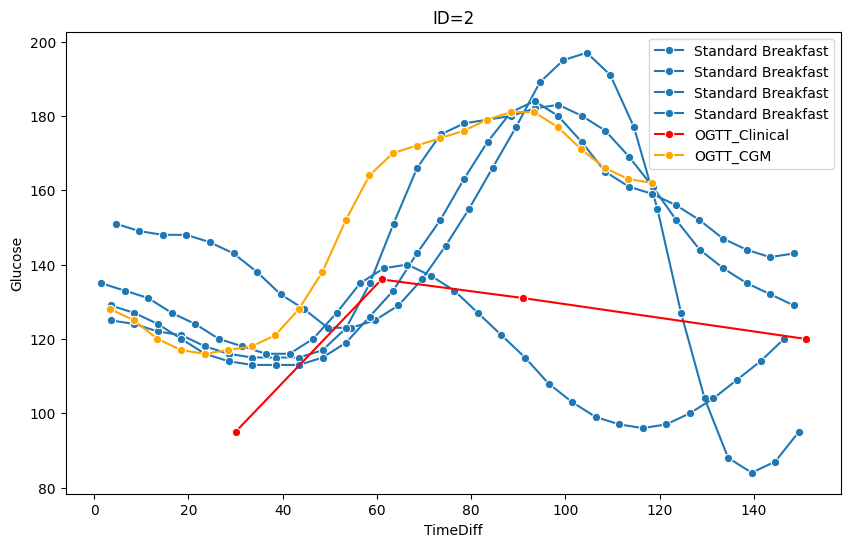

In [46]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=two_ogtt, y="Glucose", x="TimeDiff",palette='bright',units='date',estimator=None, marker='o').set(title='ID=2')
sns.lineplot(data=df_gtt_two, y="Glucose", x="TimeDiff", marker='o',color='red',estimator=None)
sns.lineplot(data=boost_cgm_two, y="Glucose", x="TimeDiff", marker='o',color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"])

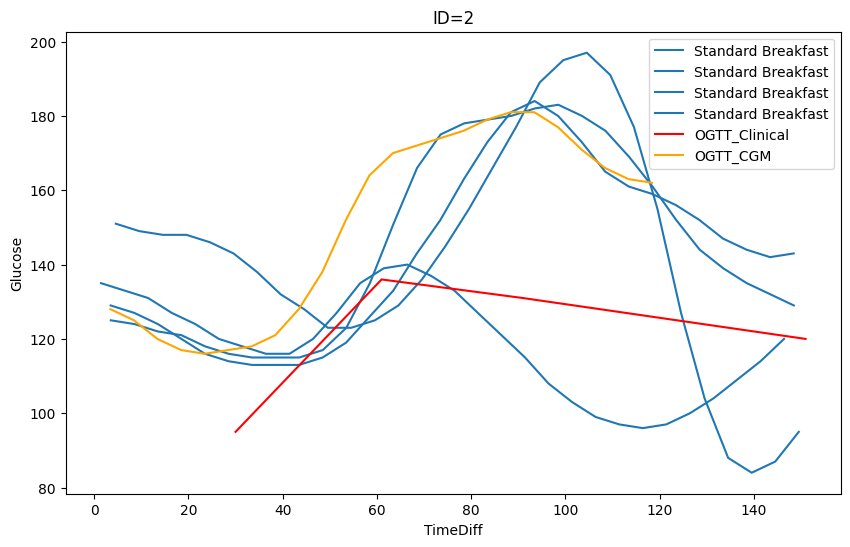

In [47]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=two_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=2')
sns.lineplot(data=df_gtt_two, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_two, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"])

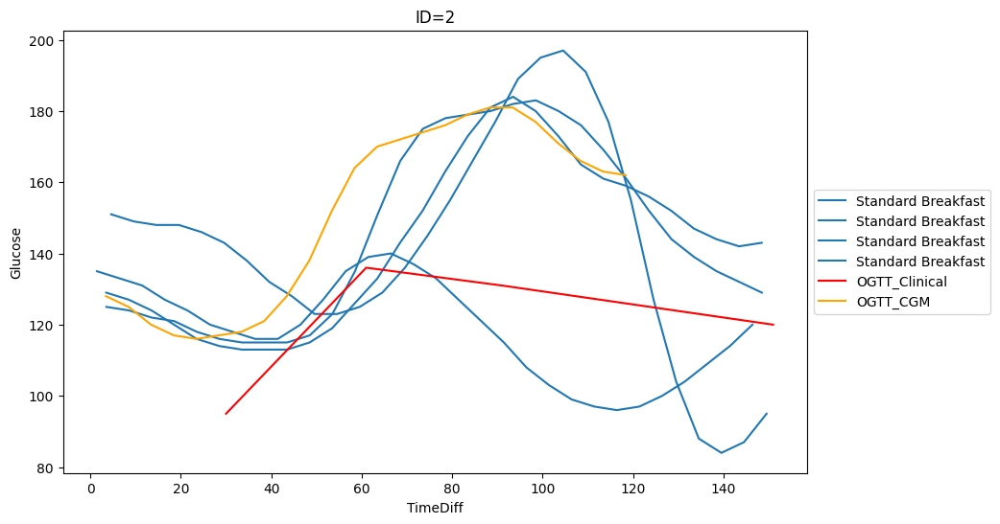

In [48]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=two_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=2')
sns.lineplot(data=df_gtt_two, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_two, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

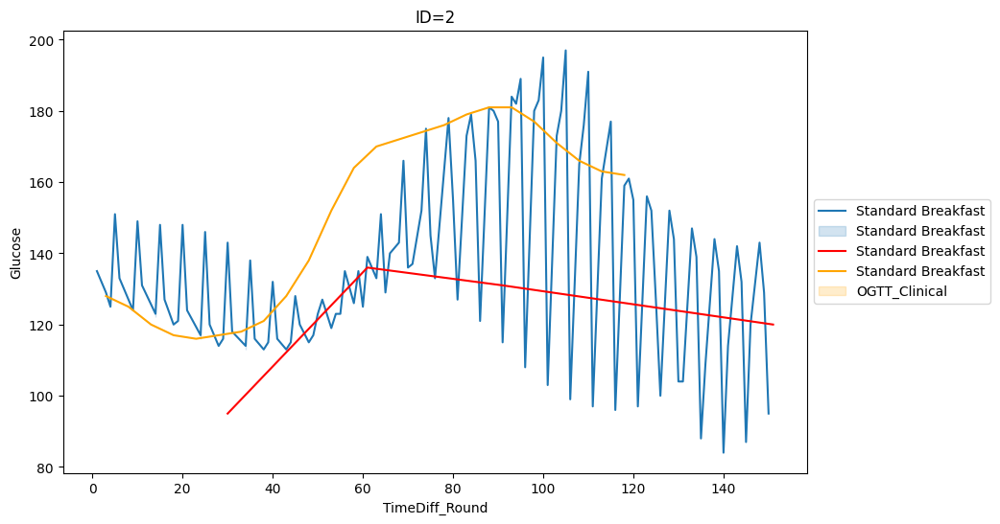

In [49]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=two_ogtt, y="Glucose", x="TimeDiff_Round", palette='bright').set(title='ID=2')
sns.lineplot(data=df_gtt_two, y="Glucose", x="TimeDiff_Round", color='red',estimator=None)
sns.lineplot(data=boost_cgm_two, y="Glucose", x="TimeDiff_Round", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [50]:
boost_sub=boost_cgm_two[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_two[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
ogtt_sub=two_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
boost_sub['id']=2
gtt_sub['id']=2
ogtt_sub['id']=2

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

food_responses=food_responses.append([ogtt_sub,gtt_sub,boost_sub])
food_responses


,TimeDiff,Glucose,Time,date,id,type
80,3.516667,94.0,2019-09-17 06:43:31,2019-09-17,1,standard_meal
81,8.533333,95.0,2019-09-17 06:48:32,2019-09-17,1,standard_meal
82,13.533333,97.0,2019-09-17 06:53:32,2019-09-17,1,standard_meal
83,18.533333,97.0,2019-09-17 06:58:32,2019-09-17,1,standard_meal
84,23.533333,95.0,2019-09-17 07:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2126,98.416667,177.0,2019-10-02 09:18:25,2019-10-02,2,boost_cgm
2127,103.400000,171.0,2019-10-02 09:23:24,2019-10-02,2,boost_cgm
2128,108.400000,166.0,2019-10-02 09:28:24,2019-10-02,2,boost_cgm
2129,113.400000,163.0,2019-10-02 09:33:24,2019-10-02,2,boost_cgm


In [51]:
max_times=two_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
two_ogtt.groupby('date')['TimeDiff_Round'].nunique()

date
2019-09-25    30
2019-09-27    30
2019-09-29    30
2019-10-01    30
Name: TimeDiff_Round, dtype: int64

In [52]:
max_times=two_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
two_ogtt.groupby('date')['TimeDiff_Round'].nunique()

dates=two_ogtt['date'].unique()
df_first_date=two_ogtt[two_ogtt['date']==dates[0]]

# two_ogtt_test=two_ogtt

column_names = two_ogtt.columns.tolist()

# Create an empty DataFrame with the same columns
df_ppgr_grouped_two = pd.DataFrame(columns=column_names)

for i in dates:
  df_date=two_ogtt[two_ogtt['date']==i]
  print(i)
  # df_date['nearest_time'] = df_first_date['TimeDiff'].apply(find_nearest_value)
  result_df = find_nearest_value(df_date, df_first_date, 'TimeDiff_Round', 'TimeDiff_Round')
  df_ppgr_grouped_two=df_ppgr_grouped_two.append(result_df)


# For grouped
boost_sub=boost_cgm_two[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_two[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
# ogtt_sub=two_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
ogtt_sub=df_ppgr_grouped_two[['nearest_TimeDiff_Round','Glucose','timestamp_dt','date']]
boost_sub['id']=2
gtt_sub['id']=2
ogtt_sub['id']=2

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

ogtt_sub.rename(columns={"nearest_TimeDiff_Round": "nearest_time_diff"},inplace=True)
boost_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)
gtt_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)


food_responses_grouped=food_responses_grouped.append([ogtt_sub,gtt_sub,boost_sub])
food_responses_grouped


2019-09-25
2019-09-27
2019-09-29
2019-10-01


,nearest_time_diff,Glucose,Time,date,id,type
80,4.000000,94.0,2019-09-17 06:43:31,2019-09-17,1,standard_meal
81,9.000000,95.0,2019-09-17 06:48:32,2019-09-17,1,standard_meal
82,14.000000,97.0,2019-09-17 06:53:32,2019-09-17,1,standard_meal
83,19.000000,97.0,2019-09-17 06:58:32,2019-09-17,1,standard_meal
84,24.000000,95.0,2019-09-17 07:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2126,98.416667,177.0,2019-10-02 09:18:25,2019-10-02,2,boost_cgm
2127,103.400000,171.0,2019-10-02 09:23:24,2019-10-02,2,boost_cgm
2128,108.400000,166.0,2019-10-02 09:28:24,2019-10-02,2,boost_cgm
2129,113.400000,163.0,2019-10-02 09:33:24,2019-10-02,2,boost_cgm


In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=ogtt_sub, y="Glucose", x="nearest_time_diff", palette='bright').set(title='ID=2')
sns.lineplot(data=boost_sub, y="Glucose", x="nearest_time_diff", color='red',estimator=None)
sns.lineplot(data=gtt_sub, y="Glucose", x="nearest_time_diff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [53]:
s = '19-003'

GTT = [80,114,87,81]
GTT_times = ['2019-10-03 9:25:00', '2019-10-03 10:00:00', '2019-10-03 10:30:00', '2019-10-03 11:28:00']
GTT_times = pd.to_datetime(GTT_times, format='%Y-%m-%dT%H:%M:%S')

df_gtt_three = pd.DataFrame({'Glucose': GTT, 'Time': GTT_times})
auc_ogtt_three=calculate_area_under_curve(df_gtt_three)
auc_ogtt_three

11282

In [54]:
# # food_three=pd.read_excel('Food Logs/Food Log/Food_Log_003.xlsx')
# food_three.logged_food.unique()

In [55]:
cgm_three=pd.read_csv('Wearables + CGM data/003/Dexcom.csv')
cgm_three['timestamp_dt']=pd.to_datetime(cgm_three['Timestamp (YYYY-MM-DDThh:mm:ss)'])
cgm_three['Glucose']=cgm_three['Glucose Value (mg/dL)']
cgm_three['Time']=pd.to_datetime(cgm_three['Timestamp (YYYY-MM-DDThh:mm:ss)'])

cgm_three=cgm_three.dropna(subset = ['timestamp_dt'])
cgm_three['date']=cgm_three['timestamp_dt'].dt.date
cgm_three

# food_three=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/003/Food_Log_003.csv')

# food_three['date']=pd.to_datetime(food_three['date']).dt.date

food_three=pd.read_excel('Food Logs/Food Log/Food_Log_003.xlsx')

# food_three.rename(columns={"date": "date_old"},inplace=True)

food_three['date']=pd.to_datetime(food_three['date']).dt.date

food_three['time_begin']=pd.to_datetime(food_three.date_time)
# food_three['time_begin']=pd.to_datetime(food_three['time_begin'])
window_dt = pd.Timedelta(minutes=120)

food_three["time_begin_win"] = food_three["time_begin"]  + window_dt

merge_food_cgm_three=pd.merge(cgm_three,food_three,left_on=['date'],right_on=['date'])

cf_three=food_three[food_three['logged_food']=='Cornflakes']

merge_food_cgm_three=pd.merge(cgm_three,cf_three,left_on=['date'],right_on=['date'])
window_dt_brkfst = pd.Timedelta(minutes=-30)

food_cgm_three_cf=merge_food_cgm_three[(merge_food_cgm_three['timestamp_dt']<=merge_food_cgm_three['time_begin_win'])&(merge_food_cgm_three['timestamp_dt']>=(merge_food_cgm_three['time_begin']+window_dt_brkfst))]

food_cgm_three_cf['pre_glu_time']=food_cgm_three_cf.groupby('date')['timestamp_dt'].transform('min')

column_names=food_cgm_three_cf.columns.values
food_cgm_three_cf_all_dates = pd.DataFrame(columns=column_names)

for i in food_cgm_three_cf['date'].unique():
  date_sub=food_cgm_three_cf[food_cgm_three_cf['date']==i]

  date_sub = date_sub.sort_values(by='timestamp_dt')
  min_glu=date_sub['Glucose Value (mg/dL)'].iloc[0]
  date_sub['min_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('min_glu')] = min_glu

  final_glu=date_sub['Glucose Value (mg/dL)'].iloc[-1]
  date_sub['final_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('final_glu')] = final_glu

  max_glu=date_sub['Glucose Value (mg/dL)'].max()
  date_sub['max_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('max_glu')] = max_glu

  date_sub['meal_auc'] = calculate_area_under_curve(date_sub)
  date_sub['auc_ogtt_three']=auc_ogtt_three
  j= i - dt.timedelta(days=1)
  cgm_three_ld=cgm_three[cgm_three['date']==j]

  date_sub['mean_glu_ld']=cgm_three_ld.groupby('date')['Glucose'].transform('mean').iloc[0]
  date_sub['interdaycv']=interdaycv(cgm_three_ld)
  date_sub['interdaysd']=interdaysd(cgm_three_ld)
  date_sub['TIR']=TIR(cgm_three_ld, sd=1, sr=5)
  date_sub['TOR']=TOR(cgm_three_ld, sd=1, sr=5)
  date_sub['POR']=POR(cgm_three_ld, sd=1, sr=5)
  date_sub['PIR']=PIR(cgm_three_ld, sd=1, sr=5)
  date_sub['MGE']=MGE(cgm_three_ld, sd=1)
  date_sub['MGN']=MGN(cgm_three_ld, sd=1)
  #MAGE(cgm_three, std=1)
  date_sub['J_index']=J_index(cgm_three_ld)
  date_sub['LBGI']=LBGI(cgm_three_ld)
  date_sub['HBGI']=HBGI(cgm_three_ld)
  #MODD(cgm_three)
  #CONGA24(cgm_three)
  date_sub['GMI']=GMI(date_sub)

  food_cgm_three_cf_all_dates=food_cgm_three_cf_all_dates.append(date_sub)

three_ogtt=food_cgm_three_cf_all_dates

three_ogtt_dup=three_ogtt.drop_duplicates(subset=['date'], keep='first')
three_ogtt_dup['id']=3
three_ogtt_dup['a1c']="norm"


In [56]:
window_dt = pd.Timedelta(minutes=160)
boost_time=dt.datetime(2019,10,3,8,55,0)
#'2019-10-03 9:25:00'

boost_cgm_three=cgm_three[(cgm_three['timestamp_dt']>=boost_time)&(cgm_three['timestamp_dt']<=boost_time + window_dt)]
boost_cgm_three.head(4)

,Index,Timestamp (YYYY-MM-DDThh:mm:ss),Event Type,Event Subtype,Patient Info,Device Info,Source Device ID,Glucose Value (mg/dL),Insulin Value (u),Carb Value (grams),Duration (hh:mm:ss),Glucose Rate of Change (mg/dL/min),Transmitter Time (Long Integer),Transmitter ID,timestamp_dt,Glucose,Time,date
2281,2282,2019-10-03T08:56:31,EGV,NaN,NaN,NaN,iPhone G6,91.0,NaN,NaN,NaN,NaN,693286.0,81C46E,2019-10-03 08:56:31,91.0,2019-10-03 08:56:31,2019-10-03
2282,2283,2019-10-03T09:01:31,EGV,NaN,NaN,NaN,iPhone G6,91.0,NaN,NaN,NaN,NaN,693586.0,81C46E,2019-10-03 09:01:31,91.0,2019-10-03 09:01:31,2019-10-03
2283,2284,2019-10-03T09:06:31,EGV,NaN,NaN,NaN,iPhone G6,91.0,NaN,NaN,NaN,NaN,693886.0,81C46E,2019-10-03 09:06:31,91.0,2019-10-03 09:06:31,2019-10-03
2284,2285,2019-10-03T09:11:31,EGV,NaN,NaN,NaN,iPhone G6,92.0,NaN,NaN,NaN,NaN,694186.0,81C46E,2019-10-03 09:11:31,92.0,2019-10-03 09:11:31,2019-10-03


In [57]:
three_ogtt['TimeDiff'] = (three_ogtt['timestamp_dt'] - (merge_food_cgm_three['time_begin']+window_dt_brkfst)).dt.total_seconds()/ 60

# Group by and use cumcount
three_ogtt['SequentialTimeValues'] = three_ogtt.groupby('date').cumcount() + 1

df_gtt_three['Time']=pd.to_datetime(df_gtt_three['Time'])

# df_gtt_three['TimeDiff'] = (df_gtt_three['Time'] - df_gtt_three['Time'].min()).dt.total_seconds()/ 60
df_gtt_three['TimeDiff'] = (df_gtt_three['Time'] - boost_time).dt.total_seconds()/ 60

boost_cgm_three['TimeDiff'] = (boost_cgm_three['timestamp_dt'] - boost_time).dt.total_seconds()/ 60


In [58]:
three_ogtt['TimeDiff_Round']=three_ogtt['TimeDiff'].round()
df_gtt_three['TimeDiff_Round']=df_gtt_three['TimeDiff'].round()
boost_cgm_three['TimeDiff_Round']=boost_cgm_three['TimeDiff'].round()

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

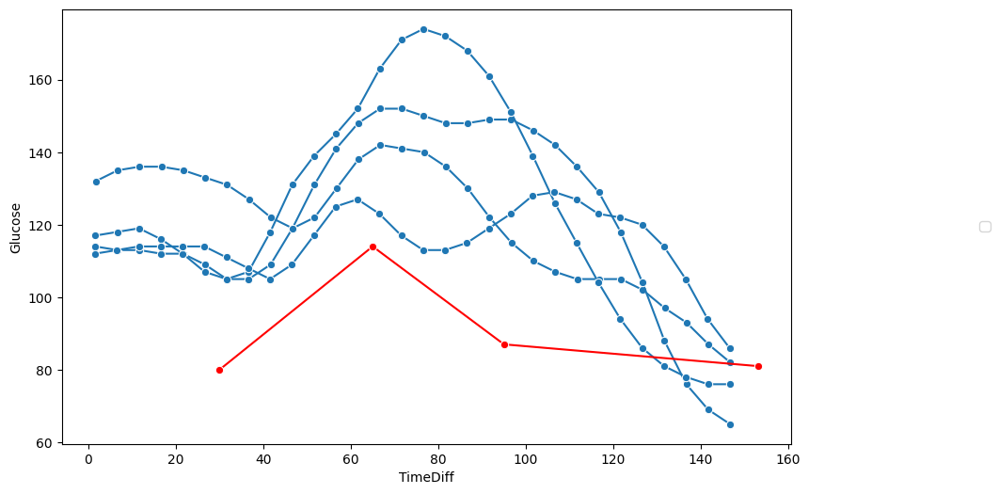

In [59]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=three_ogtt, y="Glucose", x="TimeDiff",palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_three, y="Glucose", x="TimeDiff", marker='o',color='red')

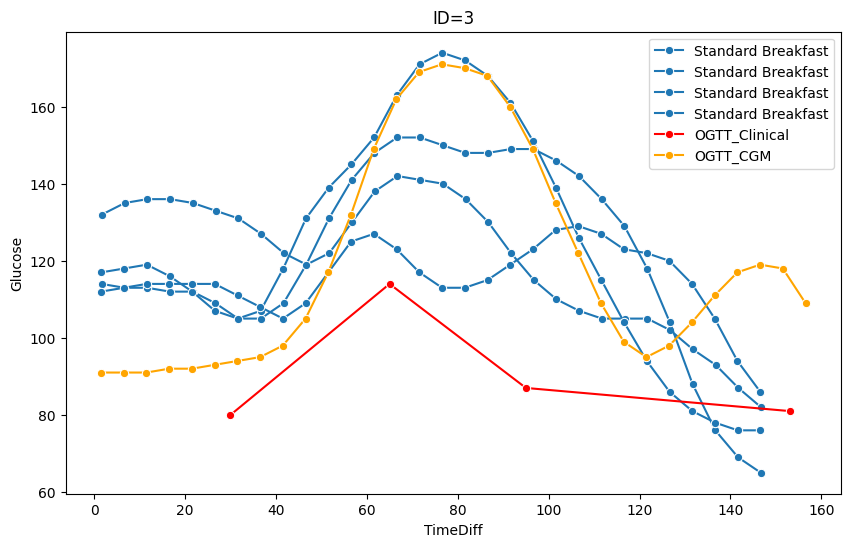

In [60]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=three_ogtt, y="Glucose", x="TimeDiff",palette='bright',units='date',estimator=None, marker='o').set(title='ID=3')
sns.lineplot(data=df_gtt_three, y="Glucose", x="TimeDiff", marker='o',color='red',estimator=None)
sns.lineplot(data=boost_cgm_three, y="Glucose", x="TimeDiff", marker='o',color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"])

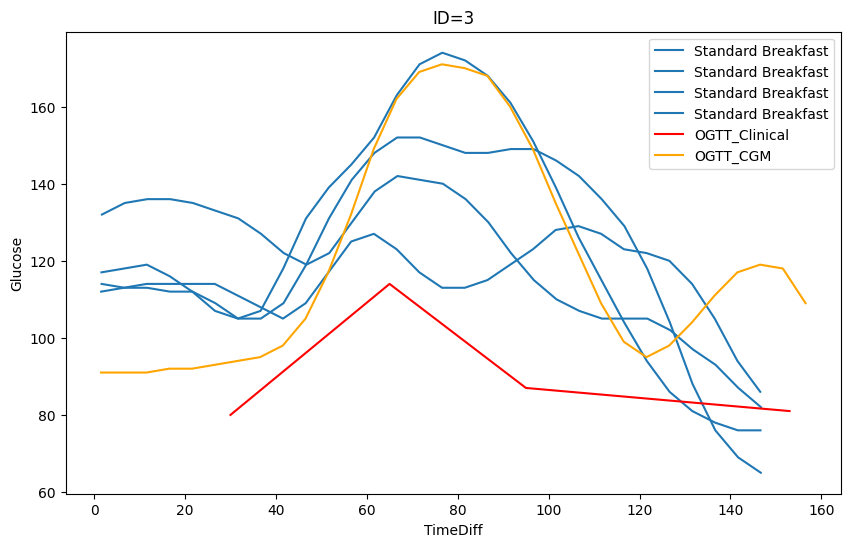

In [61]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=three_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=3')
sns.lineplot(data=df_gtt_three, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_three, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"])

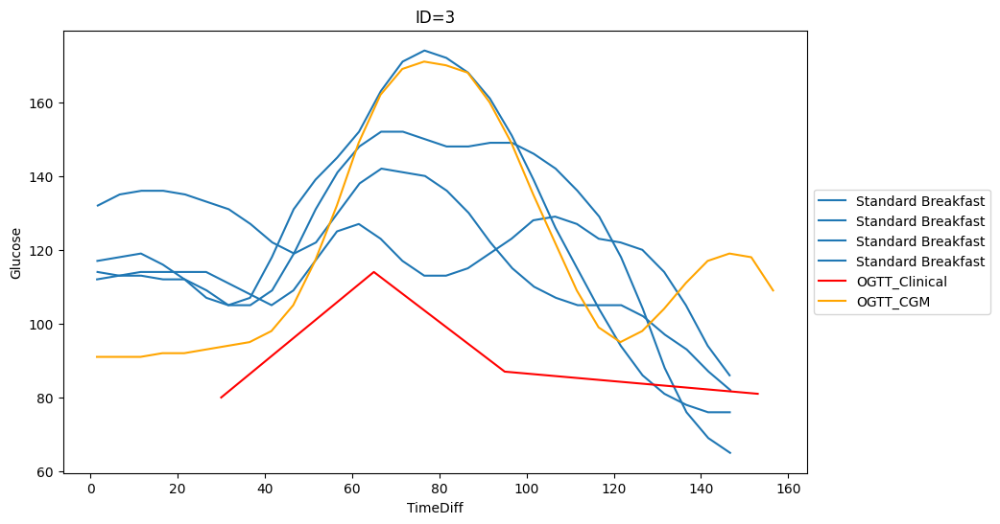

In [62]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=three_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=3')
sns.lineplot(data=df_gtt_three, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_three, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

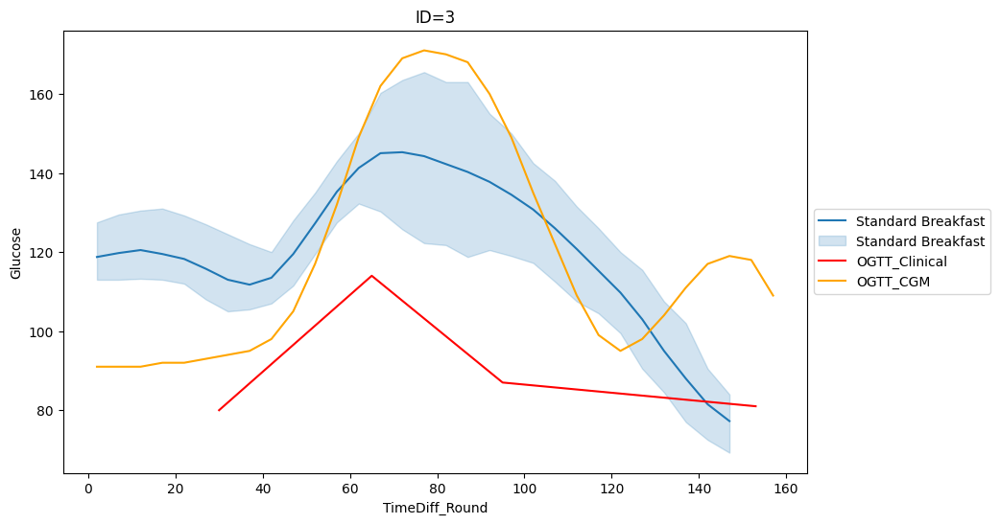

In [63]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=three_ogtt, y="Glucose", x="TimeDiff_Round", palette='bright').set(title='ID=3')
sns.lineplot(data=df_gtt_three, y="Glucose", x="TimeDiff_Round", color='red',estimator=None)
sns.lineplot(data=boost_cgm_three, y="Glucose", x="TimeDiff_Round", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [64]:
boost_sub=boost_cgm_three[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_three[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
ogtt_sub=three_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
boost_sub['id']=3
gtt_sub['id']=3
ogtt_sub['id']=3

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

food_responses=food_responses.append([ogtt_sub,gtt_sub,boost_sub])
food_responses

# food_responses=ogtt_sub.append(gtt_sub)
# food_responses=food_responses.append(boost_sub)
# food_responses


,TimeDiff,Glucose,Time,date,id,type
80,3.516667,94.0,2019-09-17 06:43:31,2019-09-17,1,standard_meal
81,8.533333,95.0,2019-09-17 06:48:32,2019-09-17,1,standard_meal
82,13.533333,97.0,2019-09-17 06:53:32,2019-09-17,1,standard_meal
83,18.533333,97.0,2019-09-17 06:58:32,2019-09-17,1,standard_meal
84,23.533333,95.0,2019-09-17 07:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2308,136.516667,111.0,2019-10-03 11:11:31,2019-10-03,3,boost_cgm
2309,141.516667,117.0,2019-10-03 11:16:31,2019-10-03,3,boost_cgm
2310,146.516667,119.0,2019-10-03 11:21:31,2019-10-03,3,boost_cgm
2311,151.516667,118.0,2019-10-03 11:26:31,2019-10-03,3,boost_cgm


In [65]:
max_times=three_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
three_ogtt.groupby('date')['TimeDiff_Round'].nunique()

dates=three_ogtt['date'].unique()
df_first_date=three_ogtt[three_ogtt['date']==dates[0]]

# three_ogtt_test=three_ogtt

column_names = three_ogtt.columns.tolist()

# Create an empty DataFrame with the same columns
df_ppgr_grouped_three = pd.DataFrame(columns=column_names)

for i in dates:
  df_date=three_ogtt[three_ogtt['date']==i]
  print(i)
  # df_date['nearest_time'] = df_first_date['TimeDiff'].apply(find_nearest_value)
  result_df = find_nearest_value(df_date, df_first_date, 'TimeDiff_Round', 'TimeDiff_Round')
  df_ppgr_grouped_three=df_ppgr_grouped_three.append(result_df)


# For grouped
boost_sub=boost_cgm_three[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_three[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
# ogtt_sub=three_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
ogtt_sub=df_ppgr_grouped_three[['nearest_TimeDiff_Round','Glucose','timestamp_dt','date']]
boost_sub['id']=3
gtt_sub['id']=3
ogtt_sub['id']=3

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

ogtt_sub.rename(columns={"nearest_TimeDiff_Round": "nearest_time_diff"},inplace=True)
boost_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)
gtt_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)


food_responses_grouped=food_responses_grouped.append([ogtt_sub,gtt_sub,boost_sub])
food_responses_grouped


2019-09-26
2019-09-28
2019-09-30
2019-10-02


,nearest_time_diff,Glucose,Time,date,id,type
80,4.000000,94.0,2019-09-17 06:43:31,2019-09-17,1,standard_meal
81,9.000000,95.0,2019-09-17 06:48:32,2019-09-17,1,standard_meal
82,14.000000,97.0,2019-09-17 06:53:32,2019-09-17,1,standard_meal
83,19.000000,97.0,2019-09-17 06:58:32,2019-09-17,1,standard_meal
84,24.000000,95.0,2019-09-17 07:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2308,136.516667,111.0,2019-10-03 11:11:31,2019-10-03,3,boost_cgm
2309,141.516667,117.0,2019-10-03 11:16:31,2019-10-03,3,boost_cgm
2310,146.516667,119.0,2019-10-03 11:21:31,2019-10-03,3,boost_cgm
2311,151.516667,118.0,2019-10-03 11:26:31,2019-10-03,3,boost_cgm


In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=ogtt_sub, y="Glucose", x="nearest_time_diff", palette='bright').set(title='ID=3')
sns.lineplot(data=boost_sub, y="Glucose", x="nearest_time_diff", color='red',estimator=None)
sns.lineplot(data=gtt_sub, y="Glucose", x="nearest_time_diff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [66]:
s = '19-004'

GTT = [88,97,100,109]
GTT_times = ['2019-10-08 8:32:00', '2019-10-08 10:07:00', '2019-10-08 10:37:00', '2019-10-08 11:37:00']
GTT_times = pd.to_datetime(GTT_times, format='%Y-%m-%dT%H:%M:%S')
df_gtt_four = pd.DataFrame({'Glucose': GTT, 'Time': GTT_times})
auc_ogtt_four=calculate_area_under_curve(df_gtt_four)
auc_ogtt_four

18012

In [67]:
# food_four=pd.read_excel('Food Logs/Food Log/Food_Log_004.xlsx')
# food_four.head(4)


In [68]:
cgm_four=pd.read_csv('Wearables + CGM data/004/Dexcom.csv')
cgm_four['timestamp_dt']=pd.to_datetime(cgm_four['Timestamp (YYYY-MM-DDThh:mm:ss)'])
cgm_four['Glucose']=cgm_four['Glucose Value (mg/dL)']
cgm_four['Time']=pd.to_datetime(cgm_four['Timestamp (YYYY-MM-DDThh:mm:ss)'])

cgm_four=cgm_four.dropna(subset = ['timestamp_dt'])
cgm_four['date']=cgm_four['timestamp_dt'].dt.date
cgm_four

food_four=pd.read_excel('Food Logs/Food Log/Food_Log_004.xlsx')

food_four['date']=pd.to_datetime(food_four['date']).dt.date

# food_four['date']=pd.to_datetime(food_four['date']).dt.date

food_four.rename(columns={"time_begin": "time_begin_actual"},inplace=True)
food_four['time_begin']=pd.to_datetime(food_four['date'].astype(str) + ' ' + food_four['time_begin_actual'].astype(str))

food_four['time_begin']=pd.to_datetime(food_four['time_begin'])
window_dt = pd.Timedelta(minutes=120)


food_four["time_begin_win"] = food_four["time_begin"]  + window_dt

merge_food_cgm_four=pd.merge(cgm_four,food_four,left_on=['date'],right_on=['date'])

cf_four=food_four[food_four['logged_food']=='Frosted Flakes']

merge_food_cgm_four=pd.merge(cgm_four,cf_four,left_on=['date'],right_on=['date'])
window_dt_brkfst = pd.Timedelta(minutes=-30)

food_cgm_four_cf=merge_food_cgm_four[(merge_food_cgm_four['timestamp_dt']<=merge_food_cgm_four['time_begin_win'])&(merge_food_cgm_four['timestamp_dt']>=(merge_food_cgm_four['time_begin']+window_dt_brkfst))]

food_cgm_four_cf['pre_glu_time']=food_cgm_four_cf.groupby('date')['timestamp_dt'].transform('min')

column_names=food_cgm_four_cf.columns.values
food_cgm_four_cf_all_dates = pd.DataFrame(columns=column_names)

for i in food_cgm_four_cf['date'].unique():
  date_sub=food_cgm_four_cf[food_cgm_four_cf['date']==i]

  date_sub = date_sub.sort_values(by='timestamp_dt')
  min_glu=date_sub['Glucose Value (mg/dL)'].iloc[0]
  date_sub['min_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('min_glu')] = min_glu

  final_glu=date_sub['Glucose Value (mg/dL)'].iloc[-1]
  date_sub['final_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('final_glu')] = final_glu

  max_glu=date_sub['Glucose Value (mg/dL)'].max()
  date_sub['max_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('max_glu')] = max_glu

  date_sub['meal_auc'] = calculate_area_under_curve(date_sub)
  date_sub['auc_ogtt_four']=auc_ogtt_four
  j= i - dt.timedelta(days=1)
  cgm_four_ld=cgm_four[cgm_four['date']==j]

  date_sub['mean_glu_ld']=cgm_four_ld.groupby('date')['Glucose'].transform('mean').iloc[0]
  date_sub['interdaycv']=interdaycv(cgm_four_ld)
  date_sub['interdaysd']=interdaysd(cgm_four_ld)
  date_sub['TIR']=TIR(cgm_four_ld, sd=1, sr=5)
  date_sub['TOR']=TOR(cgm_four_ld, sd=1, sr=5)
  date_sub['POR']=POR(cgm_four_ld, sd=1, sr=5)
  date_sub['PIR']=PIR(cgm_four_ld, sd=1, sr=5)
  date_sub['MGE']=MGE(cgm_four_ld, sd=1)
  date_sub['MGN']=MGN(cgm_four_ld, sd=1)
  #MAGE(cgm_four, std=1)
  date_sub['J_index']=J_index(cgm_four_ld)
  date_sub['LBGI']=LBGI(cgm_four_ld)
  date_sub['HBGI']=HBGI(cgm_four_ld)
  #MODD(cgm_four)
  #CONGA24(cgm_four)
  date_sub['GMI']=GMI(date_sub)

  food_cgm_four_cf_all_dates=food_cgm_four_cf_all_dates.append(date_sub)

four_ogtt=food_cgm_four_cf_all_dates

four_ogtt_dup=four_ogtt.drop_duplicates(subset=['date'], keep='first')
four_ogtt_dup['id']=4
four_ogtt_dup['a1c']="PD"


In [69]:
# print(food_four[food_four['logged_food']=='Frosted Flakes'])
# food_four[food_four['logged_food']=='Boost']

In [70]:
window_dt = pd.Timedelta(minutes=120)
# boost_time=dt.datetime(2020,3,6,8,0,0)
boost_time=dt.datetime(2019,10,8,8,2,0)
#2019-10-08 8:32:00
#2019-10-08 8:32:00

boost_cgm_four=cgm_four[(cgm_four['timestamp_dt']>=boost_time)&(cgm_four['timestamp_dt']<=boost_time + window_dt)]
boost_cgm_four.head(4)
#food_thirteen["time_begin_win"] = food_thirteen["time_begin"] + window_dt

#cgm_thirteen[cgm_thirteen['timestamp_dt']>=dt.datetime(2020,6,4,9,30,0)]

,Index,Timestamp (YYYY-MM-DDThh:mm:ss),Event Type,Event Subtype,Patient Info,Device Info,Source Device ID,Glucose Value (mg/dL),Insulin Value (u),Carb Value (grams),Duration (hh:mm:ss),Glucose Rate of Change (mg/dL/min),Transmitter Time (Long Integer),Transmitter ID,timestamp_dt,Glucose,Time,date


In [71]:
four_ogtt['TimeDiff'] = (four_ogtt['timestamp_dt'] - (four_ogtt['time_begin']+window_dt_brkfst)).dt.total_seconds()/ 60

# Group by and use cumcount
four_ogtt['SequentialTimeValues'] = four_ogtt.groupby('date').cumcount() + 1

df_gtt_four['Time']=pd.to_datetime(df_gtt_four['Time'])
min_four=df_gtt_four['Time'].min()

df_gtt_four['TimeDiff'] = (df_gtt_four['Time'] - boost_time).dt.total_seconds()/ 60

# df_gtt_four['TimeDiff'] = (df_gtt_four['Time'] - min_four).dt.total_seconds()/ 60


In [72]:
# four_ogtt['TimeDiff_Round']=four_ogtt['TimeDiff'].round()
# df_gtt_four['TimeDiff_Round']=df_gtt_four['TimeDiff'].round()
# boost_cgm_five['TimeDiff_Round']=boost_cgm_five['TimeDiff'].round()

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

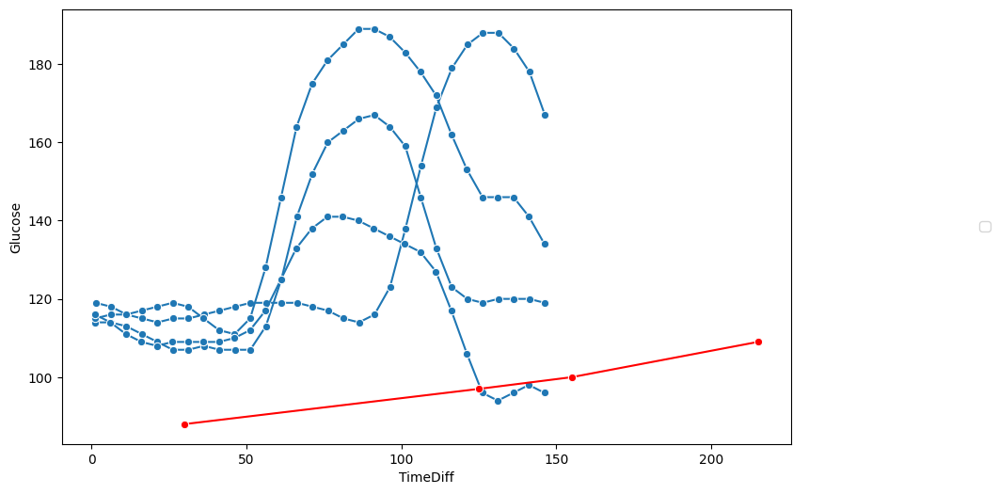

In [73]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=four_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_four, y="Glucose", x="TimeDiff", marker='o',color='red')

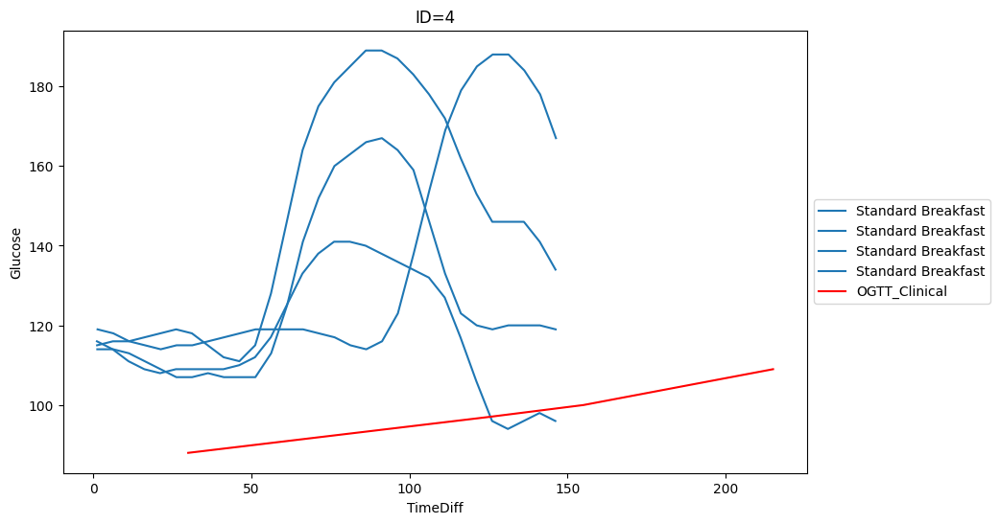

In [74]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=four_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=4')
sns.lineplot(data=df_gtt_four, y="Glucose", x="TimeDiff", color='red',estimator=None)
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [75]:
# boost_sub=boost_cgm_four[['TimeDiff','Glucose','timestamp_dt','date']]
# gtt_sub=df_gtt_four[['TimeDiff','Glucose','Time']]
# gtt_sub['date']=gtt_sub.Time.dt.date
# ogtt_sub=four_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
# boost_sub['id']=4
# gtt_sub['id']=4
# ogtt_sub['id']=4

# boost_sub['type']='boost_cgm'
# gtt_sub['type']='boost_clinical'
# ogtt_sub['type']='standard_meal'

# boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
# ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

# food_responses=food_responses.append[(ogtt_sub,gtt_sub,boost_sub)]
# food_responses


In [76]:
# import seaborn as sns
# plt.figure(figsize=(10,6))
# plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
# sns.lineplot(data=five_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=5')
# sns.lineplot(data=df_gtt_five, y="Glucose", x="TimeDiff", color='red',estimator=None)
# sns.lineplot(data=boost_cgm_five, y="Glucose", x="TimeDiff", color='orange')
# plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"])

In [77]:
s = '19-005'

GTT = [84,131,96,74]
GTT_times = ['2019-10-09 9:34:00', '2019-10-09 10:10:00', '2019-10-09 10:40:00', '2019-10-09 11:40:00']
GTT_times = pd.to_datetime(GTT_times, format='%Y-%m-%dT%H:%M:%S')

df_gtt_five = pd.DataFrame({'Glucose': GTT, 'Time': GTT_times})
auc_ogtt_five=calculate_area_under_curve(df_gtt_five)
auc_ogtt_five

12375

In [78]:
# cgm_five = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/005/Dexcom_005.csv')
cgm_five = pd.read_csv('Wearables + CGM data/005/Dexcom.csv')

cgm_five['timestamp_dt'] = pd.to_datetime(cgm_five['Timestamp (YYYY-MM-DDThh:mm:ss)'])
cgm_five['Glucose'] = cgm_five['Glucose Value (mg/dL)']
cgm_five['Time'] = pd.to_datetime(cgm_five['Timestamp (YYYY-MM-DDThh:mm:ss)'])

cgm_five = cgm_five.dropna(subset=['timestamp_dt'])
cgm_five['date'] = cgm_five['timestamp_dt'].dt.date
cgm_five

food_five=pd.read_excel('Food Logs/Food Log/Food_Log_005.xlsx')

food_five['date']=pd.to_datetime(food_five['date']).dt.date

# food_four['date']=pd.to_datetime(food_four['date']).dt.date

food_five.rename(columns={"time_begin": "time_begin_actual"},inplace=True)
food_five['time_begin']=pd.to_datetime(food_five['date'].astype(str) + ' ' + food_five['time_begin_actual'].astype(str))
window_dt_brkfst = pd.Timedelta(minutes=-30)
# food_five = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/005/Food_Log_005.csv')

# food_five['date'] = pd.to_datetime(food_five['date']).dt.date

# food_five['time_begin'] = pd.to_datetime(food_five['time_begin'])
window_dt = pd.Timedelta(minutes=120)

food_five["time_begin_win"] = food_five["time_begin"] + window_dt

merge_food_cgm_five = pd.merge(cgm_five, food_five, left_on=['date'], right_on=['date'])

cf_five = food_five[food_five['logged_food'] == 'Cornflakes']

merge_food_cgm_five = pd.merge(cgm_five, cf_five, left_on=['date'], right_on=['date'])

food_cgm_five_cf = merge_food_cgm_five[(merge_food_cgm_five['timestamp_dt'] <= merge_food_cgm_five['time_begin_win']) & (merge_food_cgm_five['timestamp_dt'] >= (merge_food_cgm_five['time_begin']+window_dt_brkfst))]

food_cgm_five_cf['pre_glu_time'] = food_cgm_five_cf.groupby('date')['timestamp_dt'].transform('min')

column_names = food_cgm_five_cf.columns.values
food_cgm_five_cf_all_dates = pd.DataFrame(columns=column_names)

for i in food_cgm_five_cf['date'].unique():
    date_sub = food_cgm_five_cf[food_cgm_five_cf['date'] == i]

    date_sub = date_sub.sort_values(by='timestamp_dt')
    min_glu = date_sub['Glucose Value (mg/dL)'].iloc[0]
    date_sub['min_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('min_glu')] = min_glu

    final_glu = date_sub['Glucose Value (mg/dL)'].iloc[-1]
    date_sub['final_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('final_glu')] = final_glu

    max_glu = date_sub['Glucose Value (mg/dL)'].max()
    date_sub['max_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('max_glu')] = max_glu

    date_sub['meal_auc'] = calculate_area_under_curve(date_sub)
    date_sub['auc_ogtt_five'] = auc_ogtt_five
    j = i - dt.timedelta(days=1)
    cgm_five_ld = cgm_five[cgm_five['date'] == j]

    date_sub['mean_glu_ld'] = cgm_five_ld.groupby('date')['Glucose'].transform('mean').iloc[0]
    date_sub['interdaycv'] = interdaycv(cgm_five_ld)
    date_sub['interdaysd'] = interdaysd(cgm_five_ld)
    date_sub['TIR'] = TIR(cgm_five_ld, sd=1, sr=5)
    date_sub['TOR'] = TOR(cgm_five_ld, sd=1, sr=5)
    date_sub['POR'] = POR(cgm_five_ld, sd=1, sr=5)
    date_sub['PIR'] = PIR(cgm_five_ld, sd=1, sr=5)
    date_sub['MGE'] = MGE(cgm_five_ld, sd=1)
    date_sub['MGN'] = MGN(cgm_five_ld, sd=1)
    # MAGE(cgm_five, std=1)
    date_sub['J_index'] = J_index(cgm_five_ld)
    date_sub['LBGI'] = LBGI(cgm_five_ld)
    date_sub['HBGI'] = HBGI(cgm_five_ld)
    # MODD(cgm_five)
    # CONGA24(cgm_five)
    date_sub['GMI'] = GMI(date_sub)

    food_cgm_five_cf_all_dates = food_cgm_five_cf_all_dates.append(date_sub)

five_ogtt = food_cgm_five_cf_all_dates

five_ogtt_dup = five_ogtt.drop_duplicates(subset=['date'], keep='first')
five_ogtt_dup['id'] = 5
five_ogtt_dup['a1c'] = "PD"


In [79]:
# print(food_five[food_five['logged_food']=='Cornflakes'])
# food_five[food_five['logged_food']=='Boost']

In [80]:
window_dt = pd.Timedelta(minutes=120)
boost_time=dt.datetime(2019,10,9,9,4,0)
#9:34:00
#8:53:00
# 2019-10-09 9:34:00

boost_cgm_five=cgm_five[(cgm_five['timestamp_dt']>=boost_time)]
boost_cgm_five.head(4)
#food_thirteen["time_begin_win"] = food_thirteen["time_begin"] + window_dt

#cgm_thirteen[cgm_thirteen['timestamp_dt']>=dt.datetime(2020,6,4,9,30,0)]

,Index,Timestamp (YYYY-MM-DDThh:mm:ss),Event Type,Event Subtype,Patient Info,Device Info,Source Device ID,Glucose Value (mg/dL),Insulin Value (u),Carb Value (grams),Duration (hh:mm:ss),Glucose Rate of Change (mg/dL/min),Transmitter Time (Long Integer),Transmitter ID,timestamp_dt,Glucose,Time,date
2536,2537,2019-10-09T09:06:06,EGV,NaN,NaN,NaN,MX84702427,90.0,NaN,NaN,NaN,NaN,771657.0,81C2FU,2019-10-09 09:06:06,90.0,2019-10-09 09:06:06,2019-10-09
2537,2538,2019-10-09T09:11:07,EGV,NaN,NaN,NaN,MX84702427,88.0,NaN,NaN,NaN,NaN,771957.0,81C2FU,2019-10-09 09:11:07,88.0,2019-10-09 09:11:07,2019-10-09
2538,2539,2019-10-09T09:16:06,EGV,NaN,NaN,NaN,MX84702427,86.0,NaN,NaN,NaN,NaN,772257.0,81C2FU,2019-10-09 09:16:06,86.0,2019-10-09 09:16:06,2019-10-09
2539,2540,2019-10-09T09:21:05,EGV,NaN,NaN,NaN,MX84702427,86.0,NaN,NaN,NaN,NaN,772557.0,81C2FU,2019-10-09 09:21:05,86.0,2019-10-09 09:21:05,2019-10-09


In [81]:
five_ogtt['TimeDiff'] = (five_ogtt['timestamp_dt'] - (five_ogtt['time_begin']+window_dt_brkfst)).dt.total_seconds()/ 60

# Group by and use cumcount
five_ogtt['SequentialTimeValues'] = five_ogtt.groupby('date').cumcount() + 1

df_gtt_five['Time']=pd.to_datetime(df_gtt_five['Time'])

df_gtt_five['TimeDiff'] = (df_gtt_five['Time'] - boost_time).dt.total_seconds()/ 60

boost_cgm_five['TimeDiff'] = (boost_cgm_five['timestamp_dt'] - boost_time).dt.total_seconds()/ 60


In [82]:
five_ogtt['TimeDiff_Round']=five_ogtt['TimeDiff'].round()
df_gtt_five['TimeDiff_Round']=df_gtt_five['TimeDiff'].round()
boost_cgm_five['TimeDiff_Round']=boost_cgm_five['TimeDiff'].round()

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

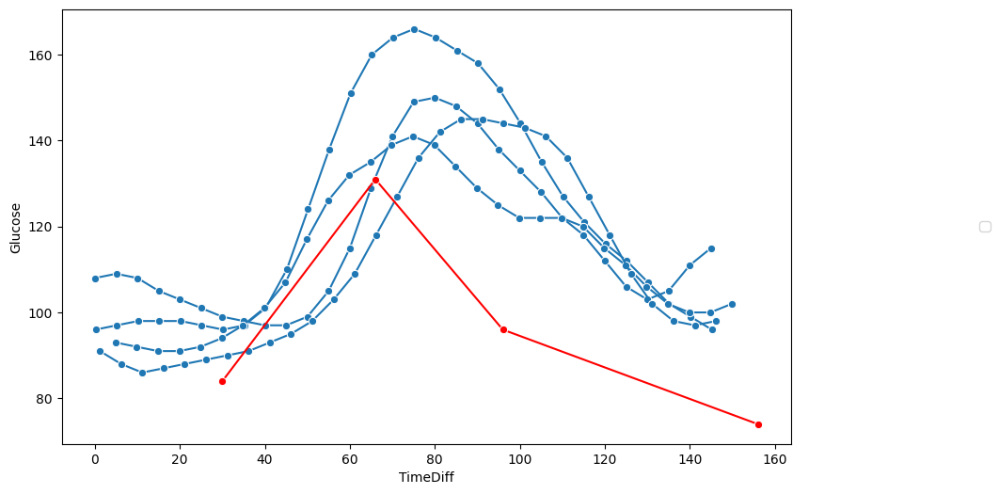

In [83]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=five_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_five, y="Glucose", x="TimeDiff", marker='o',color='red')

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

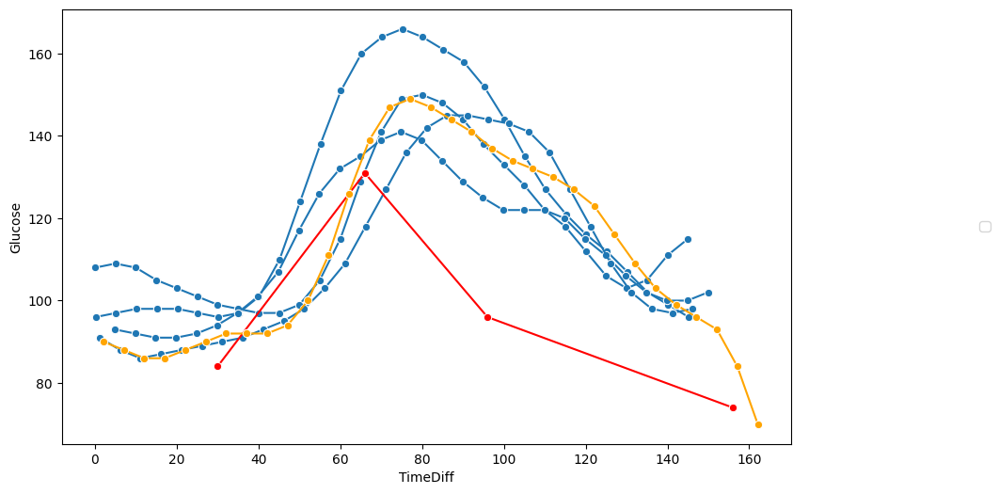

In [84]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=five_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_five, y="Glucose", x="TimeDiff", marker='o',color='red')
sns.lineplot(data=boost_cgm_five, y="Glucose", x="TimeDiff", marker='o',color='orange')

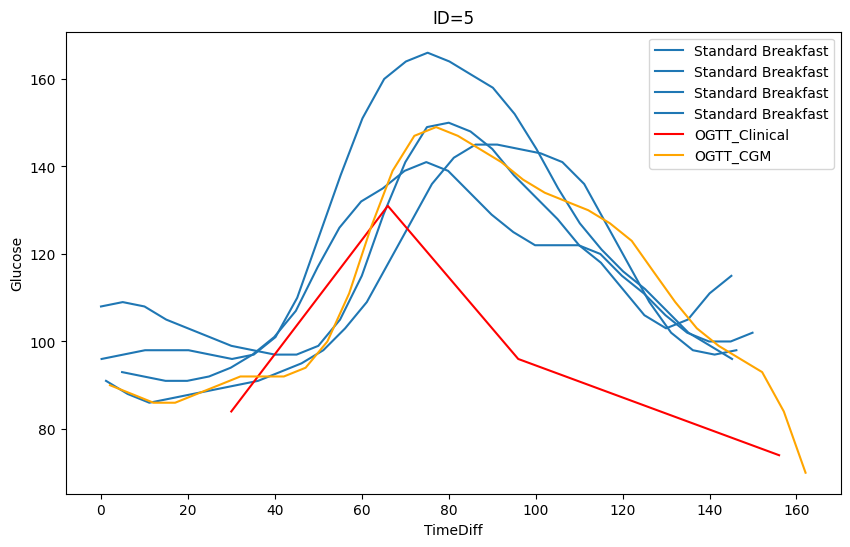

In [85]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=five_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=5')
sns.lineplot(data=df_gtt_five, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_five, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"])

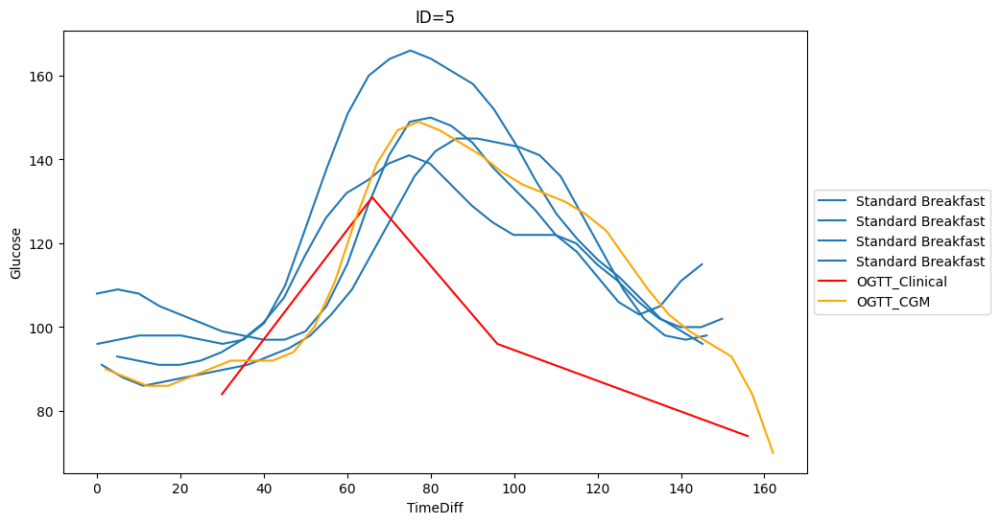

In [86]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=five_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=5')
sns.lineplot(data=df_gtt_five, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_five, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

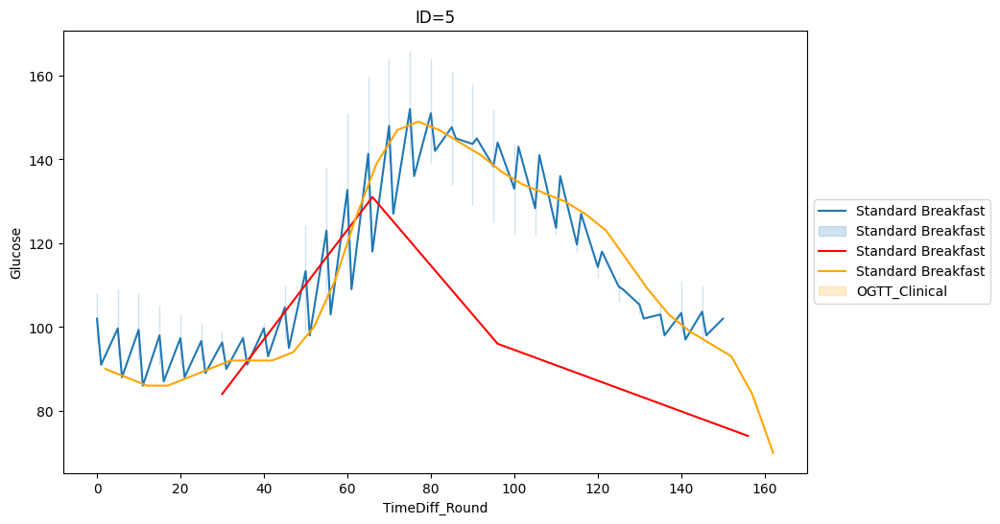

In [87]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=five_ogtt, y="Glucose", x="TimeDiff_Round", palette='bright').set(title='ID=5')
sns.lineplot(data=df_gtt_five, y="Glucose", x="TimeDiff_Round", color='red',estimator=None)
sns.lineplot(data=boost_cgm_five, y="Glucose", x="TimeDiff_Round", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [88]:
boost_sub=boost_cgm_five[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_five[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
ogtt_sub=five_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
boost_sub['id']=5
gtt_sub['id']=5
ogtt_sub['id']=5

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

food_responses=food_responses.append([ogtt_sub,gtt_sub,boost_sub])
food_responses


,TimeDiff,Glucose,Time,date,id,type
80,3.516667,94.0,2019-09-17 06:43:31,2019-09-17,1,standard_meal
81,8.533333,95.0,2019-09-17 06:48:32,2019-09-17,1,standard_meal
82,13.533333,97.0,2019-09-17 06:53:32,2019-09-17,1,standard_meal
83,18.533333,97.0,2019-09-17 06:58:32,2019-09-17,1,standard_meal
84,23.533333,95.0,2019-09-17 07:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2564,142.100000,99.0,2019-10-09 11:26:06,2019-10-09,5,boost_cgm
2565,147.083333,96.0,2019-10-09 11:31:05,2019-10-09,5,boost_cgm
2566,152.100000,93.0,2019-10-09 11:36:06,2019-10-09,5,boost_cgm
2567,157.083333,84.0,2019-10-09 11:41:05,2019-10-09,5,boost_cgm


In [89]:
max_times=five_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
five_ogtt.groupby('date')['TimeDiff_Round'].nunique()


date
2019-10-01    30
2019-10-03    30
2019-10-05    30
2019-10-07    30
Name: TimeDiff_Round, dtype: int64

In [90]:
max_times=five_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
five_ogtt.groupby('date')['TimeDiff_Round'].nunique()

dates=five_ogtt['date'].unique()
df_first_date=five_ogtt[five_ogtt['date']==dates[0]]

# five_ogtt_test=five_ogtt

column_names = five_ogtt.columns.tolist()

# Create an empty DataFrame with the same columns
df_ppgr_grouped_five = pd.DataFrame(columns=column_names)

for i in dates:
  df_date=five_ogtt[five_ogtt['date']==i]
  print(i)
  # df_date['nearest_time'] = df_first_date['TimeDiff'].apply(find_nearest_value)
  result_df = find_nearest_value(df_date, df_first_date, 'TimeDiff_Round', 'TimeDiff_Round')
  df_ppgr_grouped_five=df_ppgr_grouped_five.append(result_df)


# For grouped
boost_sub=boost_cgm_five[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_five[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
# ogtt_sub=five_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
ogtt_sub=df_ppgr_grouped_five[['nearest_TimeDiff_Round','Glucose','timestamp_dt','date']]
boost_sub['id']=5
gtt_sub['id']=5
ogtt_sub['id']=5

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

ogtt_sub.rename(columns={"nearest_TimeDiff_Round": "nearest_time_diff"},inplace=True)
boost_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)
gtt_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)


food_responses_grouped=food_responses_grouped.append([ogtt_sub,gtt_sub,boost_sub])
food_responses_grouped


2019-10-01
2019-10-03
2019-10-05
2019-10-07


,nearest_time_diff,Glucose,Time,date,id,type
80,4.000000,94.0,2019-09-17 06:43:31,2019-09-17,1,standard_meal
81,9.000000,95.0,2019-09-17 06:48:32,2019-09-17,1,standard_meal
82,14.000000,97.0,2019-09-17 06:53:32,2019-09-17,1,standard_meal
83,19.000000,97.0,2019-09-17 06:58:32,2019-09-17,1,standard_meal
84,24.000000,95.0,2019-09-17 07:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2564,142.100000,99.0,2019-10-09 11:26:06,2019-10-09,5,boost_cgm
2565,147.083333,96.0,2019-10-09 11:31:05,2019-10-09,5,boost_cgm
2566,152.100000,93.0,2019-10-09 11:36:06,2019-10-09,5,boost_cgm
2567,157.083333,84.0,2019-10-09 11:41:05,2019-10-09,5,boost_cgm


In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=ogtt_sub, y="Glucose", x="nearest_time_diff", palette='bright').set(title='ID=5')
sns.lineplot(data=boost_sub, y="Glucose", x="nearest_time_diff", color='red',estimator=None)
sns.lineplot(data=gtt_sub, y="Glucose", x="nearest_time_diff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [91]:
s = '19-006'

GTT = [85,99,104,75]
GTT_times = ['2019-10-11 7:52:00', '2019-10-11 8:26:00', '2019-10-11 8:56:00', '2019-10-11 9:56:00']
GTT_times = pd.to_datetime(GTT_times, format='%Y-%m-%dT%H:%M:%S')

df_gtt_six = pd.DataFrame({'Glucose': GTT, 'Time': GTT_times})
auc_ogtt_six=calculate_area_under_curve(df_gtt_six)
auc_ogtt_six


11543

In [92]:
# df_gtt_six['Time']=pd.to_datetime(df_gtt_six['Time'])
# df_gtt_six['TimeDiff'] = (df_gtt_six['Time'] - df_gtt_six['Time'].min()).dt.total_seconds()/ 60

In [93]:
# cgm_six.head(2)

In [94]:
# food_six=pd.read_excel('Food Logs/Food Log/Food_Log_006.xlsx')
# food_six.head()

In [95]:
# food_six[food_six.logged_food=='Boost']

In [96]:
# cgm_six=pd.read_csv('Wearables + CGM data/006/Dexcom.csv')
cgm_six=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/006/Dexcom_006.csv')
cgm_six['timestamp_dt']=pd.to_datetime(cgm_six['Timestamp (YYYY-MM-DDThh:mm:ss)'])
cgm_six['Glucose']=cgm_six['Glucose Value (mg/dL)']
cgm_six['Time']=pd.to_datetime(cgm_six['Timestamp (YYYY-MM-DDThh:mm:ss)'])

cgm_six=cgm_six.dropna(subset = ['timestamp_dt'])
cgm_six['date']=cgm_six['timestamp_dt'].dt.date
cgm_six

# food_six=pd.read_excel('Food Logs/Food Log/Food_Log_006.xlsx')
food_six=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/006/Food_Log_006.csv')

food_six['date']=pd.to_datetime(food_six['date']).dt.date

# food_six['date']=pd.to_datetime(food_six['date']).dt.date

# food_six.rename(columns={"time_begin": "time_begin_actual"},inplace=True)
# food_six['time_begin']=pd.to_datetime(food_six['date'].astype(str) + ' ' + food_six['time_begin_actual'].astype(str))

food_six['time_begin']=pd.to_datetime(food_six['time_begin'])
window_dt = pd.Timedelta(minutes=120)

food_six["time_begin_win"] = food_six["time_begin"]  + window_dt

merge_food_cgm_six=pd.merge(cgm_six,food_six,left_on=['date'],right_on=['date'])

cf_six=food_six[food_six['logged_food']=='Std breakfast']

merge_food_cgm_six=pd.merge(cgm_six,cf_six,left_on=['date'],right_on=['date'])
window_dt_brkfst = pd.Timedelta(minutes=-30)

food_cgm_six_cf=merge_food_cgm_six[(merge_food_cgm_six['timestamp_dt']<=merge_food_cgm_six['time_begin_win'])&(merge_food_cgm_six['timestamp_dt']>=(merge_food_cgm_six['time_begin']+window_dt_brkfst))]

food_cgm_six_cf['pre_glu_time']=food_cgm_six_cf.groupby('date')['timestamp_dt'].transform('min')

column_names=food_cgm_six_cf.columns.values
food_cgm_six_cf_all_dates = pd.DataFrame(columns=column_names)

for i in food_cgm_six_cf['date'].unique():
  date_sub=food_cgm_six_cf[food_cgm_six_cf['date']==i]

  date_sub = date_sub.sort_values(by='timestamp_dt')
  min_glu=date_sub['Glucose Value (mg/dL)'].iloc[0]
  date_sub['min_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('min_glu')] = min_glu

  final_glu=date_sub['Glucose Value (mg/dL)'].iloc[-1]
  date_sub['final_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('final_glu')] = final_glu

  max_glu=date_sub['Glucose Value (mg/dL)'].max()
  date_sub['max_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('max_glu')] = max_glu

  date_sub['meal_auc'] = calculate_area_under_curve(date_sub)
  date_sub['auc_ogtt_six']=auc_ogtt_six
  j= i - dt.timedelta(days=1)
  cgm_six_ld=cgm_six[cgm_six['date']==j]

  date_sub['mean_glu_ld']=cgm_six_ld.groupby('date')['Glucose'].transform('mean').iloc[0]
  date_sub['interdaycv']=interdaycv(cgm_six_ld)
  date_sub['interdaysd']=interdaysd(cgm_six_ld)
  date_sub['TIR']=TIR(cgm_six_ld, sd=1, sr=5)
  date_sub['TOR']=TOR(cgm_six_ld, sd=1, sr=5)
  date_sub['POR']=POR(cgm_six_ld, sd=1, sr=5)
  date_sub['PIR']=PIR(cgm_six_ld, sd=1, sr=5)
  date_sub['MGE']=MGE(cgm_six_ld, sd=1)
  date_sub['MGN']=MGN(cgm_six_ld, sd=1)
  #MAGE(cgm_six, std=1)
  date_sub['J_index']=J_index(cgm_six_ld)
  date_sub['LBGI']=LBGI(cgm_six_ld)
  date_sub['HBGI']=HBGI(cgm_six_ld)
  #MODD(cgm_six)
  #CONGA24(cgm_six)
  date_sub['GMI']=GMI(date_sub)

  food_cgm_six_cf_all_dates=food_cgm_six_cf_all_dates.append(date_sub)

six_ogtt=food_cgm_six_cf_all_dates

six_ogtt_dup=six_ogtt.drop_duplicates(subset=['date'], keep='first')
six_ogtt_dup['id']=6
six_ogtt_dup['a1c']="PD"


In [97]:
# merge_food_cgm_six

In [98]:
window_dt = pd.Timedelta(minutes=150)
# boost_time=dt.datetime(2020,3,6,8,0,0)
boost_time=dt.datetime(2020,3,9,7,22,0)
#2019-10-08 8:32:00
#2019-10-08 8:32:00
# 2019-10-11 7:52:00
# 2020-03-09 07:30:00

# boost_cgm_six=cgm_six[(cgm_six['timestamp_dt']>=boost_time)&(cgm_six['timestamp_dt']<=boost_time + window_dt)]
boost_cgm_six=cgm_six[(cgm_six['timestamp_dt']>=boost_time)]
boost_cgm_six.head(4)
#food_thirteen["time_begin_win"] = food_thirteen["time_begin"] + window_dt

#cgm_thirteen[cgm_thirteen['timestamp_dt']>=dt.datetime(2020,6,4,9,30,0)]


,Index,Timestamp (YYYY-MM-DDThh:mm:ss),Event Type,Event Subtype,Patient Info,Device Info,Source Device ID,Glucose Value (mg/dL),Insulin Value (u),Carb Value (grams),Duration (hh:mm:ss),Glucose Rate of Change (mg/dL/min),Transmitter Time (Long Integer),timestamp_dt,Glucose,Time,date
2833,2834,2020-03-09 07:22:52,EGV,NaN,NaN,NaN,iPhone G6,104.0,NaN,NaN,NaN,NaN,854079.0,2020-03-09 07:22:52,104.0,2020-03-09 07:22:52,2020-03-09
2834,2835,2020-03-09 07:27:52,EGV,NaN,NaN,NaN,iPhone G6,103.0,NaN,NaN,NaN,NaN,854379.0,2020-03-09 07:27:52,103.0,2020-03-09 07:27:52,2020-03-09
2835,2836,2020-03-09 07:32:52,EGV,NaN,NaN,NaN,iPhone G6,102.0,NaN,NaN,NaN,NaN,854679.0,2020-03-09 07:32:52,102.0,2020-03-09 07:32:52,2020-03-09
2836,2837,2020-03-09 07:37:51,EGV,NaN,NaN,NaN,iPhone G6,101.0,NaN,NaN,NaN,NaN,854979.0,2020-03-09 07:37:51,101.0,2020-03-09 07:37:51,2020-03-09


In [99]:
six_ogtt['TimeDiff'] = (six_ogtt['timestamp_dt'] - (six_ogtt['time_begin']+window_dt_brkfst)).dt.total_seconds()/ 60

# Group by and use cumcount
six_ogtt['SequentialTimeValues'] = six_ogtt.groupby('date').cumcount() + 1

df_gtt_six['Time']=pd.to_datetime(df_gtt_six['Time'])
min_six=df_gtt_six['Time'].min()

df_gtt_six['TimeDiff'] = (df_gtt_six['Time'] - (df_gtt_six['Time'].min()+window_dt_brkfst)).dt.total_seconds()/ 60

boost_cgm_six['TimeDiff'] = (boost_cgm_six['timestamp_dt'] - boost_time).dt.total_seconds()/ 60


In [100]:
six_ogtt['TimeDiff_Round']=six_ogtt['TimeDiff'].round()
df_gtt_six['TimeDiff_Round']=df_gtt_six['TimeDiff'].round()
boost_cgm_six['TimeDiff_Round']=boost_cgm_six['TimeDiff'].round()

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

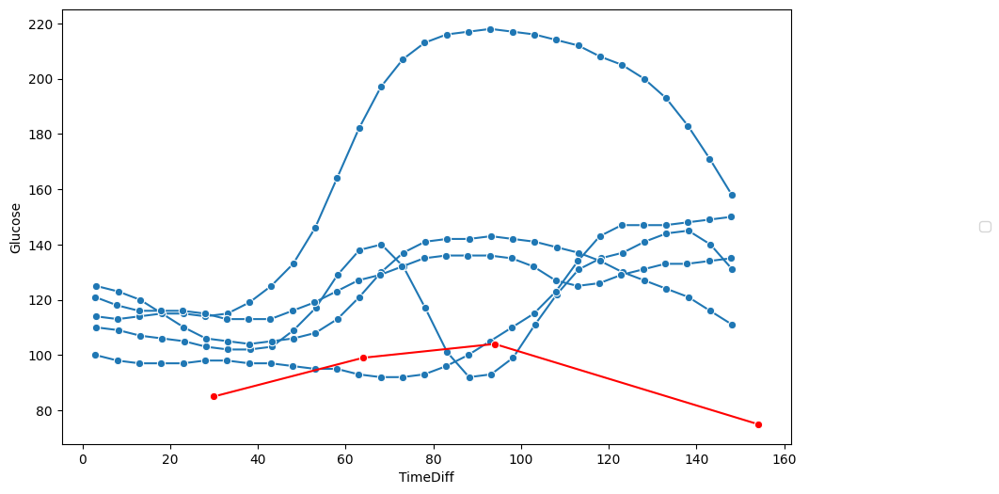

In [101]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=six_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_six, y="Glucose", x="TimeDiff", marker='o',color='red')


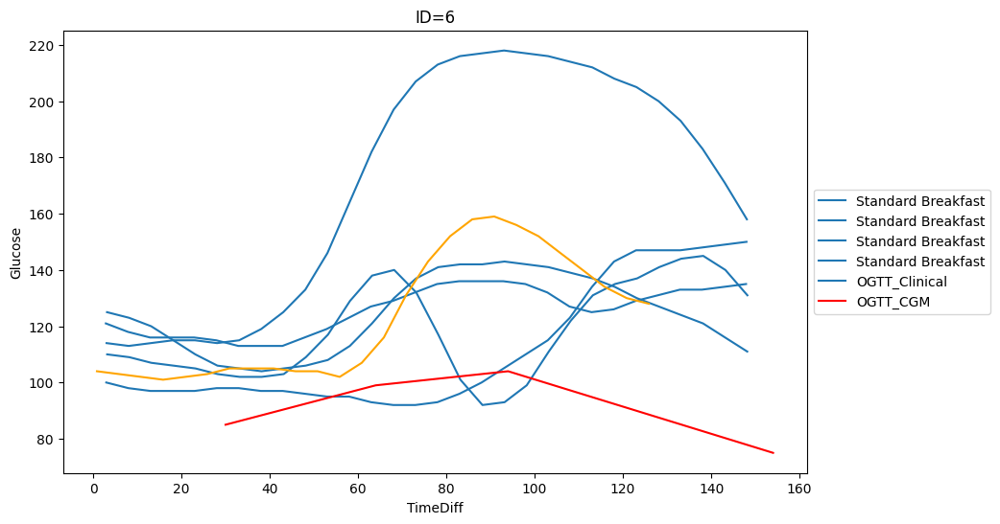

In [102]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=six_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=6')
sns.lineplot(data=df_gtt_six, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_six, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)


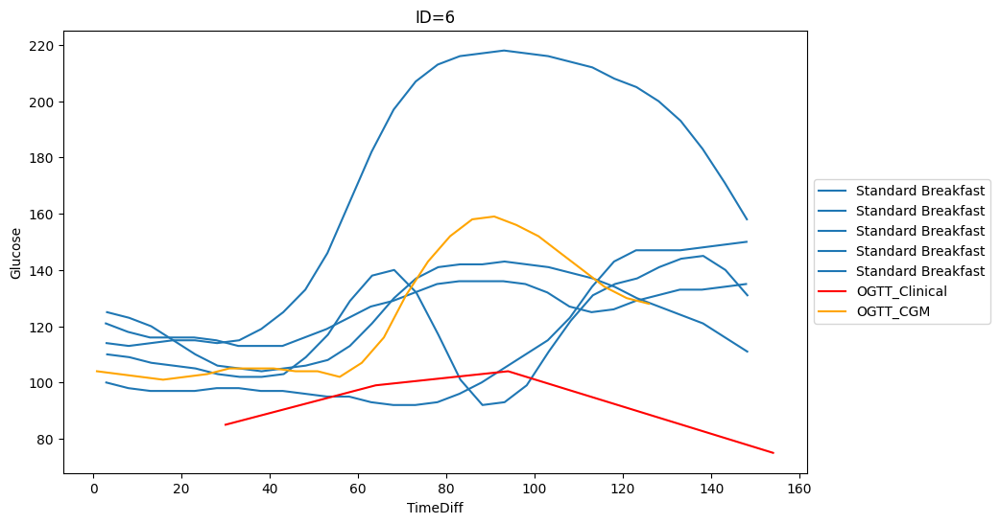

In [103]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=six_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=6')
sns.lineplot(data=df_gtt_six, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_six, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

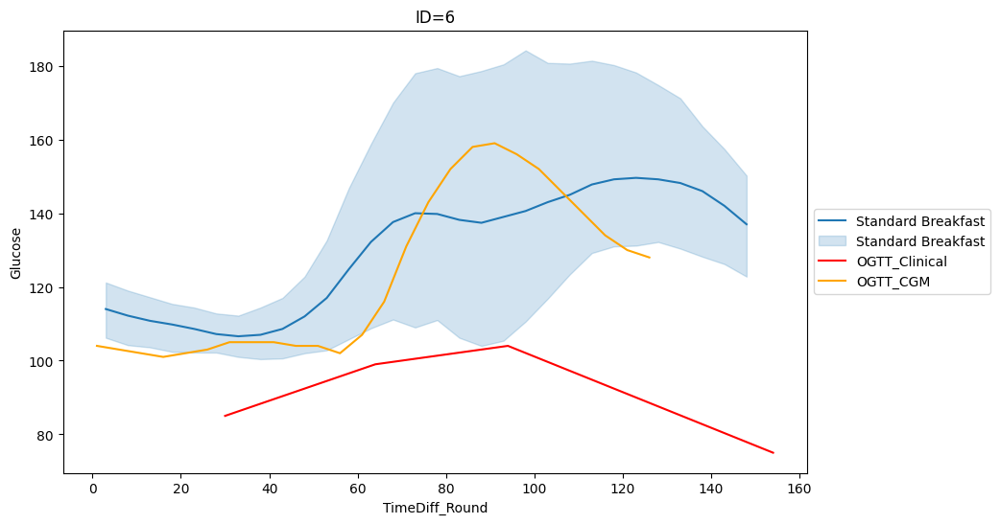

In [104]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=six_ogtt, y="Glucose", x="TimeDiff_Round", palette='bright').set(title='ID=6')
sns.lineplot(data=df_gtt_six, y="Glucose", x="TimeDiff_Round", color='red',estimator=None)
sns.lineplot(data=boost_cgm_six, y="Glucose", x="TimeDiff_Round", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [105]:
boost_sub=boost_cgm_six[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_six[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
ogtt_sub=six_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
boost_sub['id']=6
gtt_sub['id']=6
ogtt_sub['id']=6

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

food_responses=food_responses.append([ogtt_sub,gtt_sub,boost_sub])
food_responses


,TimeDiff,Glucose,Time,date,id,type
80,3.516667,94.0,2019-09-17 06:43:31,2019-09-17,1,standard_meal
81,8.533333,95.0,2019-09-17 06:48:32,2019-09-17,1,standard_meal
82,13.533333,97.0,2019-09-17 06:53:32,2019-09-17,1,standard_meal
83,18.533333,97.0,2019-09-17 06:58:32,2019-09-17,1,standard_meal
84,23.533333,95.0,2019-09-17 07:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2854,105.850000,146.0,2020-03-09 09:07:51,2020-03-09,6,boost_cgm
2855,110.866667,140.0,2020-03-09 09:12:52,2020-03-09,6,boost_cgm
2856,115.850000,134.0,2020-03-09 09:17:51,2020-03-09,6,boost_cgm
2857,120.850000,130.0,2020-03-09 09:22:51,2020-03-09,6,boost_cgm


In [106]:
max_times=six_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
six_ogtt.groupby('date')['TimeDiff_Round'].nunique()

date
2020-02-29    30
2020-03-02    30
2020-03-04    30
2020-03-06    30
2020-03-08    30
Name: TimeDiff_Round, dtype: int64

In [107]:
max_times=six_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
six_ogtt.groupby('date')['TimeDiff_Round'].nunique()

dates=six_ogtt['date'].unique()
df_first_date=six_ogtt[six_ogtt['date']==dates[0]]

# six_ogtt_test=six_ogtt

column_names = six_ogtt.columns.tolist()

# Create an empty DataFrame with the same columns
df_ppgr_grouped_six = pd.DataFrame(columns=column_names)

for i in dates:
  df_date=six_ogtt[six_ogtt['date']==i]
  print(i)
  # df_date['nearest_time'] = df_first_date['TimeDiff'].apply(find_nearest_value)
  result_df = find_nearest_value(df_date, df_first_date, 'TimeDiff_Round', 'TimeDiff_Round')
  df_ppgr_grouped_six=df_ppgr_grouped_six.append(result_df)


# For grouped
boost_sub=boost_cgm_six[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_six[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
# ogtt_sub=six_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
ogtt_sub=df_ppgr_grouped_six[['nearest_TimeDiff_Round','Glucose','timestamp_dt','date']]
boost_sub['id']=6
gtt_sub['id']=6
ogtt_sub['id']=6

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

ogtt_sub.rename(columns={"nearest_TimeDiff_Round": "nearest_time_diff"},inplace=True)
boost_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)
gtt_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)


food_responses_grouped=food_responses_grouped.append([ogtt_sub,gtt_sub,boost_sub])
food_responses_grouped


2020-02-29
2020-03-02
2020-03-04
2020-03-06
2020-03-08


,nearest_time_diff,Glucose,Time,date,id,type
80,4.000000,94.0,2019-09-17 06:43:31,2019-09-17,1,standard_meal
81,9.000000,95.0,2019-09-17 06:48:32,2019-09-17,1,standard_meal
82,14.000000,97.0,2019-09-17 06:53:32,2019-09-17,1,standard_meal
83,19.000000,97.0,2019-09-17 06:58:32,2019-09-17,1,standard_meal
84,24.000000,95.0,2019-09-17 07:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2854,105.850000,146.0,2020-03-09 09:07:51,2020-03-09,6,boost_cgm
2855,110.866667,140.0,2020-03-09 09:12:52,2020-03-09,6,boost_cgm
2856,115.850000,134.0,2020-03-09 09:17:51,2020-03-09,6,boost_cgm
2857,120.850000,130.0,2020-03-09 09:22:51,2020-03-09,6,boost_cgm


In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=ogtt_sub, y="Glucose", x="nearest_time_diff", palette='bright').set(title='ID=6')
sns.lineplot(data=boost_sub, y="Glucose", x="nearest_time_diff", color='red',estimator=None)
sns.lineplot(data=gtt_sub, y="Glucose", x="nearest_time_diff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [108]:
s = '19-007'

GTT = [84,98,76,99]
GTT_times = ['2019-10-24 9:00:00', '2019-10-24 9:35:00', '2019-10-24 10:05:00', '2019-10-24 11:05:00']
GTT_times = pd.to_datetime(GTT_times, format='%Y-%m-%dT%H:%M:%S')

df_gtt_seven = pd.DataFrame({'Glucose': GTT, 'Time': GTT_times})
auc_ogtt_seven=calculate_area_under_curve(df_gtt_seven)
auc_ogtt_seven

11045

In [109]:
# food_seven=pd.read_excel('Food Logs/Food Log/Food_Log_007.xlsx')
# food_seven.head(3)

In [110]:
cgm_seven = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/007/Dexcom_007.csv')
# cgm_seven=pd.read_csv('Wearables + CGM data/007/Dexcom.csv')
cgm_seven['timestamp_dt'] = pd.to_datetime(cgm_seven['Timestamp (YYYY-MM-DDThh:mm:ss)'])
cgm_seven['Glucose'] = cgm_seven['Glucose Value (mg/dL)']
cgm_seven['Time'] = pd.to_datetime(cgm_seven['Timestamp (YYYY-MM-DDThh:mm:ss)'])

cgm_seven = cgm_seven.dropna(subset=['timestamp_dt'])
cgm_seven['date'] = cgm_seven['timestamp_dt'].dt.date
cgm_seven

food_seven = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/007/Food_Log_007.csv')
# food_seven=pd.read_excel('Food Logs/Food Log/Food_Log_007.xlsx')


# food_seven.rename(columns={"time_begin": "time_begin_actual"},inplace=True)
# food_seven['time_begin']=pd.to_datetime(food_seven['date'].astype(str) + ' ' + food_seven['time_begin_actual'].astype(str))


food_seven['date'] = pd.to_datetime(food_seven['date']).dt.date

food_seven['time_begin'] = pd.to_datetime(food_seven['time_begin'])
window_dt = pd.Timedelta(minutes=120)

food_seven["time_begin_win"] = food_seven["time_begin"] + window_dt

merge_food_cgm_seven = pd.merge(cgm_seven, food_seven, left_on=['date'], right_on=['date'])

cf_seven = food_seven[food_seven['Food_Item']=='Std Bfast']

merge_food_cgm_seven = pd.merge(cgm_seven, cf_seven, left_on=['date'], right_on=['date'])
window_dt_brkfst = pd.Timedelta(minutes=-30)

food_cgm_seven_cf = merge_food_cgm_seven[(merge_food_cgm_seven['timestamp_dt'] <= merge_food_cgm_seven['time_begin_win']) & (merge_food_cgm_seven['timestamp_dt'] >= (merge_food_cgm_seven['time_begin']+window_dt_brkfst))]

food_cgm_seven_cf['pre_glu_time'] = food_cgm_seven_cf.groupby('date')['timestamp_dt'].transform('min')

column_names = food_cgm_seven_cf.columns.values
food_cgm_seven_cf_all_dates = pd.DataFrame(columns=column_names)

for i in food_cgm_seven_cf['date'].unique():
    date_sub = food_cgm_seven_cf[food_cgm_seven_cf['date'] == i]

    date_sub = date_sub.sort_values(by='timestamp_dt')
    min_glu = date_sub['Glucose Value (mg/dL)'].iloc[0]
    date_sub['min_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('min_glu')] = min_glu

    final_glu = date_sub['Glucose Value (mg/dL)'].iloc[-1]
    date_sub['final_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('final_glu')] = final_glu

    max_glu = date_sub['Glucose Value (mg/dL)'].max()
    date_sub['max_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('max_glu')] = max_glu

    date_sub['meal_auc'] = calculate_area_under_curve(date_sub)
    date_sub['auc_ogtt_seven'] = auc_ogtt_seven
    j = i - dt.timedelta(days=1)
    cgm_seven_ld = cgm_seven[cgm_seven['date'] == j]

    date_sub['mean_glu_ld'] = cgm_seven_ld.groupby('date')['Glucose'].transform('mean').iloc[0]
    date_sub['interdaycv'] = interdaycv(cgm_seven_ld)
    date_sub['interdaysd'] = interdaysd(cgm_seven_ld)
    date_sub['TIR'] = TIR(cgm_seven_ld, sd=1, sr=5)
    date_sub['TOR'] = TOR(cgm_seven_ld, sd=1, sr=5)
    date_sub['POR'] = POR(cgm_seven_ld, sd=1, sr=5)
    date_sub['PIR'] = PIR(cgm_seven_ld, sd=1, sr=5)
    date_sub['MGE'] = MGE(cgm_seven_ld, sd=1)
    date_sub['MGN'] = MGN(cgm_seven_ld, sd=1)
    # MAGE(cgm_seven, std=1)
    date_sub['J_index'] = J_index(cgm_seven_ld)
    date_sub['LBGI'] = LBGI(cgm_seven_ld)
    date_sub['HBGI'] = HBGI(cgm_seven_ld)
    # MODD(cgm_seven)
    # CONGA24(cgm_seven)
    date_sub['GMI'] = GMI(date_sub)

    food_cgm_seven_cf_all_dates = food_cgm_seven_cf_all_dates.append(date_sub)

seven_ogtt = food_cgm_seven_cf_all_dates

seven_ogtt_dup = seven_ogtt.drop_duplicates(subset=['date'], keep='first')
seven_ogtt_dup['id'] = 7
seven_ogtt_dup['a1c'] = "PD"


In [111]:
# print(food_seven[food_seven['Food_Item']=='Std Bfast'])
# food_seven[food_seven['Food_Item']=='Boost']

In [112]:
window_dt = pd.Timedelta(minutes=160)
boost_time=dt.datetime(2020,3,22,8,30,0)
#8:53:00
# 2019-10-24 9:00:00

# boost_cgm_seven=cgm_seven[(cgm_seven['timestamp_dt']>=boost_time)&(cgm_seven['timestamp_dt']<=boost_time + window_dt)]
boost_cgm_seven=cgm_seven[(cgm_seven['timestamp_dt']>=boost_time)]
boost_cgm_seven.head(4)


,Index,Timestamp (YYYY-MM-DDThh:mm:ss),Event Type,Event Subtype,Patient Info,Device Info,Source Device ID,Glucose Value (mg/dL),Insulin Value (u),Carb Value (grams),Duration (hh:mm:ss),Glucose Rate of Change (mg/dL/min),Transmitter Time (Long Integer),timestamp_dt,Glucose,Time,date
2186,2187,2020-03-22 08:31:57,EGV,NaN,NaN,NaN,Android G6,67.0,NaN,NaN,NaN,NaN,685482.0,2020-03-22 08:31:57,67.0,2020-03-22 08:31:57,2020-03-22
2187,2188,2020-03-22 08:36:57,EGV,NaN,NaN,NaN,Android G6,66.0,NaN,NaN,NaN,NaN,685782.0,2020-03-22 08:36:57,66.0,2020-03-22 08:36:57,2020-03-22
2188,2189,2020-03-22 08:41:57,EGV,NaN,NaN,NaN,Android G6,66.0,NaN,NaN,NaN,NaN,686082.0,2020-03-22 08:41:57,66.0,2020-03-22 08:41:57,2020-03-22
2189,2190,2020-03-22 08:46:57,EGV,NaN,NaN,NaN,Android G6,66.0,NaN,NaN,NaN,NaN,686382.0,2020-03-22 08:46:57,66.0,2020-03-22 08:46:57,2020-03-22


In [113]:
# seven_ogtt['TimeDiff'] = (seven_ogtt['timestamp_dt'] - seven_ogtt['time_begin']).dt.total_seconds()/ 60
seven_ogtt['TimeDiff'] = (seven_ogtt['timestamp_dt'] - (seven_ogtt['time_begin']+window_dt_brkfst)).dt.total_seconds()/ 60

# Group by and use cumcount
seven_ogtt['SequentialTimeValues'] = seven_ogtt.groupby('date').cumcount() + 1

df_gtt_seven['Time']=pd.to_datetime(df_gtt_seven['Time'])

# df_gtt_seven['TimeDiff'] = (df_gtt_seven['Time'] - df_gtt_seven['Time'].min()).dt.total_seconds()/ 60
df_gtt_seven['TimeDiff'] = (df_gtt_seven['Time'] - (df_gtt_seven['Time'].min()+window_dt_brkfst)).dt.total_seconds()/ 60


boost_cgm_seven['TimeDiff'] = (boost_cgm_seven['timestamp_dt'] - boost_time).dt.total_seconds()/ 60


In [114]:
seven_ogtt['TimeDiff_Round']=seven_ogtt['TimeDiff'].round()
df_gtt_seven['TimeDiff_Round']=df_gtt_seven['TimeDiff'].round()
boost_cgm_seven['TimeDiff_Round']=boost_cgm_seven['TimeDiff'].round()

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

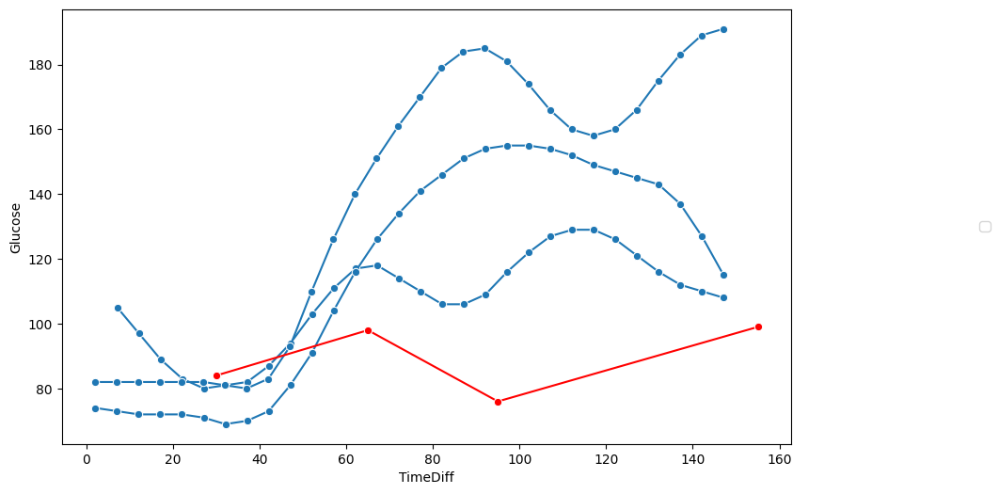

In [115]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=seven_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_seven, y="Glucose", x="TimeDiff", marker='o',color='red')

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

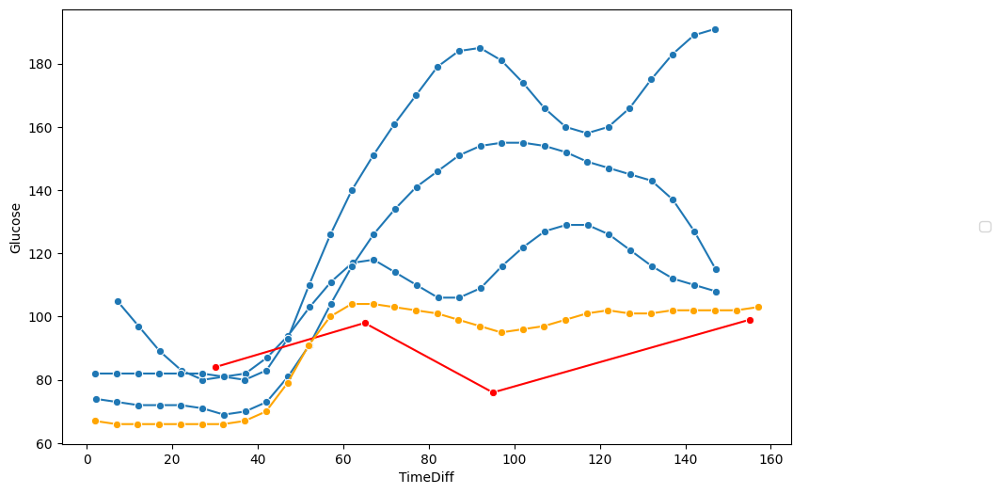

In [116]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=seven_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_seven, y="Glucose", x="TimeDiff", marker='o',color='red')
sns.lineplot(data=boost_cgm_seven, y="Glucose", x="TimeDiff", marker='o',color='orange')

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

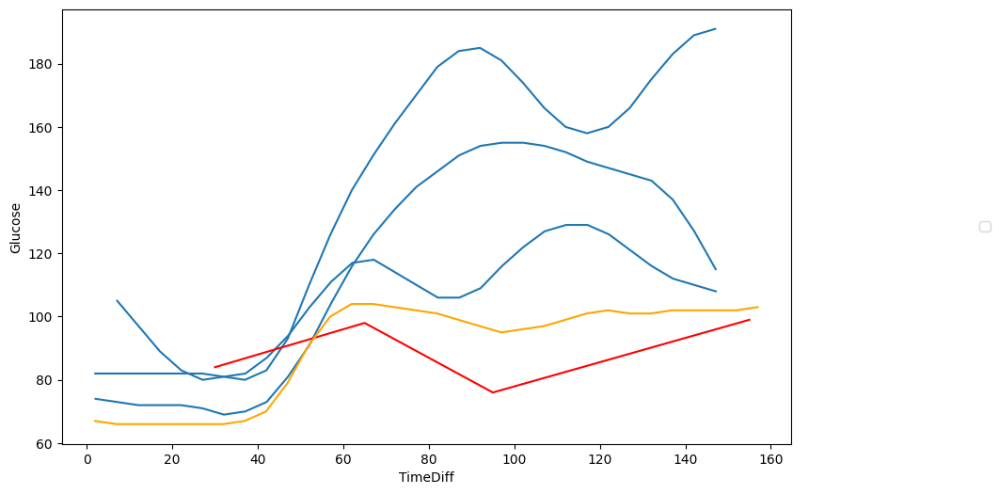

In [117]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=seven_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None)
sns.lineplot(data=df_gtt_seven, y="Glucose", x="TimeDiff",color='red')
sns.lineplot(data=boost_cgm_seven, y="Glucose", x="TimeDiff", color='orange')

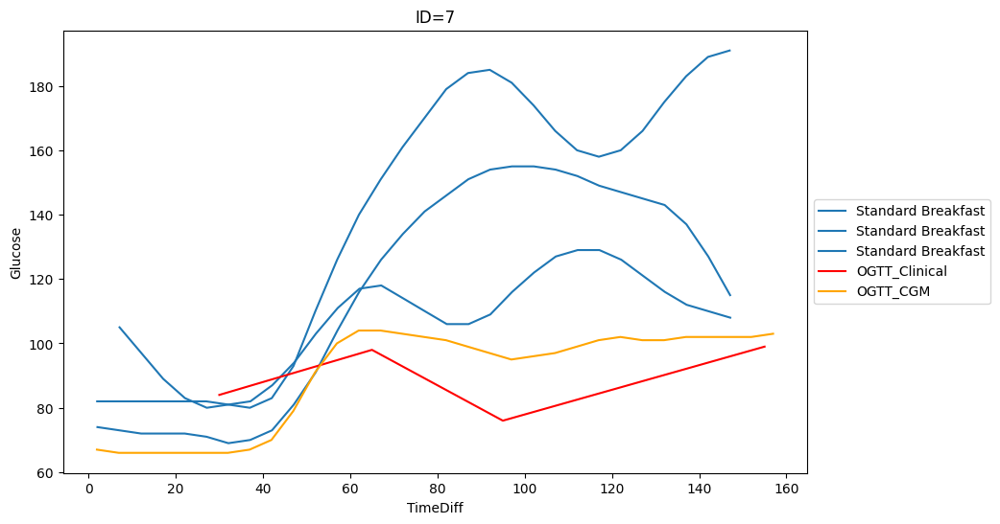

In [118]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=seven_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=7')
sns.lineplot(data=df_gtt_seven, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_seven, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

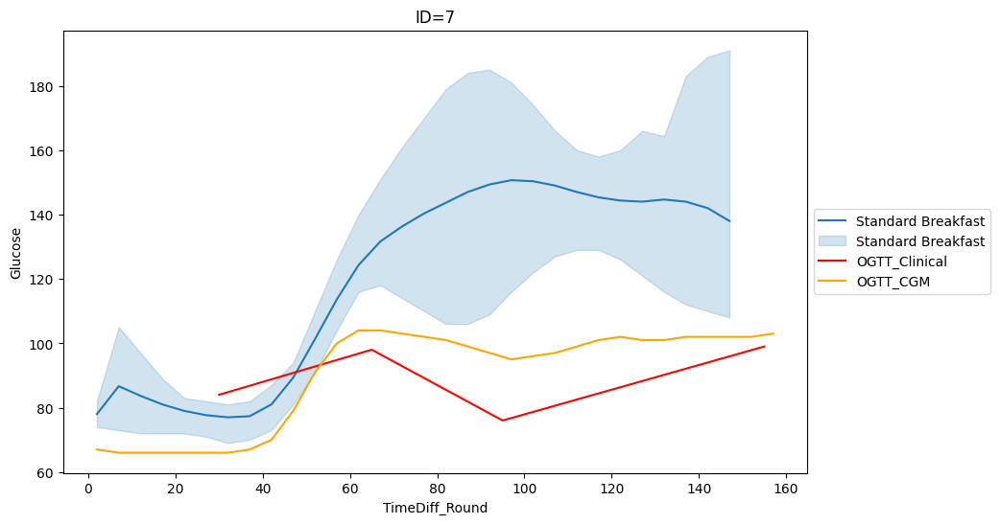

In [119]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=seven_ogtt, y="Glucose", x="TimeDiff_Round").set(title='ID=7')
sns.lineplot(data=df_gtt_seven, y="Glucose", x="TimeDiff_Round", color='red',estimator=None)
sns.lineplot(data=boost_cgm_seven, y="Glucose", x="TimeDiff_Round", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [120]:
boost_sub=boost_cgm_seven[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_seven[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
ogtt_sub=seven_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
boost_sub['id']=7
gtt_sub['id']=7
ogtt_sub['id']=7

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

food_responses=food_responses.append([ogtt_sub,gtt_sub,boost_sub])
food_responses


,TimeDiff,Glucose,Time,date,id,type
80,3.516667,94.0,2019-09-17 06:43:31,2019-09-17,1,standard_meal
81,8.533333,95.0,2019-09-17 06:48:32,2019-09-17,1,standard_meal
82,13.533333,97.0,2019-09-17 06:53:32,2019-09-17,1,standard_meal
83,18.533333,97.0,2019-09-17 06:58:32,2019-09-17,1,standard_meal
84,23.533333,95.0,2019-09-17 07:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2213,136.966667,102.0,2020-03-22 10:46:58,2020-03-22,7,boost_cgm
2214,141.950000,102.0,2020-03-22 10:51:57,2020-03-22,7,boost_cgm
2215,146.950000,102.0,2020-03-22 10:56:57,2020-03-22,7,boost_cgm
2216,151.950000,102.0,2020-03-22 11:01:57,2020-03-22,7,boost_cgm


In [121]:
max_times=seven_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
seven_ogtt.groupby('date')['TimeDiff_Round'].nunique()

date
2020-03-18    29
2020-03-19    30
2020-03-21    30
Name: TimeDiff_Round, dtype: int64

In [122]:
max_times=seven_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
seven_ogtt.groupby('date')['TimeDiff_Round'].nunique()

dates=seven_ogtt['date'].unique()
df_first_date=seven_ogtt[seven_ogtt['date']==dates[1]]

# seven_ogtt_test=seven_ogtt

column_names = seven_ogtt.columns.tolist()

# Create an empty DataFrame with the same columns
df_ppgr_grouped_seven = pd.DataFrame(columns=column_names)

for i in dates:
  df_date=seven_ogtt[seven_ogtt['date']==i]
  print(i)
  # df_date['nearest_time'] = df_first_date['TimeDiff'].apply(find_nearest_value)
  result_df = find_nearest_value(df_date, df_first_date, 'TimeDiff_Round', 'TimeDiff_Round')
  df_ppgr_grouped_seven=df_ppgr_grouped_seven.append(result_df)


# For grouped
boost_sub=boost_cgm_seven[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_seven[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
# ogtt_sub=seven_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
ogtt_sub=df_ppgr_grouped_seven[['nearest_TimeDiff_Round','Glucose','timestamp_dt','date']]
boost_sub['id']=7
gtt_sub['id']=7
ogtt_sub['id']=7

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

ogtt_sub.rename(columns={"nearest_TimeDiff_Round": "nearest_time_diff"},inplace=True)
boost_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)
gtt_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)


food_responses_grouped=food_responses_grouped.append([ogtt_sub,gtt_sub,boost_sub])
food_responses_grouped


2020-03-18
2020-03-19
2020-03-21


,nearest_time_diff,Glucose,Time,date,id,type
80,4.000000,94.0,2019-09-17 06:43:31,2019-09-17,1,standard_meal
81,9.000000,95.0,2019-09-17 06:48:32,2019-09-17,1,standard_meal
82,14.000000,97.0,2019-09-17 06:53:32,2019-09-17,1,standard_meal
83,19.000000,97.0,2019-09-17 06:58:32,2019-09-17,1,standard_meal
84,24.000000,95.0,2019-09-17 07:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2213,136.966667,102.0,2020-03-22 10:46:58,2020-03-22,7,boost_cgm
2214,141.950000,102.0,2020-03-22 10:51:57,2020-03-22,7,boost_cgm
2215,146.950000,102.0,2020-03-22 10:56:57,2020-03-22,7,boost_cgm
2216,151.950000,102.0,2020-03-22 11:01:57,2020-03-22,7,boost_cgm


In [123]:
# food_eight[food_eight['logged_food']=='Frosted Flake']
# food_eight[food_eight['logged_food']=='Boost']

In [123]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=ogtt_sub, y="Glucose", x="nearest_time_diff").set(title='ID=7')
sns.lineplot(data=boost_sub, y="Glucose", x="nearest_time_diff", color='red',estimator=None)
sns.lineplot(data=gtt_sub, y="Glucose", x="nearest_time_diff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [124]:
s = '19-008'

GTT = [90,100,75,100]
GTT_times = ['2019-10-25 9:32:00', '2019-10-25 10:05:00', '2019-10-25 10:35:00', '2019-10-25 11:35:00']
GTT_times = pd.to_datetime(GTT_times, format='%Y-%m-%dT%H:%M:%S')

df_gtt_eight = pd.DataFrame({'Glucose': GTT, 'Time': GTT_times})
auc_ogtt_eight=calculate_area_under_curve(df_gtt_eight)
auc_ogtt_eight

11010

In [125]:
cgm_eight = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/008/Dexcom_008.csv')
cgm_eight['timestamp_dt'] = pd.to_datetime(cgm_eight['Timestamp (YYYY-MM-DDThh:mm:ss)'])
cgm_eight['Glucose'] = cgm_eight['Glucose Value (mg/dL)']
cgm_eight['Time'] = pd.to_datetime(cgm_eight['Timestamp (YYYY-MM-DDThh:mm:ss)'])

cgm_eight = cgm_eight.dropna(subset=['timestamp_dt'])
cgm_eight['date'] = cgm_eight['timestamp_dt'].dt.date
cgm_eight

food_eight = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/008/Food_Log_008.csv')

food_eight['date'] = pd.to_datetime(food_eight['date']).dt.date

food_eight['time_begin'] = pd.to_datetime(food_eight['time_begin'])
window_dt = pd.Timedelta(minutes=120)

food_eight["time_begin_win"] = food_eight["time_begin"] + window_dt

merge_food_cgm_eight = pd.merge(cgm_eight, food_eight, left_on=['date'], right_on=['date'])

cf_eight = food_eight[food_eight['logged_food']=='Frosted Flakes']

merge_food_cgm_eight = pd.merge(cgm_eight, cf_eight, left_on=['date'], right_on=['date'])
window_dt_brkfst = pd.Timedelta(minutes=-30)

food_cgm_eight_cf = merge_food_cgm_eight[(merge_food_cgm_eight['timestamp_dt'] <= merge_food_cgm_eight['time_begin_win']) & (merge_food_cgm_eight['timestamp_dt'] >= (merge_food_cgm_eight['time_begin']+window_dt_brkfst))]

food_cgm_eight_cf['pre_glu_time'] = food_cgm_eight_cf.groupby('date')['timestamp_dt'].transform('min')

column_names = food_cgm_eight_cf.columns.values
food_cgm_eight_cf_all_dates = pd.DataFrame(columns=column_names)

for i in food_cgm_eight_cf['date'].unique():
    date_sub = food_cgm_eight_cf[food_cgm_eight_cf['date'] == i]

    date_sub = date_sub.sort_values(by='timestamp_dt')
    min_glu = date_sub['Glucose Value (mg/dL)'].iloc[0]
    date_sub['min_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('min_glu')] = min_glu

    final_glu = date_sub['Glucose Value (mg/dL)'].iloc[-1]
    date_sub['final_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('final_glu')] = final_glu

    max_glu = date_sub['Glucose Value (mg/dL)'].max()
    date_sub['max_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('max_glu')] = max_glu

    date_sub['meal_auc'] = calculate_area_under_curve(date_sub)
    date_sub['auc_ogtt_eight'] = auc_ogtt_eight
    j = i - dt.timedelta(days=1)
    cgm_eight_ld = cgm_eight[cgm_eight['date'] == j]

    date_sub['mean_glu_ld'] = cgm_eight_ld.groupby('date')['Glucose'].transform('mean').iloc[0]
    date_sub['interdaycv'] = interdaycv(cgm_eight_ld)
    date_sub['interdaysd'] = interdaysd(cgm_eight_ld)
    date_sub['TIR'] = TIR(cgm_eight_ld, sd=1, sr=5)
    date_sub['TOR'] = TOR(cgm_eight_ld, sd=1, sr=5)
    date_sub['POR'] = POR(cgm_eight_ld, sd=1, sr=5)
    date_sub['PIR'] = PIR(cgm_eight_ld, sd=1, sr=5)
    date_sub['MGE'] = MGE(cgm_eight_ld, sd=1)
    date_sub['MGN'] = MGN(cgm_eight_ld, sd=1)
    # MAGE(cgm_eight, std=1)
    date_sub['J_index'] = J_index(cgm_eight_ld)
    date_sub['LBGI'] = LBGI(cgm_eight_ld)
    date_sub['HBGI'] = HBGI(cgm_eight_ld)
    # MODD(cgm_eight)
    # CONGA24(cgm_eight)
    date_sub['GMI'] = GMI(date_sub)

    food_cgm_eight_cf_all_dates = food_cgm_eight_cf_all_dates.append(date_sub)

eight_ogtt = food_cgm_eight_cf_all_dates

eight_ogtt_dup = eight_ogtt.drop_duplicates(subset=['date'], keep='first')
eight_ogtt_dup['id'] = 8
eight_ogtt_dup['a1c'] = "norm"



In [126]:
# merge_sub_eight.rename(columns={'auc_ogtt_eight': 'auc_ogtt'}, inplace=True)

In [127]:
window_dt = pd.Timedelta(minutes=120)
boost_time=dt.datetime(2020,3,23,9,2,0)
#8:53:00
# 2019-10-25 9:32:00

# boost_cgm_eight=cgm_eight[(cgm_eight['timestamp_dt']>=boost_time)&(cgm_eight['timestamp_dt']<=boost_time + window_dt)]
boost_cgm_eight=cgm_eight[(cgm_eight['timestamp_dt']>=boost_time)]

#food_thirteen["time_begin_win"] = food_thirteen["time_begin"] + window_dt

#cgm_thirteen[cgm_thirteen['timestamp_dt']>=dt.datetime(2020,6,4,9,30,0)]

In [128]:
eight_ogtt['TimeDiff'] = (eight_ogtt['timestamp_dt'] - (eight_ogtt['time_begin']+window_dt_brkfst)).dt.total_seconds()/ 60

# Group by and use cumcount
eight_ogtt['SequentialTimeValues'] = eight_ogtt.groupby('date').cumcount() + 1

df_gtt_eight['Time']=pd.to_datetime(df_gtt_eight['Time'])

# df_gtt_eight['TimeDiff'] = (df_gtt_eight['Time'] - df_gtt_eight['Time'].min()).dt.total_seconds()/ 60
df_gtt_eight['TimeDiff'] = (df_gtt_eight['Time'] - (df_gtt_eight['Time'].min()+window_dt_brkfst)).dt.total_seconds()/ 60


boost_cgm_eight['TimeDiff'] = (boost_cgm_eight['timestamp_dt'] - boost_time).dt.total_seconds()/ 60



In [129]:
eight_ogtt['TimeDiff_Round']=eight_ogtt['TimeDiff'].round()
df_gtt_eight['TimeDiff_Round']=df_gtt_eight['TimeDiff'].round()
boost_cgm_eight['TimeDiff_Round']=boost_cgm_eight['TimeDiff'].round()

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

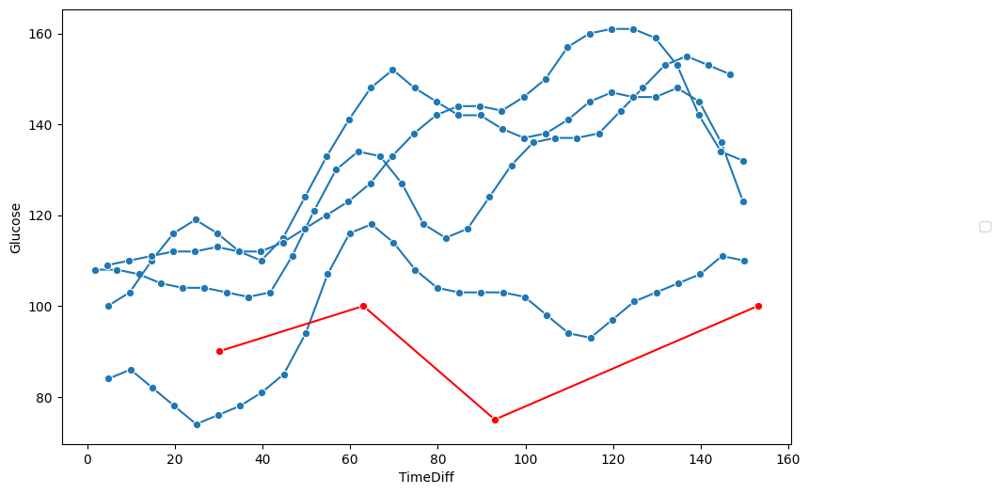

In [130]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=eight_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_eight, y="Glucose", x="TimeDiff", marker='o',color='red')

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

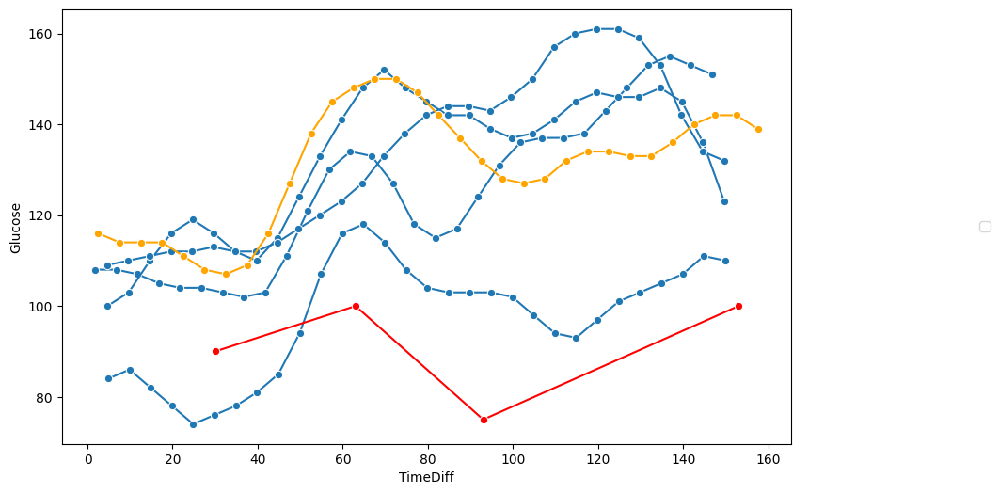

In [131]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=eight_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_eight, y="Glucose", x="TimeDiff", marker='o',color='red')
sns.lineplot(data=boost_cgm_eight, y="Glucose", x="TimeDiff", marker='o',color='orange')

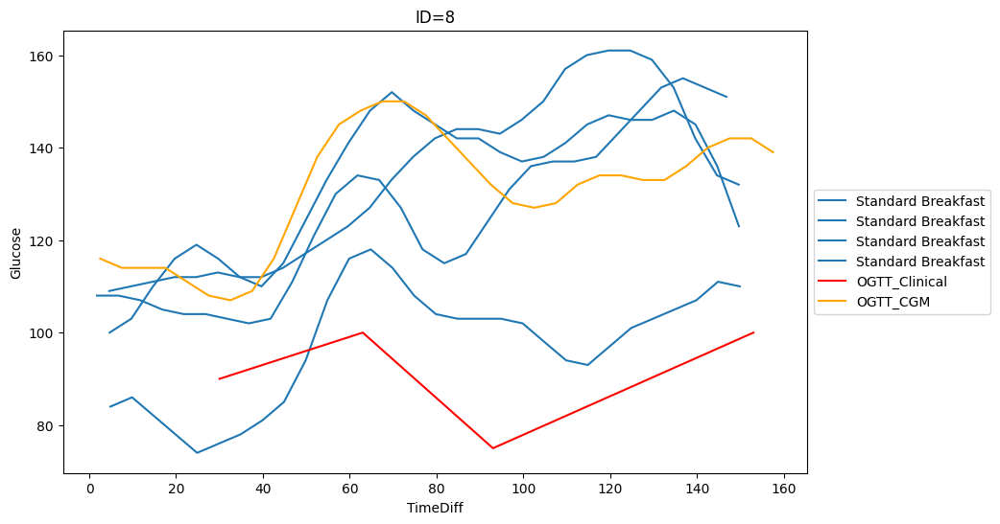

In [132]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=eight_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=8')
sns.lineplot(data=df_gtt_eight, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_eight, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

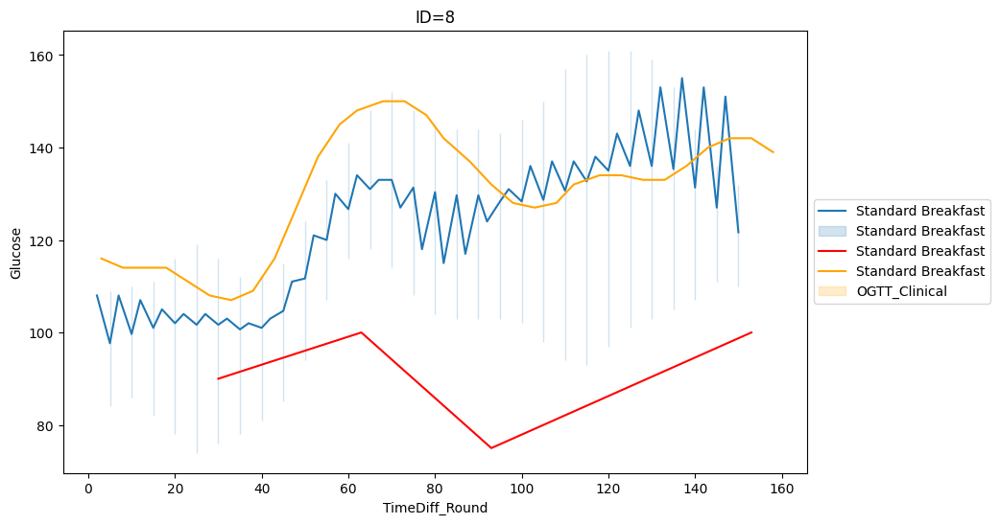

In [133]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=eight_ogtt, y="Glucose", x="TimeDiff_Round", palette='bright').set(title='ID=8')
sns.lineplot(data=df_gtt_eight, y="Glucose", x="TimeDiff_Round", color='red',estimator=None)
sns.lineplot(data=boost_cgm_eight, y="Glucose", x="TimeDiff_Round", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [134]:
boost_sub=boost_cgm_eight[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_eight[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
ogtt_sub=eight_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
boost_sub['id']=8
gtt_sub['id']=8
ogtt_sub['id']=8

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

food_responses=food_responses.append([ogtt_sub,gtt_sub,boost_sub])
food_responses


,TimeDiff,Glucose,Time,date,id,type
80,3.516667,94.0,2019-09-17 06:43:31,2019-09-17,1,standard_meal
81,8.533333,95.0,2019-09-17 06:48:32,2019-09-17,1,standard_meal
82,13.533333,97.0,2019-09-17 06:53:32,2019-09-17,1,standard_meal
83,18.533333,97.0,2019-09-17 06:58:32,2019-09-17,1,standard_meal
84,23.533333,95.0,2019-09-17 07:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2511,137.516667,136.0,2020-03-23 11:19:31,2020-03-23,8,boost_cgm
2512,142.516667,140.0,2020-03-23 11:24:31,2020-03-23,8,boost_cgm
2513,147.516667,142.0,2020-03-23 11:29:31,2020-03-23,8,boost_cgm
2514,152.516667,142.0,2020-03-23 11:34:31,2020-03-23,8,boost_cgm


In [135]:
max_times=eight_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
eight_ogtt.groupby('date')['TimeDiff_Round'].nunique()

date
2020-03-15    30
2020-03-17    30
2020-03-19    30
2020-03-21    30
Name: TimeDiff_Round, dtype: int64

In [136]:
max_times=eight_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
eight_ogtt.groupby('date')['TimeDiff_Round'].nunique()

dates=eight_ogtt['date'].unique()
df_first_date=eight_ogtt[eight_ogtt['date']==dates[0]]

# eight_ogtt_test=eight_ogtt

column_names = eight_ogtt.columns.tolist()

# Create an empty DataFrame with the same columns
df_ppgr_grouped_eight = pd.DataFrame(columns=column_names)

for i in dates:
  df_date=eight_ogtt[eight_ogtt['date']==i]
  print(i)
  # df_date['nearest_time'] = df_first_date['TimeDiff'].apply(find_nearest_value)
  result_df = find_nearest_value(df_date, df_first_date, 'TimeDiff_Round', 'TimeDiff_Round')
  df_ppgr_grouped_eight=df_ppgr_grouped_eight.append(result_df)


# For grouped
boost_sub=boost_cgm_eight[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_eight[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
# ogtt_sub=eight_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
ogtt_sub=df_ppgr_grouped_eight[['nearest_TimeDiff_Round','Glucose','timestamp_dt','date']]
boost_sub['id']=8
gtt_sub['id']=8
ogtt_sub['id']=8

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

ogtt_sub.rename(columns={"nearest_TimeDiff_Round": "nearest_time_diff"},inplace=True)
boost_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)
gtt_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)


food_responses_grouped=food_responses_grouped.append([ogtt_sub,gtt_sub,boost_sub])
food_responses_grouped


2020-03-15
2020-03-17
2020-03-19
2020-03-21


,nearest_time_diff,Glucose,Time,date,id,type
80,4.000000,94.0,2019-09-17 06:43:31,2019-09-17,1,standard_meal
81,9.000000,95.0,2019-09-17 06:48:32,2019-09-17,1,standard_meal
82,14.000000,97.0,2019-09-17 06:53:32,2019-09-17,1,standard_meal
83,19.000000,97.0,2019-09-17 06:58:32,2019-09-17,1,standard_meal
84,24.000000,95.0,2019-09-17 07:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2511,137.516667,136.0,2020-03-23 11:19:31,2020-03-23,8,boost_cgm
2512,142.516667,140.0,2020-03-23 11:24:31,2020-03-23,8,boost_cgm
2513,147.516667,142.0,2020-03-23 11:29:31,2020-03-23,8,boost_cgm
2514,152.516667,142.0,2020-03-23 11:34:31,2020-03-23,8,boost_cgm


In [ ]:
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=ogtt_sub, y="Glucose", x="nearest_time_diff", palette='bright').set(title='ID=8')
sns.lineplot(data=boost_sub, y="Glucose", x="nearest_time_diff", color='red',estimator=None)
sns.lineplot(data=gtt_sub, y="Glucose", x="nearest_time_diff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [137]:
s = '19-009'

GTT = [121,138,143,109]
GTT_times = ['2019-10-31 8:53:00', '2019-10-31 9:25:00', '2019-10-31 9:55:00', '2019-10-31 10:55:00']
GTT_times = pd.to_datetime(GTT_times, format='%Y-%m-%dT%H:%M:%S')

df_gtt_nine = pd.DataFrame({'Glucose': GTT, 'Time': GTT_times})
auc_ogtt_nine=calculate_area_under_curve(df_gtt_nine)
auc_ogtt_nine

15919

In [138]:
cgm_nine = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/009/Dexcom_009.csv')
cgm_nine['timestamp_dt'] = pd.to_datetime(cgm_nine['Timestamp (YYYY-MM-DDThh:mm:ss)'])
cgm_nine['Glucose'] = cgm_nine['Glucose Value (mg/dL)']
cgm_nine['Time'] = pd.to_datetime(cgm_nine['Timestamp (YYYY-MM-DDThh:mm:ss)'])

cgm_nine = cgm_nine.dropna(subset=['timestamp_dt'])
cgm_nine['date'] = cgm_nine['timestamp_dt'].dt.date
cgm_nine

food_nine = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/009/Food_Log_009.csv')

food_nine['date'] = pd.to_datetime(food_nine['date']).dt.date

food_nine['time_begin'] = pd.to_datetime(food_nine['time_begin'])
window_dt = pd.Timedelta(minutes=120)

food_nine["time_begin_win"] = food_nine["time_begin"] + window_dt

merge_food_cgm_nine = pd.merge(cgm_nine, food_nine, left_on=['date'], right_on=['date'])

cf_nine = food_nine[food_nine['logged_food']=='Frosted Flakes']

merge_food_cgm_nine = pd.merge(cgm_nine, cf_nine, left_on=['date'], right_on=['date'])
window_dt_brkfst = pd.Timedelta(minutes=-30)

food_cgm_nine_cf = merge_food_cgm_nine[(merge_food_cgm_nine['timestamp_dt'] <= merge_food_cgm_nine['time_begin_win']) & (merge_food_cgm_nine['timestamp_dt'] >= (merge_food_cgm_nine['time_begin']+window_dt_brkfst))]

food_cgm_nine_cf['pre_glu_time'] = food_cgm_nine_cf.groupby('date')['timestamp_dt'].transform('min')

column_names = food_cgm_nine_cf.columns.values
food_cgm_nine_cf_all_dates = pd.DataFrame(columns=column_names)

for i in food_cgm_nine_cf['date'].unique():
    date_sub = food_cgm_nine_cf[food_cgm_nine_cf['date'] == i]

    date_sub = date_sub.sort_values(by='timestamp_dt')
    min_glu = date_sub['Glucose Value (mg/dL)'].iloc[0]
    date_sub['min_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('min_glu')] = min_glu

    final_glu = date_sub['Glucose Value (mg/dL)'].iloc[-1]
    date_sub['final_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('final_glu')] = final_glu

    max_glu = date_sub['Glucose Value (mg/dL)'].max()
    date_sub['max_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('max_glu')] = max_glu

    date_sub['meal_auc'] = calculate_area_under_curve(date_sub)
    date_sub['auc_ogtt_nine'] = auc_ogtt_nine
    j = i - dt.timedelta(days=1)
    cgm_nine_ld = cgm_nine[cgm_nine['date'] == j]

    date_sub['mean_glu_ld'] = cgm_nine_ld.groupby('date')['Glucose'].transform('mean').iloc[0]
    date_sub['interdaycv'] = interdaycv(cgm_nine_ld)
    date_sub['interdaysd'] = interdaysd(cgm_nine_ld)
    date_sub['TIR'] = TIR(cgm_nine_ld, sd=1, sr=5)
    date_sub['TOR'] = TOR(cgm_nine_ld, sd=1, sr=5)
    date_sub['POR'] = POR(cgm_nine_ld, sd=1, sr=5)
    date_sub['PIR'] = PIR(cgm_nine_ld, sd=1, sr=5)
    date_sub['MGE'] = MGE(cgm_nine_ld, sd=1)
    date_sub['MGN'] = MGN(cgm_nine_ld, sd=1)
    # MAGE(cgm_nine, std=1)
    date_sub['J_index'] = J_index(cgm_nine_ld)
    date_sub['LBGI'] = LBGI(cgm_nine_ld)
    date_sub['HBGI'] = HBGI(cgm_nine_ld)
    # MODD(cgm_nine)
    # CONGA24(cgm_nine)
    date_sub['GMI'] = GMI(date_sub)

    food_cgm_nine_cf_all_dates = food_cgm_nine_cf_all_dates.append(date_sub)

nine_ogtt = food_cgm_nine_cf_all_dates

nine_ogtt_dup = nine_ogtt.drop_duplicates(subset=['date'], keep='first')
nine_ogtt_dup['id'] = 9
nine_ogtt_dup['a1c'] = "PD"



In [139]:
# merge_sub_nine.rename(columns={'auc_ogtt_nine': 'auc_ogtt'}, inplace=True)

In [140]:
# food_nine[food_nine['logged_food']=='Frosted Flake']
# food_nine[food_nine['logged_food']=='Boost']

In [141]:
window_dt = pd.Timedelta(minutes=120)
boost_time=dt.datetime(2020,3,29,8,23,0)
#8:53:00
# 2019-10-31 8:53:00

# boost_cgm_nine=cgm_nine[(cgm_nine['timestamp_dt']>=boost_time)&(cgm_nine['timestamp_dt']<=boost_time + window_dt)]
boost_cgm_nine=cgm_nine[(cgm_nine['timestamp_dt']>=boost_time)]


#food_thirteen["time_begin_win"] = food_thirteen["time_begin"] + window_dt

#cgm_thirteen[cgm_thirteen['timestamp_dt']>=dt.datetime(2020,6,4,9,30,0)]

In [142]:
# nine_ogtt['TimeDiff'] = (nine_ogtt['timestamp_dt'] - nine_ogtt['time_begin']).dt.total_seconds()/ 60
nine_ogtt['TimeDiff'] = (nine_ogtt['timestamp_dt'] - (nine_ogtt['time_begin']+window_dt_brkfst)).dt.total_seconds()/ 60

# Group by and use cumcount
nine_ogtt['SequentialTimeValues'] = nine_ogtt.groupby('date').cumcount() + 1

df_gtt_nine['Time']=pd.to_datetime(df_gtt_nine['Time'])

# df_gtt_nine['TimeDiff'] = (df_gtt_nine['Time'] - df_gtt_nine['Time'].min()).dt.total_seconds()/ 60
df_gtt_nine['TimeDiff'] = (df_gtt_nine['Time'] - (df_gtt_nine['Time'].min()+window_dt_brkfst)).dt.total_seconds()/ 60


boost_cgm_nine['TimeDiff'] = (boost_cgm_nine['timestamp_dt'] - boost_time).dt.total_seconds()/ 60


In [143]:
nine_ogtt['TimeDiff_Round']=nine_ogtt['TimeDiff'].round()
df_gtt_nine['TimeDiff_Round']=df_gtt_nine['TimeDiff'].round()
boost_cgm_nine['TimeDiff_Round']=boost_cgm_nine['TimeDiff'].round()

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

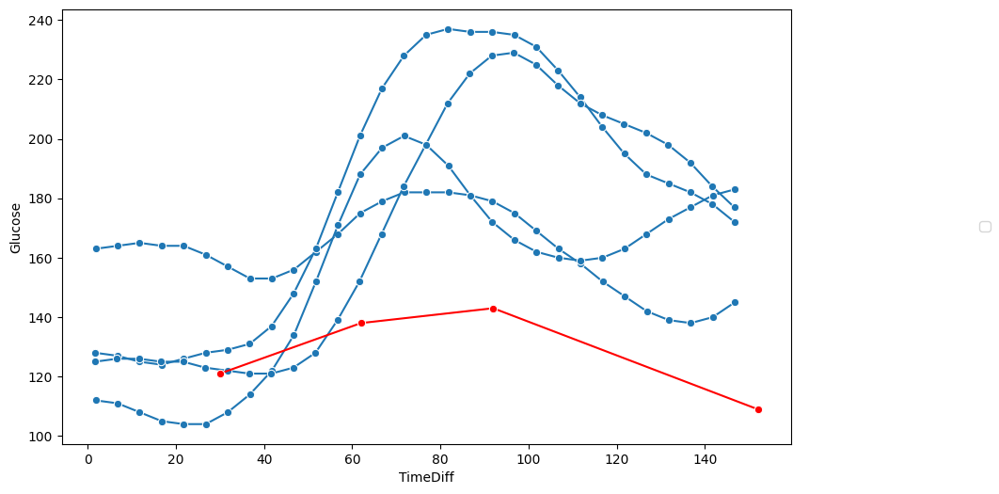

In [144]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=nine_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_nine, y="Glucose", x="TimeDiff", marker='o',color='red')

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

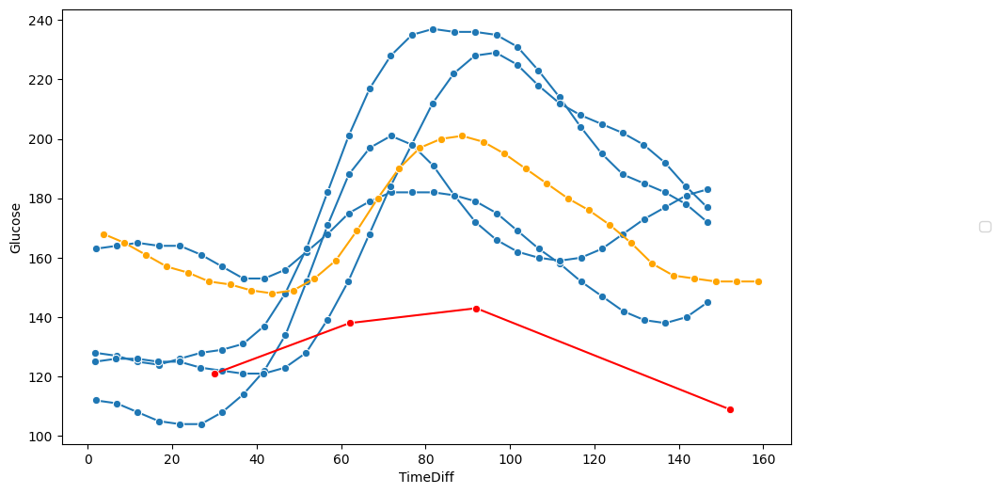

In [145]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=nine_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_nine, y="Glucose", x="TimeDiff", marker='o',color='red')
sns.lineplot(data=boost_cgm_nine, y="Glucose", x="TimeDiff", marker='o',color='orange')

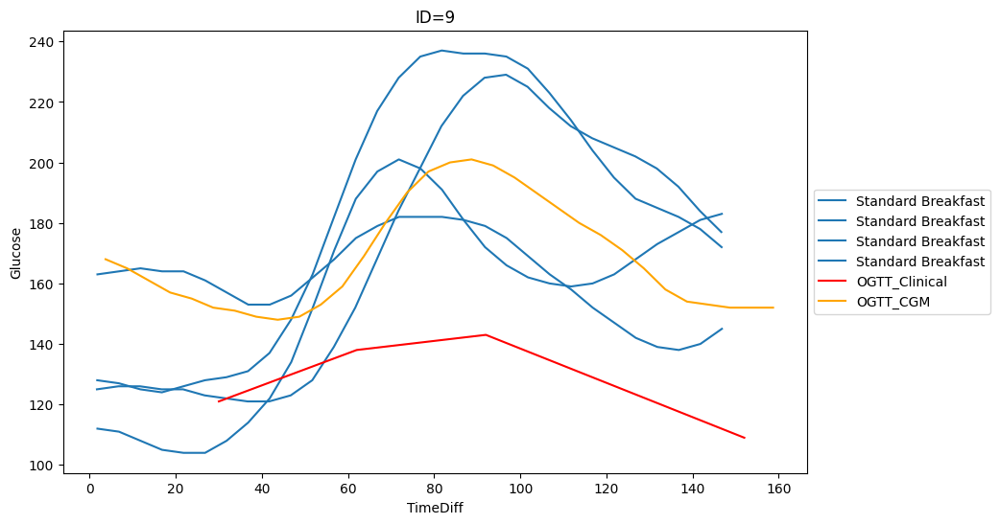

In [146]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=nine_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=9')
sns.lineplot(data=df_gtt_nine, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_nine, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

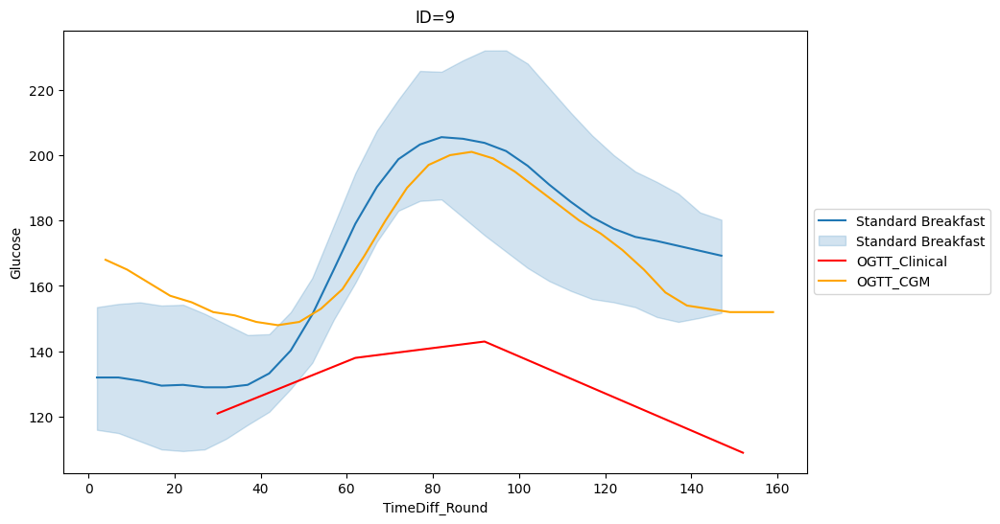

In [147]:
 import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=nine_ogtt, y="Glucose", x="TimeDiff_Round", palette='bright').set(title='ID=9')
sns.lineplot(data=df_gtt_nine, y="Glucose", x="TimeDiff_Round", color='red',estimator=None)
sns.lineplot(data=boost_cgm_nine, y="Glucose", x="TimeDiff_Round", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [148]:
boost_sub=boost_cgm_nine[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_nine[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
ogtt_sub=nine_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
boost_sub['id']=9
gtt_sub['id']=9
ogtt_sub['id']=9

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

food_responses=food_responses.append([ogtt_sub,gtt_sub,boost_sub])
food_responses


,TimeDiff,Glucose,Time,date,id,type
80,3.516667,94.0,2019-09-17 06:43:31,2019-09-17,1,standard_meal
81,8.533333,95.0,2019-09-17 06:48:32,2019-09-17,1,standard_meal
82,13.533333,97.0,2019-09-17 06:53:32,2019-09-17,1,standard_meal
83,18.533333,97.0,2019-09-17 06:58:32,2019-09-17,1,standard_meal
84,23.533333,95.0,2019-09-17 07:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2312,138.683333,154.0,2020-03-29 10:41:41,2020-03-29,9,boost_cgm
2313,143.683333,153.0,2020-03-29 10:46:41,2020-03-29,9,boost_cgm
2314,148.683333,152.0,2020-03-29 10:51:41,2020-03-29,9,boost_cgm
2315,153.683333,152.0,2020-03-29 10:56:41,2020-03-29,9,boost_cgm


In [149]:
max_times=nine_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
nine_ogtt.groupby('date')['TimeDiff_Round'].nunique()


date
2020-03-22    30
2020-03-24    30
2020-03-26    30
2020-03-28    30
Name: TimeDiff_Round, dtype: int64

In [150]:
# df_ppgr_grouped_nine

NameError: name 'df_ppgr_grouped_nine' is not defined

In [151]:
max_times=nine_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
nine_ogtt.groupby('date')['TimeDiff_Round'].nunique()

dates=nine_ogtt['date'].unique()
df_first_date=nine_ogtt[nine_ogtt['date']==dates[0]]

# nine_ogtt_test=nine_ogtt

column_names = nine_ogtt.columns.tolist()

# Create an empty DataFrame with the same columns
df_ppgr_grouped_nine = pd.DataFrame(columns=column_names)

for i in dates:
  df_date=nine_ogtt[nine_ogtt['date']==i]
  print(i)
  # df_date['nearest_time'] = df_first_date['TimeDiff'].apply(find_nearest_value)
  result_df = find_nearest_value(df_date, df_first_date, 'TimeDiff_Round', 'TimeDiff_Round')
  df_ppgr_grouped_nine=df_ppgr_grouped_nine.append(result_df)


# For grouped
boost_sub=boost_cgm_nine[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_nine[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
# ogtt_sub=nine_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
ogtt_sub=df_ppgr_grouped_nine[['nearest_TimeDiff_Round','Glucose','timestamp_dt','date']]
boost_sub['id']=9
gtt_sub['id']=9
ogtt_sub['id']=9

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

ogtt_sub.rename(columns={"nearest_TimeDiff_Round": "nearest_time_diff"},inplace=True)
boost_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)
gtt_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)


food_responses_grouped=food_responses_grouped.append([ogtt_sub,gtt_sub,boost_sub])
food_responses_grouped


2020-03-22
2020-03-24
2020-03-26
2020-03-28


,nearest_time_diff,Glucose,Time,date,id,type
80,4.000000,94.0,2019-09-17 06:43:31,2019-09-17,1,standard_meal
81,9.000000,95.0,2019-09-17 06:48:32,2019-09-17,1,standard_meal
82,14.000000,97.0,2019-09-17 06:53:32,2019-09-17,1,standard_meal
83,19.000000,97.0,2019-09-17 06:58:32,2019-09-17,1,standard_meal
84,24.000000,95.0,2019-09-17 07:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2312,138.683333,154.0,2020-03-29 10:41:41,2020-03-29,9,boost_cgm
2313,143.683333,153.0,2020-03-29 10:46:41,2020-03-29,9,boost_cgm
2314,148.683333,152.0,2020-03-29 10:51:41,2020-03-29,9,boost_cgm
2315,153.683333,152.0,2020-03-29 10:56:41,2020-03-29,9,boost_cgm


In [ ]:
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=ogtt_sub, y="Glucose", x="nearest_time_diff", palette='bright').set(title='ID=9')
sns.lineplot(data=boost_sub, y="Glucose", x="nearest_time_diff", color='red',estimator=None)
sns.lineplot(data=gtt_sub, y="Glucose", x="nearest_time_diff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [152]:
s = '19-010'
Starttime = pd.to_datetime('2019-11-01 7:00:00', format='%Y-%m-%dT%H:%M:%S')
Endtime = pd.to_datetime('2019-11-01 10:00:00', format='%Y-%m-%dT%H:%M:%S')

GTT = [82,111,98,70]
GTT_times = ['2019-11-01 7:09:00', '2019-11-01 7:40:00', '2019-11-01 8:10:00', '2019-11-01 9:10:00']
GTT_times = pd.to_datetime(GTT_times, format='%Y-%m-%dT%H:%M:%S')

df_gtt_ten = pd.DataFrame({'Glucose': GTT, 'Time': GTT_times})
auc_ogtt_ten=calculate_area_under_curve(df_gtt_ten)
auc_ogtt_ten

11166

In [153]:
cgm_ten = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/010/Dexcom_010.csv')
cgm_ten['timestamp_dt'] = pd.to_datetime(cgm_ten['Timestamp (YYYY-MM-DDThh:mm:ss)'])
cgm_ten['Glucose'] = cgm_ten['Glucose Value (mg/dL)']
cgm_ten['Time'] = pd.to_datetime(cgm_ten['Timestamp (YYYY-MM-DDThh:mm:ss)'])

cgm_ten = cgm_ten.dropna(subset=['timestamp_dt'])
cgm_ten['date'] = cgm_ten['timestamp_dt'].dt.date
cgm_ten

food_ten = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/010/Food_Log_010.csv')

food_ten['date'] = pd.to_datetime(food_ten['date']).dt.date

food_ten['time_begin'] = pd.to_datetime(food_ten['time_begin'])
window_dt = pd.Timedelta(minutes=120)

food_ten["time_begin_win"] = food_ten["time_begin"] + window_dt

merge_food_cgm_ten = pd.merge(cgm_ten, food_ten, left_on=['date'], right_on=['date'])

cf_ten = food_ten[food_ten['logged_food']=='Frosted Flakes']

merge_food_cgm_ten = pd.merge(cgm_ten, cf_ten, left_on=['date'], right_on=['date'])
window_dt_brkfst = pd.Timedelta(minutes=-30)

food_cgm_ten_cf = merge_food_cgm_ten[(merge_food_cgm_ten['timestamp_dt'] <= merge_food_cgm_ten['time_begin_win']) & (merge_food_cgm_ten['timestamp_dt'] >= (merge_food_cgm_ten['time_begin']+window_dt_brkfst))]

food_cgm_ten_cf['pre_glu_time'] = food_cgm_ten_cf.groupby('date')['timestamp_dt'].transform('min')

column_names = food_cgm_ten_cf.columns.values
food_cgm_ten_cf_all_dates = pd.DataFrame(columns=column_names)

for i in food_cgm_ten_cf['date'].unique():
    date_sub = food_cgm_ten_cf[food_cgm_ten_cf['date'] == i]

    date_sub = date_sub.sort_values(by='timestamp_dt')
    min_glu = date_sub['Glucose Value (mg/dL)'].iloc[0]
    date_sub['min_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('min_glu')] = min_glu

    final_glu = date_sub['Glucose Value (mg/dL)'].iloc[-1]
    date_sub['final_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('final_glu')] = final_glu

    max_glu = date_sub['Glucose Value (mg/dL)'].max()
    date_sub['max_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('max_glu')] = max_glu

    date_sub['meal_auc'] = calculate_area_under_curve(date_sub)
    date_sub['auc_ogtt_ten'] = auc_ogtt_ten
    j = i - dt.timedelta(days=1)
    cgm_ten_ld = cgm_ten[cgm_ten['date'] == j]

    date_sub['mean_glu_ld'] = cgm_ten_ld.groupby('date')['Glucose'].transform('mean').iloc[0]
    date_sub['interdaycv'] = interdaycv(cgm_ten_ld)
    date_sub['interdaysd'] = interdaysd(cgm_ten_ld)
    date_sub['TIR'] = TIR(cgm_ten_ld, sd=1, sr=5)
    date_sub['TOR'] = TOR(cgm_ten_ld, sd=1, sr=5)
    date_sub['POR'] = POR(cgm_ten_ld, sd=1, sr=5)
    date_sub['PIR'] = PIR(cgm_ten_ld, sd=1, sr=5)
    date_sub['MGE'] = MGE(cgm_ten_ld, sd=1)
    date_sub['MGN'] = MGN(cgm_ten_ld, sd=1)
    # MAGE(cgm_ten, std=1)
    date_sub['J_index'] = J_index(cgm_ten_ld)
    date_sub['LBGI'] = LBGI(cgm_ten_ld)
    date_sub['HBGI'] = HBGI(cgm_ten_ld)
    # MODD(cgm_ten)
    # CONGA24(cgm_ten)
    date_sub['GMI'] = GMI(date_sub)

    food_cgm_ten_cf_all_dates = food_cgm_ten_cf_all_dates.append(date_sub)

ten_ogtt = food_cgm_ten_cf_all_dates

ten_ogtt_dup = ten_ogtt.drop_duplicates(subset=['date'], keep='first')
ten_ogtt_dup['id'] = 10
ten_ogtt_dup['a1c'] = "PD"


In [ ]:
# ten_ogtt.head()

In [ ]:
# food_ten[food_ten['logged_food']=='Frosted Flakes']

In [ ]:
# food_ten[food_ten['logged_food']=='Boost']

In [154]:
window_dt = pd.Timedelta(minutes=120)
boost_time=dt.datetime(2020,3,30,6,39,0)
#8:53:00
# 2019-10-31 8:53:00
# 2019-11-01 7:09:00
# boost_cgm_ten=cgm_ten[(cgm_ten['timestamp_dt']>=boost_time)&(cgm_ten['timestamp_dt']<=boost_time + window_dt)]
boost_cgm_ten=cgm_ten[(cgm_ten['timestamp_dt']>=boost_time)]


In [155]:

# ten_ogtt['TimeDiff'] = (ten_ogtt['timestamp_dt'] - ten_ogtt['time_begin']).dt.total_seconds()/ 60
ten_ogtt['TimeDiff'] = (ten_ogtt['timestamp_dt'] - (ten_ogtt['time_begin']+window_dt_brkfst)).dt.total_seconds()/ 60

# Group by and use cumcount
ten_ogtt['SequentialTimeValues'] = ten_ogtt.groupby('date').cumcount() + 1

df_gtt_ten['Time']=pd.to_datetime(df_gtt_ten['Time'])

# df_gtt_ten['TimeDiff'] = (df_gtt_ten['Time'] - df_gtt_ten['Time'].min()).dt.total_seconds()/ 60
df_gtt_ten['TimeDiff'] = (df_gtt_ten['Time'] - (df_gtt_ten['Time'].min()+window_dt_brkfst)).dt.total_seconds()/ 60


boost_cgm_ten['TimeDiff'] = (boost_cgm_ten['timestamp_dt'] - boost_time).dt.total_seconds()/ 60


In [156]:
ten_ogtt['TimeDiff_Round']=ten_ogtt['TimeDiff'].round()
df_gtt_ten['TimeDiff_Round']=df_gtt_ten['TimeDiff'].round()
boost_cgm_ten['TimeDiff_Round']=boost_cgm_ten['TimeDiff'].round()

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

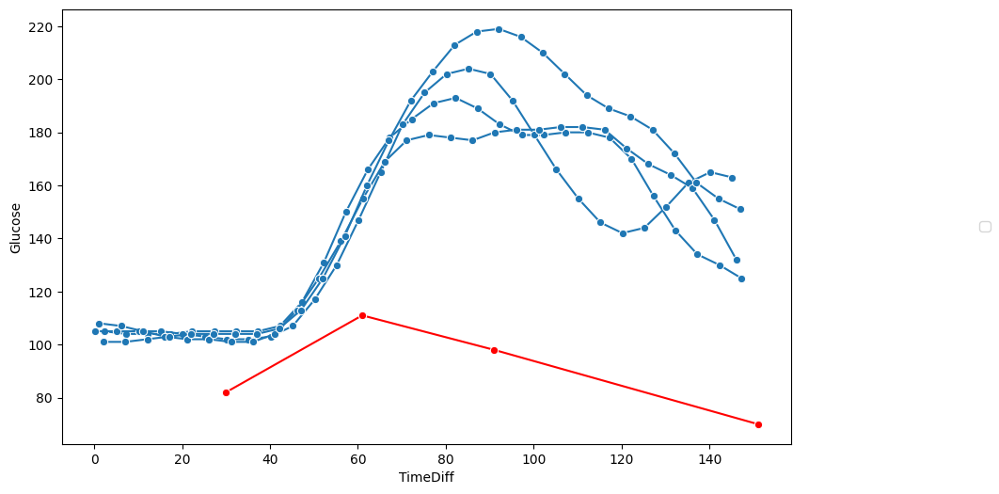

In [157]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=ten_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_ten, y="Glucose", x="TimeDiff", marker='o',color='red')

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

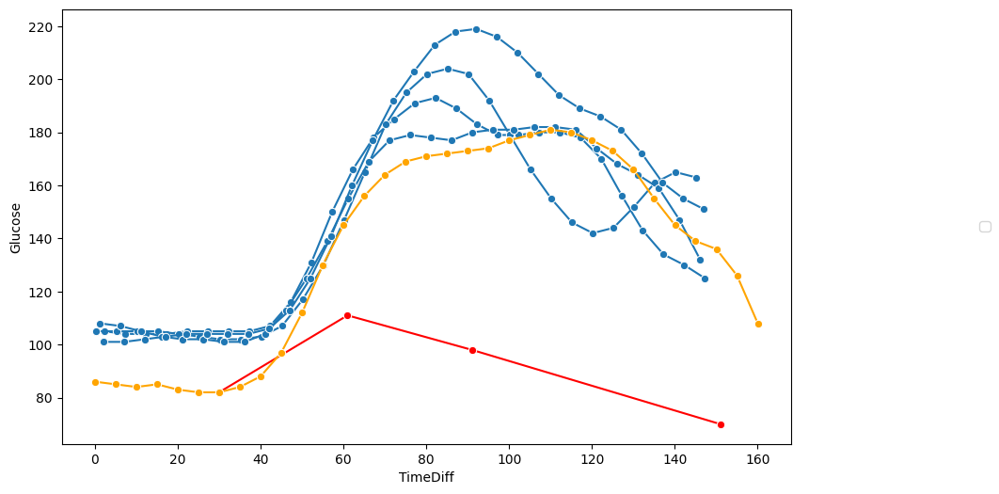

In [158]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=ten_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_ten, y="Glucose", x="TimeDiff", marker='o',color='red')
sns.lineplot(data=boost_cgm_ten, y="Glucose", x="TimeDiff", marker='o',color='orange')

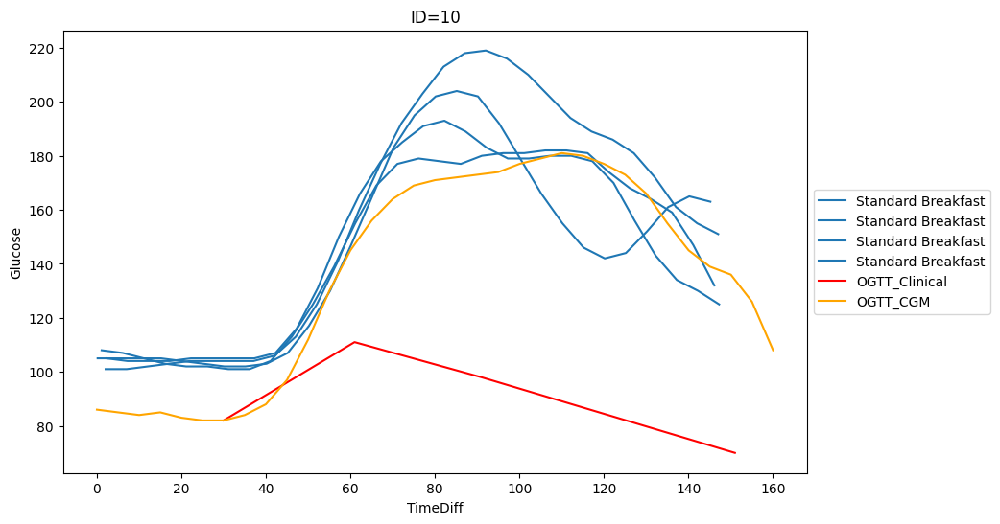

In [159]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=ten_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=10')
sns.lineplot(data=df_gtt_ten, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_ten, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)


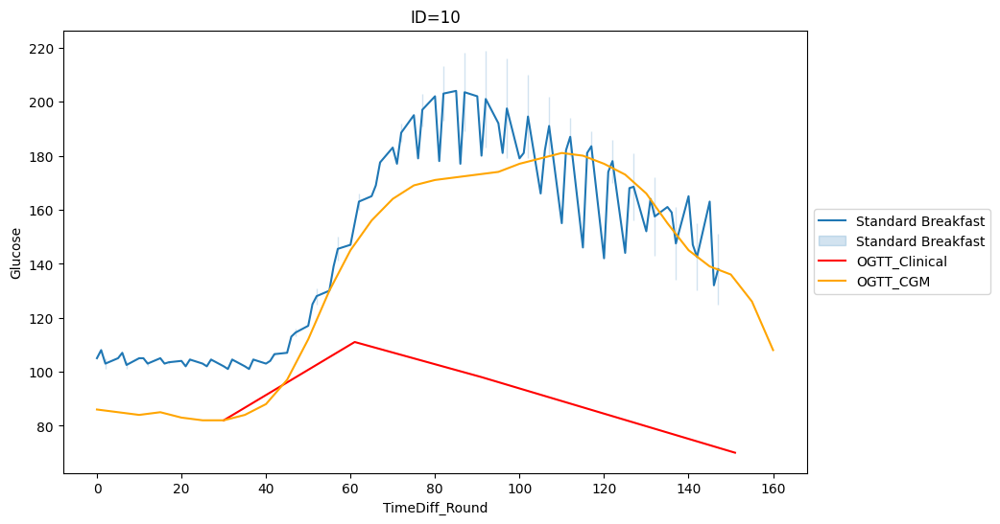

In [160]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=ten_ogtt, y="Glucose", x="TimeDiff_Round", palette='bright').set(title='ID=10')
sns.lineplot(data=df_gtt_ten, y="Glucose", x="TimeDiff_Round", color='red',estimator=None)
sns.lineplot(data=boost_cgm_ten, y="Glucose", x="TimeDiff_Round", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)


In [161]:
boost_sub=boost_cgm_ten[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_ten[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
ogtt_sub=ten_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
boost_sub['id']=10
gtt_sub['id']=10
ogtt_sub['id']=10

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

food_responses=food_responses.append([ogtt_sub,gtt_sub,boost_sub])
food_responses


,TimeDiff,Glucose,Time,date,id,type
80,3.516667,94.0,2019-09-17 06:43:31,2019-09-17,1,standard_meal
81,8.533333,95.0,2019-09-17 06:48:32,2019-09-17,1,standard_meal
82,13.533333,97.0,2019-09-17 06:53:32,2019-09-17,1,standard_meal
83,18.533333,97.0,2019-09-17 06:58:32,2019-09-17,1,standard_meal
84,23.533333,95.0,2019-09-17 07:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2154,140.050000,145.0,2020-03-30 08:59:03,2020-03-30,10,boost_cgm
2155,145.033333,139.0,2020-03-30 09:04:02,2020-03-30,10,boost_cgm
2156,150.050000,136.0,2020-03-30 09:09:03,2020-03-30,10,boost_cgm
2157,155.033333,126.0,2020-03-30 09:14:02,2020-03-30,10,boost_cgm


In [162]:
max_times=ten_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
ten_ogtt.groupby('date')['TimeDiff_Round'].nunique()


date
2020-03-23    30
2020-03-25    30
2020-03-27    30
2020-03-29    30
Name: TimeDiff_Round, dtype: int64

In [163]:
max_times=ten_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
ten_ogtt.groupby('date')['TimeDiff_Round'].nunique()

dates=ten_ogtt['date'].unique()
df_first_date=ten_ogtt[ten_ogtt['date']==dates[0]]

# ten_ogtt_test=ten_ogtt

column_names = ten_ogtt.columns.tolist()

# Create an empty DataFrame with the same columns
df_ppgr_grouped_ten = pd.DataFrame(columns=column_names)

for i in dates:
  df_date=ten_ogtt[ten_ogtt['date']==i]
  print(i)
  # df_date['nearest_time'] = df_first_date['TimeDiff'].apply(find_nearest_value)
  result_df = find_nearest_value(df_date, df_first_date, 'TimeDiff_Round', 'TimeDiff_Round')
  df_ppgr_grouped_ten=df_ppgr_grouped_ten.append(result_df)


# For grouped
boost_sub=boost_cgm_ten[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_ten[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
# ogtt_sub=ten_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
ogtt_sub=df_ppgr_grouped_ten[['nearest_TimeDiff_Round','Glucose','timestamp_dt','date']]
boost_sub['id']=10
gtt_sub['id']=10
ogtt_sub['id']=10

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

ogtt_sub.rename(columns={"nearest_TimeDiff_Round": "nearest_time_diff"},inplace=True)
boost_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)
gtt_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)


food_responses_grouped=food_responses_grouped.append([ogtt_sub,gtt_sub,boost_sub])
food_responses_grouped


2020-03-23
2020-03-25
2020-03-27
2020-03-29


,nearest_time_diff,Glucose,Time,date,id,type
80,4.000000,94.0,2019-09-17 06:43:31,2019-09-17,1,standard_meal
81,9.000000,95.0,2019-09-17 06:48:32,2019-09-17,1,standard_meal
82,14.000000,97.0,2019-09-17 06:53:32,2019-09-17,1,standard_meal
83,19.000000,97.0,2019-09-17 06:58:32,2019-09-17,1,standard_meal
84,24.000000,95.0,2019-09-17 07:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2154,140.050000,145.0,2020-03-30 08:59:03,2020-03-30,10,boost_cgm
2155,145.033333,139.0,2020-03-30 09:04:02,2020-03-30,10,boost_cgm
2156,150.050000,136.0,2020-03-30 09:09:03,2020-03-30,10,boost_cgm
2157,155.033333,126.0,2020-03-30 09:14:02,2020-03-30,10,boost_cgm


In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=ogtt_sub, y="Glucose", x="nearest_time_diff", palette='bright').set(title='ID=10')
sns.lineplot(data=boost_sub, y="Glucose", x="nearest_time_diff", color='red',estimator=None)
sns.lineplot(data=gtt_sub, y="Glucose", x="nearest_time_diff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)


In [ ]:
# df_gtt_ten['Time']=pd.to_datetime(df_gtt_ten['Time'])
# df_gtt_ten['TimeDiff'] = (df_gtt_ten['Time'] - df_gtt_ten['Time'].min()).dt.total_seconds()/ 60

In [164]:
s = '19-011'

GTT = [91, 143, 114, 87]
GTT_times = ['2019-11-18 7:08:00', '2019-11-18 7:40:00', '2019-11-18 8:10:00', '2019-11-18 9:10:00']
GTT_times = pd.to_datetime(GTT_times, format='%Y-%m-%dT%H:%M:%S')

df_gtt_eleven = pd.DataFrame({'Glucose': GTT, 'Time': GTT_times})
auc_ogtt_eleven=calculate_area_under_curve(df_gtt_eleven)
auc_ogtt_eleven

13629

In [165]:
df_gtt_eleven['Time']=pd.to_datetime(df_gtt_eleven['Time'])
df_gtt_eleven['TimeDiff'] = (df_gtt_eleven['Time'] - df_gtt_eleven['Time'].min()).dt.total_seconds()/ 60

In [166]:
cgm_eleven = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/011/Dexcom_011.csv')
cgm_eleven['timestamp_dt'] = pd.to_datetime(cgm_eleven['Timestamp (YYYY-MM-DDThh:mm:ss)'])
cgm_eleven['Glucose'] = cgm_eleven['Glucose Value (mg/dL)']
cgm_eleven['Time'] = pd.to_datetime(cgm_eleven['Timestamp (YYYY-MM-DDThh:mm:ss)'])

cgm_eleven = cgm_eleven.dropna(subset=['timestamp_dt'])
cgm_eleven['date'] = cgm_eleven['timestamp_dt'].dt.date
cgm_eleven

food_eleven = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/011/Food_Log_011.csv')

food_eleven['date'] = pd.to_datetime(food_eleven['date']).dt.date

food_eleven['time_begin'] = pd.to_datetime(food_eleven['time_begin'])
window_dt = pd.Timedelta(minutes=120)

food_eleven["time_begin_win"] = food_eleven["time_begin"] + window_dt

merge_food_cgm_eleven = pd.merge(cgm_eleven, food_eleven, left_on=['date'], right_on=['date'])

cf_eleven = food_eleven[food_eleven['logged_food']=='Std Bfast']
window_dt_brkfst = pd.Timedelta(minutes=-30)

merge_food_cgm_eleven = pd.merge(cgm_eleven, cf_eleven, left_on=['date'], right_on=['date'])

food_cgm_eleven_cf = merge_food_cgm_eleven[(merge_food_cgm_eleven['timestamp_dt'] <= merge_food_cgm_eleven['time_begin_win']) & (merge_food_cgm_eleven['timestamp_dt'] >= (merge_food_cgm_eleven['time_begin']+window_dt_brkfst))]

food_cgm_eleven_cf['pre_glu_time'] = food_cgm_eleven_cf.groupby('date')['timestamp_dt'].transform('min')

column_names = food_cgm_eleven_cf.columns.values
food_cgm_eleven_cf_all_dates = pd.DataFrame(columns=column_names)

for i in food_cgm_eleven_cf['date'].unique():
    date_sub = food_cgm_eleven_cf[food_cgm_eleven_cf['date'] == i]

    date_sub = date_sub.sort_values(by='timestamp_dt')
    min_glu = date_sub['Glucose Value (mg/dL)'].iloc[0]
    date_sub['min_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('min_glu')] = min_glu

    final_glu = date_sub['Glucose Value (mg/dL)'].iloc[-1]
    date_sub['final_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('final_glu')] = final_glu

    max_glu = date_sub['Glucose Value (mg/dL)'].max()
    date_sub['max_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('max_glu')] = max_glu

    date_sub['meal_auc'] = calculate_area_under_curve(date_sub)
    date_sub['auc_ogtt_eleven'] = auc_ogtt_eleven
    j = i - dt.timedelta(days=1)
    cgm_eleven_ld = cgm_eleven[cgm_eleven['date'] == j]

    date_sub['mean_glu_ld'] = cgm_eleven_ld.groupby('date')['Glucose'].transform('mean').iloc[0]
    date_sub['interdaycv'] = interdaycv(cgm_eleven_ld)
    date_sub['interdaysd'] = interdaysd(cgm_eleven_ld)
    date_sub['TIR'] = TIR(cgm_eleven_ld, sd=1, sr=5)
    date_sub['TOR'] = TOR(cgm_eleven_ld, sd=1, sr=5)
    date_sub['POR'] = POR(cgm_eleven_ld, sd=1, sr=5)
    date_sub['PIR'] = PIR(cgm_eleven_ld, sd=1, sr=5)
    date_sub['MGE'] = MGE(cgm_eleven_ld, sd=1)
    date_sub['MGN'] = MGN(cgm_eleven_ld, sd=1)
    # MAGE(cgm_eleven, std=1)
    date_sub['J_index'] = J_index(cgm_eleven_ld)
    date_sub['LBGI'] = LBGI(cgm_eleven_ld)
    date_sub['HBGI'] = HBGI(cgm_eleven_ld)
    # MODD(cgm_eleven)
    # CONGA24(cgm_eleven)
    date_sub['GMI'] = GMI(date_sub)

    food_cgm_eleven_cf_all_dates = food_cgm_eleven_cf_all_dates.append(date_sub)

eleven_ogtt = food_cgm_eleven_cf_all_dates

eleven_ogtt_dup = eleven_ogtt.drop_duplicates(subset=['date'], keep='first')
eleven_ogtt_dup['id'] = 11
eleven_ogtt_dup['a1c'] = "PD"



In [167]:
# food_eleven[food_eleven['logged_food']=='Std Bfast']

In [168]:
# food_eleven[food_eleven['logged_food']=='Boost']

In [169]:
window_dt = pd.Timedelta(minutes=120)
boost_time=dt.datetime(2020,4,16,6,38,0)
#8:53:00
# 2019-10-31 8:53:00
# 2019-11-18 7:08:00

# boost_cgm_eleven=cgm_eleven[(cgm_eleven['timestamp_dt']>=boost_time)&(cgm_eleven['timestamp_dt']<=boost_time + window_dt)]
boost_cgm_eleven=cgm_eleven[(cgm_eleven['timestamp_dt']>=boost_time)]

In [170]:
# eleven_ogtt['TimeDiff'] = (eleven_ogtt['timestamp_dt'] - eleven_ogtt['time_begin']).dt.total_seconds()/ 60
eleven_ogtt['TimeDiff'] = (eleven_ogtt['timestamp_dt'] - (eleven_ogtt['time_begin']+window_dt_brkfst)).dt.total_seconds()/ 60

# Group by and use cumcount
eleven_ogtt['SequentialTimeValues'] = eleven_ogtt.groupby('date').cumcount() + 1

df_gtt_eleven['Time']=pd.to_datetime(df_gtt_eleven['Time'])

# df_gtt_eleven['TimeDiff'] = (df_gtt_eleven['Time'] - df_gtt_eleven['Time'].min()).dt.total_seconds()/ 60
df_gtt_eleven['TimeDiff'] = (df_gtt_eleven['Time'] - (df_gtt_eleven['Time'].min()+window_dt_brkfst)).dt.total_seconds()/ 60


boost_cgm_eleven['TimeDiff'] = (boost_cgm_eleven['timestamp_dt'] - boost_time).dt.total_seconds()/ 60

In [171]:
eleven_ogtt['TimeDiff_Round']=eleven_ogtt['TimeDiff'].round()
df_gtt_eleven['TimeDiff_Round']=df_gtt_eleven['TimeDiff'].round()
boost_cgm_eleven['TimeDiff_Round']=boost_cgm_eleven['TimeDiff'].round()

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

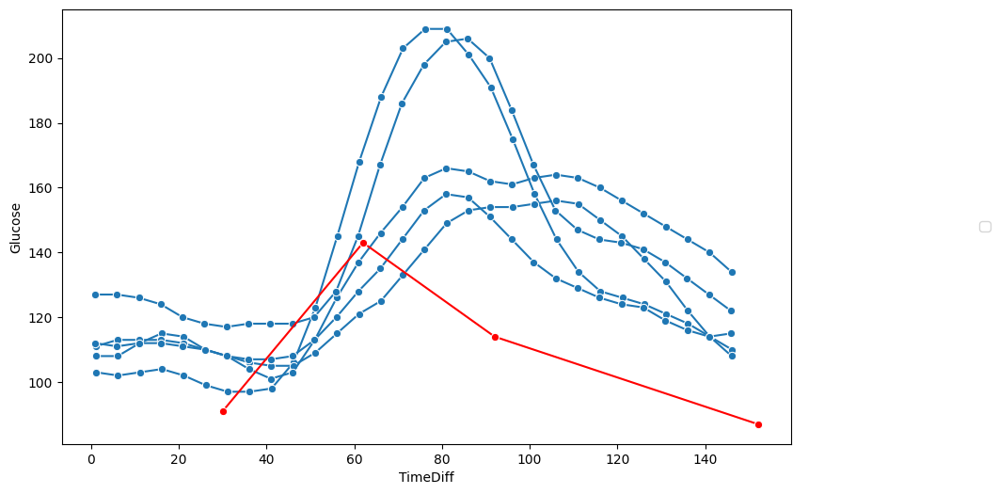

In [172]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=eleven_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_eleven, y="Glucose", x="TimeDiff", marker='o',color='red')


<Axes: xlabel='TimeDiff', ylabel='Glucose'>

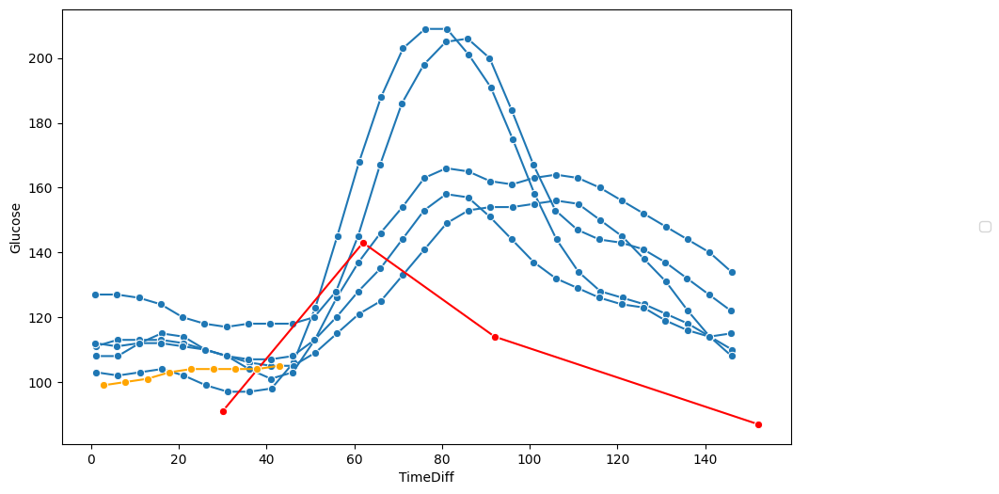

In [173]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=eleven_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_eleven, y="Glucose", x="TimeDiff", marker='o',color='red')
sns.lineplot(data=boost_cgm_eleven, y="Glucose", x="TimeDiff", marker='o',color='orange')

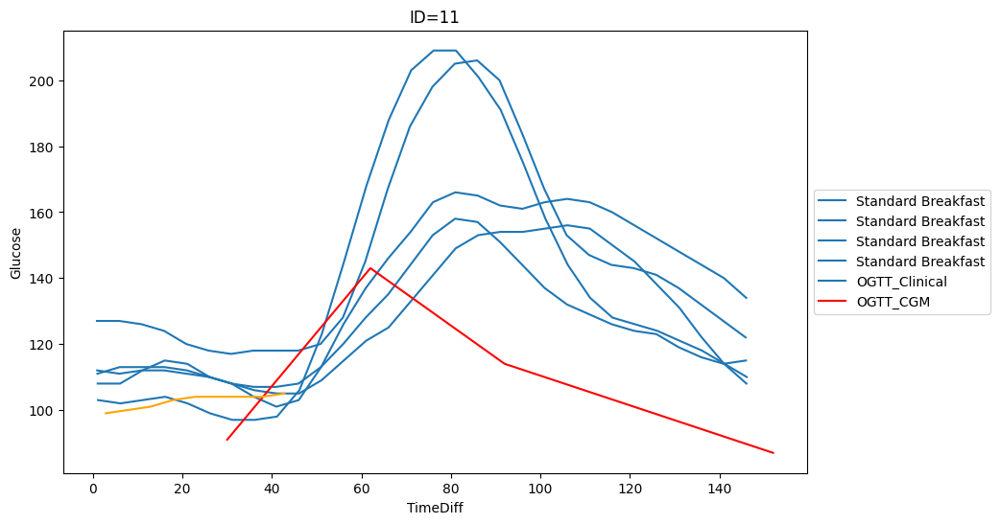

In [174]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=eleven_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=11')
sns.lineplot(data=df_gtt_eleven, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_eleven, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)


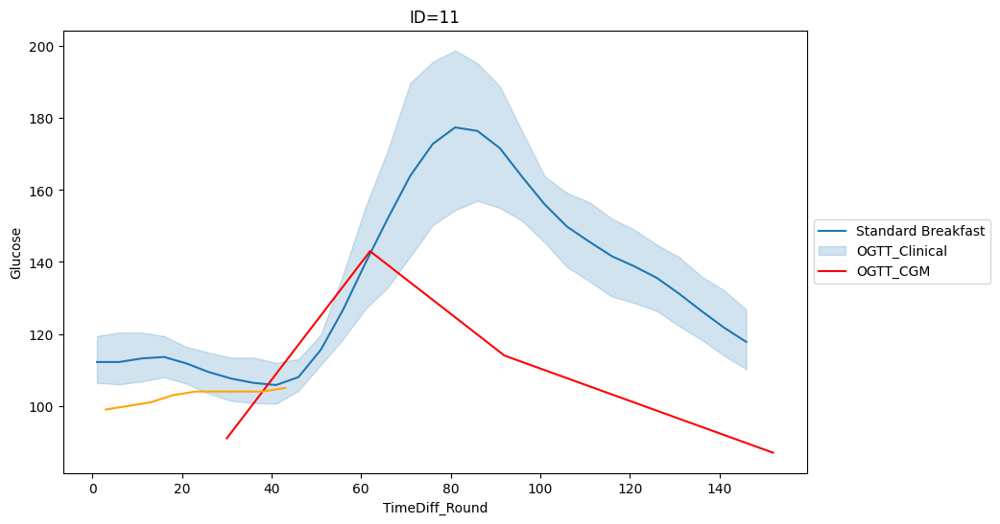

In [175]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=eleven_ogtt, y="Glucose", x="TimeDiff_Round", palette='bright').set(title='ID=11')
sns.lineplot(data=df_gtt_eleven, y="Glucose", x="TimeDiff_Round", color='red',estimator=None)
sns.lineplot(data=boost_cgm_eleven, y="Glucose", x="TimeDiff_Round", color='orange')
plt.legend(labels=["Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)


In [176]:
boost_sub=boost_cgm_eleven[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_eleven[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
ogtt_sub=eleven_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
boost_sub['id']=11
gtt_sub['id']=11
ogtt_sub['id']=11

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

food_responses=food_responses.append([ogtt_sub,gtt_sub,boost_sub])
food_responses


,TimeDiff,Glucose,Time,date,id,type
80,3.516667,94.0,2019-09-17 06:43:31,2019-09-17,1,standard_meal
81,8.533333,95.0,2019-09-17 06:48:32,2019-09-17,1,standard_meal
82,13.533333,97.0,2019-09-17 06:53:32,2019-09-17,1,standard_meal
83,18.533333,97.0,2019-09-17 06:58:32,2019-09-17,1,standard_meal
84,23.533333,95.0,2019-09-17 07:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2849,22.850000,104.0,2020-04-16 07:00:51,2020-04-16,11,boost_cgm
2850,27.850000,104.0,2020-04-16 07:05:51,2020-04-16,11,boost_cgm
2851,32.850000,104.0,2020-04-16 07:10:51,2020-04-16,11,boost_cgm
2852,37.850000,104.0,2020-04-16 07:15:51,2020-04-16,11,boost_cgm


In [177]:
max_times=eleven_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
eleven_ogtt.groupby('date')['TimeDiff_Round'].nunique()

date
2020-04-07    30
2020-04-09    30
2020-04-11    30
2020-04-13    30
2020-04-15    30
Name: TimeDiff_Round, dtype: int64

In [178]:
max_times=eleven_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
eleven_ogtt.groupby('date')['TimeDiff_Round'].nunique()

dates=eleven_ogtt['date'].unique()
df_first_date=eleven_ogtt[eleven_ogtt['date']==dates[0]]

# eleven_ogtt_test=eleven_ogtt

column_names = eleven_ogtt.columns.tolist()

# Create an empty DataFrame with the same columns
df_ppgr_grouped_eleven = pd.DataFrame(columns=column_names)

for i in dates:
  df_date=eleven_ogtt[eleven_ogtt['date']==i]
  print(i)
  # df_date['nearest_time'] = df_first_date['TimeDiff'].apply(find_nearest_value)
  result_df = find_nearest_value(df_date, df_first_date, 'TimeDiff_Round', 'TimeDiff_Round')
  df_ppgr_grouped_eleven=df_ppgr_grouped_eleven.append(result_df)


# For grouped
boost_sub=boost_cgm_eleven[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_eleven[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
# ogtt_sub=eleven_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
ogtt_sub=df_ppgr_grouped_eleven[['nearest_TimeDiff_Round','Glucose','timestamp_dt','date']]
boost_sub['id']=11
gtt_sub['id']=11
ogtt_sub['id']=11

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

ogtt_sub.rename(columns={"nearest_TimeDiff_Round": "nearest_time_diff"},inplace=True)
boost_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)
gtt_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)


food_responses_grouped=food_responses_grouped.append([ogtt_sub,gtt_sub,boost_sub])
food_responses_grouped


2020-04-07
2020-04-09
2020-04-11
2020-04-13
2020-04-15


,nearest_time_diff,Glucose,Time,date,id,type
80,4.00,94.0,2019-09-17 06:43:31,2019-09-17,1,standard_meal
81,9.00,95.0,2019-09-17 06:48:32,2019-09-17,1,standard_meal
82,14.00,97.0,2019-09-17 06:53:32,2019-09-17,1,standard_meal
83,19.00,97.0,2019-09-17 06:58:32,2019-09-17,1,standard_meal
84,24.00,95.0,2019-09-17 07:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2849,22.85,104.0,2020-04-16 07:00:51,2020-04-16,11,boost_cgm
2850,27.85,104.0,2020-04-16 07:05:51,2020-04-16,11,boost_cgm
2851,32.85,104.0,2020-04-16 07:10:51,2020-04-16,11,boost_cgm
2852,37.85,104.0,2020-04-16 07:15:51,2020-04-16,11,boost_cgm


In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=ogtt_sub, y="Glucose", x="nearest_time_diff", palette='bright').set(title='ID=11')
sns.lineplot(data=boost_sub, y="Glucose", x="nearest_time_diff", color='red',estimator=None)
sns.lineplot(data=gtt_sub, y="Glucose", x="nearest_time_diff", color='orange')
plt.legend(labels=["Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)


In [179]:
# ogtt_acc[ogtt_acc['datetime'].lt(time_start.max())]

In [180]:
# time_start = ogtt_day['pre_glu_time'].values
# acc_time_start = ogtt_acc[ogtt_acc['datetime'].lt(time_start.max())]
# acc_time_start
# ogtt_day['pre_glu_time'].values

In [181]:
s = '19-012'

GTT = [85, 92, 108, 87]
GTT_times = ['2019-12-13 7:21:00', '2019-12-13 7:55:00', '2019-12-13 8:25:00', '2019-12-13 9:25:00']
GTT_times = pd.to_datetime(GTT_times, format='%Y-%m-%dT%H:%M:%S')

df_gtt_twelve = pd.DataFrame({'Glucose': GTT, 'Time': GTT_times})
auc_ogtt_twelve=calculate_area_under_curve(df_gtt_twelve)
auc_ogtt_twelve

11859

In [182]:
cgm_twelve = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/012/Dexcom_012.csv')
cgm_twelve['timestamp_dt'] = pd.to_datetime(cgm_twelve['Timestamp (YYYY-MM-DDThh:mm:ss)'])
cgm_twelve['Glucose'] = cgm_twelve['Glucose Value (mg/dL)']
cgm_twelve['Time'] = pd.to_datetime(cgm_twelve['Timestamp (YYYY-MM-DDThh:mm:ss)'])

cgm_twelve = cgm_twelve.dropna(subset=['timestamp_dt'])
cgm_twelve['date'] = cgm_twelve['timestamp_dt'].dt.date

food_twelve = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/012/Food_Log_012.csv')

food_twelve['date'] = pd.to_datetime(food_twelve['date']).dt.date

food_twelve['time_begin'] = pd.to_datetime(food_twelve['time_begin'])
window_dt = pd.Timedelta(minutes=120)

food_twelve["time_begin_win"] = food_twelve["time_begin"] + window_dt

merge_food_cgm_twelve = pd.merge(cgm_twelve, food_twelve, left_on=['date'], right_on=['date'])

cf_twelve = food_twelve[food_twelve['logged_food']=='Frosted Flake']

merge_food_cgm_twelve = pd.merge(cgm_twelve, cf_twelve, left_on=['date'], right_on=['date'])
window_dt_brkfst = pd.Timedelta(minutes=-30)

food_cgm_twelve_cf = merge_food_cgm_twelve[(merge_food_cgm_twelve['timestamp_dt'] <= merge_food_cgm_twelve['time_begin_win']) & (merge_food_cgm_twelve['timestamp_dt'] >= (merge_food_cgm_twelve['time_begin']+window_dt_brkfst))]

food_cgm_twelve_cf['pre_glu_time'] = food_cgm_twelve_cf.groupby('date')['timestamp_dt'].transform('min')

column_names = food_cgm_twelve_cf.columns.values
food_cgm_twelve_cf_all_dates = pd.DataFrame(columns=column_names)

for i in food_cgm_twelve_cf['date'].unique():
    date_sub = food_cgm_twelve_cf[food_cgm_twelve_cf['date'] == i]

    date_sub = date_sub.sort_values(by='timestamp_dt')
    min_glu = date_sub['Glucose Value (mg/dL)'].iloc[0]
    date_sub['min_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('min_glu')] = min_glu

    final_glu = date_sub['Glucose Value (mg/dL)'].iloc[-1]
    date_sub['final_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('final_glu')] = final_glu

    max_glu = date_sub['Glucose Value (mg/dL)'].max()
    date_sub['max_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('max_glu')] = max_glu

    date_sub['meal_auc'] = calculate_area_under_curve(date_sub)
    date_sub['auc_ogtt_twelve'] = auc_ogtt_twelve
    j = i - dt.timedelta(days=1)
    cgm_twelve_ld = cgm_twelve[cgm_twelve['date'] == j]

    date_sub['mean_glu_ld'] = cgm_twelve_ld.groupby('date')['Glucose'].transform('mean').iloc[0]
    date_sub['interdaycv'] = interdaycv(cgm_twelve_ld)
    date_sub['interdaysd'] = interdaysd(cgm_twelve_ld)
    date_sub['TIR'] = TIR(cgm_twelve_ld, sd=1, sr=5)
    date_sub['TOR'] = TOR(cgm_twelve_ld, sd=1, sr=5)
    date_sub['POR'] = POR(cgm_twelve_ld, sd=1, sr=5)
    date_sub['PIR'] = PIR(cgm_twelve_ld, sd=1, sr=5)
    date_sub['MGE'] = MGE(cgm_twelve_ld, sd=1)
    date_sub['MGN'] = MGN(cgm_twelve_ld, sd=1)
    # MAGE(cgm_twelve, std=1)
    date_sub['J_index'] = J_index(cgm_twelve_ld)
    date_sub['LBGI'] = LBGI(cgm_twelve_ld)
    date_sub['HBGI'] = HBGI(cgm_twelve_ld)
    # MODD(cgm_twelve)
    # CONGA24(cgm_twelve)
    date_sub['GMI'] = GMI(date_sub)

    food_cgm_twelve_cf_all_dates = food_cgm_twelve_cf_all_dates.append(date_sub)

twelve_ogtt = food_cgm_twelve_cf_all_dates

twelve_ogtt_dup = twelve_ogtt.drop_duplicates(subset=['date'], keep='first')
twelve_ogtt_dup['id'] = 12
twelve_ogtt_dup['a1c'] = "PD"


In [183]:
# food_twelve['logged_food'].unique()

In [184]:
# food_twelve[food_twelve['logged_food']=='Frosted Flake']

In [185]:
# food_twelve[food_twelve['logged_food']=='Boost']

In [186]:
window_dt = pd.Timedelta(minutes=120)
boost_time=dt.datetime(2020,5,11,6,51,0)
# 2019-12-13 7:21:00'

# boost_cgm_twelve=cgm_twelve[(cgm_twelve['timestamp_dt']>=boost_time)&(cgm_twelve['timestamp_dt']<=boost_time + window_dt)]
boost_cgm_twelve=cgm_twelve[(cgm_twelve['timestamp_dt']>=boost_time)]


In [187]:
# twelve_ogtt['TimeDiff'] = (twelve_ogtt['timestamp_dt'] - twelve_ogtt['time_begin']).dt.total_seconds()/ 60
twelve_ogtt['TimeDiff'] = (twelve_ogtt['timestamp_dt'] - (twelve_ogtt['time_begin']+window_dt_brkfst)).dt.total_seconds()/ 60

# Group by and use cumcount
twelve_ogtt['SequentialTimeValues'] = twelve_ogtt.groupby('date').cumcount() + 1

df_gtt_twelve['Time']=pd.to_datetime(df_gtt_twelve['Time'])

# df_gtt_twelve['TimeDiff'] = (df_gtt_twelve['Time'] - df_gtt_twelve['Time'].min()).dt.total_seconds()/ 60
df_gtt_twelve['TimeDiff'] = (df_gtt_twelve['Time'] - (df_gtt_twelve['Time'].min()+window_dt_brkfst)).dt.total_seconds()/ 60


boost_cgm_twelve['TimeDiff'] = (boost_cgm_twelve['timestamp_dt'] - boost_time).dt.total_seconds()/ 60

In [188]:
twelve_ogtt['TimeDiff_Round']=twelve_ogtt['TimeDiff'].round()
df_gtt_twelve['TimeDiff_Round']=df_gtt_twelve['TimeDiff'].round()
boost_cgm_twelve['TimeDiff_Round']=boost_cgm_twelve['TimeDiff'].round()

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

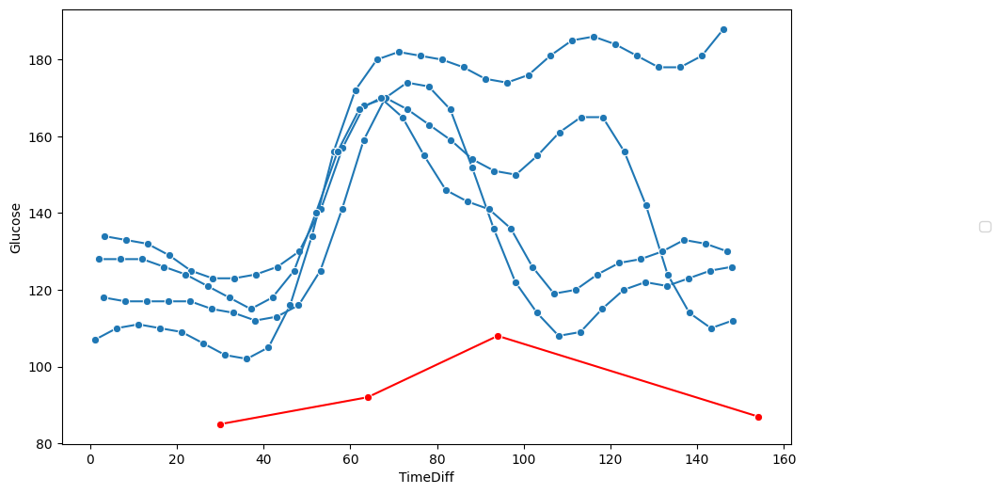

In [189]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=twelve_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_twelve, y="Glucose", x="TimeDiff", marker='o',color='red')

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

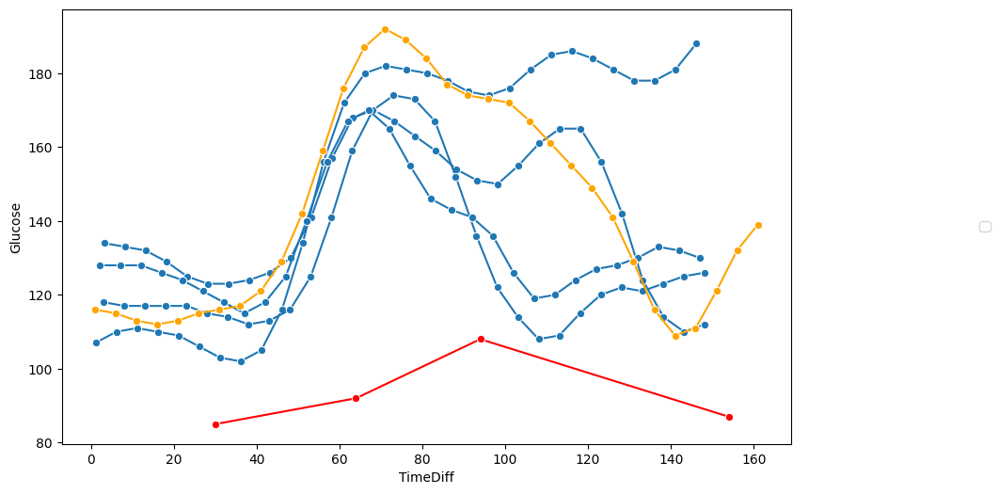

In [190]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=twelve_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_twelve, y="Glucose", x="TimeDiff", marker='o',color='red')
sns.lineplot(data=boost_cgm_twelve, y="Glucose", x="TimeDiff", marker='o',color='orange')

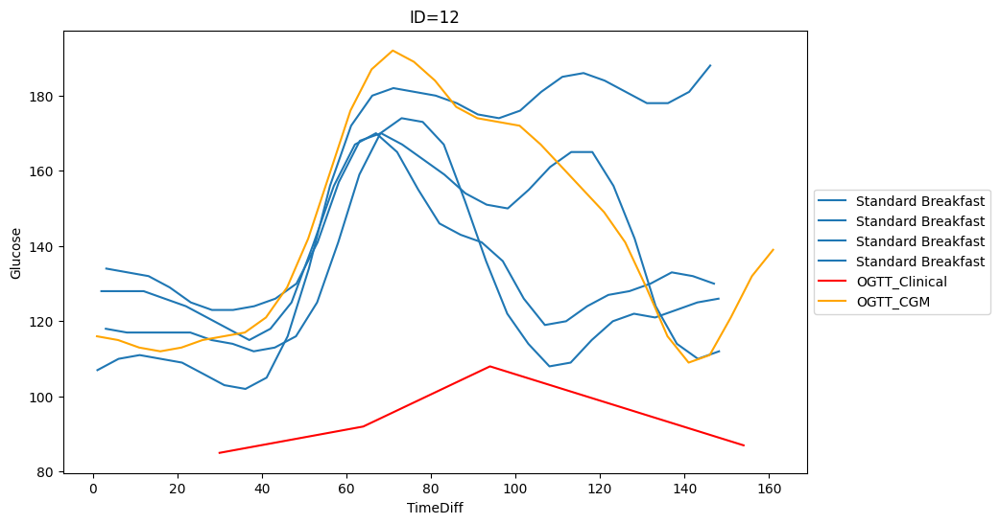

In [191]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=twelve_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=12')
sns.lineplot(data=df_gtt_twelve, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_twelve, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)


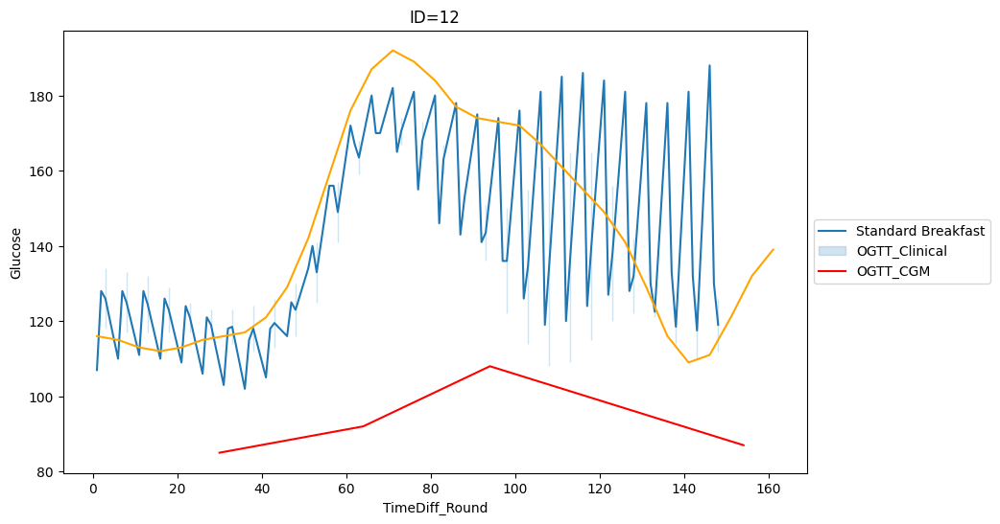

In [192]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=twelve_ogtt, y="Glucose", x="TimeDiff_Round", palette='bright').set(title='ID=12')
sns.lineplot(data=df_gtt_twelve, y="Glucose", x="TimeDiff_Round", color='red',estimator=None)
sns.lineplot(data=boost_cgm_twelve, y="Glucose", x="TimeDiff_Round", color='orange')
plt.legend(labels=["Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)


In [193]:
boost_sub=boost_cgm_twelve[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_twelve[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
ogtt_sub=twelve_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
boost_sub['id']=12
gtt_sub['id']=12
ogtt_sub['id']=12

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

food_responses=food_responses.append([ogtt_sub,gtt_sub,boost_sub])
food_responses


,TimeDiff,Glucose,Time,date,id,type
80,3.516667,94.0,2019-09-17 06:43:31,2019-09-17,1,standard_meal
81,8.533333,95.0,2019-09-17 06:48:32,2019-09-17,1,standard_meal
82,13.533333,97.0,2019-09-17 06:53:32,2019-09-17,1,standard_meal
83,18.533333,97.0,2019-09-17 06:58:32,2019-09-17,1,standard_meal
84,23.533333,95.0,2019-09-17 07:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2175,141.000000,109.0,2020-05-11 09:12:00,2020-05-11,12,boost_cgm
2176,145.983333,111.0,2020-05-11 09:16:59,2020-05-11,12,boost_cgm
2177,150.983333,121.0,2020-05-11 09:21:59,2020-05-11,12,boost_cgm
2178,155.983333,132.0,2020-05-11 09:26:59,2020-05-11,12,boost_cgm


In [194]:
max_times=twelve_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
twelve_ogtt.groupby('date')['TimeDiff_Round'].nunique()


date
2020-05-04    30
2020-05-06    30
2020-05-08    30
2020-05-10    30
Name: TimeDiff_Round, dtype: int64

In [195]:
max_times=twelve_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
twelve_ogtt.groupby('date')['TimeDiff_Round'].nunique()

dates=twelve_ogtt['date'].unique()
df_first_date=twelve_ogtt[twelve_ogtt['date']==dates[0]]

# twelve_ogtt_test=twelve_ogtt

column_names = twelve_ogtt.columns.tolist()

# Create an empty DataFrame with the same columns
df_ppgr_grouped_twelve = pd.DataFrame(columns=column_names)

for i in dates:
  df_date=twelve_ogtt[twelve_ogtt['date']==i]
  print(i)
  # df_date['nearest_time'] = df_first_date['TimeDiff'].apply(find_nearest_value)
  result_df = find_nearest_value(df_date, df_first_date, 'TimeDiff_Round', 'TimeDiff_Round')
  df_ppgr_grouped_twelve=df_ppgr_grouped_twelve.append(result_df)


# For grouped
boost_sub=boost_cgm_twelve[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_twelve[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
# ogtt_sub=twelve_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
ogtt_sub=df_ppgr_grouped_twelve[['nearest_TimeDiff_Round','Glucose','timestamp_dt','date']]
boost_sub['id']=12
gtt_sub['id']=12
ogtt_sub['id']=12

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

ogtt_sub.rename(columns={"nearest_TimeDiff_Round": "nearest_time_diff"},inplace=True)
boost_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)
gtt_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)


food_responses_grouped=food_responses_grouped.append([ogtt_sub,gtt_sub,boost_sub])
food_responses_grouped


2020-05-04
2020-05-06
2020-05-08
2020-05-10


,nearest_time_diff,Glucose,Time,date,id,type
80,4.000000,94.0,2019-09-17 06:43:31,2019-09-17,1,standard_meal
81,9.000000,95.0,2019-09-17 06:48:32,2019-09-17,1,standard_meal
82,14.000000,97.0,2019-09-17 06:53:32,2019-09-17,1,standard_meal
83,19.000000,97.0,2019-09-17 06:58:32,2019-09-17,1,standard_meal
84,24.000000,95.0,2019-09-17 07:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2175,141.000000,109.0,2020-05-11 09:12:00,2020-05-11,12,boost_cgm
2176,145.983333,111.0,2020-05-11 09:16:59,2020-05-11,12,boost_cgm
2177,150.983333,121.0,2020-05-11 09:21:59,2020-05-11,12,boost_cgm
2178,155.983333,132.0,2020-05-11 09:26:59,2020-05-11,12,boost_cgm


In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=ogtt_sub, y="Glucose", x="nearest_time_diff", palette='bright').set(title='ID=12')
sns.lineplot(data=boost_sub, y="Glucose", x="nearest_time_diff", color='red',estimator=None)
sns.lineplot(data=gtt_sub, y="Glucose", x="nearest_time_diff", color='orange')
plt.legend(labels=["Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)


In [196]:
s = '19-013'

GTT = [87, 96, 65, 84]
GTT_times = ['2020-01-06 9:55:00', '2020-01-06 10:30:00', '2020-01-06 11:00:00', '2020-01-06 12:00:00']
GTT_times = pd.to_datetime(GTT_times, format='%Y-%m-%dT%H:%M:%S')

df_gtt_thirteen = pd.DataFrame({'Glucose': GTT, 'Time': GTT_times})
auc_ogtt_thirteen=calculate_area_under_curve(df_gtt_thirteen)
auc_ogtt_thirteen

10087

In [197]:
cgm_thirteen = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/013/Dexcom_013.csv')
cgm_thirteen['timestamp_dt'] = pd.to_datetime(cgm_thirteen['Timestamp (YYYY-MM-DDThh:mm:ss)'])
cgm_thirteen['Glucose'] = cgm_thirteen['Glucose Value (mg/dL)']
cgm_thirteen['Time'] = pd.to_datetime(cgm_thirteen['Timestamp (YYYY-MM-DDThh:mm:ss)'])

cgm_thirteen = cgm_thirteen.dropna(subset=['timestamp_dt'])
cgm_thirteen['date'] = cgm_thirteen['timestamp_dt'].dt.date
cgm_thirteen

food_thirteen = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/013/Food_Log_013.csv')

food_thirteen['date'] = pd.to_datetime(food_thirteen['date']).dt.date

food_thirteen['time_begin'] = pd.to_datetime(food_thirteen['time_begin'])
window_dt = pd.Timedelta(minutes=120)

food_thirteen["time_begin_win"] = food_thirteen["time_begin"] + window_dt

merge_food_cgm_thirteen = pd.merge(cgm_thirteen, food_thirteen, left_on=['date'], right_on=['date'])

cf_thirteen = food_thirteen[food_thirteen['Food_Item']=='Frosted Flake']

merge_food_cgm_thirteen = pd.merge(cgm_thirteen, cf_thirteen, left_on=['date'], right_on=['date'])
window_dt_brkfst = pd.Timedelta(minutes=-30)

food_cgm_thirteen_cf = merge_food_cgm_thirteen[(merge_food_cgm_thirteen['timestamp_dt'] <= merge_food_cgm_thirteen['time_begin_win']) & (merge_food_cgm_thirteen['timestamp_dt'] >= (merge_food_cgm_thirteen['time_begin']+window_dt_brkfst))]

food_cgm_thirteen_cf['pre_glu_time'] = food_cgm_thirteen_cf.groupby('date')['timestamp_dt'].transform('min')

column_names = food_cgm_thirteen_cf.columns.values
food_cgm_thirteen_cf_all_dates = pd.DataFrame(columns=column_names)

for i in food_cgm_thirteen_cf['date'].unique():
    date_sub = food_cgm_thirteen_cf[food_cgm_thirteen_cf['date'] == i]

    date_sub = date_sub.sort_values(by='timestamp_dt')
    min_glu = date_sub['Glucose Value (mg/dL)'].iloc[0]
    date_sub['min_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('min_glu')] = min_glu

    final_glu = date_sub['Glucose Value (mg/dL)'].iloc[-1]
    date_sub['final_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('final_glu')] = final_glu

    max_glu = date_sub['Glucose Value (mg/dL)'].max()
    date_sub['max_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('max_glu')] = max_glu

    date_sub['meal_auc'] = calculate_area_under_curve(date_sub)
    date_sub['auc_ogtt_thirteen'] = auc_ogtt_thirteen
    j = i - dt.timedelta(days=1)
    cgm_thirteen_ld = cgm_thirteen[cgm_thirteen['date'] == j]

    date_sub['mean_glu_ld'] = cgm_thirteen_ld.groupby('date')['Glucose'].transform('mean').iloc[0]
    date_sub['interdaycv'] = interdaycv(cgm_thirteen_ld)
    date_sub['interdaysd'] = interdaysd(cgm_thirteen_ld)
    date_sub['TIR'] = TIR(cgm_thirteen_ld, sd=1, sr=5)
    date_sub['TOR'] = TOR(cgm_thirteen_ld, sd=1, sr=5)
    date_sub['POR'] = POR(cgm_thirteen_ld, sd=1, sr=5)
    date_sub['PIR'] = PIR(cgm_thirteen_ld, sd=1, sr=5)
    date_sub['MGE'] = MGE(cgm_thirteen_ld, sd=1)
    date_sub['MGN'] = MGN(cgm_thirteen_ld, sd=1)
    # MAGE(cgm_thirteen, std=1)
    date_sub['J_index'] = J_index(cgm_thirteen_ld)
    date_sub['LBGI'] = LBGI(cgm_thirteen_ld)
    date_sub['HBGI'] = HBGI(cgm_thirteen_ld)
    # MODD(cgm_thirteen)
    # CONGA24(cgm_thirteen)
    date_sub['GMI'] = GMI(date_sub)

    food_cgm_thirteen_cf_all_dates = food_cgm_thirteen_cf_all_dates.append(date_sub)

thirteen_ogtt = food_cgm_thirteen_cf_all_dates

thirteen_ogtt_dup = thirteen_ogtt.drop_duplicates(subset=['date'], keep='first')
thirteen_ogtt_dup['id'] = 13
thirteen_ogtt_dup['a1c'] = "PD"



In [198]:
# merge_sub_thirteen.columns

In [199]:
# merge_sub_thirteen.rename(columns={'auc_ogtt_thirteen': 'auc_ogtt'}, inplace=True)

In [200]:
# food_thirteen[food_thirteen['Food_Item']=='Frosted Flake']
# food_thirteen[food_thirteen['Food_Item']=='Boost']

In [201]:
window_dt = pd.Timedelta(minutes=120)
boost_time=dt.datetime(2020,6,4,9,25,0)
# 2020-01-06 9:55:00

# bosst_cgm_thirteen=cgm_thirteen[(cgm_thirteen['timestamp_dt']>=boost_time)&(cgm_thirteen['timestamp_dt']<=boost_time + window_dt)]
bosst_cgm_thirteen=cgm_thirteen[(cgm_thirteen['timestamp_dt']>=boost_time)]

#food_thirteen["time_begin_win"] = food_thirteen["time_begin"] + window_dt

#cgm_thirteen[cgm_thirteen['timestamp_dt']>=dt.datetime(2020,6,4,9,30,0)]

In [202]:
thirteen_ogtt['TimeDiff'] = (thirteen_ogtt['timestamp_dt'] - (thirteen_ogtt['time_begin']+window_dt_brkfst)).dt.total_seconds()/ 60

# Group by and use cumcount
thirteen_ogtt['SequentialTimeValues'] = thirteen_ogtt.groupby('date').cumcount() + 1

df_gtt_thirteen['Time']=pd.to_datetime(df_gtt_thirteen['Time'])

df_gtt_thirteen['TimeDiff'] = (df_gtt_thirteen['Time'] - (df_gtt_thirteen['Time'].min()+window_dt_brkfst)).dt.total_seconds()/ 60

bosst_cgm_thirteen['TimeDiff']=(bosst_cgm_thirteen['timestamp_dt']-boost_time).dt.total_seconds()/ 60


In [203]:
thirteen_ogtt['TimeDiff_Round']=thirteen_ogtt['TimeDiff'].round()
df_gtt_thirteen['TimeDiff_Round']=df_gtt_thirteen['TimeDiff'].round()
bosst_cgm_thirteen['TimeDiff_Round']=bosst_cgm_thirteen['TimeDiff'].round()

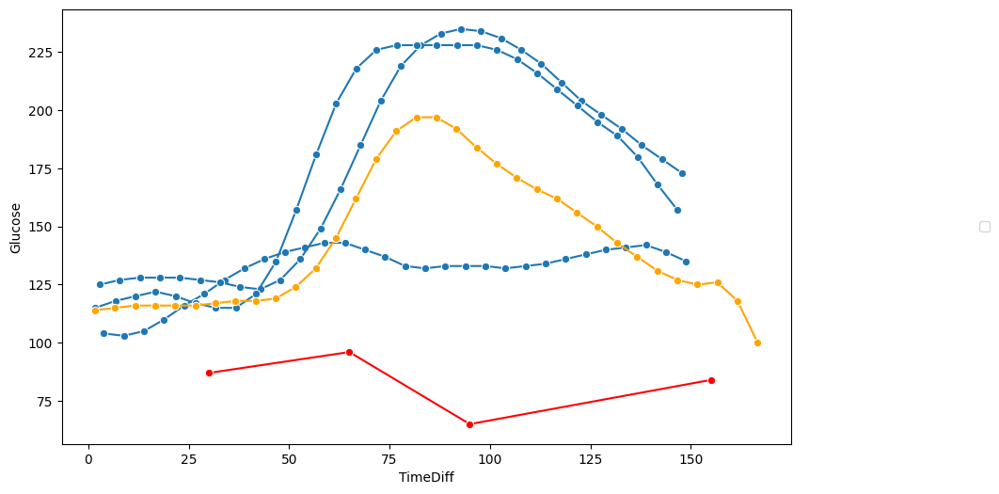

In [204]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=thirteen_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_thirteen, y="Glucose", x="TimeDiff", marker='o',color='red')
sns.lineplot(data=bosst_cgm_thirteen, y="Glucose", x="TimeDiff", marker='o',color='orange')
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)

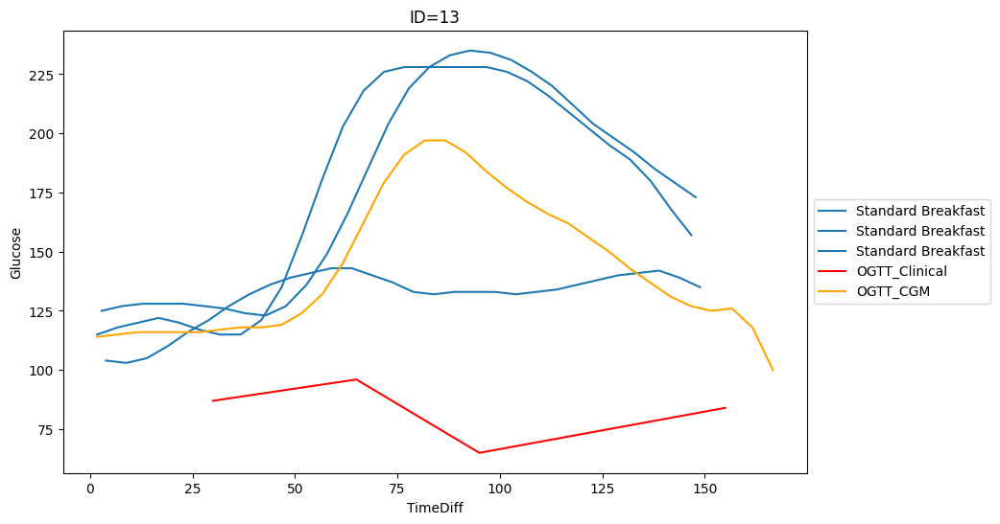

In [205]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=thirteen_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=13')
sns.lineplot(data=df_gtt_thirteen, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=bosst_cgm_thirteen, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

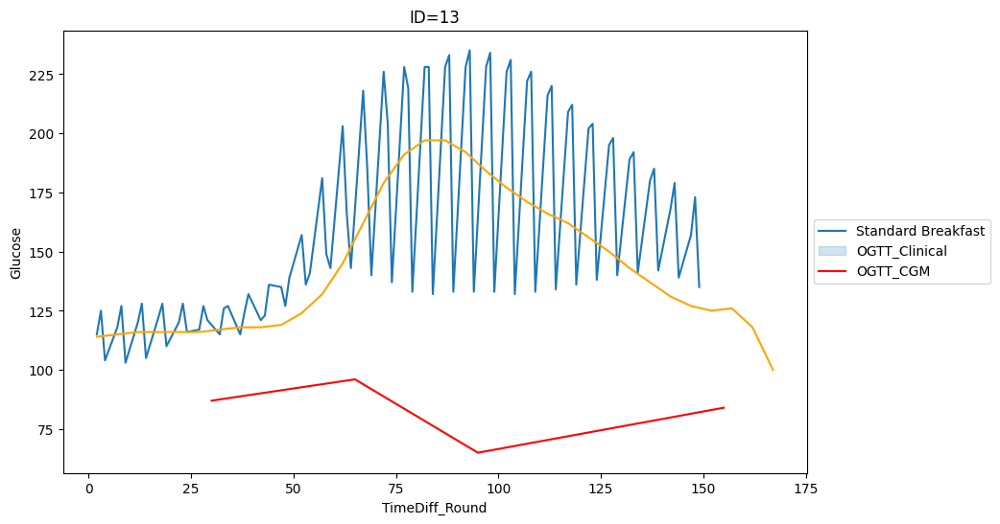

In [206]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=thirteen_ogtt, y="Glucose", x="TimeDiff_Round").set(title='ID=13')
sns.lineplot(data=df_gtt_thirteen, y="Glucose", x="TimeDiff_Round", color='red',estimator=None)
sns.lineplot(data=bosst_cgm_thirteen, y="Glucose", x="TimeDiff_Round", color='orange')
plt.legend(labels=["Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [207]:
max_times=thirteen_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
thirteen_ogtt.groupby('date')['TimeDiff_Round'].nunique()

date
2020-05-29    30
2020-05-31    30
2020-06-02    30
Name: TimeDiff_Round, dtype: int64

In [208]:
# max_times=thirteen_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
# thirteen_ogtt.groupby('date')['TimeDiff_Round'].nunique()

# dates=thirteen_ogtt['date'].unique()
# df_first_date=thirteen_ogtt[thirteen_ogtt['date']==dates[0]]

# # thirteen_ogtt_test=thirteen_ogtt

# column_names = thirteen_ogtt.columns.tolist()

# # Create an empty DataFrame with the same columns
# df_ppgr_grouped_thirteen = pd.DataFrame(columns=column_names)

# for i in dates:
#   df_date=thirteen_ogtt[thirteen_ogtt['date']==i]
#   print(i)
#   # df_date['nearest_time'] = df_first_date['TimeDiff'].apply(find_nearest_value)
#   result_df = find_nearest_value(df_date, df_first_date, 'TimeDiff_Round', 'TimeDiff_Round')
#   df_ppgr_grouped_thirteen=df_ppgr_grouped_thirteen.append(result_df)


In [209]:
# #for grouped
# boost_sub=bosst_cgm_thirteen[['TimeDiff','Glucose','timestamp_dt','date']]
# gtt_sub=df_gtt_thirteen[['TimeDiff','Glucose','Time']]
# gtt_sub['date']=gtt_sub.Time.dt.date
# # ogtt_sub=thirteen_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
# ogtt_sub=df_ppgr_grouped_thirteen[['TimeDiff','Glucose','timestamp_dt','date']]
# boost_sub['id']=13
# gtt_sub['id']=13
# ogtt_sub['id']=13

# boost_sub['type']='boost_cgm'
# gtt_sub['type']='boost_clinical'
# ogtt_sub['type']='standard_meal'

# boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
# ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

# food_responses_grouped=food_responses_grouped.append([ogtt_sub,gtt_sub,boost_sub])
# food_responses_grouped

In [210]:
max_times=thirteen_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
thirteen_ogtt.groupby('date')['TimeDiff_Round'].nunique()

date
2020-05-29    30
2020-05-31    30
2020-06-02    30
Name: TimeDiff_Round, dtype: int64

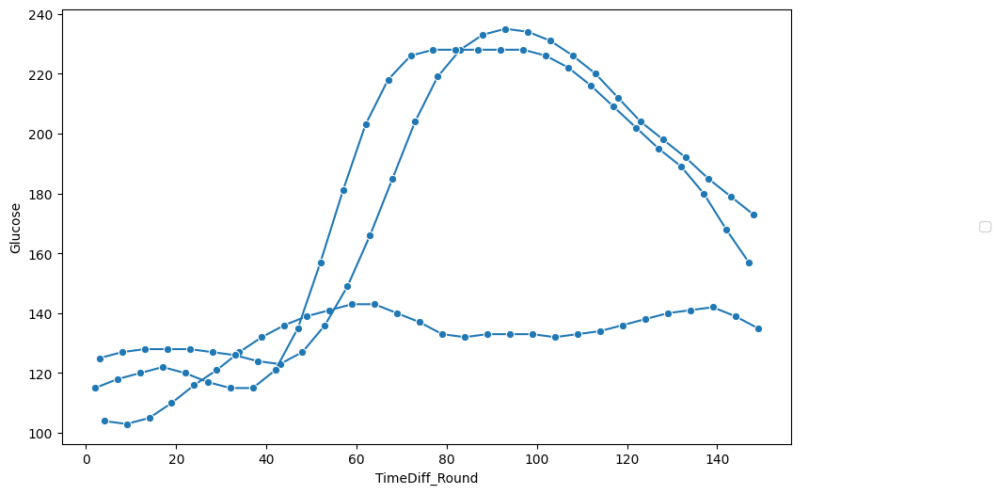

In [211]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=thirteen_ogtt, y="Glucose", x="TimeDiff_Round", palette='bright',units='date',estimator=None, marker='o')
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)

NameError: name 'df_test' is not defined

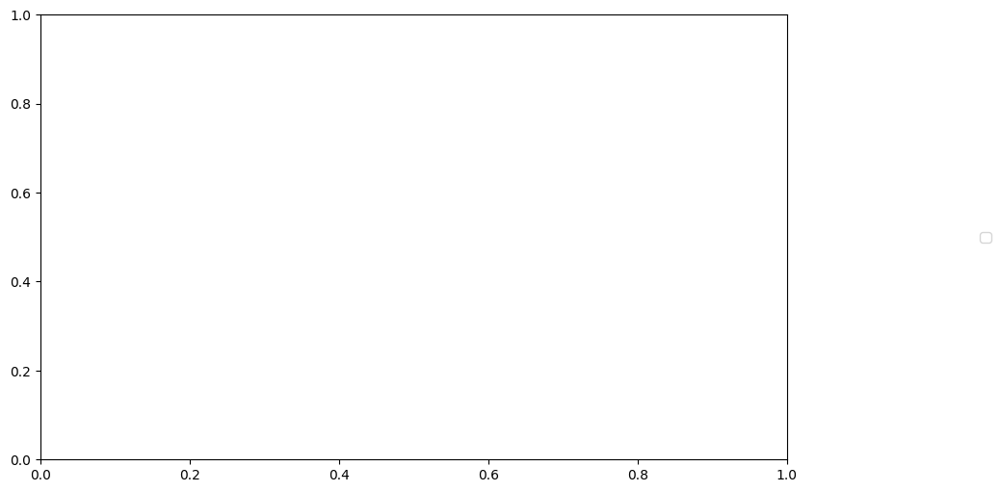

In [212]:
# import seaborn as sns
# plt.figure(figsize=(10,6))
# plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
# sns.lineplot(data=df_test, y="Glucose", x="nearest_TimeDiff_Round", palette='bright')
# plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)

[Text(0.5, 1.0, 'ID=13')]

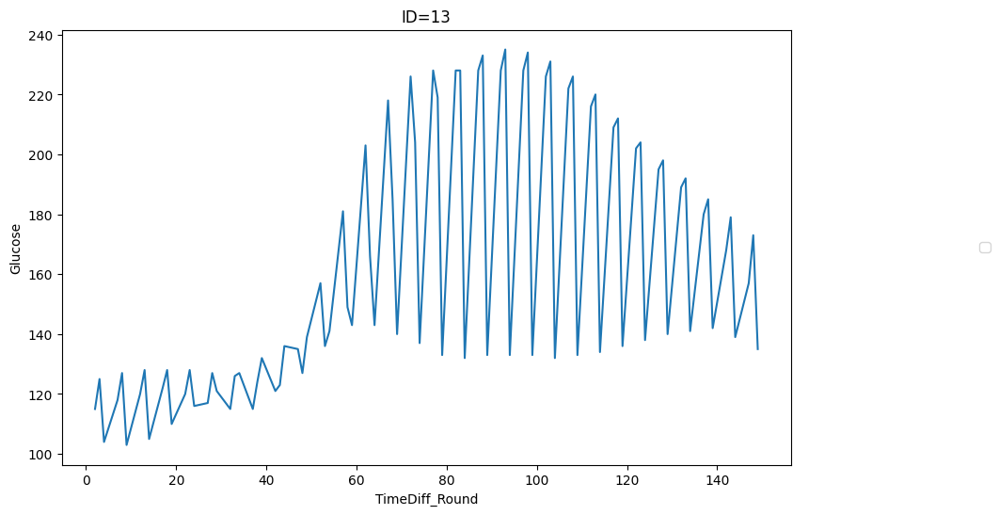

In [213]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=thirteen_ogtt, y="Glucose", x="TimeDiff_Round").set(title='ID=13')
# sns.lineplot(data=df_gtt_thirteen, y="Glucose", x="TimeDiff_Round", color='red',estimator=None)
# sns.lineplot(data=bosst_cgm_thirteen, y="Glucose", x="TimeDiff_Round", color='orange')
# plt.legend(labels=["Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [214]:
boost_sub=bosst_cgm_thirteen[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_thirteen[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
ogtt_sub=thirteen_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
boost_sub['id']=13
gtt_sub['id']=13
ogtt_sub['id']=13

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

food_responses=food_responses.append([ogtt_sub,gtt_sub,boost_sub])
food_responses


,TimeDiff,Glucose,Time,date,id,type
80,3.516667,94.0,2019-09-17 06:43:31,2019-09-17,1,standard_meal
81,8.533333,95.0,2019-09-17 06:48:32,2019-09-17,1,standard_meal
82,13.533333,97.0,2019-09-17 06:53:32,2019-09-17,1,standard_meal
83,18.533333,97.0,2019-09-17 06:58:32,2019-09-17,1,standard_meal
84,23.533333,95.0,2019-09-17 07:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
1985,146.666667,127.0,2020-06-04 11:51:40,2020-06-04,13,boost_cgm
1986,151.666667,125.0,2020-06-04 11:56:40,2020-06-04,13,boost_cgm
1987,156.650000,126.0,2020-06-04 12:01:39,2020-06-04,13,boost_cgm
1988,161.650000,118.0,2020-06-04 12:06:39,2020-06-04,13,boost_cgm


In [215]:
max_times=thirteen_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
thirteen_ogtt.groupby('date')['TimeDiff_Round'].nunique()

dates=thirteen_ogtt['date'].unique()
df_first_date=thirteen_ogtt[thirteen_ogtt['date']==dates[0]]

# thirteen_ogtt_test=thirteen_ogtt

column_names = thirteen_ogtt.columns.tolist()

# Create an empty DataFrame with the same columns
df_ppgr_grouped_thirteen = pd.DataFrame(columns=column_names)

for i in dates:
  df_date=thirteen_ogtt[thirteen_ogtt['date']==i]
  print(i)
  # df_date['nearest_time'] = df_first_date['TimeDiff'].apply(find_nearest_value)
  result_df = find_nearest_value(df_date, df_first_date, 'TimeDiff_Round', 'TimeDiff_Round')
  df_ppgr_grouped_thirteen=df_ppgr_grouped_thirteen.append(result_df)


# For grouped
boost_sub=bosst_cgm_thirteen[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_thirteen[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
# ogtt_sub=thirteen_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
ogtt_sub=df_ppgr_grouped_thirteen[['nearest_TimeDiff_Round','Glucose','timestamp_dt','date']]
boost_sub['id']=13
gtt_sub['id']=13
ogtt_sub['id']=13

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

ogtt_sub.rename(columns={"nearest_TimeDiff_Round": "nearest_time_diff"},inplace=True)
boost_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)
gtt_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)


food_responses_grouped=food_responses_grouped.append([ogtt_sub,gtt_sub,boost_sub])
food_responses_grouped


2020-05-29
2020-05-31
2020-06-02


,nearest_time_diff,Glucose,Time,date,id,type
80,4.000000,94.0,2019-09-17 06:43:31,2019-09-17,1,standard_meal
81,9.000000,95.0,2019-09-17 06:48:32,2019-09-17,1,standard_meal
82,14.000000,97.0,2019-09-17 06:53:32,2019-09-17,1,standard_meal
83,19.000000,97.0,2019-09-17 06:58:32,2019-09-17,1,standard_meal
84,24.000000,95.0,2019-09-17 07:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
1985,146.666667,127.0,2020-06-04 11:51:40,2020-06-04,13,boost_cgm
1986,151.666667,125.0,2020-06-04 11:56:40,2020-06-04,13,boost_cgm
1987,156.650000,126.0,2020-06-04 12:01:39,2020-06-04,13,boost_cgm
1988,161.650000,118.0,2020-06-04 12:06:39,2020-06-04,13,boost_cgm


In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=ogtt_sub, y="Glucose", x="nearest_time_diff").set(title='ID=13')
sns.lineplot(data=boost_sub, y="Glucose", x="nearest_time_diff", color='red',estimator=None)
sns.lineplot(data=gtt_sub, y="Glucose", x="nearest_time_diff", color='orange')
plt.legend(labels=["Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [ ]:
# import seaborn as sns
# plt.figure(figsize=(10,6))
# plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
# sns.lineplot(data=df_gtt_one, y="Glucose", x="TimeDiff", color='red',estimator=None).set(title='Clinic OGTT')
# sns.lineplot(data=df_gtt_two, y="Glucose", x="TimeDiff", color='olive',estimator=None)
# sns.lineplot(data=df_gtt_three, y="Glucose", x="TimeDiff", color='limegreen',estimator=None)
# sns.lineplot(data=df_gtt_four, y="Glucose", x="TimeDiff", color='coral',estimator=None)
# sns.lineplot(data=df_gtt_five, y="Glucose", x="TimeDiff", color='violet',estimator=None)
# sns.lineplot(data=df_gtt_six, y="Glucose", x="TimeDiff", color='cornflowerblue',estimator=None)
# sns.lineplot(data=df_gtt_seven, y="Glucose", x="TimeDiff", color='blue',estimator=None)
# sns.lineplot(data=df_gtt_eight, y="Glucose", x="TimeDiff", color='teal',estimator=None)
# sns.lineplot(data=df_gtt_nine, y="Glucose", x="TimeDiff", color='maroon',estimator=None)
# sns.lineplot(data=df_gtt_ten, y="Glucose", x="TimeDiff", color='cyan',estimator=None)
# sns.lineplot(data=df_gtt_eleven, y="Glucose", x="TimeDiff", color='peru',estimator=None)
# sns.lineplot(data=df_gtt_twelve, y="Glucose", x="TimeDiff", color='deeppink',estimator=None)
# sns.lineplot(data=df_gtt_thirteen, y="Glucose", x="TimeDiff", color='green',estimator=None)
# sns.lineplot(data=df_gtt_fourteen, y="Glucose", x="TimeDiff", color='orange',estimator=None)
# plt.legend(labels=["One","Two","Three","Four","Five","Six","Seven","Eight","Nine","Ten","Eleven","Twelve","Thirteen","Fourteen"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [216]:
s = '19-014'

GTT = [91, 68, 75, 56]
GTT_times = ['2020-01-15 9:47:00', '2020-01-15 10:20:00', '2020-01-15 10:50:00', '2020-01-15 11:50:00']
GTT_times = pd.to_datetime(GTT_times, format='%Y-%m-%dT%H:%M:%S')

df_gtt_fourteen = pd.DataFrame({'Glucose': GTT, 'Time': GTT_times})

df_gtt_fourteen['Time']=pd.to_datetime(df_gtt_fourteen['Time'])
auc_ogtt_fourteen=calculate_area_under_curve(df_gtt_fourteen)
auc_ogtt_fourteen

8698

In [217]:
# df_gtt_fourteen['Time']=pd.to_datetime(df_gtt_fourteen['Time'])
# df_gtt_fourteen['TimeDiff'] = (df_gtt_fourteen['Time'] - df_gtt_fourteen['Time'].min()).dt.total_seconds()/ 60

In [218]:
cgm_fourteen = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/014/Dexcom_014.csv')
cgm_fourteen['timestamp_dt'] = pd.to_datetime(cgm_fourteen['Timestamp (YYYY-MM-DDThh:mm:ss)'])
cgm_fourteen['Glucose'] = cgm_fourteen['Glucose Value (mg/dL)']
cgm_fourteen['Time'] = pd.to_datetime(cgm_fourteen['Timestamp (YYYY-MM-DDThh:mm:ss)'])

cgm_fourteen = cgm_fourteen.dropna(subset=['timestamp_dt'])
cgm_fourteen['date'] = cgm_fourteen['timestamp_dt'].dt.date

food_fourteen = pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/014/Food_Log_014.csv')
food_fourteen['date'] = pd.to_datetime(food_fourteen['date']).dt.date
food_fourteen['time_begin'] = pd.to_datetime(food_fourteen['time_begin'])
window_dt = pd.Timedelta(minutes=120)
food_fourteen["time_begin_win"] = food_fourteen["time_begin"] + window_dt

merge_food_cgm_fourteen = pd.merge(cgm_fourteen, food_fourteen, left_on=['date'], right_on=['date'])

cf_fourteen = food_fourteen[food_fourteen['logged_food']=='Standard Breakfast']

merge_food_cgm_fourteen = pd.merge(cgm_fourteen, cf_fourteen, left_on=['date'], right_on=['date'])
window_dt_brkfst=pd.Timedelta(minutes=-30)

food_cgm_fourteen_cf = merge_food_cgm_fourteen[(merge_food_cgm_fourteen['timestamp_dt'] <= merge_food_cgm_fourteen['time_begin_win']) & (merge_food_cgm_fourteen['timestamp_dt'] >= (merge_food_cgm_fourteen['time_begin']+window_dt_brkfst))]

food_cgm_fourteen_cf['pre_glu_time'] = food_cgm_fourteen_cf.groupby('date')['timestamp_dt'].transform('min')

column_names = food_cgm_fourteen_cf.columns.values
food_cgm_fourteen_cf_all_dates = pd.DataFrame(columns=column_names)

for i in food_cgm_fourteen_cf['date'].unique():
    date_sub = food_cgm_fourteen_cf[food_cgm_fourteen_cf['date'] == i]

    date_sub = date_sub.sort_values(by='timestamp_dt')
    min_glu = date_sub['Glucose Value (mg/dL)'].iloc[0]
    date_sub['min_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('min_glu')] = min_glu

    final_glu = date_sub['Glucose Value (mg/dL)'].iloc[-1]
    date_sub['final_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('final_glu')] = final_glu

    max_glu = date_sub['Glucose Value (mg/dL)'].max()
    date_sub['max_glu'] = 0
    date_sub.iloc[:, date_sub.columns.get_loc('max_glu')] = max_glu

    # date_sub['meal_auc'] = calculate_area_under_curve(date_sub)
    # date_sub['auc_ogtt_fourteen'] = auc_ogtt_fourteen
    # j = i - dt.timedelta(days=1)
    # cgm_fourteen_ld = cgm_fourteen[cgm_fourteen['date'] == j]

    # date_sub['mean_glu_ld'] = cgm_fourteen_ld.groupby('date')['Glucose'].transform('mean').iloc[0]
    # date_sub['interdaycv'] = interdaycv(cgm_fourteen_ld)
    # date_sub['interdaysd'] = interdaysd(cgm_fourteen_ld)
    # date_sub['TIR'] = TIR(cgm_fourteen_ld, sd=1, sr=5)
    # date_sub['TOR'] = TOR(cgm_fourteen_ld, sd=1, sr=5)
    # date_sub['POR'] = POR(cgm_fourteen_ld, sd=1, sr=5)
    # date_sub['PIR'] = PIR(cgm_fourteen_ld, sd=1, sr=5)
    # date_sub['MGE'] = MGE(cgm_fourteen_ld, sd=1)
    # date_sub['MGN'] = MGN(cgm_fourteen_ld, sd=1)
    # # MAGE(cgm_fourteen, std=1)
    # date_sub['J_index'] = J_index(cgm_fourteen_ld)
    # date_sub['LBGI'] = LBGI(cgm_fourteen_ld)
    # date_sub['HBGI'] = HBGI(cgm_fourteen_ld)
    # # MODD(cgm_fourteen)
    # # CONGA24(cgm_fourteen)
    # date_sub['GMI'] = GMI(date_sub)

    food_cgm_fourteen_cf_all_dates = food_cgm_fourteen_cf_all_dates.append(date_sub)

fourteen_ogtt = food_cgm_fourteen_cf_all_dates

fourteen_ogtt_dup = fourteen_ogtt.drop_duplicates(subset=['date'], keep='first')
fourteen_ogtt_dup['id'] = 14
fourteen_ogtt_dup['a1c'] = "norm"


In [219]:
food_fourteen[food_fourteen['logged_food']=='Standard Breakfast']

,date,time,time_begin,time_end,logged_food,amount,unit,searched_food,calorie,total_carb,dietary_fiber,sugar,protein,total_fat,time_begin_win
8,2020-06-06,06:10:00,2020-06-06 06:10:00,06:15:00,Standard Breakfast,NaN,NaN,NaN,280,56.5,1.0,24.0,8.0,2.5,2020-06-06 08:10:00
28,2020-06-08,06:10:00,2020-06-08 06:10:00,06:15:00,Standard Breakfast,NaN,NaN,NaN,280,56.5,1.0,24.0,8.0,2.5,2020-06-08 08:10:00
51,2020-06-10,06:15:00,2020-06-10 06:15:00,06:25:00,Standard Breakfast,NaN,NaN,NaN,280,56.5,1.0,24.0,8.0,2.5,2020-06-10 08:15:00
73,2020-06-12,06:05:00,2020-06-12 06:05:00,06:10:00,Standard Breakfast,NaN,NaN,NaN,280,56.5,1.0,24.0,8.0,2.5,2020-06-12 08:05:00


In [220]:
food_fourteen[food_fourteen['logged_food']=='Boost']

,date,time,time_begin,time_end,logged_food,amount,unit,searched_food,calorie,total_carb,dietary_fiber,sugar,protein,total_fat,time_begin_win
87,2020-06-13,09:30:00,2020-06-13 09:30:00,NaN,Boost,NaN,NaN,NaN,654,82.0,5.6,40.0,26.0,26.0,2020-06-13 11:30:00


In [221]:
window_dt = pd.Timedelta(minutes=120)
boost_time=dt.datetime(2020,6,13,9,17,0)
#9:34:00
#8:53:00
# 2020-01-15 9:47:00

# boost_cgm_fourteen=cgm_fourteen[(cgm_fourteen['timestamp_dt']>=boost_time)&(cgm_fourteen['timestamp_dt']<=boost_time + window_dt)]
boost_cgm_fourteen=cgm_fourteen[(cgm_fourteen['timestamp_dt']>=boost_time)]
boost_cgm_fourteen.head(4)

,Index,Timestamp (YYYY-MM-DDThh:mm:ss),Event Type,Event Subtype,Patient Info,Device Info,Source Device ID,Glucose Value (mg/dL),Insulin Value (u),Carb Value (grams),Duration (hh:mm:ss),Glucose Rate of Change (mg/dL/min),Transmitter Time (Long Integer),timestamp_dt,Glucose,Time,date
2231,2232,2020-06-13 09:17:56,EGV,NaN,NaN,NaN,Android G6,103.0,NaN,NaN,NaN,NaN,673485.0,2020-06-13 09:17:56,103.0,2020-06-13 09:17:56,2020-06-13
2232,2233,2020-06-13 09:22:55,EGV,NaN,NaN,NaN,Android G6,103.0,NaN,NaN,NaN,NaN,673785.0,2020-06-13 09:22:55,103.0,2020-06-13 09:22:55,2020-06-13
2233,2234,2020-06-13 09:27:56,EGV,NaN,NaN,NaN,Android G6,103.0,NaN,NaN,NaN,NaN,674085.0,2020-06-13 09:27:56,103.0,2020-06-13 09:27:56,2020-06-13
2234,2235,2020-06-13 09:32:56,EGV,NaN,NaN,NaN,Android G6,103.0,NaN,NaN,NaN,NaN,674385.0,2020-06-13 09:32:56,103.0,2020-06-13 09:32:56,2020-06-13


In [222]:

fourteen_ogtt['TimeDiff'] = (fourteen_ogtt['timestamp_dt'] - (fourteen_ogtt['time_begin']+window_dt_brkfst)).dt.total_seconds()/ 60

# Group by and use cumcount
fourteen_ogtt['SequentialTimeValues'] = fourteen_ogtt.groupby('date').cumcount() + 1

df_gtt_fourteen['Time']=pd.to_datetime(df_gtt_fourteen['Time'])

df_gtt_fourteen['TimeDiff'] = (df_gtt_fourteen['Time'] - (df_gtt_fourteen['Time'].min()+window_dt_brkfst)).dt.total_seconds()/ 60

boost_cgm_fourteen['TimeDiff'] = (boost_cgm_fourteen['timestamp_dt'] - boost_time).dt.total_seconds()/ 60

In [223]:
fourteen_ogtt['TimeDiff_Round']=fourteen_ogtt['TimeDiff'].round()

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

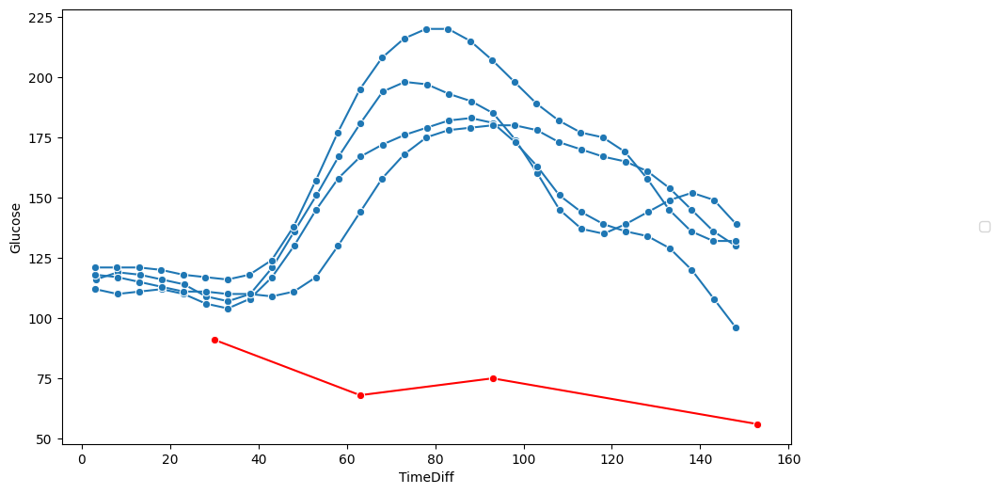

In [224]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=fourteen_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None, marker='o')
sns.lineplot(data=df_gtt_fourteen, y="Glucose", x="TimeDiff", marker='o',color='red')


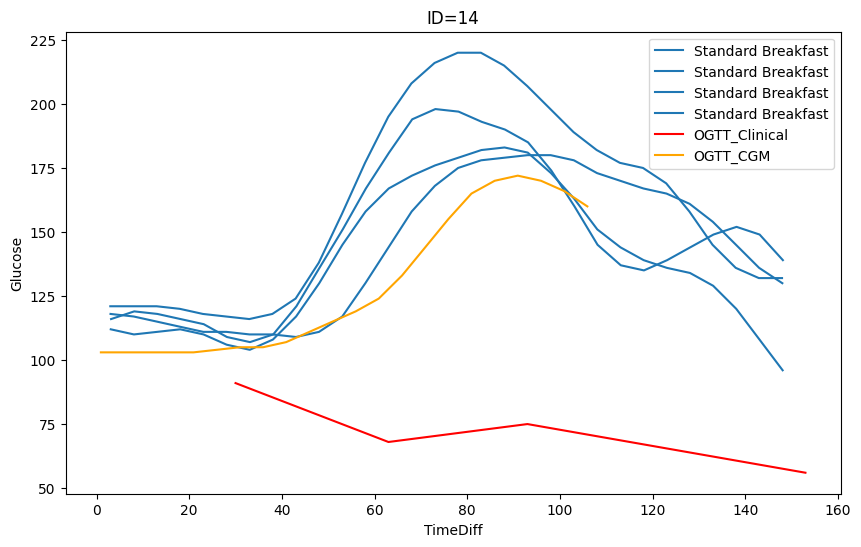

In [225]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=fourteen_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=14')
sns.lineplot(data=df_gtt_fourteen, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_fourteen, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"])


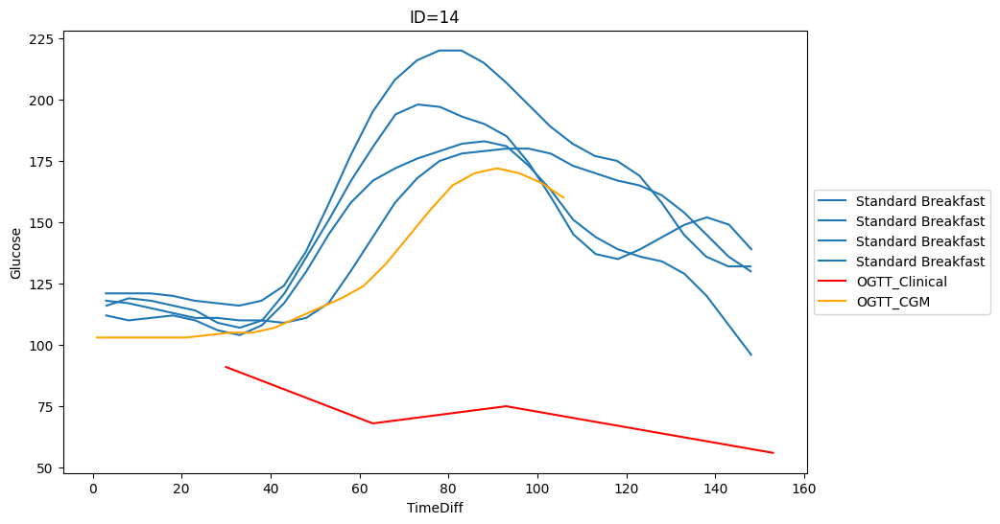

In [226]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=fourteen_ogtt, y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=14')
sns.lineplot(data=df_gtt_fourteen, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_fourteen, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)


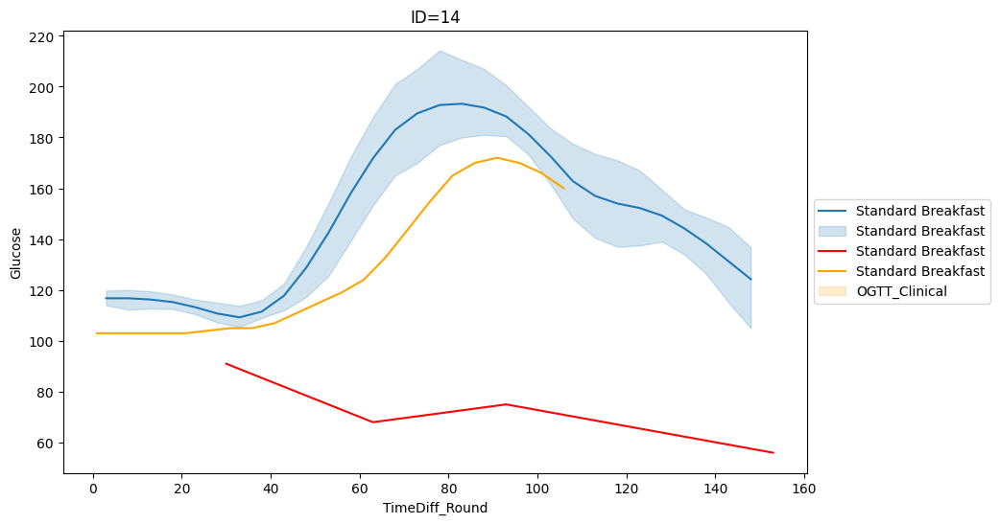

In [227]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=fourteen_ogtt, y="Glucose", x="TimeDiff_Round", palette='bright').set(title='ID=14')
sns.lineplot(data=df_gtt_fourteen, y="Glucose", x="TimeDiff", color='red',estimator=None)
sns.lineplot(data=boost_cgm_fourteen, y="Glucose", x="TimeDiff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)


In [228]:
boost_sub=boost_cgm_fourteen[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_fourteen[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
ogtt_sub=fourteen_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
boost_sub['id']=14
gtt_sub['id']=14
ogtt_sub['id']=14

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

food_responses=food_responses.append([ogtt_sub,gtt_sub,boost_sub])
food_responses


,TimeDiff,Glucose,Time,date,id,type
80,3.516667,94.0,2019-09-17 06:43:31,2019-09-17,1,standard_meal
81,8.533333,95.0,2019-09-17 06:48:32,2019-09-17,1,standard_meal
82,13.533333,97.0,2019-09-17 06:53:32,2019-09-17,1,standard_meal
83,18.533333,97.0,2019-09-17 06:58:32,2019-09-17,1,standard_meal
84,23.533333,95.0,2019-09-17 07:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2248,85.933333,170.0,2020-06-13 10:42:56,2020-06-13,14,boost_cgm
2249,90.916667,172.0,2020-06-13 10:47:55,2020-06-13,14,boost_cgm
2250,95.933333,170.0,2020-06-13 10:52:56,2020-06-13,14,boost_cgm
2251,100.916667,166.0,2020-06-13 10:57:55,2020-06-13,14,boost_cgm


In [229]:
max_times=fourteen_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
fourteen_ogtt.groupby('date')['TimeDiff_Round'].nunique()

date
2020-06-06    31
2020-06-08    30
2020-06-10    30
2020-06-12    30
Name: TimeDiff_Round, dtype: int64

In [230]:
max_times=fourteen_ogtt.groupby('date')['TimeDiff_Round'].nunique().max()
fourteen_ogtt.groupby('date')['TimeDiff_Round'].nunique()

dates=fourteen_ogtt['date'].unique()
df_first_date=fourteen_ogtt[fourteen_ogtt['date']==dates[0]]

# fourteen_ogtt_test=fourteen_ogtt

column_names = fourteen_ogtt.columns.tolist()

# Create an empty DataFrame with the same columns
df_ppgr_grouped_fourteen = pd.DataFrame(columns=column_names)

for i in dates:
  df_date=fourteen_ogtt[fourteen_ogtt['date']==i]
  print(i)
  # df_date['nearest_time'] = df_first_date['TimeDiff'].apply(find_nearest_value)
  result_df = find_nearest_value(df_date, df_first_date, 'TimeDiff_Round', 'TimeDiff_Round')
  df_ppgr_grouped_fourteen=df_ppgr_grouped_fourteen.append(result_df)


# For grouped
boost_sub=boost_cgm_fourteen[['TimeDiff','Glucose','timestamp_dt','date']]
gtt_sub=df_gtt_fourteen[['TimeDiff','Glucose','Time']]
gtt_sub['date']=gtt_sub.Time.dt.date
# ogtt_sub=fourteen_ogtt[['TimeDiff','Glucose','timestamp_dt','date']]
ogtt_sub=df_ppgr_grouped_fourteen[['nearest_TimeDiff_Round','Glucose','timestamp_dt','date']]
boost_sub['id']=14
gtt_sub['id']=14
ogtt_sub['id']=14

boost_sub['type']='boost_cgm'
gtt_sub['type']='boost_clinical'
ogtt_sub['type']='standard_meal'

boost_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)
ogtt_sub.rename(columns={"timestamp_dt": "Time"},inplace=True)

ogtt_sub.rename(columns={"nearest_TimeDiff_Round": "nearest_time_diff"},inplace=True)
boost_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)
gtt_sub.rename(columns={"TimeDiff": "nearest_time_diff"},inplace=True)


food_responses_grouped=food_responses_grouped.append([ogtt_sub,gtt_sub,boost_sub])
food_responses_grouped


2020-06-06
2020-06-08
2020-06-10
2020-06-12


,nearest_time_diff,Glucose,Time,date,id,type
80,4.000000,94.0,2019-09-17 06:43:31,2019-09-17,1,standard_meal
81,9.000000,95.0,2019-09-17 06:48:32,2019-09-17,1,standard_meal
82,14.000000,97.0,2019-09-17 06:53:32,2019-09-17,1,standard_meal
83,19.000000,97.0,2019-09-17 06:58:32,2019-09-17,1,standard_meal
84,24.000000,95.0,2019-09-17 07:03:32,2019-09-17,1,standard_meal
...,...,...,...,...,...,...
2248,85.933333,170.0,2020-06-13 10:42:56,2020-06-13,14,boost_cgm
2249,90.916667,172.0,2020-06-13 10:47:55,2020-06-13,14,boost_cgm
2250,95.933333,170.0,2020-06-13 10:52:56,2020-06-13,14,boost_cgm
2251,100.916667,166.0,2020-06-13 10:57:55,2020-06-13,14,boost_cgm


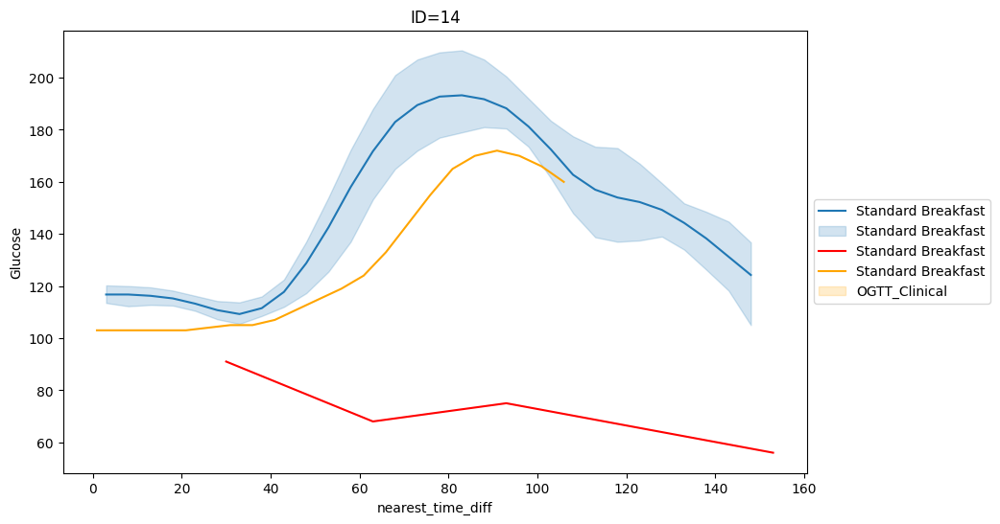

In [249]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=ogtt_sub, y="Glucose", x="nearest_time_diff", palette='bright').set(title='ID=14')
sns.lineplot(data=gtt_sub, y="Glucose", x="nearest_time_diff", color='red',estimator=None)
sns.lineplot(data=boost_sub, y="Glucose", x="nearest_time_diff", color='orange')
plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)


In [231]:
food_responses.columns

Index(['TimeDiff', 'Glucose', 'Time', 'date', 'id', 'type'], dtype='object')

In [232]:
# import seaborn as sns
# plt.figure(figsize=(10,6))
# plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
# sns.lineplot(data=food_responses, y="Glucose", x="TimeDiff",units='date',estimator=None, hue="id").set(title='ID=14')
# # sns.lineplot(data=df_gtt_fourteen, y="Glucose", x="TimeDiff", color='red',estimator=None)
# # sns.lineplot(data=boost_cgm_fourteen, y="Glucose", x="TimeDiff", color='orange')
# plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)


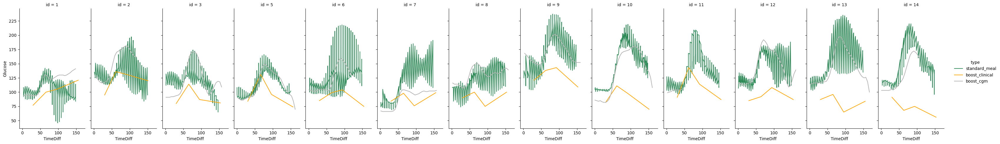

In [233]:
pal = dict(standard_meal="seagreen", boost_cgm=".7", boost_clinical="orange")
# g = sns.FacetGrid(food_responses, col="id", hue="type", palette=pal, height=6, col_wrap=4, aspect=1)
g = sns.FacetGrid(food_responses, col="id", hue="type", palette=pal, height=5, aspect=.5)
g.map(sns.lineplot, "TimeDiff", "Glucose",estimator='mean',err_style='band')
# g.set(xticks=[10, 30, 50], yticks=[2, 6, 10])
# plt.figure(figsize=(10,6))
# g.ax.set_xlabel("Time",fontsize=30)
# g.ax.set_ylabel("Glucose",fontsize=20)
# g.ax.tick_params(labelsize=15)
g.add_legend()

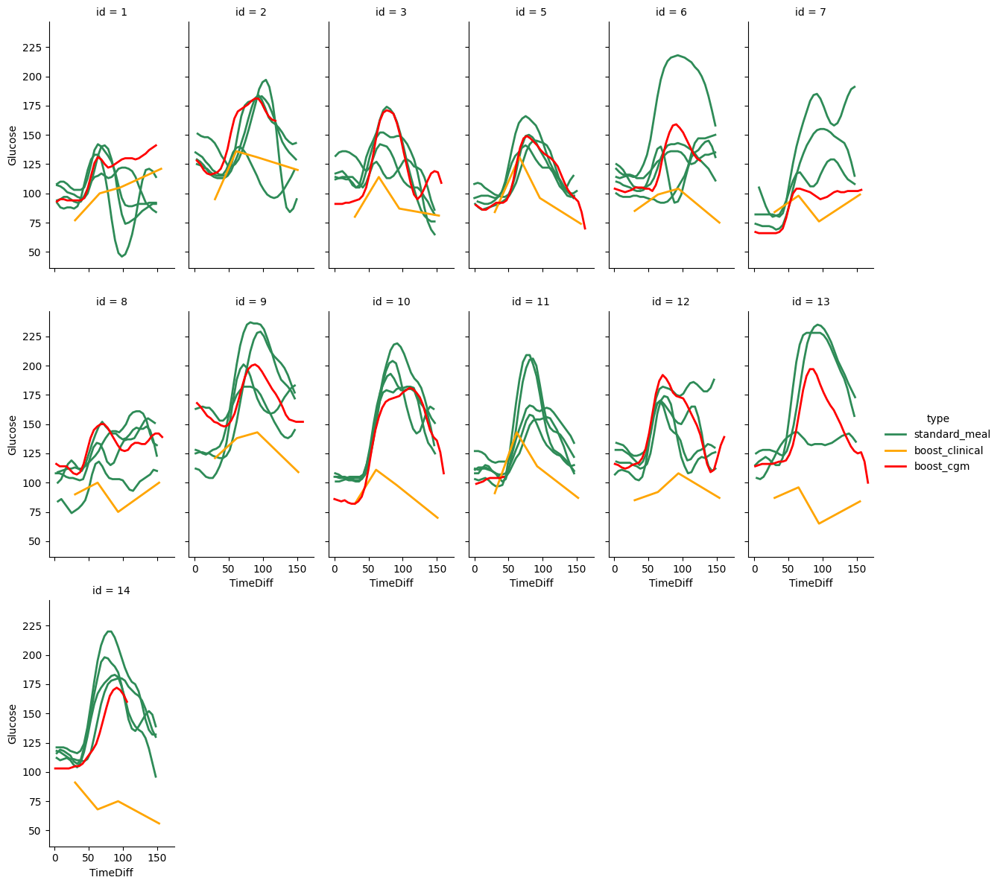

In [247]:
pal = dict(standard_meal="seagreen", boost_cgm="red", boost_clinical="orange")
g = sns.FacetGrid(food_responses, col="id", hue="type", palette=pal, height=4, col_wrap=6, aspect=.5)
# g = sns.FacetGrid(food_responses, col="id", hue="type", palette=pal, height=5, aspect=.5)
# g.map(sns.lineplot, "TimeDiff", "Glucose","date",estimator=None,linewidth=3)
g.map_dataframe(sns.lineplot, x='TimeDiff', y='Glucose', units='date', estimator=None,linewidth=2)
# g.set(xticks=[10, 30, 50], yticks=[2, 6, 10])
# plt.figure(figsize=(10,6))
# g.ax.set_xlabel("Time",fontsize=30)
# g.ax.set_ylabel("Glucose",fontsize=20)
# g.ax.tick_params(labelsize=15)
g.add_legend()

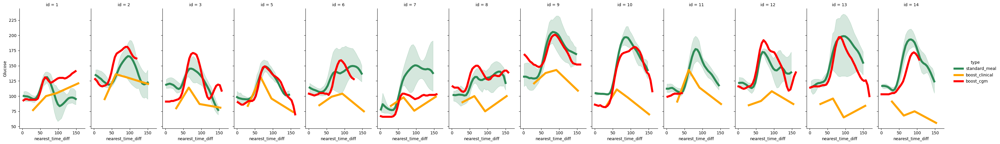

In [234]:
pal = dict(standard_meal="seagreen", boost_cgm="red", boost_clinical="orange")
# g = sns.FacetGrid(food_responses, col="id", hue="type", palette=pal, height=6, col_wrap=4, aspect=1)
g = sns.FacetGrid(food_responses_grouped, col="id", hue="type", palette=pal, height=5, aspect=.5)
g.map(sns.lineplot, "nearest_time_diff", "Glucose",estimator='mean',err_style='band',linewidth=5)
# g.set(xticks=[10, 30, 50], yticks=[2, 6, 10])
# plt.figure(figsize=(10,6))
# g.ax.set_xlabel("Time",fontsize=30)
# g.ax.set_ylabel("Glucose",fontsize=20)
# g.ax.tick_params(labelsize=15)
g.add_legend()

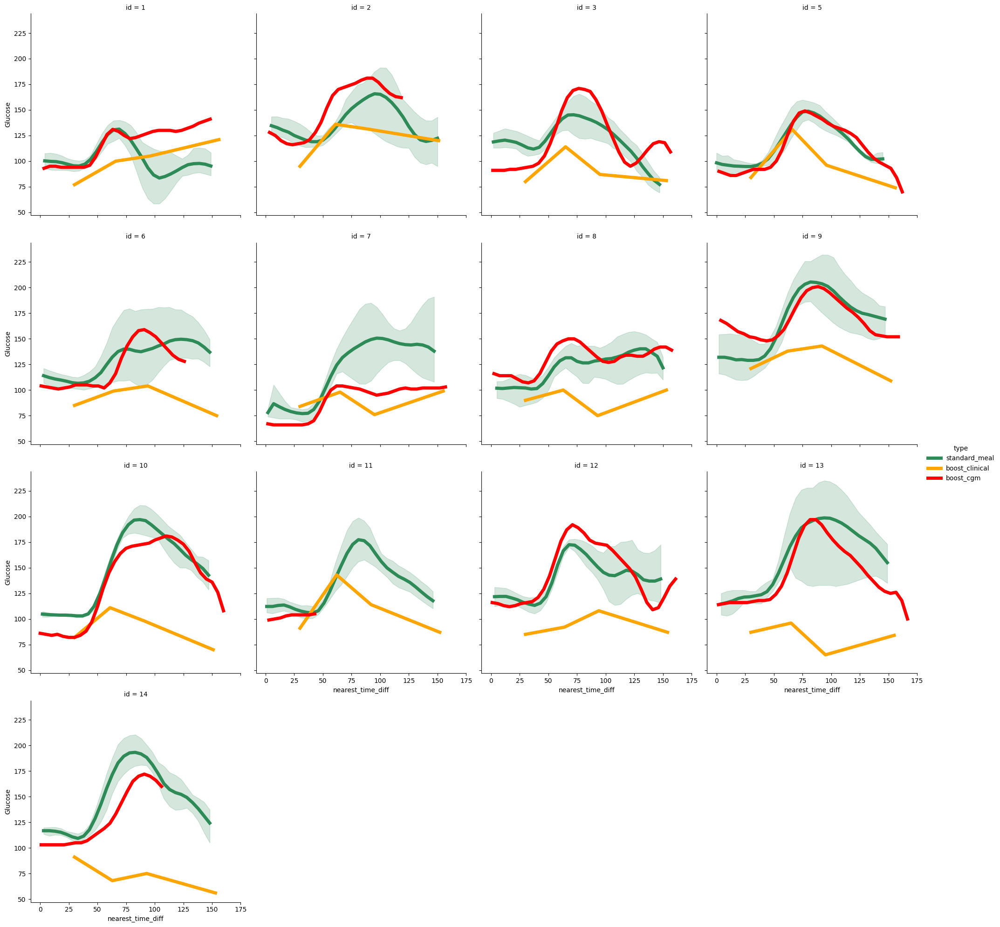

In [235]:
pal = dict(standard_meal="seagreen", boost_cgm="red", boost_clinical="orange")
g = sns.FacetGrid(food_responses_grouped, col="id", hue="type", palette=pal, height=5, col_wrap=4, aspect=1)
# g = sns.FacetGrid(food_responses_grouped, col="id", hue="type", palette=pal, height=5, aspect=.5)
g.map(sns.lineplot, "nearest_time_diff", "Glucose",estimator='mean',err_style='band',linewidth=5)
# g.set(xticks=[10, 30, 50], yticks=[2, 6, 10])
# plt.figure(figsize=(10,6))
# g.ax.set_xlabel("Time",fontsize=30)
# g.ax.set_ylabel("Glucose",fontsize=20)
# g.ax.tick_params(labelsize=15)
g.add_legend()

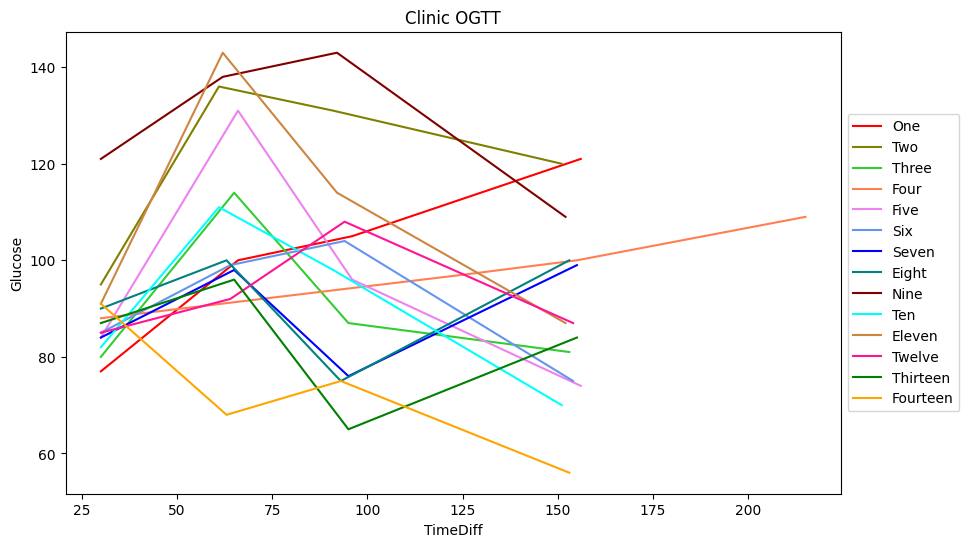

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=df_gtt_one, y="Glucose", x="TimeDiff", color='red',estimator=None).set(title='Clinic OGTT')
sns.lineplot(data=df_gtt_two, y="Glucose", x="TimeDiff", color='olive',estimator=None)
sns.lineplot(data=df_gtt_three, y="Glucose", x="TimeDiff", color='limegreen',estimator=None)
sns.lineplot(data=df_gtt_four, y="Glucose", x="TimeDiff", color='coral',estimator=None)
sns.lineplot(data=df_gtt_five, y="Glucose", x="TimeDiff", color='violet',estimator=None)
sns.lineplot(data=df_gtt_six, y="Glucose", x="TimeDiff", color='cornflowerblue',estimator=None)
sns.lineplot(data=df_gtt_seven, y="Glucose", x="TimeDiff", color='blue',estimator=None)
sns.lineplot(data=df_gtt_eight, y="Glucose", x="TimeDiff", color='teal',estimator=None)
sns.lineplot(data=df_gtt_nine, y="Glucose", x="TimeDiff", color='maroon',estimator=None)
sns.lineplot(data=df_gtt_ten, y="Glucose", x="TimeDiff", color='cyan',estimator=None)
sns.lineplot(data=df_gtt_eleven, y="Glucose", x="TimeDiff", color='peru',estimator=None)
sns.lineplot(data=df_gtt_twelve, y="Glucose", x="TimeDiff", color='deeppink',estimator=None)
sns.lineplot(data=df_gtt_thirteen, y="Glucose", x="TimeDiff", color='green',estimator=None)
sns.lineplot(data=df_gtt_fourteen, y="Glucose", x="TimeDiff", color='orange',estimator=None)
plt.legend(labels=["One","Two","Three","Four","Five","Six","Seven","Eight","Nine","Ten","Eleven","Twelve","Thirteen","Fourteen"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [ ]:
# groupby_object = df_melt.groupby('variable')
# count number of groups to determine the required number of subplots
number_of_columns = 2
df_ogtt[1]=fourteen_ogtt
df_gtt[1]=df_gtt_fourteen
df_boost[1]=boost_cgm_fourteen

df_ogtt[2]=thirteen_ogtt
df_gtt[2]=df_gtt_thirteen
df_boost[2]=boost_cgm_thirteen

fig, axs = plt.subplots(1, number_of_columns+1, sharey=True)
for i, (_, g) in enumerate(2):
    # feed data from each sub-dataframe `g` to regplot
    # sns.regplot(data=g, x='value', y='wage', ax=axs[i])
    sns.lineplot(data=df_ogtt[i], y="Glucose", x="TimeDiff", palette='bright',units='date',estimator=None).set(title='ID=14')
    sns.lineplot(data=df_gtt[i], y="Glucose", x="TimeDiff", color='red',estimator=None)
    sns.lineplot(data=df_boost[i], y="Glucose", x="TimeDiff", color='orange')
    plt.legend(labels=["Standard Breakfast","Standard Breakfast","Standard Breakfast","Standard Breakfast","OGTT_Clinical","OGTT_CGM"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

NameError: name 'fourteen_ogtt' is not defined

In [ ]:
boost_cgm_one['id'] = 1

boost_cgm_two['id'] = 2

boost_cgm_three['id'] = 3

# three_ogtt['id'] = 3

boost_cgm_four['id'] = 4

boost_cgm_five['id'] = 5

boost_cgm_six['id'] = 6

#six_ogtt['id'] = 6

boost_cgm_seven['id'] = 7

boost_cgm_eight['id'] = 8

boost_cgm_nine['id'] = 9

boost_cgm_ten['id'] = 10

boost_cgm_eleven['id'] = 11

boost_cgm_twelve['id'] = 12

#ten_ogtt['id'] = 10

#eleven_ogtt['id'] = 11

#twelve_ogtt['id'] = 12

bosst_cgm_thirteen['id'] = 13

#fourteen_ogtt['id'] = 14

boost_cgm_fourteen['id'] = 14


In [ ]:
# Append all the DataFrames
result_df_boost = boost_cgm_one.append([boost_cgm_one, boost_cgm_two, boost_cgm_three, boost_cgm_four, boost_cgm_five,
                                        boost_cgm_six, boost_cgm_seven
                                  , boost_cgm_eight, boost_cgm_nine, boost_cgm_ten, boost_cgm_eleven,
                                      boost_cgm_twelve,  bosst_cgm_thirteen, boost_cgm_fourteen], ignore_index=True)

# Display the resulting DataFrame
#result_df.id

In [ ]:
result_df_boost.head(2)

,Index,Timestamp (YYYY-MM-DDThh:mm:ss),Event Type,Event Subtype,Patient Info,Device Info,Source Device ID,Glucose Value (mg/dL),Insulin Value (u),Carb Value (grams),Duration (hh:mm:ss),Glucose Rate of Change (mg/dL/min),Transmitter Time (Long Integer),timestamp_dt,Glucose,Time,date,TimeDiff,id
0,2547,2020-02-22 15:43:22,EGV,NaN,NaN,NaN,iPhone G6,94.0,NaN,NaN,NaN,NaN,782694.0,2020-02-22 15:43:22,94.0,2020-02-22 15:43:22,2020-02-22,3.366667,1
1,2548,2020-02-22 15:48:22,EGV,NaN,NaN,NaN,iPhone G6,94.0,NaN,NaN,NaN,NaN,782994.0,2020-02-22 15:48:22,94.0,2020-02-22 15:48:22,2020-02-22,8.366667,1


<Axes: xlabel='TimeDiff', ylabel='Glucose'>

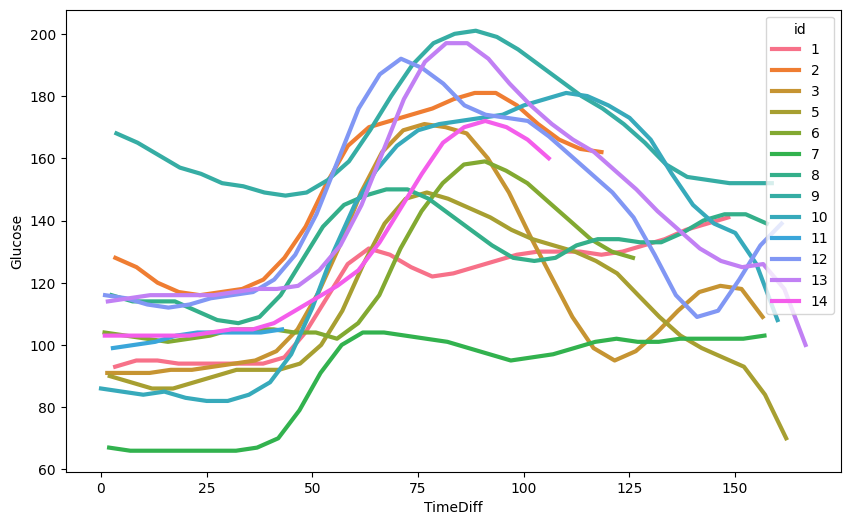

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
pal=sns.color_palette("husl", 14)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df_boost, y="Glucose", x="TimeDiff", hue='id',palette=pal,units='date',estimator=None, linewidth=3)

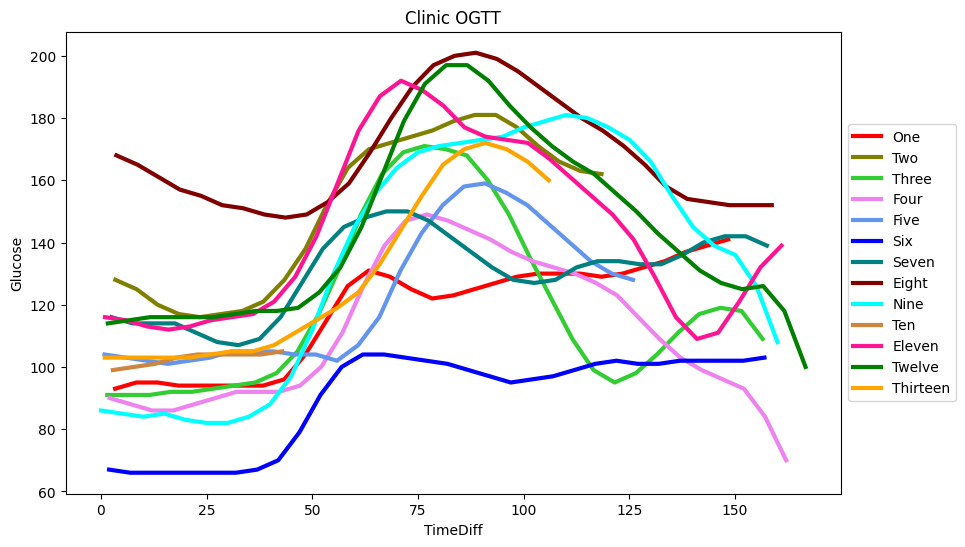

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=boost_cgm_one, y="Glucose", x="TimeDiff", color='red',estimator=None, linewidth=3).set(title='Clinic OGTT')
sns.lineplot(data=boost_cgm_two, y="Glucose", x="TimeDiff", color='olive',estimator=None, linewidth=3)
sns.lineplot(data=boost_cgm_three, y="Glucose", x="TimeDiff", color='limegreen',estimator=None, linewidth=3)
# sns.lineplot(data=boost_cgm_four, y="Glucose", x="TimeDiff", color='coral',estimator=None)
sns.lineplot(data=boost_cgm_five, y="Glucose", x="TimeDiff", color='violet',estimator=None, linewidth=3)
sns.lineplot(data=boost_cgm_six, y="Glucose", x="TimeDiff", color='cornflowerblue',estimator=None, linewidth=3)
sns.lineplot(data=boost_cgm_seven, y="Glucose", x="TimeDiff", color='blue',estimator=None, linewidth=3)
sns.lineplot(data=boost_cgm_eight, y="Glucose", x="TimeDiff", color='teal',estimator=None, linewidth=3)
sns.lineplot(data=boost_cgm_nine, y="Glucose", x="TimeDiff", color='maroon',estimator=None, linewidth=3)
sns.lineplot(data=boost_cgm_ten, y="Glucose", x="TimeDiff", color='cyan',estimator=None, linewidth=3)
sns.lineplot(data=boost_cgm_eleven, y="Glucose", x="TimeDiff", color='peru',estimator=None, linewidth=3)
sns.lineplot(data=boost_cgm_twelve, y="Glucose", x="TimeDiff", color='deeppink',estimator=None, linewidth=3)
sns.lineplot(data=bosst_cgm_thirteen, y="Glucose", x="TimeDiff", color='green',estimator=None, linewidth=3)
sns.lineplot(data=boost_cgm_fourteen, y="Glucose", x="TimeDiff", color='orange',estimator=None, linewidth=3)
plt.legend(labels=["One","Two","Three","Four","Five","Six","Seven","Eight","Nine","Ten","Eleven","Twelve","Thirteen","Fourteen"],loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [ ]:
result_df_boost.loc[result_df_boost['id'] == 1, 'a1c_val_num'] = 5.5
result_df_boost.loc[result_df_boost['id'] == 1, 'a1c'] = 'norm'
result_df_boost.loc[result_df_boost['id'] == 1, 'FPG'] = 77

In [ ]:
result_df_boost.loc[result_df_boost['id'] == 2, 'a1c_val_num'] = 5.6
result_df_boost.loc[result_df_boost['id'] == 2, 'a1c'] = 'norm'
result_df_boost.loc[result_df_boost['id'] == 2, 'FPG'] = 95

In [ ]:
result_df_boost.loc[result_df_boost['id'] == 3, 'a1c_val_num'] = 5.9
result_df_boost.loc[result_df_boost['id'] == 3, 'a1c'] = 'PD'
result_df_boost.loc[result_df_boost['id'] == 3, 'FPG'] = 80

In [ ]:
result_df_boost.loc[result_df_boost['id'] == 4, 'a1c_val_num'] = 6.4
result_df_boost.loc[result_df_boost['id'] == 4, 'a1c'] = 'PD'
result_df_boost.loc[result_df_boost['id'] == 4, 'FPG'] = 88

In [ ]:
result_df_boost.loc[result_df_boost['id'] == 5, 'a1c_val_num'] = 5.7
result_df_boost.loc[result_df_boost['id'] == 5, 'a1c'] = 'PD'
result_df_boost.loc[result_df_boost['id'] == 5, 'FPG'] = 84

In [ ]:
result_df_boost.loc[result_df_boost['id'] == 6, 'a1c_val_num'] = 5.8
result_df_boost.loc[result_df_boost['id'] == 6, 'a1c'] = 'PD'
result_df_boost.loc[result_df_boost['id'] == 6, 'FPG'] = 85

In [ ]:
result_df_boost.loc[result_df_boost['id'] == 7, 'a1c_val_num'] = 5.3
result_df_boost.loc[result_df_boost['id'] == 7, 'a1c'] = 'norm'
result_df_boost.loc[result_df_boost['id'] == 7, 'FPG'] = 84

In [ ]:
result_df_boost.loc[result_df_boost['id'] == 8, 'a1c_val_num'] = 5.6
result_df_boost.loc[result_df_boost['id'] == 8, 'a1c'] = 'norm'
result_df_boost.loc[result_df_boost['id'] == 8, 'FPG'] = 90

In [ ]:
result_df_boost.loc[result_df_boost['id'] == 9, 'a1c_val_num'] = 6.1
result_df_boost.loc[result_df_boost['id'] == 9, 'a1c'] = 'PD'
result_df_boost.loc[result_df_boost['id'] == 9, 'FPG'] = 121

In [ ]:
result_df_boost.loc[result_df_boost['id'] == 10, 'a1c_val_num'] = 6
result_df_boost.loc[result_df_boost['id'] == 10, 'a1c'] = 'PD'
result_df_boost.loc[result_df_boost['id'] == 10, 'FPG'] = 82

In [ ]:
result_df_boost.loc[result_df_boost['id'] == 11, 'a1c_val_num'] = 6
result_df_boost.loc[result_df_boost['id'] == 11, 'a1c'] = 'PD'
result_df_boost.loc[result_df_boost['id'] == 11, 'FPG'] = 91

In [ ]:
result_df_boost.loc[result_df_boost['id'] == 12, 'a1c_val_num'] = 5.6
result_df_boost.loc[result_df_boost['id'] == 12, 'a1c'] = 'norm'
result_df_boost.loc[result_df_boost['id'] == 12, 'FPG'] = 85

In [ ]:
# result_df.loc[result_df['id'] == 11, 'a1c_val_num'] = 6
# result_df.loc[result_df['id'] == 11, 'a1c'] = 'PD'

In [ ]:
result_df_boost.loc[result_df_boost['id'] == 13, 'a1c_val_num'] = 5.7
result_df_boost.loc[result_df_boost['id'] == 13, 'a1c'] = 'PD'
result_df_boost.loc[result_df_boost['id'] == 13, 'FPG'] = 87

In [ ]:
result_df_boost.loc[result_df_boost['id'] == 14, 'a1c_val_num'] = 5.5
result_df_boost.loc[result_df_boost['id'] == 14, 'a1c'] = 'norm'
result_df_boost.loc[result_df_boost['id'] == 14, 'FPG'] = 91

[Text(0.5, 1.0, 'CGM OGTT')]

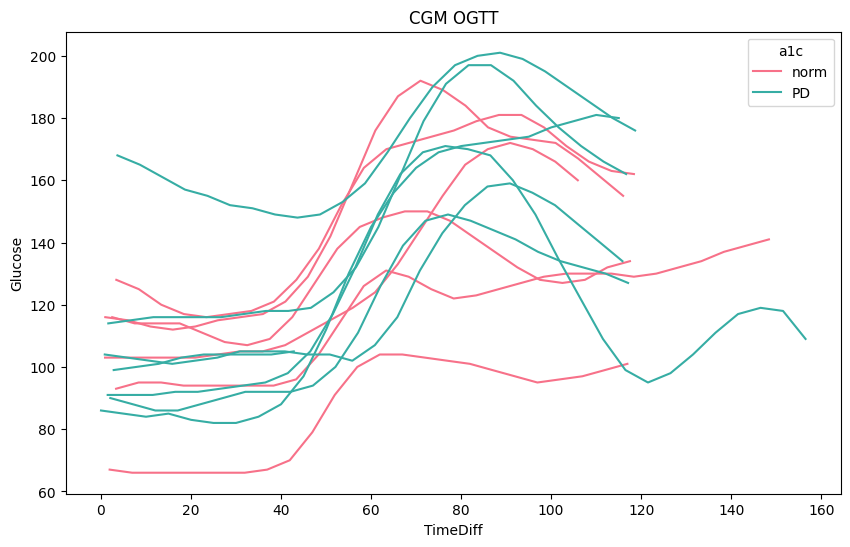

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.color_palette("husl", 6)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df_boost, y="Glucose", x="TimeDiff", hue='a1c',palette='husl',units='date',estimator=None).set(title='CGM OGTT')

[Text(0.5, 1.0, 'CGM OGTT')]

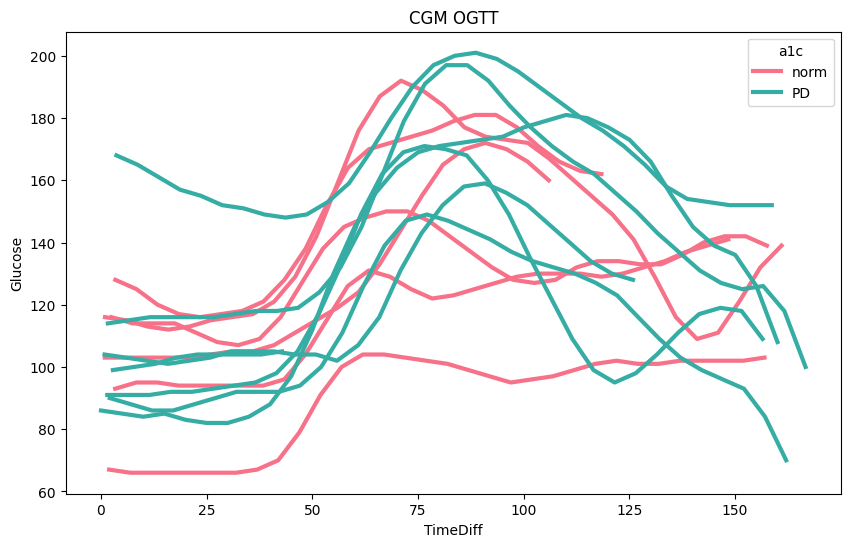

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.color_palette("husl", 6)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df_boost, y="Glucose", x="TimeDiff", hue='a1c',palette='husl',units='date',linewidth=3,estimator=None).set(title='CGM OGTT')

[Text(0.5, 1.0, 'CGM OGTT')]

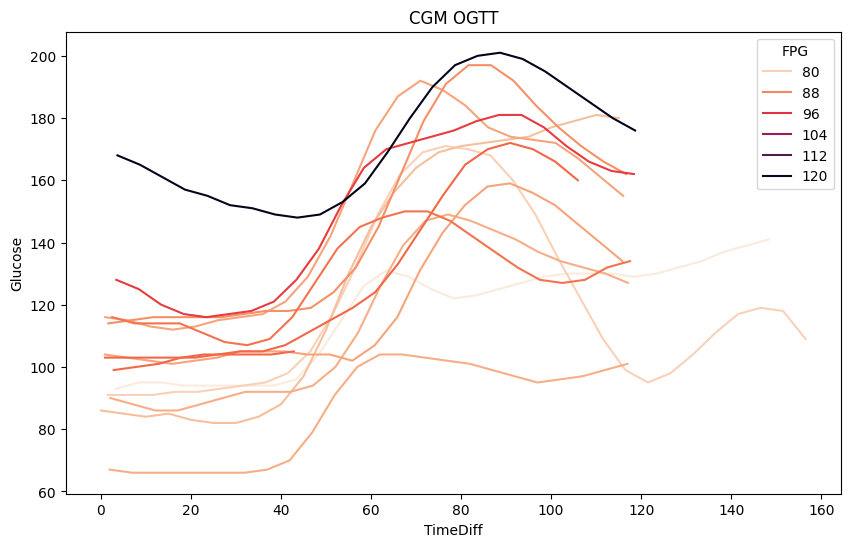

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.color_palette("husl", 6)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df_boost, y="Glucose", x="TimeDiff", hue='FPG',palette='rocket_r',units='date',estimator=None).set(title='CGM OGTT')

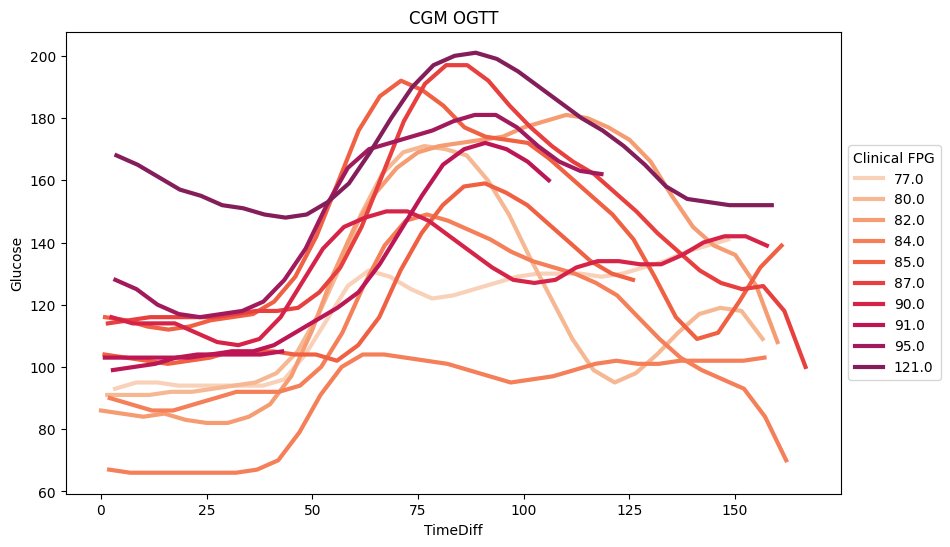

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.color_palette("husl", 6)
# p=sns.cubehelix_palette(start=3, rot=1, as_cmap=True)
# p=sns.color_palette("ch:s=-.7,r=1", as_cmap=True)
# p=sns.cubehelix_palette(14,start=-.1, rot=-.2, dark=0, light=.6,gamma=.3, hue=1, reverse=False, as_cmap=True)
p=sns.color_palette("rocket_r", 14)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df_boost, y="Glucose", x="TimeDiff", hue='FPG',palette=p,units='date',linewidth=3,estimator=None).set(title='CGM OGTT')
plt.legend(title='Clinical FPG',loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

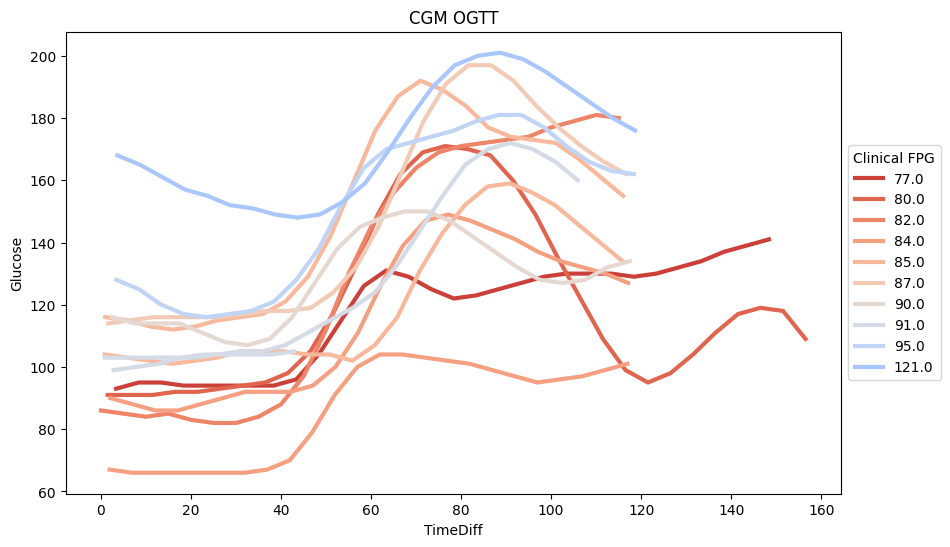

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.color_palette("husl", 6)
# p=sns.cubehelix_palette(start=3, rot=1, as_cmap=True)
# p=sns.color_palette("ch:s=-.7,r=1", as_cmap=True)
# p=sns.cubehelix_palette(14,start=-.1, rot=-.2, dark=0, light=.6,gamma=.3, hue=1, reverse=False, as_cmap=True)
p=sns.color_palette("coolwarm_r", 14)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df_boost, y="Glucose", x="TimeDiff", hue='FPG',palette=p,units='date',linewidth=3,estimator=None).set(title='CGM OGTT')
plt.legend(title='Clinical FPG',loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

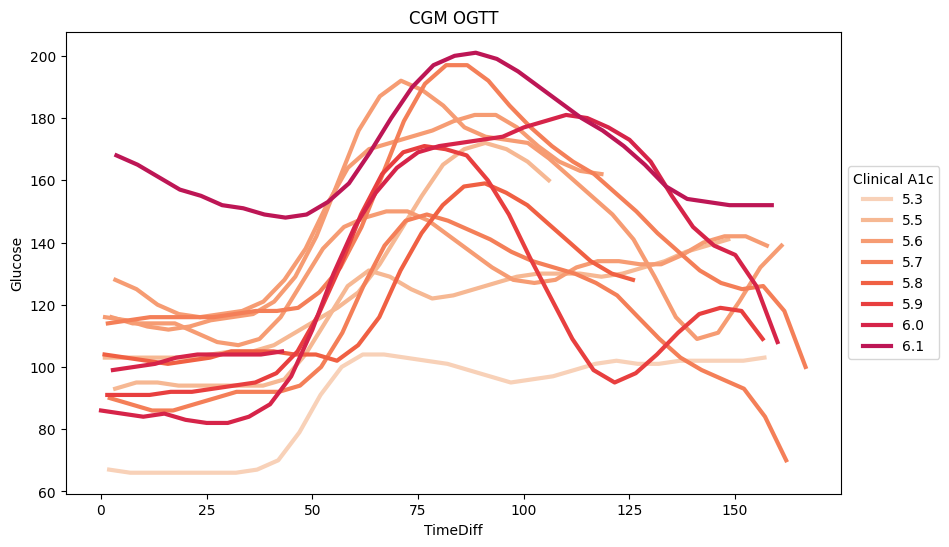

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.color_palette("husl", 6)
# p=sns.cubehelix_palette(start=3, rot=1, as_cmap=True)
# p=sns.color_palette("ch:s=-.7,r=1", as_cmap=True)
# p=sns.cubehelix_palette(14,start=-.1, rot=1, dark=0, light=.6,gamma=.3, hue=1.2, reverse=False, as_cmap=True)
p=sns.color_palette("rocket_r", 14)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df_boost, y="Glucose", x="TimeDiff", hue='a1c_val_num',palette=p,units='date',linewidth=3,estimator=None).set(title='CGM OGTT')
plt.legend(title='Clinical A1c',loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

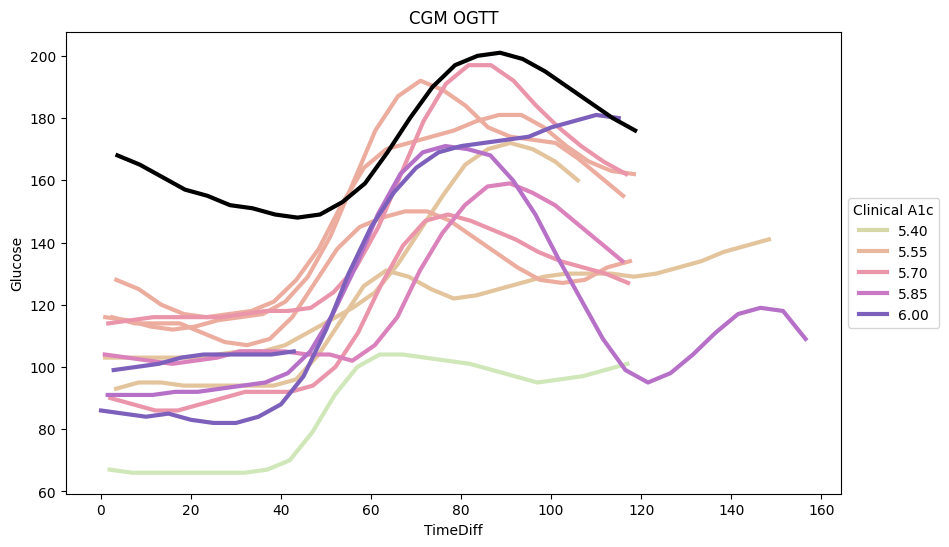

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.color_palette("husl", 6)
# p=sns.cubehelix_palette(start=3, rot=1, as_cmap=True)
# p=sns.color_palette("ch:s=-.7,r=1", as_cmap=True)
p=sns.cubehelix_palette(14,start=-.1, rot=1, dark=0, light=.6,gamma=.3, hue=1.2, reverse=False, as_cmap=True)
# p=sns.color_palette("rocket_r", 14)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df_boost, y="Glucose", x="TimeDiff", hue='a1c_val_num',palette=p,units='date',linewidth=3,estimator=None).set(title='CGM OGTT')
plt.legend(title='Clinical A1c',loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)

In [ ]:
result_df_boost.a1c_val_num.unique()

array([5.5, 5.6, 5.9, 5.7, 5.8, 5.3, 6.1, 6. ])

[Text(0.5, 1.0, 'CGM OGTT')]

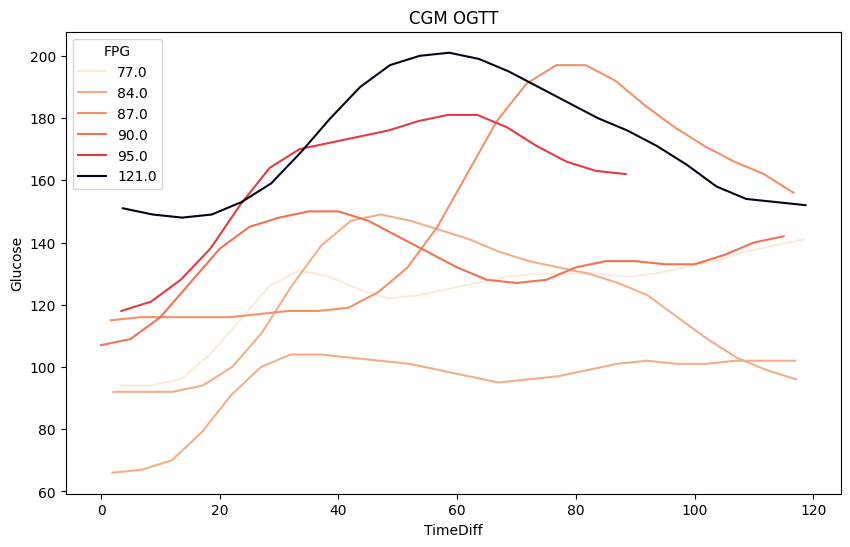

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.color_palette("husl", 6)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df_boost, y="Glucose", x="TimeDiff", hue='FPG',palette='rocket_r',units='date',estimator=None).set(title='CGM OGTT')

In [ ]:
result_df_boost.a1c_val_num

0      5.5
1      5.5
2      5.5
3      5.5
4      5.5
      ... 
157    5.7
158    5.7
159    5.7
160    5.7
161    5.7
Name: a1c_val_num, Length: 162, dtype: float64

[Text(0.5, 1.0, 'CGM OGTT')]

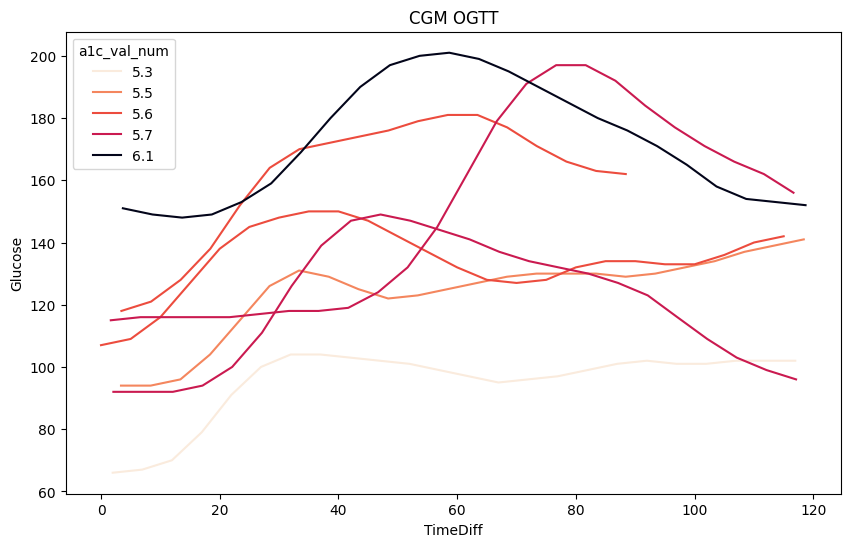

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.color_palette("husl", 6)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df_boost, y="Glucose", x="TimeDiff", hue='a1c_val_num',palette='rocket_r',units='date',estimator=None).set(title='CGM OGTT')

In [ ]:
one_ogtt['id'] = 1
two_ogtt['id'] = 2

three_ogtt['id'] = 3

four_ogtt['id'] = 4

five_ogtt['id'] = 5

six_ogtt['id'] = 6

seven_ogtt['id'] = 7

eight_ogtt['id'] = 8

nine_ogtt['id'] = 9

ten_ogtt['id'] = 10

eleven_ogtt['id'] = 11

twelve_ogtt['id'] = 12

thirteen_ogtt['id'] = 13

fourteen_ogtt['id'] = 14


In [ ]:
# Append all the DataFrames
result_df_ogtt = one_ogtt.append([two_ogtt,three_ogtt,four_ogtt, five_ogtt,six_ogtt, seven_ogtt, eight_ogtt, nine_ogtt,
                             ten_ogtt,eleven_ogtt,twelve_ogtt,thirteen_ogtt,fourteen_ogtt], ignore_index=True)

# Display the resulting DataFrame
#result_df.id

In [ ]:
result_df_ogtt.loc[result_df_ogtt['id'] == 1, 'a1c_val_num'] = 5.5
result_df_ogtt.loc[result_df_ogtt['id'] == 1, 'a1c'] = 'norm'
result_df_ogtt.loc[result_df_ogtt['id'] == 1, 'FPG'] = 77

In [ ]:
result_df_ogtt.loc[result_df_ogtt['id'] == 2, 'a1c_val_num'] = 5.6
result_df_ogtt.loc[result_df_ogtt['id'] == 2, 'a1c'] = 'norm'
result_df_ogtt.loc[result_df_ogtt['id'] == 2, 'FPG'] = 95

In [ ]:
result_df_ogtt.loc[result_df_ogtt['id'] == 3, 'a1c_val_num'] = 5.9
result_df_ogtt.loc[result_df_ogtt['id'] == 3, 'a1c'] = 'PD'
result_df_ogtt.loc[result_df_ogtt['id'] == 3, 'FPG'] = 80

In [ ]:
result_df_ogtt.loc[result_df_ogtt['id'] == 4, 'a1c_val_num'] = 6.4
result_df_ogtt.loc[result_df_ogtt['id'] == 4, 'a1c'] = 'PD'
result_df_ogtt.loc[result_df_ogtt['id'] == 4, 'FPG'] = 88

In [ ]:
result_df_ogtt.loc[result_df_ogtt['id'] == 5, 'a1c_val_num'] = 5.7
result_df_ogtt.loc[result_df_ogtt['id'] == 5, 'a1c'] = 'PD'
result_df_ogtt.loc[result_df_ogtt['id'] == 5, 'FPG'] = 84

In [ ]:
result_df_ogtt.loc[result_df_ogtt['id'] == 6, 'a1c_val_num'] = 5.8
result_df_ogtt.loc[result_df_ogtt['id'] == 6, 'a1c'] = 'PD'
result_df_ogtt.loc[result_df_ogtt['id'] == 6, 'FPG'] = 85

In [ ]:
result_df_ogtt.loc[result_df_ogtt['id'] == 7, 'a1c_val_num'] = 5.3
result_df_ogtt.loc[result_df_ogtt['id'] == 7, 'a1c'] = 'norm'
result_df_ogtt.loc[result_df_ogtt['id'] == 7, 'FPG'] = 84

In [ ]:
result_df_ogtt.loc[result_df_ogtt['id'] == 8, 'a1c_val_num'] = 5.6
result_df_ogtt.loc[result_df_ogtt['id'] == 8, 'a1c'] = 'norm'
result_df_ogtt.loc[result_df_ogtt['id'] == 8, 'FPG'] = 90

In [ ]:
result_df_ogtt.loc[result_df_ogtt['id'] == 9, 'a1c_val_num'] = 6.1
result_df_ogtt.loc[result_df_ogtt['id'] == 9, 'a1c'] = 'PD'
result_df_ogtt.loc[result_df_ogtt['id'] == 9, 'FPG'] = 121

In [ ]:
result_df_ogtt.loc[result_df_ogtt['id'] == 10, 'a1c_val_num'] = 6
result_df_ogtt.loc[result_df_ogtt['id'] == 10, 'a1c'] = 'PD'
result_df_ogtt.loc[result_df_ogtt['id'] == 10, 'FPG'] = 82

In [ ]:
result_df_ogtt.loc[result_df_ogtt['id'] == 11, 'a1c_val_num'] = 6
result_df_ogtt.loc[result_df_ogtt['id'] == 11, 'a1c'] = 'PD'
result_df_ogtt.loc[result_df_ogtt['id'] == 11, 'FPG'] = 91

In [ ]:
result_df_ogtt.loc[result_df_ogtt['id'] == 12, 'a1c_val_num'] = 5.6
result_df_ogtt.loc[result_df_ogtt['id'] == 12, 'a1c'] = 'norm'
result_df_ogtt.loc[result_df_ogtt['id'] == 12, 'FPG'] = 85

In [ ]:
# result_df.loc[result_df['id'] == 11, 'a1c_val_num'] = 6
# result_df.loc[result_df['id'] == 11, 'a1c'] = 'PD'

In [ ]:
result_df_ogtt.loc[result_df_ogtt['id'] == 13, 'a1c_val_num'] = 5.7
result_df_ogtt.loc[result_df_ogtt['id'] == 13, 'a1c'] = 'PD'
result_df_ogtt.loc[result_df_ogtt['id'] == 13, 'FPG'] = 87

In [ ]:
result_df_ogtt.loc[result_df_ogtt['id'] == 14, 'a1c_val_num'] = 5.5
result_df_ogtt.loc[result_df_ogtt['id'] == 14, 'a1c'] = 'norm'
result_df_ogtt.loc[result_df_ogtt['id'] == 14, 'FPG'] = 91

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

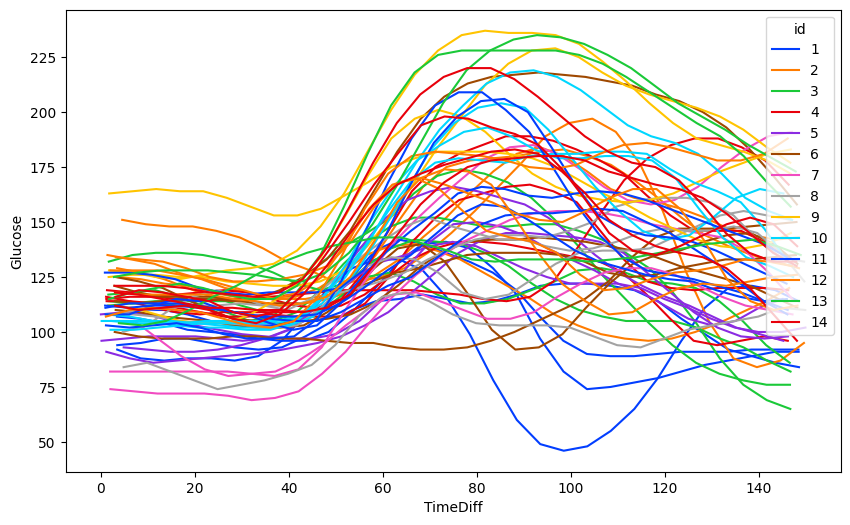

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df, y="Glucose", x="TimeDiff", hue='id',palette='bright',units='date',estimator=None)

In [ ]:
result_df['sequential_value'] = result_df.groupby(['id', 'date']).cumcount() + 1


<Axes: xlabel='sequential_value', ylabel='Glucose'>

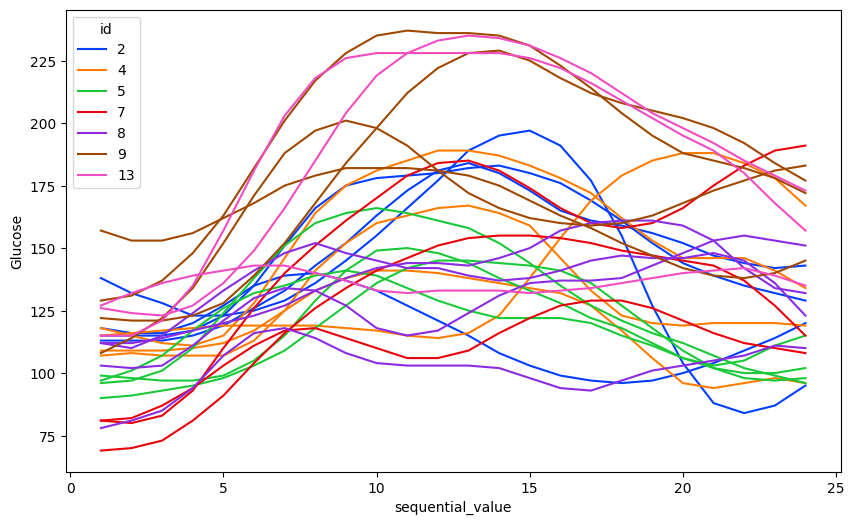

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df, y="Glucose", x="sequential_value", hue='id',palette='bright',units='date',estimator=None)

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

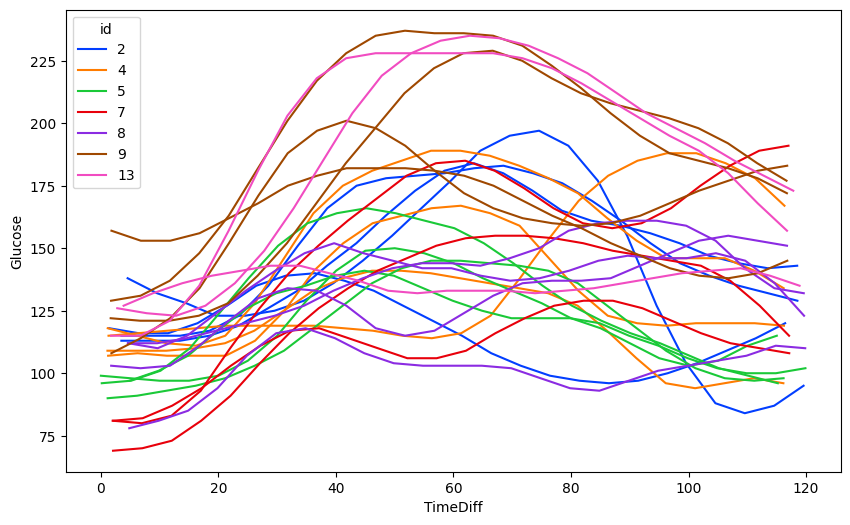

In [ ]:

import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df, y="Glucose", x="TimeDiff", hue='id',palette='bright',units='date',estimator=None)

In [ ]:
train_df=merge_sub_five
train_df=train_df.append(merge_sub_four)
train_df=train_df.append(merge_sub_two)
train_df=train_df.append(merge_sub_one)
train_df=train_df.append(merge_sub_seven)
train_df

NameError: name 'merge_sub_five' is not defined

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

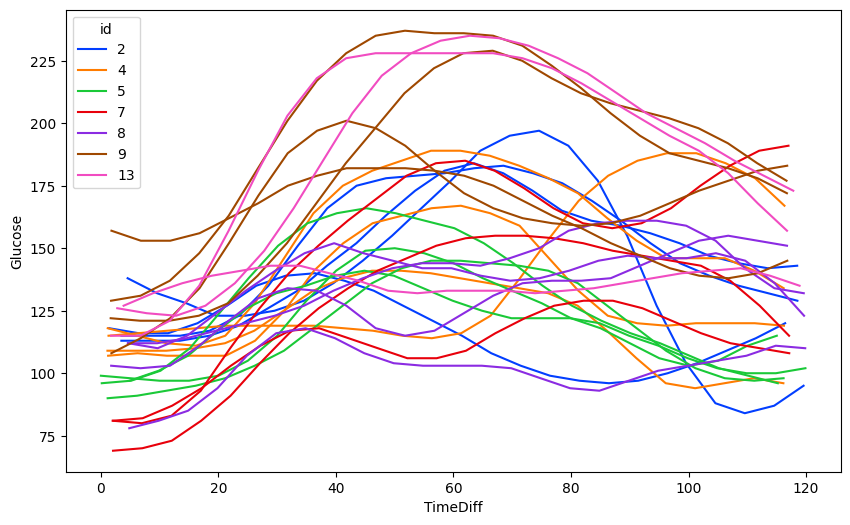

In [ ]:

import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df, y="Glucose", x="TimeDiff", hue='id',palette='bright',units='date',estimator=None)

<Axes: xlabel='sequential_value', ylabel='Glucose'>

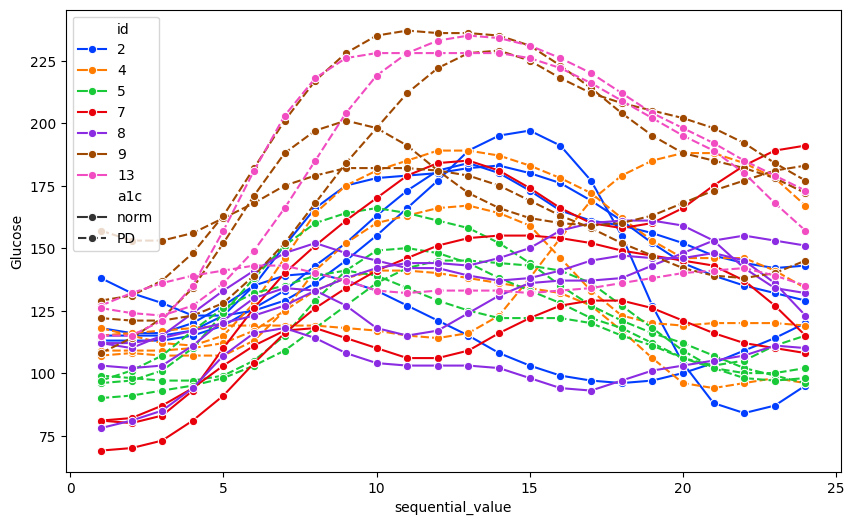

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df, y="Glucose", x="sequential_value", hue='id',palette='bright',units='date',estimator=None, marker='o', style="a1c")

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

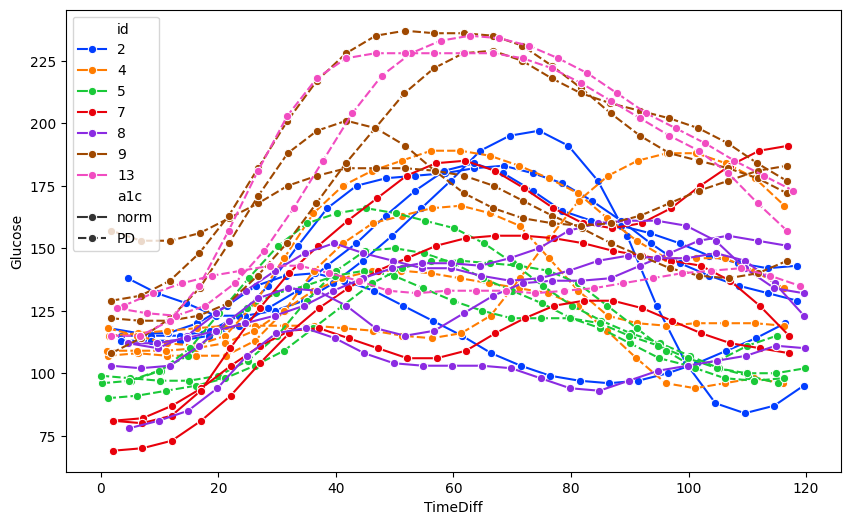

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df, y="Glucose", x="TimeDiff", hue='id',palette='bright',units='date',estimator=None, marker='o', style="a1c")

<Axes: xlabel='sequential_value', ylabel='Glucose'>

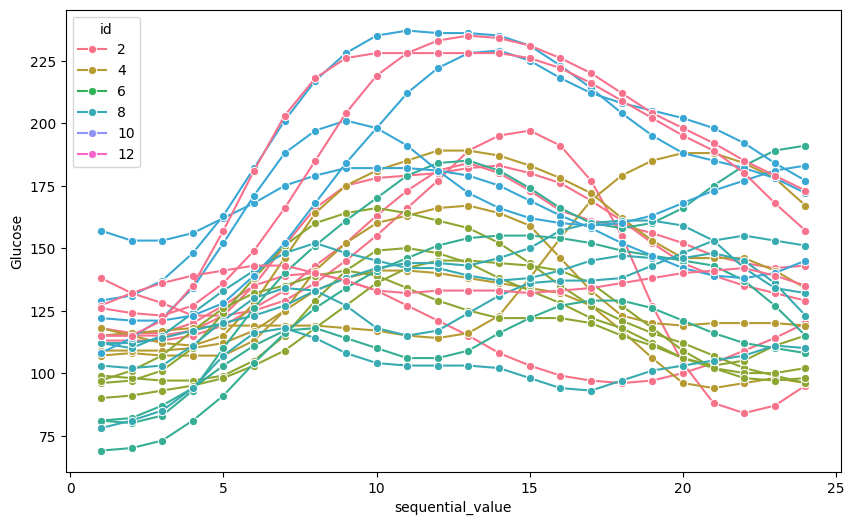

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.color_palette("husl", 6)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df, y="Glucose", x="sequential_value", hue='id',palette='husl',units='date',estimator=None, marker='o')

<Axes: xlabel='TimeDiff_Round', ylabel='Glucose'>

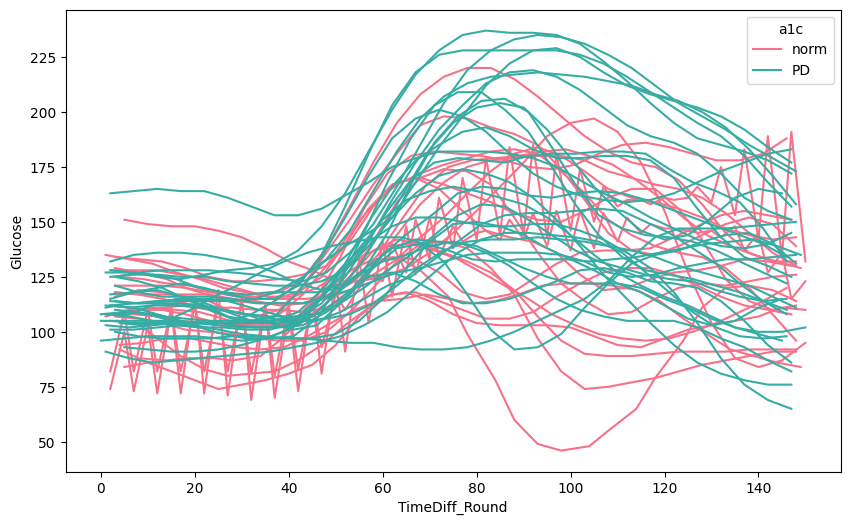

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.color_palette("husl", 6)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df_ogtt, y="Glucose", x="TimeDiff_Round", hue='a1c',palette='husl',units='date',estimator=None)

<Axes: xlabel='TimeDiff_Round', ylabel='Glucose'>

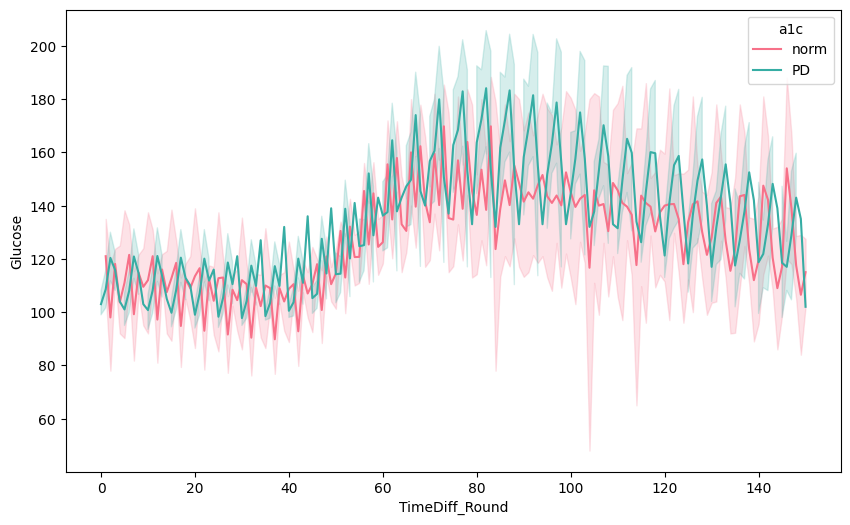

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.color_palette("husl", 6)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df_ogtt, y="Glucose", x="TimeDiff_Round", hue='a1c',palette='husl')

<Axes: xlabel='TimeDiff_Round', ylabel='Glucose'>

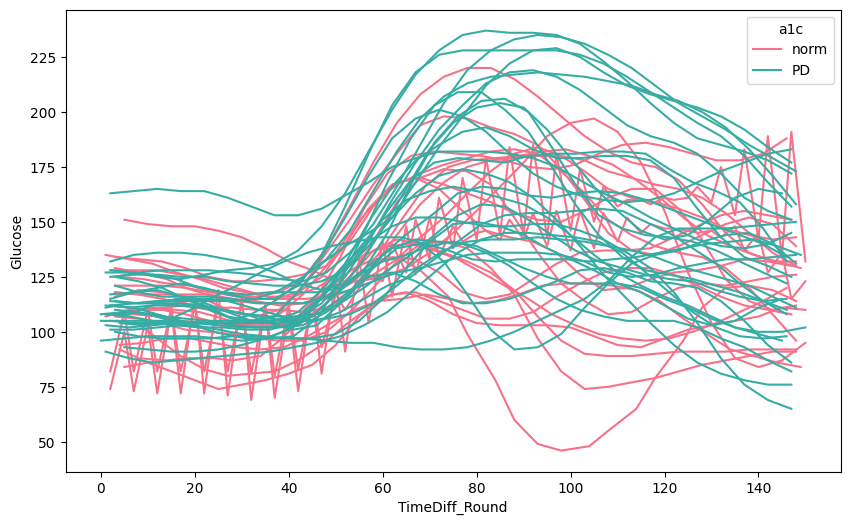

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.color_palette("husl", 6)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df_ogtt, y="Glucose", x="TimeDiff_Round", hue='a1c',palette='husl',units='date',estimator=None)

<Axes: xlabel='TimeDiff_Round', ylabel='Glucose'>

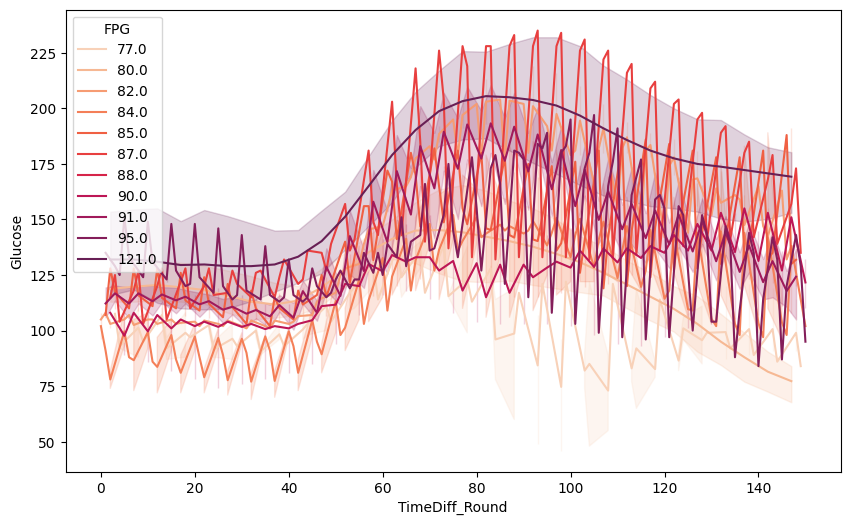

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
p=sns.color_palette("rocket_r", 14)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df_ogtt, y="Glucose", x="TimeDiff_Round", hue='FPG',palette=p)

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

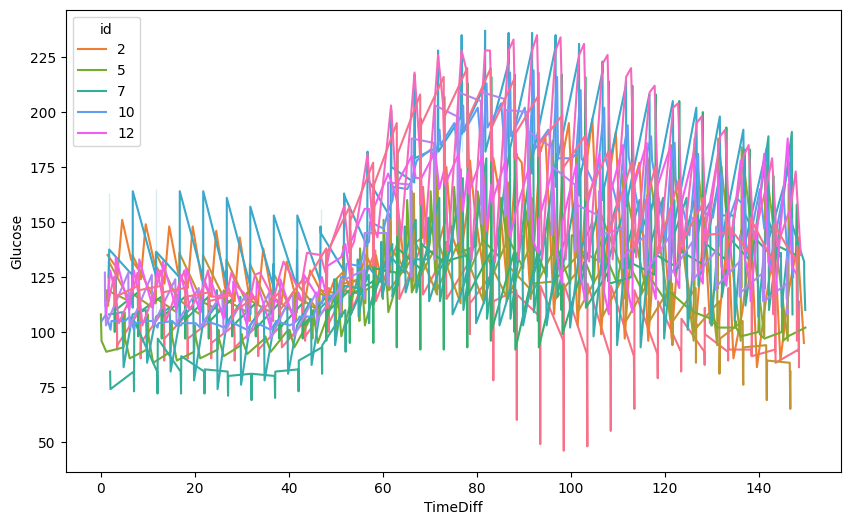

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.color_palette("husl", 14)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df_ogtt, y="Glucose", x="TimeDiff", hue='id',palette='husl')

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

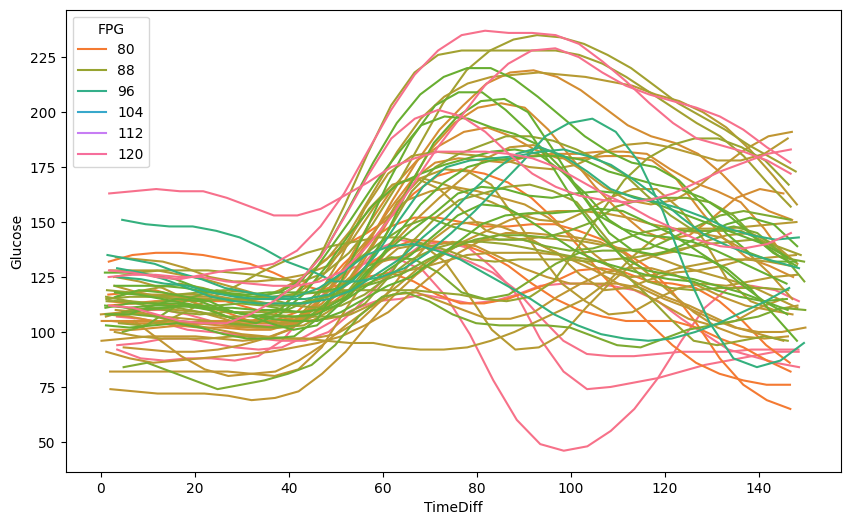

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.color_palette("husl", 6)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df_ogtt, y="Glucose", x="TimeDiff", hue='FPG',palette='husl',units='date',estimator=None)

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

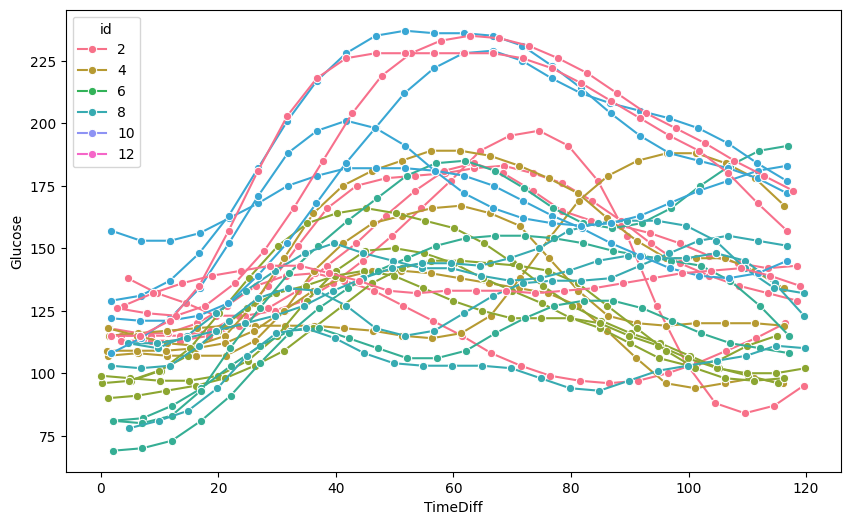

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
sns.color_palette("husl", 6)
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df, y="Glucose", x="TimeDiff", hue='id',palette='husl',units='date',estimator=None, marker='o')

<Axes: xlabel='sequential_value', ylabel='Glucose'>

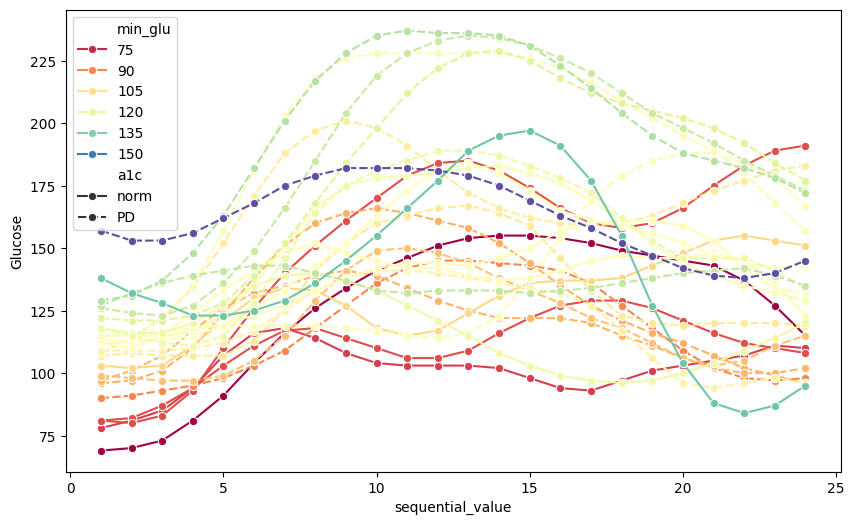

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df, y="Glucose", x="sequential_value", hue='min_glu',palette='Spectral',units='date',estimator=None, marker='o', style="a1c")

<Axes: xlabel='sequential_value', ylabel='Glucose'>

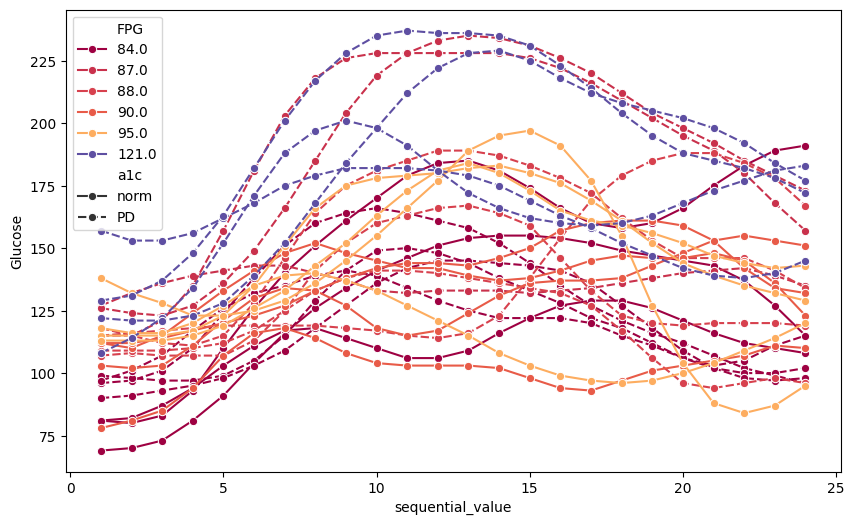

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df, y="Glucose", x="sequential_value", hue='FPG',palette='Spectral',units='date',estimator=None, marker='o', style="a1c")

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.scatterplot(data=result_df, y="Glucose", x="sequential_value", hue='min_glu',palette='rocket')

In [ ]:
result_df['a1c_val_num']=1

In [ ]:
result_df['a1c_val_num'].unique

NameError: name 'result_df' is not defined

In [ ]:
result_df.loc[result_df['id'] == 2, 'a1c_val_num'] = 5.6
result_df.loc[result_df['id'] == 2, 'a1c'] = 'norm'
result_df.loc[result_df['id'] == 2, 'FPG'] = 95

In [ ]:
result_df.loc[result_df['id'] == 4, 'a1c_val_num'] = 6.4
result_df.loc[result_df['id'] == 4, 'a1c'] = 'PD'
result_df.loc[result_df['id'] == 4, 'FPG'] = 88

In [ ]:
result_df.loc[result_df['id'] == 5, 'a1c_val_num'] = 5.7
result_df.loc[result_df['id'] == 5, 'a1c'] = 'PD'
result_df.loc[result_df['id'] == 5, 'FPG'] = 84

In [ ]:
result_df.loc[result_df['id'] == 7, 'a1c_val_num'] = 5.3
result_df.loc[result_df['id'] == 7, 'a1c'] = 'norm'
result_df.loc[result_df['id'] == 7, 'FPG'] = 84

In [ ]:
result_df.loc[result_df['id'] == 8, 'a1c_val_num'] = 5.6
result_df.loc[result_df['id'] == 8, 'a1c'] = 'norm'
result_df.loc[result_df['id'] == 8, 'FPG'] = 90

In [ ]:
result_df.loc[result_df['id'] == 9, 'a1c_val_num'] = 6.1
result_df.loc[result_df['id'] == 9, 'a1c'] = 'PD'
result_df.loc[result_df['id'] == 9, 'FPG'] = 121

In [ ]:
# result_df.loc[result_df['id'] == 11, 'a1c_val_num'] = 6
# result_df.loc[result_df['id'] == 11, 'a1c'] = 'PD'

In [ ]:
result_df.loc[result_df['id'] == 13, 'a1c_val_num'] = 5.7
result_df.loc[result_df['id'] == 13, 'a1c'] = 'PD'
result_df.loc[result_df['id'] == 13, 'FPG'] = 87

<Axes: xlabel='sequential_value', ylabel='Glucose'>

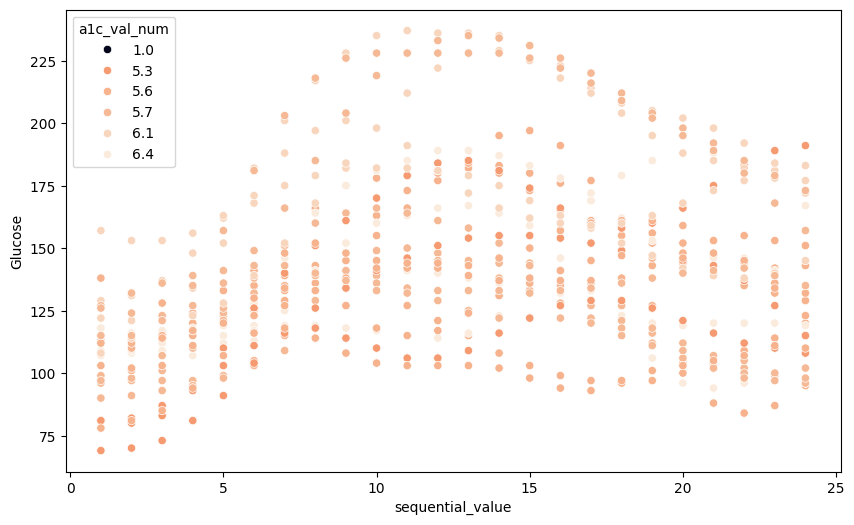

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.scatterplot(data=result_df, y="Glucose", x="sequential_value", hue='a1c_val_num',palette='rocket')

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df, y="Glucose", x="sequential_value", hue='id',palette='deep',units='date',estimator=None, marker='o')

In [ ]:
two_ogtt['id'] = 2

#three_ogtt['id'] = 3

four_ogtt['id'] = 4

five_ogtt['id'] = 5

#six_ogtt['id'] = 6

seven_ogtt['id'] = 7

eight_ogtt['id'] = 8

nine_ogtt['id'] = 9

#ten_ogtt['id'] = 10

#eleven_ogtt['id'] = 11

#twelve_ogtt['id'] = 12

thirteen_ogtt['id'] = 13

#fourteen_ogtt['id'] = 14


In [ ]:
# Append all the DataFrames
result_df = two_ogtt.append([four_ogtt, five_ogtt, seven_ogtt, eight_ogtt, nine_ogtt, thirteen_ogtt], ignore_index=True)

# Display the resulting DataFrame
#result_df.id

In [ ]:
result_df['sequential_value'] = result_df.groupby(['id', 'date']).cumcount() + 1


<Axes: xlabel='sequential_value', ylabel='Glucose'>

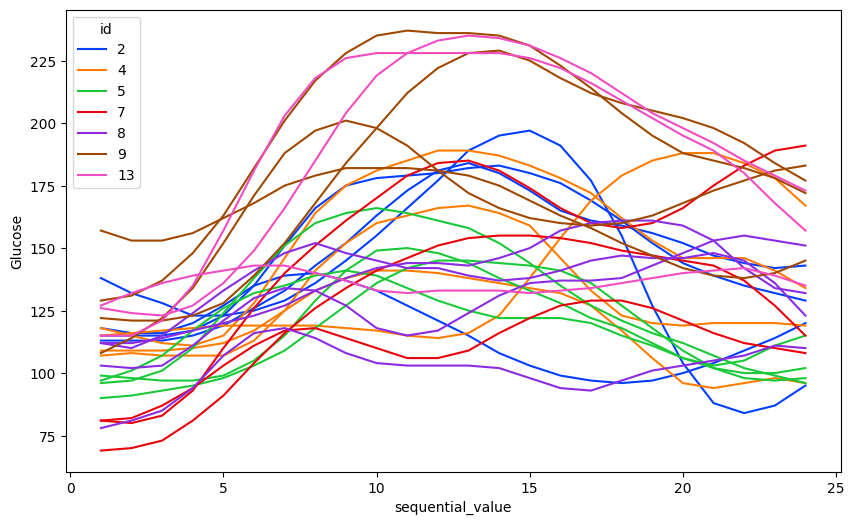

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df, y="Glucose", x="sequential_value", hue='id',palette='bright',units='date',estimator=None)

<Axes: xlabel='TimeDiff', ylabel='Glucose'>

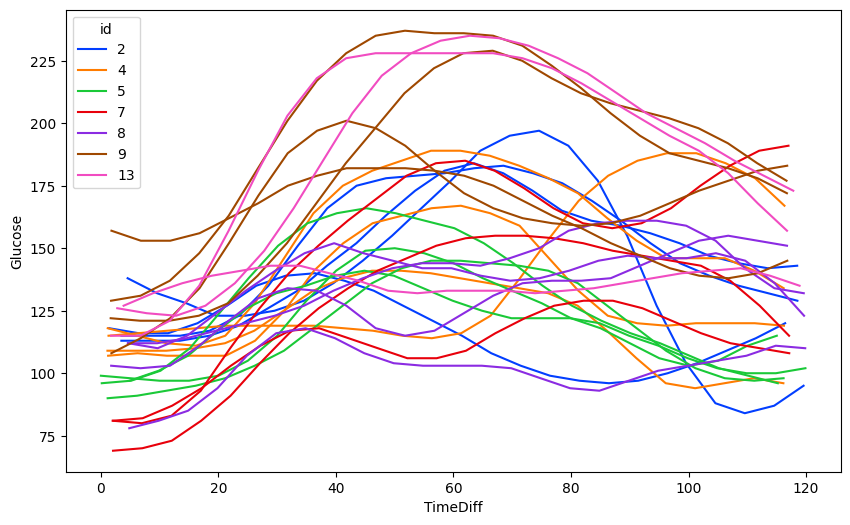

In [ ]:

import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.lineplot(data=result_df, y="Glucose", x="TimeDiff", hue='id',palette='bright',units='date',estimator=None)

In [ ]:
train_df=merge_sub_five
train_df=train_df.append(merge_sub_four)
train_df=train_df.append(merge_sub_two)
train_df=train_df.append(merge_sub_one)
train_df=train_df.append(merge_sub_seven)
train_df

NameError: name 'merge_sub_five' is not defined

In [ ]:
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Specify the columns you want to scale
columns_to_scale = ['sum_acc_per_day', 'sum_acc_before_food',
            'max_eda_per_day', 'mean_hr_per_day', 'mean_hr_before_food',
            'mean_temp_per_day', 'mean_temp_before_food', 'mean_temp_ogtt_day', 'TIR', 'TOR',
            'auc_ogtt','mean_glu_ld']

# Initialize the StandardScaler
scaler = StandardScaler()

# Fit and transform the selected columns
train_df[columns_to_scale] = scaler.fit_transform(train_df[columns_to_scale])


In [ ]:
train_df

,date_ogtt,sum_acc_per_day,sum_acc_before_food,sum_acc_ogtt_day,max_eda_per_day,mean_hr_per_day,mean_hr_before_food,mean_hr_ogtt_day,mean_temp_per_day,mean_temp_before_food,mean_temp_ogtt_day,TIR,TOR,a1c,max_glu,min_glu,meal_auc,auc_ogtt,mean_glu_ld
0,2020-02-28,-1.222884,0.609909,1.534867e+08,2.253276,1.508842,1.453151,74.974343,-1.405731,0.095043,0.139749,-1.671646,-0.954395,PD,166.0,96.0,15026.0,-0.704893,0.710796
1,2020-03-01,0.754567,-0.668462,1.461246e+08,0.045095,-0.221057,1.265226,77.913285,0.281292,0.101725,0.116762,0.811826,0.281155,PD,150.0,99.0,13774.0,-0.704893,0.096351
2,2020-03-03,0.758785,0.744133,1.715635e+08,-0.211543,-0.438618,-0.569262,67.703074,0.253636,0.101262,0.154440,-0.061270,1.916441,PD,141.0,97.0,13722.0,-0.704893,-0.796207
3,2020-03-05,0.443447,0.443690,1.725335e+08,0.559186,-0.307696,-0.781936,65.596686,0.046215,0.121111,0.160692,0.967043,-0.481979,PD,145.0,90.0,13554.0,-0.704893,-0.033128
0,2020-02-28,-2.205093,-1.017074,3.130529e+07,-1.397660,-0.897807,1.537570,74.595509,-1.419559,0.355109,0.401655,-1.050778,-0.954395,PD,188.0,115.0,16170.0,1.641020,-0.408229
1,2020-03-01,-1.951301,0.623738,1.677820e+08,-1.381183,-0.801541,1.936946,77.449092,-0.244174,0.246789,0.267861,1.064053,-0.263941,PD,167.0,107.0,15262.0,1.641020,0.033199
2,2020-03-03,0.768293,0.767982,1.761618e+08,0.496296,0.528855,0.493767,70.829340,0.488713,0.247495,0.266310,-0.526921,1.734743,PD,189.0,118.0,17750.0,1.641020,-0.648745
3,2020-03-05,0.686120,0.158901,7.633897e+07,-1.242651,2.859454,0.183387,67.822934,-0.009097,0.295784,0.341653,0.908836,0.099456,PD,141.0,109.0,13757.0,1.641020,0.986996
0,2020-02-22,-0.520350,-0.514008,1.749052e+08,-1.277073,-1.090339,0.644121,76.857150,-0.645188,0.257366,0.204876,-1.089582,-0.990735,norm,197.0,138.0,16247.0,0.435394,1.476919
1,2020-02-24,0.791040,0.786082,1.761565e+08,-0.334182,-0.281705,0.437979,72.819379,0.101527,0.198287,0.222949,0.734217,0.426513,norm,183.0,115.0,17545.0,0.435394,1.666459


In [ ]:
test_df=merge_sub_nine
test_df=test_df.append(merge_sub_thirteen)
test_df=test_df.append(merge_sub_eight)
test_df

,date_ogtt,sum_acc_per_day,sum_acc_before_food,sum_acc_ogtt_day,max_eda_per_day,mean_hr_per_day,mean_hr_before_food,mean_hr_ogtt_day,mean_temp_per_day,mean_temp_before_food,mean_temp_ogtt_day,TIR,TOR,a1c,max_glu,min_glu,meal_auc,auc_ogtt,mean_glu_ld
0,2020-03-22,1.165508e+08,6.620014e+07,1.767514e+08,3.092068,84.00,75.202949,76.417234,26.01,33.924151,33.641256,560.0,230.0,PD,182.0,157.0,18627.0,15919.0,132.506329
1,2020-03-24,1.734086e+08,9.311613e+07,1.765280e+08,1.812617,70.20,73.007296,73.768157,33.49,34.071366,33.974898,1010.0,430.0,PD,201.0,108.0,19174.0,15919.0,127.090278
2,2020-03-26,1.506332e+08,5.094598e+06,1.127872e+08,71.291290,65.73,99.544225,87.639761,35.31,28.652373,31.807636,940.0,500.0,PD,237.0,129.0,22677.0,15919.0,130.881944
3,2020-03-28,1.777665e+08,8.116684e+07,1.700261e+08,6.071693,71.02,72.812409,74.018420,34.41,33.449203,33.360314,1120.0,320.0,PD,229.0,122.0,21089.0,15919.0,120.934028
0,2020-05-29,7.431683e+07,1.460803e+08,1.648819e+08,16.681938,83.00,70.230204,70.736847,28.63,33.446301,0.000000,360.0,160.0,PD,143.0,127.0,15704.0,10087.0,104.980769
1,2020-05-31,1.710975e+08,7.288583e+07,1.541327e+08,13.183220,64.33,55.898275,58.340194,32.87,33.623041,0.000000,960.0,480.0,PD,235.0,126.0,21799.0,10087.0,129.732639
2,2020-06-02,1.689438e+08,6.573385e+07,1.704079e+08,14.213739,70.67,57.668447,60.791747,32.75,34.183991,0.000000,1055.0,385.0,PD,228.0,115.0,22195.0,10087.0,123.392361
0,2020-03-15,8.601162e+07,6.699238e+07,1.485921e+08,20.375313,55.00,64.740999,66.217746,32.29,34.638988,34.142529,430.0,170.0,norm,118.0,78.0,11704.0,11010.0,103.325000
1,2020-03-17,1.771336e+08,3.102611e+07,1.157426e+08,13.437284,63.68,63.499656,63.499656,34.29,35.110836,35.110836,1015.0,425.0,norm,155.0,103.0,14962.0,11010.0,104.267361
2,2020-03-19,1.560310e+08,7.242342e+07,1.767569e+08,5.213343,66.92,81.650301,83.002487,34.75,33.778812,33.437172,950.0,490.0,norm,152.0,112.0,15922.0,11010.0,116.607639


In [ ]:
full_df=test_df.append(train_df)
full_df

,date_ogtt,sum_acc_per_day,sum_acc_before_food,sum_acc_ogtt_day,max_eda_per_day,mean_hr_per_day,mean_hr_before_food,mean_hr_ogtt_day,mean_temp_per_day,mean_temp_before_food,mean_temp_ogtt_day,TIR,TOR,a1c,max_glu,min_glu,meal_auc,auc_ogtt,mean_glu_ld
0,2020-03-22,-0.863312,0.029966,1.767514e+08,-0.743478,1.805159,0.206015,76.417234,-2.391693,0.306526,0.609398,-1.155942,-1.056298,PD,182.0,157.0,18627.0,1.309592,1.294982
1,2020-03-24,0.715391,0.759843,1.765280e+08,-0.813460,0.066985,0.025667,73.768157,0.249763,0.397408,0.631618,0.567526,0.621576,PD,201.0,108.0,19174.0,1.309592,0.780049
2,2020-03-26,0.083013,-1.627022,1.127872e+08,2.986821,-0.496032,2.205372,87.639761,0.892471,-2.948004,0.487286,0.299431,1.208832,PD,237.0,129.0,22677.0,1.309592,1.140543
3,2020-03-28,0.836391,0.435816,1.700261e+08,-0.580501,0.170268,0.009660,74.018420,0.574648,0.013317,0.590689,0.988818,-0.301255,PD,229.0,122.0,21089.0,1.309592,0.194741
0,2020-05-29,-2.035973,2.196062,1.648819e+08,-0.000151,1.679204,-0.202439,70.736847,-1.466477,0.011525,-1.630992,-1.921928,-1.643554,PD,143.0,127.0,15704.0,-0.952956,-1.322022
1,2020-05-31,0.651221,0.211261,1.541327e+08,-0.191521,-0.672369,-1.379642,58.340194,0.030819,0.120635,-1.630992,0.376029,1.041045,PD,235.0,126.0,21799.0,-0.952956,1.031273
2,2020-06-02,0.591423,0.017322,1.704079e+08,-0.135155,0.126184,-1.234243,60.791747,-0.011557,0.466937,-1.630992,0.739873,0.244054,PD,228.0,115.0,22195.0,-0.952956,0.428468
0,2020-03-15,-1.711258,0.051450,1.485921e+08,0.201865,-1.847526,-0.653314,66.217746,-0.174000,0.747830,0.642781,-1.653833,-1.559661,norm,118.0,78.0,11704.0,-0.594875,-1.479445
1,2020-03-17,0.818817,-0.923841,1.157426e+08,-0.177624,-0.754239,-0.755276,63.499656,0.532272,1.039125,0.707267,0.586675,0.579629,norm,155.0,103.0,14962.0,-0.594875,-1.389850
2,2020-03-19,0.232886,0.198722,1.767569e+08,-0.627450,-0.346146,0.735591,83.002487,0.694715,0.216801,0.595807,0.337730,1.124939,norm,152.0,112.0,15922.0,-0.594875,-0.216592


In [ ]:
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Specify the columns you want to scale
columns_to_scale = ['sum_acc_per_day', 'sum_acc_before_food',
            'max_eda_per_day', 'mean_hr_per_day', 'mean_hr_before_food',
            'mean_temp_per_day', 'mean_temp_before_food', 'mean_temp_ogtt_day', 'TIR', 'TOR',
            'auc_ogtt','mean_glu_ld']

# Initialize the StandardScaler
scaler = StandardScaler()

# Fit and transform the selected columns
test_df[columns_to_scale] = scaler.fit_transform(test_df[columns_to_scale])

MAPE: 8.38%
RMSE: 1738.44
Mean Squared Error on Validation Set: 3022158.529450003
R-squared on Validation Set: -3.64506765275676
R-squared on training Set: 0.7323489200543825


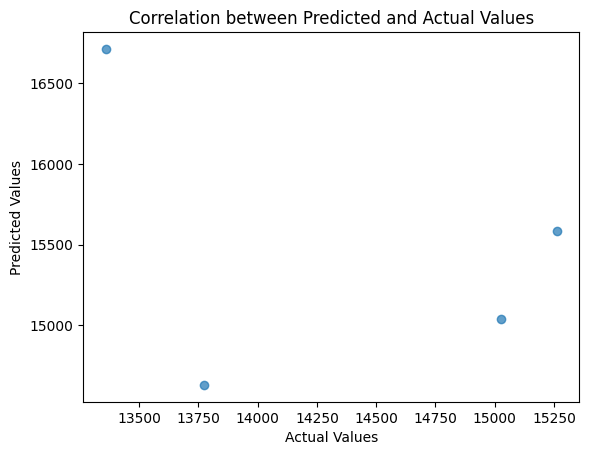

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Assuming you have two separate dataframes: train_df and test_df

# Features and target variable
features = ['sum_acc_per_day', 'sum_acc_before_food',
            'max_eda_per_day', 'mean_hr_per_day', 'mean_hr_before_food',
            'mean_temp_per_day', 'mean_temp_before_food', 'mean_temp_ogtt_day', 'TIR', 'TOR',
            'auc_ogtt','mean_glu_ld']
target = 'meal_auc'

# Extracting features and target from the dataframes
X_train = train_df[features]
y_train = train_df[target]

X_test = test_df[features]
y_test = test_df[target]

# Splitting the training data into train and validation sets
X_train_split, X_val, y_train_split, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Creating a Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

# Training the model
rf_model.fit(X_train_split, y_train_split)

# Predictions on the validation set
y_val_pred = rf_model.predict(X_val)

y_train_pred = rf_model.predict(X_train)

# Evaluating the model
mse = mean_squared_error(y_val, y_val_pred)
r2 = r2_score(y_val, y_val_pred)

r2_train = r2_score(y_train, y_train_pred)

def calculate_mape(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

mape = calculate_mape(y_val, y_val_pred)
print(f'MAPE: {mape:.2f}%')

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(y_val, y_val_pred))
print(f'RMSE: {rmse:.2f}')

print(f'Mean Squared Error on Validation Set: {mse}')
print(f'R-squared on Validation Set: {r2}')
print(f'R-squared on training Set: {r2_train}')

# Predictions on the test set
y_test_pred = rf_model.predict(X_test)

plt.scatter(y_val, y_val_pred, alpha=0.7)
plt.title('Correlation between Predicted and Actual Values')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()

# You can use y_test_pred for further analysis or evaluation


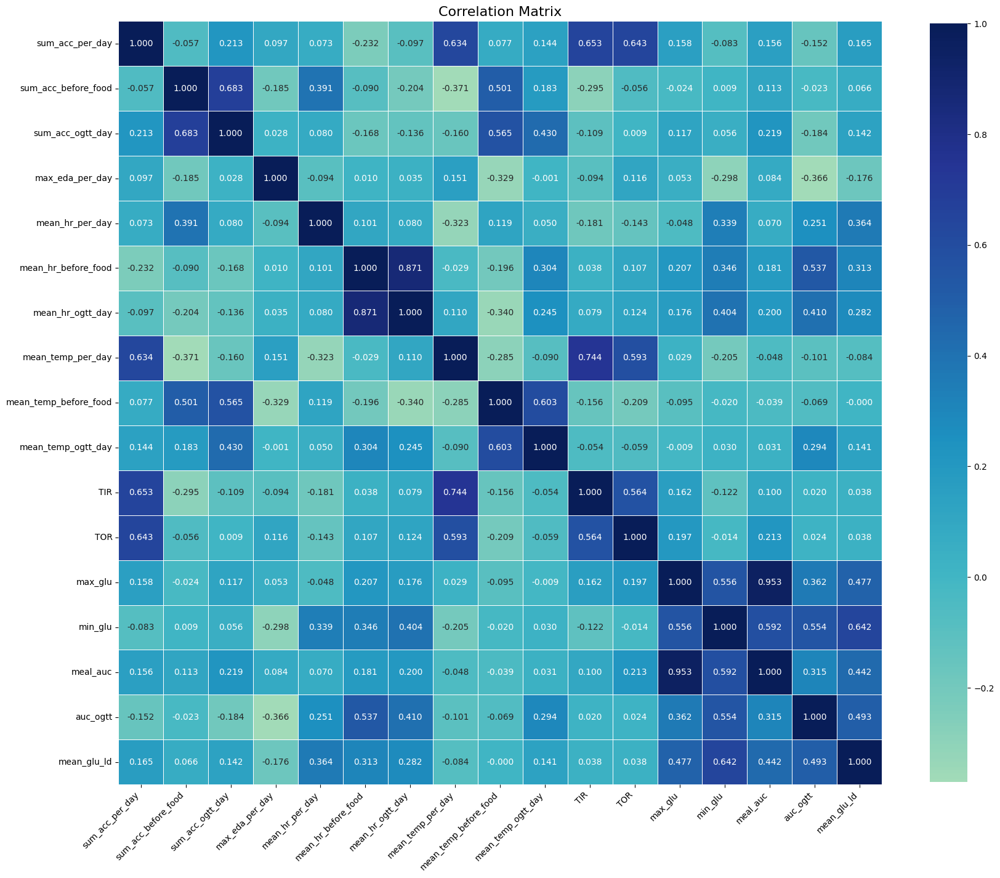

In [ ]:
import seaborn as sns
corr = full_df.corr()
fig, ax = plt.subplots(figsize=(20,20))
sns.heatmap(corr, vmax=1, center=0, fmt='.3f',cmap="YlGnBu",
            square=True, linewidths=.5, annot=True, cbar_kws={'shrink' : 0.8})
ax.set_xticklabels(ax.get_xticklabels(),rotation=45,horizontalalignment='right')
plt.title('Correlation Matrix', fontsize=16)
plt.show()

In [ ]:
plt.scatter(y_test, y_pred, alpha=0.7)
plt.title('Correlation between Predicted and Actual Values')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()

In [ ]:
import pandas as pd
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Assuming your train dataframe is named train_df and test dataframe is named test_df
# Specify your features and target variable
features = ['sum_acc_per_day', 'sum_acc_before_food',
            'max_eda_per_day', 'mean_hr_per_day', 'mean_hr_before_food',
            'mean_temp_per_day', 'mean_temp_before_food', 'mean_temp_ogtt_day', 'TIR', 'TOR',
            'auc_ogtt','mean_glu_ld']

target_variable = 'meal_auc'

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(train_df[features], train_df[target_variable], test_size=0.2, random_state=42)

# Convert the data into DMatrix format (optimized data structure for XGBoost)
dtrain = xgb.DMatrix(X_train, label=y_train)
dtest = xgb.DMatrix(X_test, label=y_test)

# Set XGBoost parameters
params = {
    'objective': 'reg:squarederror',  # for regression tasks
    'max_depth': 3,
    'learning_rate': 0.1,
    'n_estimators': 100
}

# Train the XGBoost model
model = xgb.train(params, dtrain)

# Make predictions on the test set
y_pred = model.predict(dtest)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

# Now, you can use the trained model to make predictions on your test data
test_data = xgb.DMatrix(test_df[features])
test_predictions = model.predict(test_data)

# The variable 'test_predictions' contains the predicted values for your test data


Mean Squared Error: 2384950.3777196407


In [ ]:
df_ogtt=merge_sub_fourteen
df_ogtt=df_ogtt.append(merge_sub_thirteen)
df_ogtt=df_ogtt.append(merge_sub_eleven)
df_ogtt=df_ogtt.append(merge_sub_nine)
df_ogtt=df_ogtt.append(merge_sub_eight)
df_ogtt=df_ogtt.append(merge_sub_seven)
df_ogtt=df_ogtt.append(merge_sub_five)


train_df=df_ogtt

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Assuming you have two separate dataframes: train_df and test_df

# Features and target variable
features = ['auc_ogtt_fourteen', 'sum_acc_per_day', 'sum_acc_before_food', 'sum_acc_fourteen_day',
            'max_eda_per_day', 'mean_hr_per_day', 'mean_hr_before_food', 'mean_hr_fourteen_day',
            'mean_temp_per_day', 'mean_temp_before_food', 'mean_temp_fourteen_day', 'TIR', 'TOR',
            'a1c', 'max_glu', 'min_glu']
target = 'meal_auc'

# Extracting features and target from the dataframes
X_train = train_df[features]
y_train = train_df[target]

X_test = test_df[features]
y_test = test_df[target]

# Splitting the training data into train and validation sets
X_train_split, X_val, y_train_split, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Creating a Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

# Training the model
rf_model.fit(X_train_split, y_train_split)

# Predictions on the validation set
y_val_pred = rf_model.predict(X_val)

# Evaluating the model
mse = mean_squared_error(y_val, y_val_pred)
r2 = r2_score(y_val, y_val_pred)

print(f'Mean Squared Error on Validation Set: {mse}')
print(f'R-squared on Validation Set: {r2}')

# Predictions on the test set
y_test_pred = rf_model.predict(X_test)

# You can use y_test_pred for further analysis or evaluation


Mean Squared Error: 262.43999999999966
R-squared Score: nan


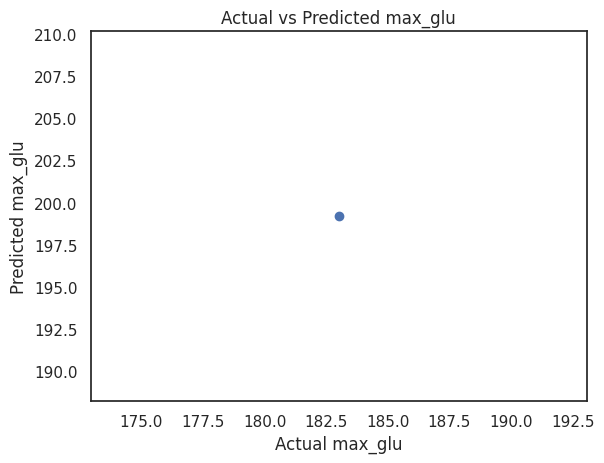

In [ ]:
# Import necessary libraries
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Assuming your DataFrame is named 'your_dataframe'
# Replace these column names if they are different in your actual dataset
features = ['sum_acc_per_day', 'min_glu']
target = 'max_glu'

# Select features (X) and target variable (y)
X = merge_cgm_acc_fourteen_sub[features]
y = merge_cgm_acc_fourteen_sub[target]

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)  # You can adjust the number of trees (n_estimators)

# Train the model
rf_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rf_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared Score: {r2}")

# Visualize the predicted vs actual values
plt.scatter(y_test, y_pred)
plt.xlabel('Actual max_glu')
plt.ylabel('Predicted max_glu')
plt.title('Actual vs Predicted max_glu')
plt.show()


In [ ]:
hr_fourteen=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/014/HR_014.csv')
acc_fourteen=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/014/ACC_014.csv')
acc_fourteen['datetime']=pd.to_datetime(acc_fourteen['datetime'])
acc_fourteen['date_only']=acc_fourteen['datetime'].dt.date
acc_fourteen['acc']=(((acc_fourteen[' acc_x'])**2 + (acc_fourteen[' acc_y'])**2 + (acc_fourteen[' acc_z'])**2)**0.5)
acc_fourteen['mean_acc_per_day']=acc_fourteen.groupby('date_only')['acc'].transform('mean')
acc_fourteen['sum_acc_per_day']=acc_fourteen.groupby('date_only')['acc'].transform('sum')

In [ ]:
eda_two=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/002/EDA_002.csv')
#food_two=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/002/Food_Log_002.csv')
#cgm_two=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/002/Dexcom_002.csv')
hr_two=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/002/HR_002.csv')
acc_two=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/002/ACC_002.csv')

In [ ]:
cgm_fifteen=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/015/Dexcom_015.csv')
cgm_fifteen['timestamp_dt']=pd.to_datetime(cgm_fifteen['Timestamp (YYYY-MM-DDThh:mm:ss)'])
cgm_fifteen=cgm_fifteen.dropna(subset = ['timestamp_dt'])
cgm_fifteen['date']=cgm_fifteen['timestamp_dt'].dt.date
cgm_fifteen

food_fifteen=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/015/Food_Log_015.csv')

food_fifteen['date']=pd.to_datetime(food_fifteen['date']).dt.date

food_fifteen['time_begin']=pd.to_datetime(food_fifteen['time_begin'])
window_dt = pd.Timedelta(minutes=120)

# add dt seconds to the original timestep
food_fifteen["time_begin_win"] = food_fifteen["time_begin"]  + window_dt

merge_food_cgm_fifteen=pd.merge(cgm_fifteen,food_fifteen,left_on=['date'],right_on=['date'])

cf_fifteen=food_fifteen[food_fifteen['logged_food']=='Standard breakfast']

merge_food_cgm_fifteen=pd.merge(cgm_fifteen,cf_fifteen,left_on=['date'],right_on=['date'])

food_cgm_fifteen_cf=merge_food_cgm_fifteen[(merge_food_cgm_fifteen['timestamp_dt']<=merge_food_cgm_fifteen['time_begin_win'])&(merge_food_cgm_fifteen['timestamp_dt']>=merge_food_cgm_fifteen['time_begin'])]

food_cgm_fifteen_cf['pre_glu_time']=food_cgm_fifteen_cf.groupby('date')['timestamp_dt'].transform('min')

column_names=food_cgm_fifteen_cf.columns.values
food_cgm_fifteen_cf_all_dates = pd.DataFrame(columns=column_names)

for i in food_cgm_fifteen_cf['date'].unique():
  date_sub=food_cgm_fifteen_cf[food_cgm_fifteen_cf['date']==i]

  date_sub = date_sub.sort_values(by='timestamp_dt')
  print(date_sub['Glucose Value (mg/dL)'].iloc[0])
  min_glu=date_sub['Glucose Value (mg/dL)'].iloc[0]
  date_sub['min_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('min_glu')] = min_glu

  print(date_sub['Glucose Value (mg/dL)'].iloc[-1])
  final_glu=date_sub['Glucose Value (mg/dL)'].iloc[-1]
  date_sub['final_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('final_glu')] = final_glu

  print(date_sub['Glucose Value (mg/dL)'].max())
  max_glu=date_sub['Glucose Value (mg/dL)'].max()
  date_sub['max_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('max_glu')] = max_glu

  food_cgm_fifteen_cf_all_dates=food_cgm_fifteen_cf_all_dates.append(date_sub)

fifteen_ogtt=food_cgm_fifteen_cf_all_dates

fifteen_ogtt_dup=fifteen_ogtt.drop_duplicates(subset=['date'], keep='first')
fifteen_ogtt_dup['id']=15
fifteen_ogtt_dup['a1c']="norm"
fifteen_ogtt_dup

KeyError: ignored

In [ ]:
cgm_sixteen=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/016/Dexcom_016.csv')
cgm_sixteen['timestamp_dt']=pd.to_datetime(cgm_sixteen['Timestamp (YYYY-MM-DDThh:mm:ss)'])
cgm_sixteen=cgm_sixteen.dropna(subset = ['timestamp_dt'])
cgm_sixteen['date']=cgm_sixteen['timestamp_dt'].dt.date
cgm_sixteen

food_sixteen=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/016/Food_Log_016.csv')

food_sixteen['date']=pd.to_datetime(food_sixteen['date']).dt.date

food_sixteen['time_begin']=pd.to_datetime(food_sixteen['time_begin'])
window_dt = pd.Timedelta(minutes=120)

# add dt seconds to the original timestep
food_sixteen["time_begin_win"] = food_sixteen["time_begin"]  + window_dt

merge_food_cgm_sixteen=pd.merge(cgm_sixteen,food_sixteen,left_on=['date'],right_on=['date'])

cf_sixteen=food_sixteen[food_sixteen['4']=='Standard breakfast']

merge_food_cgm_sixteen=pd.merge(cgm_sixteen,cf_sixteen,left_on=['date'],right_on=['date'])

food_cgm_sixteen_cf=merge_food_cgm_sixteen[(merge_food_cgm_sixteen['timestamp_dt']<=merge_food_cgm_sixteen['time_begin_win'])&(merge_food_cgm_sixteen['timestamp_dt']>=merge_food_cgm_sixteen['time_begin'])]

food_cgm_sixteen_cf['pre_glu_time']=food_cgm_sixteen_cf.groupby('date')['timestamp_dt'].transform('min')

column_names=food_cgm_sixteen_cf.columns.values
food_cgm_sixteen_cf_all_dates = pd.DataFrame(columns=column_names)

for i in food_cgm_sixteen_cf['date'].unique():
  date_sub=food_cgm_sixteen_cf[food_cgm_sixteen_cf['date']==i]

  date_sub = date_sub.sort_values(by='timestamp_dt')
  print(date_sub['Glucose Value (mg/dL)'].iloc[0])
  min_glu=date_sub['Glucose Value (mg/dL)'].iloc[0]
  date_sub['min_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('min_glu')] = min_glu

  print(date_sub['Glucose Value (mg/dL)'].iloc[-1])
  final_glu=date_sub['Glucose Value (mg/dL)'].iloc[-1]
  date_sub['final_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('final_glu')] = final_glu

  print(date_sub['Glucose Value (mg/dL)'].max())
  max_glu=date_sub['Glucose Value (mg/dL)'].max()
  date_sub['max_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('max_glu')] = max_glu

  food_cgm_sixteen_cf_all_dates=food_cgm_sixteen_cf_all_dates.append(date_sub)

sixteen_ogtt=food_cgm_sixteen_cf_all_dates

sixteen_ogtt_dup=sixteen_ogtt.drop_duplicates(subset=['date'], keep='first')
sixteen_ogtt_dup['id']=16
sixteen_ogtt_dup['a1c']="norm"
sixteen_ogtt_dup

KeyError: ignored

In [ ]:
df_ogtt=five_ogtt_dup
df_ogtt=df_ogtt.append(four_ogtt_dup)
df_ogtt=df_ogtt.append(two_ogtt_dup)
df_ogtt=df_ogtt.append(eight_ogtt_dup)
df_ogtt=df_ogtt.append(nine_ogtt_dup)
df_ogtt=df_ogtt.append(ten_ogtt_dup)
df_ogtt=df_ogtt.append(eleven_ogtt_dup)
df_ogtt=df_ogtt.append(twelve_ogtt_dup)
df_ogtt=df_ogtt.append(thirteen_ogtt_dup)
df_ogtt=df_ogtt.append(fourteen_ogtt_dup)
df_ogtt

,Index,Timestamp (YYYY-MM-DDThh:mm:ss),Event Type,Event Subtype,Patient Info,Device Info,Source Device ID,Glucose Value (mg/dL),Insulin Value (u),Carb Value (grams),...,pre_glu_time,min_glu,final_glu,max_glu,id,a1c,Food_Item,Amount_Consumed,Units,Food_Item_Description
108,246,2020-02-28 09:00:10,EGV,NaN,NaN,NaN,MX84702427,96.0,NaN,NaN,...,2020-02-28 09:00:10,96.0,96.0,166.0,5,PD,NaN,NaN,NaN,NaN
384,810,2020-03-01 08:00:01,EGV,NaN,NaN,NaN,MX84702427,99.0,NaN,NaN,...,2020-03-01 08:00:01,99.0,115.0,150.0,5,PD,NaN,NaN,NaN,NaN
693,1407,2020-03-03 09:44:53,EGV,NaN,NaN,NaN,MX84702427,97.0,NaN,NaN,...,2020-03-03 09:44:53,97.0,102.0,141.0,5,PD,NaN,NaN,NaN,NaN
965,1954,2020-03-05 08:31:10,EGV,NaN,NaN,NaN,MX84702427,90.0,NaN,NaN,...,2020-03-05 08:31:10,90.0,98.0,145.0,5,PD,NaN,NaN,NaN,NaN
96,266,2020-02-28 08:01:19,EGV,NaN,NaN,NaN,Android G6,115.0,NaN,NaN,...,2020-02-28 08:01:19,115.0,167.0,188.0,4,PD,NaN,NaN,NaN,NaN
393,849,2020-03-01 08:46:15,EGV,NaN,NaN,NaN,Android G6,107.0,NaN,NaN,...,2020-03-01 08:46:15,107.0,119.0,167.0,4,PD,NaN,NaN,NaN,NaN
628,1343,2020-03-03 09:31:11,EGV,NaN,NaN,NaN,Android G6,118.0,NaN,NaN,...,2020-03-03 09:31:11,118.0,134.0,189.0,4,PD,NaN,NaN,NaN,NaN
910,1913,2020-03-05 09:01:08,EGV,NaN,NaN,NaN,Android G6,109.0,NaN,NaN,...,2020-03-05 09:01:08,109.0,96.0,141.0,4,PD,NaN,NaN,NaN,NaN
68,236,2020-02-22 05:43:34,EGV,NaN,NaN,NaN,Android G6,138.0,NaN,NaN,...,2020-02-22 05:43:34,138.0,95.0,197.0,2,norm,NaN,NaN,NaN,NaN
402,858,2020-02-24 09:33:31,EGV,NaN,NaN,NaN,Android G6,115.0,NaN,NaN,...,2020-02-24 09:33:31,115.0,129.0,183.0,2,norm,NaN,NaN,NaN,NaN


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
# set a grey background (use sns.set_theme() if seaborn version 0.11.0 or above)
sns.set(style="white")
#df = sns.load_dataset('iris')

# plotting both distibutions on the same figure
fig = sns.kdeplot(df_ogtt['min_glu'], hue='a1c')
fig = sns.kdeplot(df_ogtt['max_glu'], shade=True, color="b")
fig = sns.kdeplot(df_ogtt['final_glu'], shade=True, color="y")
plt.show()

ValueError: ignored

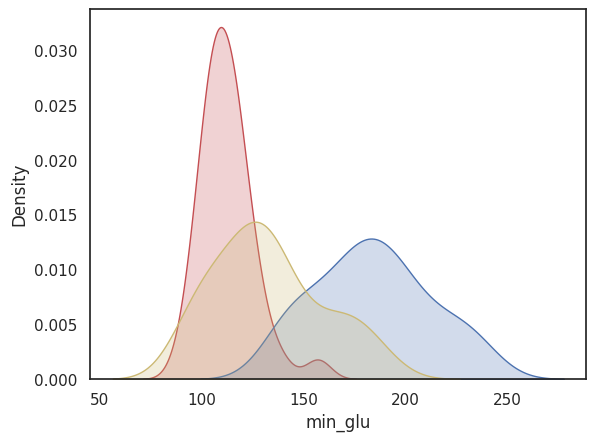

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
# set a grey background (use sns.set_theme() if seaborn version 0.11.0 or above)
sns.set(style="white")
#df = sns.load_dataset('iris')

# plotting both distibutions on the same figure
fig = sns.kdeplot(df_ogtt['min_glu'], shade=True, color="r")
fig = sns.kdeplot(df_ogtt['max_glu'], shade=True, color="b")
fig = sns.kdeplot(df_ogtt['final_glu'], shade=True, color="y")
plt.show()
#Ref: https://python-graph-gallery.com/74-density-plot-of-several-variables/

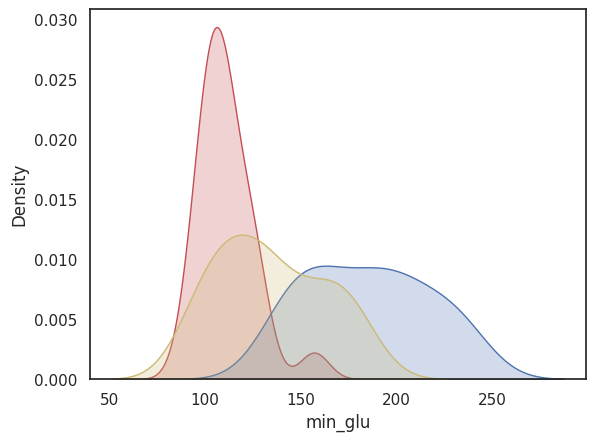

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
# set a grey background (use sns.set_theme() if seaborn version 0.11.0 or above)
sns.set(style="white")
#df = sns.load_dataset('iris')
df_ogtt_pd=df_ogtt[df_ogtt['a1c']=='PD']

# plotting both distibutions on the same figure
fig = sns.kdeplot(df_ogtt_pd['min_glu'], shade=True, color="r")
fig = sns.kdeplot(df_ogtt_pd['max_glu'], shade=True, color="b")
fig = sns.kdeplot(df_ogtt_pd['final_glu'], shade=True, color="y")
plt.show()
#Ref: https://python-graph-gallery.com/74-density-plot-of-several-variables/

In [ ]:
#acc, hr, eda, a1c, previous food features to predict ogtt glu response

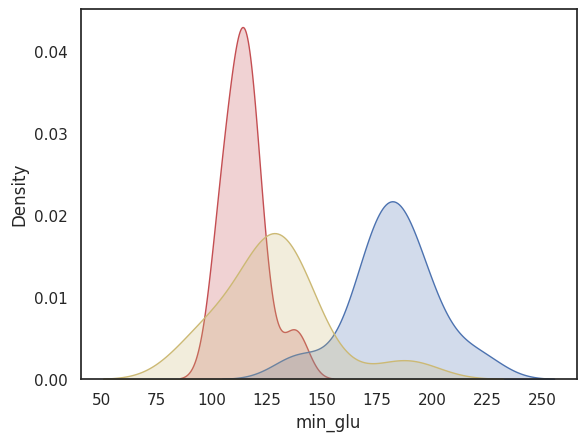

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
# set a grey background (use sns.set_theme() if seaborn version 0.11.0 or above)
sns.set(style="white")
#df = sns.load_dataset('iris')
df_ogtt_norm=df_ogtt[df_ogtt['a1c']=='norm']

# plotting both distibutions on the same figure
fig = sns.kdeplot(df_ogtt_norm['min_glu'], shade=True, color="r")
fig = sns.kdeplot(df_ogtt_norm['max_glu'], shade=True, color="b")
fig = sns.kdeplot(df_ogtt_norm['final_glu'], shade=True, color="y")
plt.show()
#Ref: https

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
# set a grey background (use sns.set_theme() if seaborn version 0.11.0 or above)
sns.set(style="white")
#df = sns.load_dataset('iris')

# plotting both distibutions on the same figure
fig = sns.distplot(df_ogtt['min_glu'], shade=True, color="r")
fig = sns.distplot(df_ogtt['max_glu'], shade=True, color="b")
fig = sns.distplot(df_ogtt['final_glu'], shade=True, color="y")
plt.show()

TypeError: ignored

<ipython-input-103-08ee511a9e51>:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(a=df_ogtt.min_glu, kde=False)


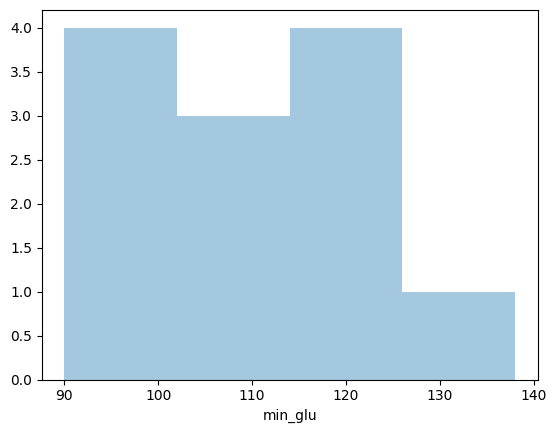

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt


sns.distplot(a=df_ogtt.min_glu, kde=False)

# visualizing plot using matplotlib.pyplot library
plt.show()

In [ ]:
cgm_six=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/006/Dexcom_006.csv')
cgm_six['timestamp_dt']=pd.to_datetime(cgm_six['Timestamp (YYYY-MM-DDThh:mm:ss)'])
cgm_six=cgm_six.dropna(subset = ['timestamp_dt'])
cgm_six['date']=cgm_six['timestamp_dt'].dt.date
cgm_six

food_six=pd.read_csv('big-ideas-lab-glycemic-variability-and-wearable-device-data-1.1.0/006/Food_Log_006.csv')

food_six['date']=pd.to_datetime(food_six['date']).dt.date

food_six['time_begin']=pd.to_datetime(food_six['time_begin'])
window_dt = pd.Timedelta(minutes=120)

# add dt seconds to the original timestep
food_six["time_begin_win"] = food_six["time_begin"]  + window_dt

merge_food_cgm_six=pd.merge(cgm_six,food_six,left_on=['date'],right_on=['date'])

#cf_six=food_six[food_six['logged_food']=='Frosted Flakes']
cf_six=food_six[food_six['logged_food']=='Frosted Flakes']
print(cf_six)

merge_food_cgm_six=pd.merge(cgm_six,cf_six,left_on=['date'],right_on=['date'])

food_cgm_six_cf=merge_food_cgm_six[(merge_food_cgm_six['timestamp_dt']<=merge_food_cgm_six['time_begin_win'])&(merge_food_cgm_six['timestamp_dt']>=merge_food_cgm_six['time_begin'])]

food_cgm_six_cf['pre_glu_time']=food_cgm_six_cf.groupby('date')['timestamp_dt'].transform('min')
#merge_food_cgm_six_cf['pre_glu']=merge_food_cgm_six_cf.loc[merge_food_cgm_six_cf['timestamp_dt']=='pre_glu_time', ['Glucose Value (mg/dL)']]
#food_cgm_six_cf['pre_glu'] = food_cgm_six_cf['Glucose Value (mg/dL)'].where(food_cgm_six_cf['timestamp_dt']=='pre_glu_time').groupby(food_cgm_six_cf['date'])

column_names=food_cgm_six_cf.columns.values
food_cgm_six_cf_all_dates = pd.DataFrame(columns=column_names)

for i in food_cgm_six_cf['date'].unique():
  date_sub=food_cgm_six_cf[food_cgm_six_cf['date']==i]
  #date_sub['pre_glu']=date_sub['Glucose Value (mg/dL)'].where(date_sub['timestamp_dt']=='pre_glu_time')

  date_sub = date_sub.sort_values(by='timestamp_dt')
  print(date_sub['Glucose Value (mg/dL)'].iloc[0])
  min_glu=date_sub['Glucose Value (mg/dL)'].iloc[0]
  date_sub['min_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('min_glu')] = min_glu

  print(date_sub['Glucose Value (mg/dL)'].iloc[-1])
  final_glu=date_sub['Glucose Value (mg/dL)'].iloc[-1]
  date_sub['final_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('final_glu')] = final_glu

  print(date_sub['Glucose Value (mg/dL)'].max())
  max_glu=date_sub['Glucose Value (mg/dL)'].max()
  date_sub['max_glu']=0
  date_sub.iloc[:, date_sub.columns.get_loc('max_glu')] = max_glu

  food_cgm_six_cf_all_dates=food_cgm_six_cf_all_dates.append(date_sub)

#food_cgm_six_cf_all_dates

six_ogtt=food_cgm_six_cf

six_ogtt_dup=six_ogtt.drop_duplicates(subset=['date'], keep='first')
#six_ogtt_dup

Empty DataFrame
Columns: [date, time, time_begin, time_end, logged_food, amount, unit, searched_food, calorie, total_carb, dietary_fiber, sugar, protein, total_fat, time_begin_win]
Index: []


In [ ]:
_scf_six

,date,time,time_begin,time_end,logged_food,amount,unit,searched_food,calorie,total_carb,dietary_fiber,sugar,protein,total_fat,time_begin_win


In [ ]:
# Sort the DataFrame by datetime
food_cgm_two_cf = food_cgm_two_cf.sort_values(by='timestamp_dt')

# Group by date and get the index of the minimum datetime for each group
min_time_indices = food_cgm_two_cf.groupby('date')['timestamp_dt'].idxmin()

# Select the rows with the minimum datetime
result = df.loc[min_time_indices]

# Create a new column 'min_glucose_value' with the corresponding minimum glucose value for each day
result['min_glucose_value'] = df.loc[min_time_indices]['glucose_value'].values

food_cgm_two_cf


In [ ]:
eda_two.head(5)

,datetime,eda
0,2020-02-21 09:19:06.000,0.000000
1,2020-02-21 09:19:06.250,0.139648
2,2020-02-21 09:19:06.500,0.202426
3,2020-02-21 09:19:06.750,0.202426
4,2020-02-21 09:19:07.000,0.204988


In [ ]:
cgm_two.head(2)

,Index,Timestamp (YYYY-MM-DDThh:mm:ss),Event Type,Event Subtype,Patient Info,Device Info,Source Device ID,Glucose Value (mg/dL),Insulin Value (u),Carb Value (grams),Duration (hh:mm:ss),Glucose Rate of Change (mg/dL/min),Transmitter Time (Long Integer)
0,1,NaN,FirstName,NaN,2019,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,NaN,LastName,NaN,002,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
cgm_two['Glucose']=cgm_two['Glucose Value (mg/dL)']
cgm_two['Time']=pd.to_datetime(cgm_two['Timestamp (YYYY-MM-DDThh:mm:ss)'])

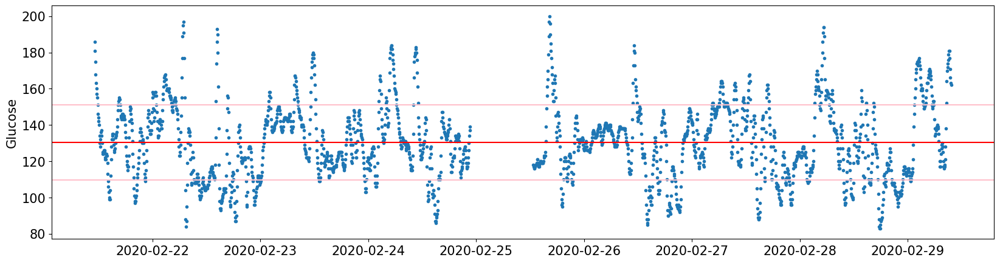

In [ ]:
#plotglucosebounds(cgm_two)
plotglucosesd(cgm_two)

In [ ]:
cgm_two['timestamp_dt']=pd.to_datetime(cgm_two['Timestamp (YYYY-MM-DDThh:mm:ss)'])

In [ ]:
cgm_two=cgm_two.dropna(subset = ['timestamp_dt'])

In [ ]:
#features from previous day's activity, hr, activity after eating. EDA changes

In [ ]:
acc_two.head(10)
acc_two['datetime']=pd.to_datetime(acc_two['datetime'])
acc_two['date_only']=acc_two['datetime'].dt.date

In [ ]:
acc_two['datetime']=pd.to_datetime(acc_two['datetime'])
acc_two['date_only']=acc_two['datetime'].dt.date
acc_two['acc']=(((acc_two[' acc_x'])**2 + (acc_two[' acc_y'])**2 + (acc_two[' acc_z'])**2)**0.5)
acc_two['mean_acc_per_day']=acc_two.groupby('date_only')['acc'].transform('mean')

In [ ]:
hr_two['datetime_converted']=pd.to_datetime(hr_two['datetime'])

In [ ]:
#((pd.Series(acc_two[acc_x])**2 + pd.Series(acc_two[acc_y])**2 + pd.Series(acc_two[acc_z])**2)**0.5)
#ref: https://towardsdatascience.com/feature-engineering-on-time-series-data-transforming-signal-data-of-a-smartphone-accelerometer-for-72cbe34b8a60

NameError: ignored

In [ ]:
X_train['avg_result_accl'] = [i.mean() for i in ((pd.Series(x_list)**2 + pd.Series(y_list)**2 + pd.Series(z_list)**2)**0.5)]

In [ ]:
cgm_two.tail(10)
import plotly as plt
plt.plot(cgm_two, x='Timestamp (YYYY-MM-DDThh:mm:ss)', y='Glucose Value (mg/dL)',kind="line")

In [ ]:
acc_two.head(10)

NameError: ignored

In [ ]:
food_two[food_two[4]=='Boost']

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
68,2020-02-29,08:00:00,2020-02-29 08:00:00,NaN,Boost,NaN,NaN,NaN,654.0,82.0,5.6,40.0,26.0,26.0


In [ ]:
hr_two

,datetime,hr
0,2020-02-21 09:19:16,58.00
1,2020-02-21 09:19:17,58.50
2,2020-02-21 09:19:18,56.33
3,2020-02-21 09:19:19,60.50
4,2020-02-21 09:19:20,73.20
...,...,...
629667,2020-02-29 12:45:06,158.87
629668,2020-02-29 12:45:07,157.12
629669,2020-02-29 12:45:08,155.38
629670,2020-02-29 12:45:09,153.67


In [ ]:
import numpy as np

In [ ]:
hr_two['datetime_converted']=pd.to_datetime(hr_two['datetime'])

In [ ]:
np.unique(cgm_two.timestamp_to_sec_dt)

array(['2020-02-21T13:08:36.000000000', '2020-02-21T13:13:36.000000000',
       '2020-02-21T13:18:36.000000000', ...,
       '2020-02-29T11:33:24.000000000', '2020-02-29T11:38:24.000000000',
                                 'NaT'], dtype='datetime64[ns]')

In [ ]:
cgm_two=cgm_two.dropna(subset = ['timestamp_to_sec_dt'])

KeyError: ignored

In [ ]:
#Rolling windows

# set rollling window length in seconds
window_dt = pd.Timedelta(minutes=120)

# add dt seconds to the original timestep
cgm_two["timestamp_to_sec_dt"] = cgm_two["timestamp_dt"]  + window_dt

# unique end time
time_unique_endlist = np.unique(cgm_two.timestamp_to_sec_dt)

# remove end values that are greater than the last actual value, i.e. max(df["timestamp_to_sec"])
time_unique_endlist = time_unique_endlist[time_unique_endlist <= max(cgm_two["timestamp_dt"])]

# containers for rolling sample statistics
mydic = {}
counter = 0

# loop running the rolling window
for time_i in time_unique_endlist:

    start_time = time_i - window_dt

    # sample for each time period of sliding window
    rolling_sample = cgm_two[(cgm_two.timestamp_dt >= start_time) & (cgm_two.timestamp_dt <= time_i)]

    # calculate the sample statistics
    mydic[counter] = {
                        "sample_size":len(rolling_sample),
                        "sample_mean":rolling_sample["Glucose Value (mg/dL)"].mean(),
                        "sample_std":rolling_sample["Glucose Value (mg/dL)"].std(),
                        "sample_time_start":rolling_sample["timestamp_dt"].min(),
                        "sample_time_end":rolling_sample["timestamp_dt"].max(),
                        "sample_start_time":start_time
                        }
    counter = counter + 1


# results in a DataFrame
results = pd.DataFrame.from_dict(mydic).T

<ipython-input-10-37e435f2f38f>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cgm_two["timestamp_to_sec_dt"] = cgm_two["timestamp_dt"]  + window_dt


In [ ]:
results.head(5)

,sample_size,sample_mean,sample_std,sample_time_start,sample_time_end,sample_start_time
0,25,145.08,18.538069,2020-02-21 11:08:36,2020-02-21 13:08:34,2020-02-21 11:08:36
1,25,142.68,16.824387,2020-02-21 11:13:36,2020-02-21 13:13:34,2020-02-21 11:13:36
2,25,140.48,15.113791,2020-02-21 11:18:36,2020-02-21 13:18:34,2020-02-21 11:18:36
3,25,138.48,13.586513,2020-02-21 11:23:35,2020-02-21 13:23:34,2020-02-21 11:23:35
4,25,136.64,12.492931,2020-02-21 11:28:36,2020-02-21 13:28:35,2020-02-21 11:28:36


In [ ]:
results['date']=pd.to_datetime(results['sample_time_start']).dt.date

In [ ]:
#Food and response
food_two.head(3)

,date,time,time_begin,time_end,logged_food,amount,unit,searched_food,calorie,total_carb,dietary_fiber,sugar,protein,total_fat
0,2020-02-21,10:09:00,2020-02-21 10:09:00,NaN,Mello Yello,12.0,fluid ounce,Mello Yello,180.0,48.0,0.0,48.0,0.0,0.0
1,2020-02-21,10:11:00,2020-02-21 10:11:00,NaN,(Jimmy Dean) Chicken Biscuit,1.0,NaN,"(Jimmy Dean) Sandwiches, Biscuit Southern Styl...",280.0,32.0,2.0,3.0,13.0,12.0
2,2020-02-21,12:09:00,2020-02-21 12:09:00,NaN,Beef Jerky,2.0,NaN,Large Beef Jerky,164.0,4.4,0.7,3.6,13.0,10.0


In [ ]:
food_two['date']=pd.to_datetime(food_two['date']).dt.date

In [ ]:
food_two['time_begin']=pd.to_datetime(food_two['time_begin'])

In [ ]:
food_two['time_dt']=pd.to_datetime(food_two['time']).dt.time

In [ ]:
food_two.head(2)

,date,time,time_begin,time_end,logged_food,amount,unit,searched_food,calorie,total_carb,dietary_fiber,sugar,protein,total_fat,time_dt
0,2020-02-21,10:09:00,2020-02-21 10:09:00,NaN,Mello Yello,12.0,fluid ounce,Mello Yello,180.0,48.0,0.0,48.0,0.0,0.0,10:09:00
1,2020-02-21,10:11:00,2020-02-21 10:11:00,NaN,(Jimmy Dean) Chicken Biscuit,1.0,NaN,"(Jimmy Dean) Sandwiches, Biscuit Southern Styl...",280.0,32.0,2.0,3.0,13.0,12.0,10:11:00


In [ ]:
merge_food_cgm_two=pd.merge(results,food_two,left_on=['date'],right_on=['date'])

NameError: ignored

In [ ]:
merge_food_cgm_two.logged_food.unique()

NameError: ignored

In [ ]:
def merge_func(merge_food_cgm_two):
    merge_food_cgm_two_resp=merge_food_cgm_two[(merge_food_cgm_two['sample_time_start']<=merge_food_cgm_two['time_begin'])&(merge_food_cgm_two['sample_time_end']>=merge_food_cgm_two['time_begin'])]
    return merge_food_cgm_two_resp

In [ ]:
merge_food_cgm_times=merge_func(merge_food_cgm_two)

NameError: ignored

In [ ]:
merge_food_cgm_times.head(5)

NameError: ignored

In [ ]:
merge_food_cgm_times['time_begin_dt']=pd.to_datetime(merge_food_cgm_times['time_begin'])
merge_food_cgm_times['diff_min']=(merge_food_cgm_times.sample_time_end-merge_food_cgm_times.time_begin_dt).astype('timedelta64[m]')

NameError: ignored

<Axes: xlabel='diff_min', ylabel='sample_mean'>

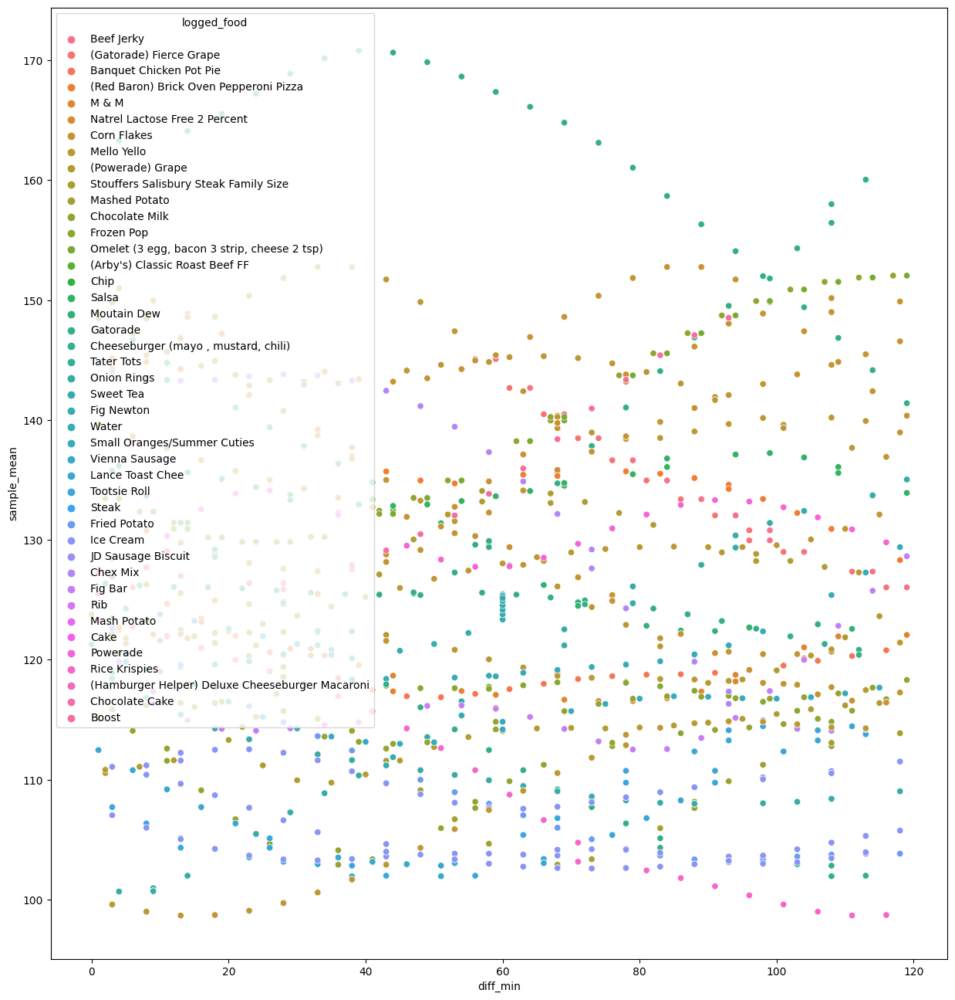

In [ ]:
#plt.plot(merge_food_cgm_times['diff_min'], merge_food_cgm_times['sample_mean'], '.', color='logged_food')
import seaborn as sns
plt.figure(figsize=(15,16))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.scatterplot(data=merge_food_cgm_times, x="diff_min", y="sample_mean",hue='logged_food')

In [ ]:
cf=merge_food_cgm_times[merge_food_cgm_times['logged_food']=='Corn Flakes']
cf.date.unique()

NameError: ignored

In [ ]:
cf.diff_min

1482       4.0
1491       9.0
1500      14.0
1509      14.0
1518      19.0
         ...  
15758     96.0
15766    101.0
15774    106.0
15782    111.0
15790    116.0
Name: diff_min, Length: 95, dtype: float64

In [ ]:
cf[cf.diff_min>70.0]

,sample_size,sample_mean,sample_std,sample_time_start,sample_time_end,date,time,time_begin,time_end,logged_food,...,searched_food,calorie,total_carb,dietary_fiber,sugar,protein,total_fat,time_dt,time_begin_dt,diff_min
1608,25,150.36,21.015629,2020-02-22 04:53:34,2020-02-22 06:53:34,2020-02-22,05:39:00,2020-02-22 05:39:00,NaN,Corn Flakes,...,"(Kellogg's) Frosted Flakes, Cereal",110.0,26.0,NaN,10.0,1.0,NaN,05:39:00,2020-02-22 05:39:00,74.0
1617,25,151.84,22.530868,2020-02-22 04:58:34,2020-02-22 06:58:33,2020-02-22,05:39:00,2020-02-22 05:39:00,NaN,Corn Flakes,...,"(Kellogg's) Frosted Flakes, Cereal",110.0,26.0,NaN,10.0,1.0,NaN,05:39:00,2020-02-22 05:39:00,79.0
1626,25,152.76,23.085493,2020-02-22 05:03:34,2020-02-22 07:03:34,2020-02-22,05:39:00,2020-02-22 05:39:00,NaN,Corn Flakes,...,"(Kellogg's) Frosted Flakes, Cereal",110.0,26.0,NaN,10.0,1.0,NaN,05:39:00,2020-02-22 05:39:00,84.0
1635,25,152.76,23.085493,2020-02-22 05:08:34,2020-02-22 07:08:33,2020-02-22,05:39:00,2020-02-22 05:39:00,NaN,Corn Flakes,...,"(Kellogg's) Frosted Flakes, Cereal",110.0,26.0,NaN,10.0,1.0,NaN,05:39:00,2020-02-22 05:39:00,89.0
1644,25,151.72,23.652907,2020-02-22 05:13:34,2020-02-22 07:13:34,2020-02-22,05:39:00,2020-02-22 05:39:00,NaN,Corn Flakes,...,"(Kellogg's) Frosted Flakes, Cereal",110.0,26.0,NaN,10.0,1.0,NaN,05:39:00,2020-02-22 05:39:00,94.0
1653,25,149.84,25.507646,2020-02-22 05:18:34,2020-02-22 07:18:34,2020-02-22,05:39:00,2020-02-22 05:39:00,NaN,Corn Flakes,...,"(Kellogg's) Frosted Flakes, Cereal",110.0,26.0,NaN,10.0,1.0,NaN,05:39:00,2020-02-22 05:39:00,99.0
1662,25,147.4,28.350485,2020-02-22 05:23:34,2020-02-22 07:23:34,2020-02-22,05:39:00,2020-02-22 05:39:00,NaN,Corn Flakes,...,"(Kellogg's) Frosted Flakes, Cereal",110.0,26.0,NaN,10.0,1.0,NaN,05:39:00,2020-02-22 05:39:00,104.0
1671,25,144.84,31.054629,2020-02-22 05:28:34,2020-02-22 07:28:34,2020-02-22,05:39:00,2020-02-22 05:39:00,NaN,Corn Flakes,...,"(Kellogg's) Frosted Flakes, Cereal",110.0,26.0,NaN,10.0,1.0,NaN,05:39:00,2020-02-22 05:39:00,109.0
1680,25,142.4,33.123506,2020-02-22 05:33:34,2020-02-22 07:33:34,2020-02-22,05:39:00,2020-02-22 05:39:00,NaN,Corn Flakes,...,"(Kellogg's) Frosted Flakes, Cereal",110.0,26.0,NaN,10.0,1.0,NaN,05:39:00,2020-02-22 05:39:00,114.0
1689,25,140.36,34.436996,2020-02-22 05:38:34,2020-02-22 07:38:34,2020-02-22,05:39:00,2020-02-22 05:39:00,NaN,Corn Flakes,...,"(Kellogg's) Frosted Flakes, Cereal",110.0,26.0,NaN,10.0,1.0,NaN,05:39:00,2020-02-22 05:39:00,119.0


<Axes: xlabel='diff_min', ylabel='sample_mean'>

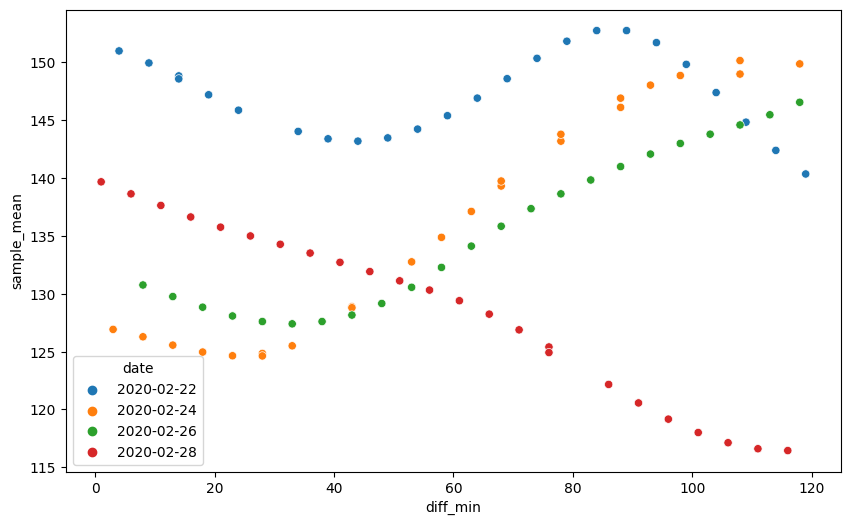

In [ ]:
import seaborn as sns
plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.scatterplot(data=cf, x="diff_min", y="sample_mean",hue='date')

In [ ]:
#Calculate glu_AUC

In [ ]:
cgm_two['timestamp_dt'].dtype

window_dt = pd.Timedelta(minutes=120)

# add dt seconds to the original timestep
food_two["time_begin_win"] = food_two["time_begin"]  + window_dt

In [ ]:
cgm_two

,Index,Timestamp (YYYY-MM-DDThh:mm:ss),Event Type,Event Subtype,Patient Info,Device Info,Source Device ID,Glucose Value (mg/dL),Insulin Value (u),Carb Value (grams),Duration (hh:mm:ss),Glucose Rate of Change (mg/dL/min),Transmitter Time (Long Integer),timestamp_dt,Glucose,Time
0,1,NaN,FirstName,NaN,2019,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaT
1,2,NaN,LastName,NaN,002,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaT
2,3,NaN,PatientIdentifier,NaN,2019-002,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaT
3,4,NaN,DateOfBirth,NaN,1970-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaT
4,5,NaN,Device,NaN,NaN,Dexcom G6 Mobile App,Android G6,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2126,2127,2020-02-29 09:18:25,EGV,NaN,NaN,NaN,Android G6,177.0,NaN,NaN,NaN,NaN,694486.0,2020-02-29 09:18:25,177.0,2020-02-29 09:18:25
2127,2128,2020-02-29 09:23:24,EGV,NaN,NaN,NaN,Android G6,171.0,NaN,NaN,NaN,NaN,694786.0,2020-02-29 09:23:24,171.0,2020-02-29 09:23:24
2128,2129,2020-02-29 09:28:24,EGV,NaN,NaN,NaN,Android G6,166.0,NaN,NaN,NaN,NaN,695086.0,2020-02-29 09:28:24,166.0,2020-02-29 09:28:24
2129,2130,2020-02-29 09:33:24,EGV,NaN,NaN,NaN,Android G6,163.0,NaN,NaN,NaN,NaN,695386.0,2020-02-29 09:33:24,163.0,2020-02-29 09:33:24


In [ ]:
food_cgm_two_near=pd.merge_asof(cgm_two, food_two, left_on="timestamp_dt", right_on="time_begin", direction="nearest")

food_cgm_two_near[(food_cgm_two_near['logged_food']=='Corn Flakes')&(food_cgm_two_near['date']==dt.date(2020,2,22))]

,Index,Timestamp (YYYY-MM-DDThh:mm:ss),Event Type,Event Subtype,Patient Info,Device Info,Source Device ID,Glucose Value (mg/dL),Insulin Value (u),Carb Value (grams),...,unit,searched_food,calorie,total_carb,dietary_fiber,sugar,protein,total_fat,time_dt,time_begin_win
223,236,2020-02-22 05:43:34,EGV,NaN,NaN,NaN,Android G6,138.0,NaN,NaN,...,cup,"(Kellogg's) Frosted Flakes, Cereal",110.0,26.0,NaN,10.0,1.0,NaN,05:39:00,2020-02-22 07:39:00
224,237,2020-02-22 05:48:34,EGV,NaN,NaN,NaN,Android G6,132.0,NaN,NaN,...,cup,"(Kellogg's) Frosted Flakes, Cereal",110.0,26.0,NaN,10.0,1.0,NaN,05:39:00,2020-02-22 07:39:00
225,238,2020-02-22 05:53:33,EGV,NaN,NaN,NaN,Android G6,128.0,NaN,NaN,...,cup,"(Kellogg's) Frosted Flakes, Cereal",110.0,26.0,NaN,10.0,1.0,NaN,05:39:00,2020-02-22 07:39:00
226,239,2020-02-22 05:58:34,EGV,NaN,NaN,NaN,Android G6,123.0,NaN,NaN,...,cup,"(Kellogg's) Frosted Flakes, Cereal",110.0,26.0,NaN,10.0,1.0,NaN,05:39:00,2020-02-22 07:39:00
227,240,2020-02-22 06:03:34,EGV,NaN,NaN,NaN,Android G6,123.0,NaN,NaN,...,cup,"(Kellogg's) Frosted Flakes, Cereal",110.0,26.0,NaN,10.0,1.0,NaN,05:39:00,2020-02-22 07:39:00


In [ ]:
cgm_two[(cgm_two['timestamp_dt']>=dt.datetime(2020,2,22,5,20))].head(15)

,Index,Timestamp (YYYY-MM-DDThh:mm:ss),Event Type,Event Subtype,Patient Info,Device Info,Source Device ID,Glucose Value (mg/dL),Insulin Value (u),Carb Value (grams),Duration (hh:mm:ss),Glucose Rate of Change (mg/dL/min),Transmitter Time (Long Integer),timestamp_dt,Glucose,Time
231,232,2020-02-22 05:23:34,EGV,NaN,NaN,NaN,Android G6,148.0,NaN,NaN,NaN,NaN,75599.0,2020-02-22 05:23:34,148.0,2020-02-22 05:23:34
232,233,2020-02-22 05:28:34,EGV,NaN,NaN,NaN,Android G6,148.0,NaN,NaN,NaN,NaN,75899.0,2020-02-22 05:28:34,148.0,2020-02-22 05:28:34
233,234,2020-02-22 05:33:34,EGV,NaN,NaN,NaN,Android G6,146.0,NaN,NaN,NaN,NaN,76199.0,2020-02-22 05:33:34,146.0,2020-02-22 05:33:34
234,235,2020-02-22 05:38:34,EGV,NaN,NaN,NaN,Android G6,143.0,NaN,NaN,NaN,NaN,76499.0,2020-02-22 05:38:34,143.0,2020-02-22 05:38:34
235,236,2020-02-22 05:43:34,EGV,NaN,NaN,NaN,Android G6,138.0,NaN,NaN,NaN,NaN,76799.0,2020-02-22 05:43:34,138.0,2020-02-22 05:43:34
236,237,2020-02-22 05:48:34,EGV,NaN,NaN,NaN,Android G6,132.0,NaN,NaN,NaN,NaN,77099.0,2020-02-22 05:48:34,132.0,2020-02-22 05:48:34
237,238,2020-02-22 05:53:33,EGV,NaN,NaN,NaN,Android G6,128.0,NaN,NaN,NaN,NaN,77399.0,2020-02-22 05:53:33,128.0,2020-02-22 05:53:33
238,239,2020-02-22 05:58:34,EGV,NaN,NaN,NaN,Android G6,123.0,NaN,NaN,NaN,NaN,77699.0,2020-02-22 05:58:34,123.0,2020-02-22 05:58:34
239,240,2020-02-22 06:03:34,EGV,NaN,NaN,NaN,Android G6,123.0,NaN,NaN,NaN,NaN,77999.0,2020-02-22 06:03:34,123.0,2020-02-22 06:03:34
240,241,2020-02-22 06:08:34,EGV,NaN,NaN,NaN,Android G6,125.0,NaN,NaN,NaN,NaN,78299.0,2020-02-22 06:08:34,125.0,2020-02-22 06:08:34


In [ ]:
merge_food_cgm_two=pd.merge(cgm_two,food_two,left_on=['date'],right_on=['date'])

In [ ]:
cgm_two['date']=pd.to_datetime(cgm_two['timestamp_dt']).dt.date

In [ ]:
#Non rolling predcitions
merge_food_cgm_two=pd.merge(cgm_two,food_two,left_on=['date'],right_on=['date'])
merge_food_cgm_two=pd.merge(cgm_two,food_two,left_on=['date'],right_on=['date'])

def merge_func(merge_food_cgm_two):
    merge_food_cgm_two_resp=merge_food_cgm_two[(merge_food_cgm_two['timestamp_dt']>=merge_food_cgm_two['time_begin'])&(merge_food_cgm_two['timestamp_dt']<=merge_food_cgm_two['time_begin_win'])]
    return merge_food_cgm_two_resp

merge_food_cgm_times=merge_func(merge_food_cgm_two)

merge_food_cgm_times['time_begin_dt']=pd.to_datetime(merge_food_cgm_times['time_begin'])
merge_food_cgm_times['diff_min']=(merge_food_cgm_times.timestamp_dt-merge_food_cgm_times.time_begin_dt).astype('timedelta64[m]')

cf=merge_food_cgm_times[merge_food_cgm_times['logged_food']=='Corn Flakes']
cf.date.unique()

cf['peak']=cf.groupby('date')['Glucose Value (mg/dL)'].transform('max')
import seaborn as sns

#fig,ax=plt.plot(figsize=(10,6))
#palette = ['r','b','g']

plt.figure(figsize=(10,6))
plt.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1)
sns.scatterplot(data=cf, x="diff_min", y="Glucose Value (mg/dL)",hue='date')

#for item, color in zip(cf.groupby('date'),palette):
    #item[1] is a grouped data frame
 #   for x,y,m in item[1][['diff_min','Glucose Value (mg/dL)','peak']].values:
  #      ax.text(x,y,f'{m:.2f}',color=color)

KeyError: ignored

In [ ]:
merge_food_cgm_two['integral']=1

In [ ]:
def integral_func(merge_food_cgm_two):
  for i in pd.unique(merge_food_cgm_two['date']):
    sub=merge_food_cgm_two[merge_food_cgm_two['date']==i]
    gluc_auc_val=np.trapz(sub['Glucose Value (mg/dL)'], sub['timestamp_dt'])
    print(gluc_auc_val)
    merge_food_cgm_two.loc[merge_food_cgm_two['date'] == i, 'integral'] = gluc_auc_val


In [ ]:
merge_food_cgm_two['date']

NameError: ignored

In [ ]:
def acc_(merge_food_cgm_two):
  for i in pd.unique(merge_food_cgm_two['date']):


In [ ]:
acc_two.head(2)
acc_two['datetime']=pd.to_datetime(acc_two['datetime'])

In [ ]:
integral_func(merge_food_cgm_two)

6060114000000000 nanoseconds
10804549000000000 nanoseconds
11558604500000000 nanoseconds
10708543500000000 nanoseconds
5348600500000000 nanoseconds
10952445500000000 nanoseconds
11280682000000000 nanoseconds
10758650000000000 nanoseconds
5084188500000000 nanoseconds


In [ ]:
merge_food_cgm_two['integral']/ np.timedelta64(1, 's')

0        6060114.0
1        6060114.0
2        6060114.0
3        6060114.0
4        6060114.0
           ...    
17388    5084188.5
17389    5084188.5
17390    5084188.5
17391    5084188.5
17392    5084188.5
Name: integral, Length: 17393, dtype: float64

In [ ]:
merge_food_cgm_two['integral']/ np.timedelta64(1, 'm')

0        101001.900
1        101001.900
2        101001.900
3        101001.900
4        101001.900
            ...    
17388     84736.475
17389     84736.475
17390     84736.475
17391     84736.475
17392     84736.475
Name: integral, Length: 17393, dtype: float64

In [ ]:
#glu_auc
integral = np.trapz(merge_food_cgm_two['Glucose Value (mg/dL)'], merge_food_cgm_two['timestamp_dt'])
print(integral)

89338777000000000 nanoseconds


In [ ]:
cf['peak']=cf.groupby('date')['Glucose Value (mg/dL)'].transform('max')

<ipython-input-57-b69c4292eff9>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cf['peak']=cf.groupby('date')['Glucose Value (mg/dL)'].transform('max')


In [ ]:
import pandas as pd

# Sample acceleration data (replace this with your actual data)
acceleration_data = pd.DataFrame({
    'timestamp': pd.date_range(start='2023-09-14', periods=3600, freq='S'),  # One-hour data with 1-second intervals
    'acceleration': [1.5] * 3600  # Dummy acceleration values
})

# Sample glucose data (replace this with your actual data)
glucose_data = pd.DataFrame({
    'timestamp': pd.date_range(start='2023-09-14', periods=12, freq='5T'),  # 1-hour data with 5-minute intervals
    'glucose_value': [100, 105, 110, 115, 120, 125, 130, 135, 140, 145, 150, 155]  # Dummy glucose values
})


In [ ]:
#merge activity and cgm data

# Merge the two dataframes based on the 5-minute window
merged_data = pd.merge_asof(
    cgm_two,
    acc_two,
    on='timestamp',
    direction='backward',  # Match acceleration data to the closest glucose timestamp before or at the same time
    tolerance=pd.Timedelta(minutes=5)  # Set the tolerance for matching to 5 minutes
)

# Calculate the sum of acceleration values for each 5-minute window of glucose values
result = merged_data.groupby('timestamp')['acceleration'].sum().reset_index()

print(result)

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Load and preprocess your data (replace with your data loading code)
# glucose_data = pd.read_csv("glucose.csv")
# activity_data = pd.read_csv("activity.csv")
# preprocess_data(glucose_data, activity_data)

# Perform feature engineering (create relevant features)
# feature_engineering(glucose_data, activity_data)

# Split the data into features (X) and target (y)
X = glucose_and_activity_features
y = future_glucose_peak

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Choose a regression model (e.g., Linear Regression)
model = LinearRegression()

# Train the model
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print(f"Mean Absolute Error: {mae}")
print(f"Root Mean Squared Error: {rmse}")
print(f"R-squared: {r2}")

# You can save the trained model for future use if needed
# import joblib
# joblib.dump(model, 'glucose_peak_prediction_model.pkl')

In [ ]:
cf['Glucose Value (mg/dL)']

In [ ]:
toot=merge_food_cgm_times[merge_food_cgm_times['logged_food']=='Tootsie Roll']
toot.head(2)